In [1]:
from google.colab import drive
drive.mount('/gdrive',force_remount=True)
%cd "/gdrive/My Drive/NLP_Fanta_Projactt/RecipeNLG"

Mounted at /gdrive
/gdrive/.shortcut-targets-by-id/1YjO-AcqqI66pA0ybFAPALm_l2M8bCYbg/NLP_Fanta_Projactt/RecipeNLG


# Import libraries

In [1]:
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
import string
import ast
import joblib

from sklearn.neighbors import NearestNeighbors
from sklearn.feature_extraction.text import TfidfVectorizer
from sklearn.metrics.pairwise import cosine_similarity

import spacy
from joblib import Parallel, delayed
import copy
import time
from tqdm import tqdm
import datetime

from tqdm.notebook import tqdm
import torch
from transformers import pipeline
import gc
import os
import re
import random

# Loading the Dataset

In [3]:
df=pd.read_csv("../datasets/RecipeNLG_dataset.csv")

# Descriptive Analysis

## Analysis of the full dataset

In [4]:
df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 2231142 entries, 0 to 2231141
Data columns (total 7 columns):
 #   Column       Dtype 
---  ------       ----- 
 0   Unnamed: 0   int64 
 1   title        object
 2   ingredients  object
 3   directions   object
 4   link         object
 5   source       object
 6   NER          object
dtypes: int64(1), object(6)
memory usage: 119.2+ MB


In [5]:
print(df.shape)
df.head()

(2231142, 7)


,Unnamed: 0,title,ingredients,directions,link,source,NER
0,0,No-Bake Nut Cookies,"[""1 c. firmly packed brown sugar"", ""1/2 c. eva...","[""In a heavy 2-quart saucepan, mix brown sugar...",www.cookbooks.com/Recipe-Details.aspx?id=44874,Gathered,"[""brown sugar"", ""milk"", ""vanilla"", ""nuts"", ""bu..."
1,1,Jewell Ball'S Chicken,"[""1 small jar chipped beef, cut up"", ""4 boned ...","[""Place chipped beef on bottom of baking dish....",www.cookbooks.com/Recipe-Details.aspx?id=699419,Gathered,"[""beef"", ""chicken breasts"", ""cream of mushroom..."
2,2,Creamy Corn,"[""2 (16 oz.) pkg. frozen corn"", ""1 (8 oz.) pkg...","[""In a slow cooker, combine all ingredients. C...",www.cookbooks.com/Recipe-Details.aspx?id=10570,Gathered,"[""frozen corn"", ""cream cheese"", ""butter"", ""gar..."
3,3,Chicken Funny,"[""1 large whole chicken"", ""2 (10 1/2 oz.) cans...","[""Boil and debone chicken."", ""Put bite size pi...",www.cookbooks.com/Recipe-Details.aspx?id=897570,Gathered,"[""chicken"", ""chicken gravy"", ""cream of mushroo..."
4,4,Reeses Cups(Candy),"[""1 c. peanut butter"", ""3/4 c. graham cracker ...","[""Combine first four ingredients and press in ...",www.cookbooks.com/Recipe-Details.aspx?id=659239,Gathered,"[""peanut butter"", ""graham cracker crumbs"", ""bu..."


Extracting the list of ingredients from the `str` of ingredienets(column `NER`)

In [6]:
df['NER_list']=df['NER'].apply(lambda x: ast.literal_eval(x.lower()))

Computing the number of ingredients for each recepite

In [7]:
df['NER_len']=df['NER_list'].apply(lambda x: len(x))

Compuete the characters length of each description

In [8]:
df['directions_len']=df['directions'].apply(lambda x: len(x))

In [9]:
# df.head()

## Filtering the Dataset

We analyze the lenght of recepite descriptions

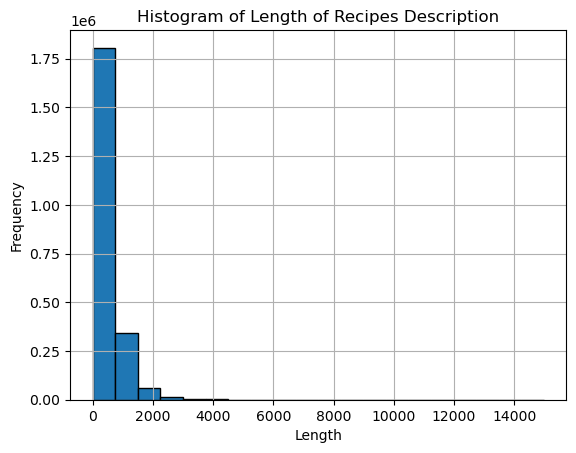

In [11]:
plt.hist(df['directions_len'], bins=20, edgecolor='black')
plt.title('Histogram of Length of Recipes Description')
plt.xlabel('Length')
plt.ylabel('Frequency')
plt.grid(True)
plt.show()

In [12]:
df['directions_len'].describe()

count    2.231142e+06
mean     5.051099e+02
std      4.524093e+02
min      5.000000e+00
25%      2.210000e+02
50%      3.710000e+02
75%      6.410000e+02
max      1.497900e+04
Name: directions_len, dtype: float64

In [13]:
quantile25 = df['directions_len'].quantile(0.25)

In [14]:
quanitle75 = df['directions_len'].quantile(0.75)

Filtering those rows that do not fall in the interquartiles, because of extremes lengths: too short and too long.

In [15]:
df_wip = df[(df["directions_len"] >= quantile25) & (df["directions_len"] <= quanitle75)]

In [16]:
df_wip.shape

(1117785, 10)

## Remove redundant titles

We removed rows with identitcal titles

In [18]:
df_wip['title_lower'] = df_wip['title'].str.lower().str.strip()

df_wip_clean = df_wip.loc[df_wip.groupby('title_lower')['directions_len'].idxmax()].reset_index(drop=True)

C:\Users\Lenovo\AppData\Local\Temp\ipykernel_11320\910858918.py:1: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_wip['title_lower'] = df_wip['title'].str.lower().str.strip()


In [19]:
df_wip_clean.shape

(658717, 11)

## Filtering on number of Ingredients
Remove all those recepites with more than 50 ingredients

In [20]:
df_wip_clean["NER_len"].describe()

count    658717.000000
mean          8.144030
std           3.338155
min           0.000000
25%           6.000000
50%           8.000000
75%          10.000000
max         402.000000
Name: NER_len, dtype: float64

In [21]:
df_wip = df_wip_clean[df_wip_clean["NER_len"] <= 50]

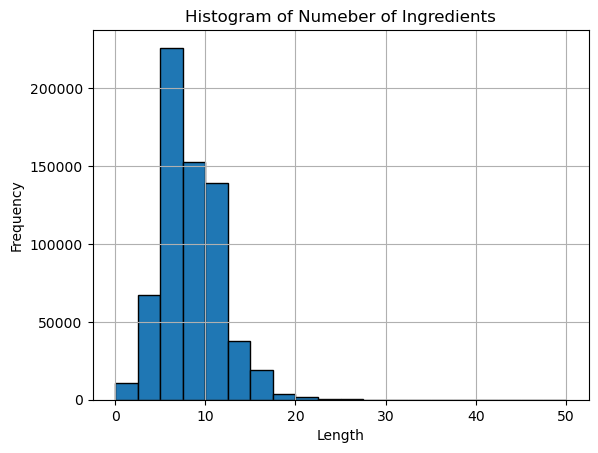

In [22]:
plt.hist(df_wip['NER_len'], bins=20, edgecolor='black')
plt.title('Histogram of Numeber of Ingredients')
plt.xlabel('Length')
plt.ylabel('Frequency')
plt.grid(True)
plt.show()

## Get redudandant receipes out

Remove those recepites that contains a same ingredient twice or more.

In [23]:
df_wip = df_wip[
    df_wip.apply(lambda row: row["NER_len"] == len(set(row["NER_list"])), axis=1)
]

In [24]:
df_wip.shape

(593478, 11)

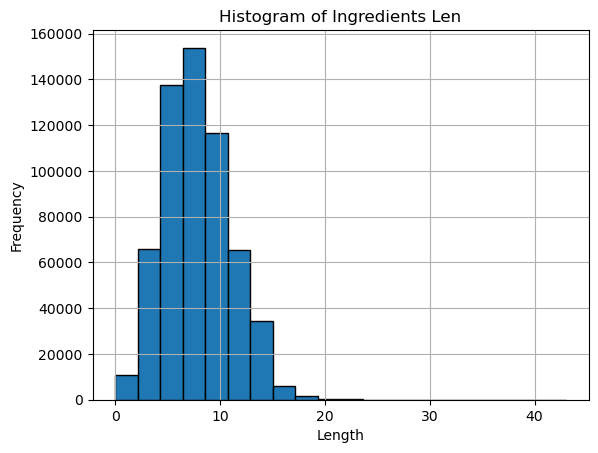

In [25]:
plt.hist(df_wip['NER_len'], bins=20, edgecolor='black')
plt.title('Histogram of Ingredients Len')
plt.xlabel('Length')
plt.ylabel('Frequency')
plt.grid(True)
plt.show()

## Recipes Name

Removing recipes' titles that contains `?,!,*,...,#`

In [26]:
# Create a regex pattern to match any of the unwanted characters: ?, !, *, #, or "..."
pattern = r'[\?\!\*#]|\.{3}'

# Filter out rows where the title contains any of the unwanted characters
df_wip = df_wip[~df_wip["title_lower"].str.contains(pattern, regex=True, na=False)].copy()

In [27]:
df_wip.head()

,Unnamed: 0,title,ingredients,directions,link,source,NER,NER_list,NER_len,directions_len,title_lower
1,1086314,""" All In"" Meatless Mincemeat","[""3 large apples, diced"", ""1 1/2 cups finely s...","[""Combine all ingredients except the rum, amar...",www.food.com/recipe/all-in-meatless-mincemeat-...,Gathered,"[""apples"", ""carrots"", ""tomatoes"", ""orange"", ""l...","[apples, carrots, tomatoes, orange, lemon, fre...",25,340,""" all in"" meatless mincemeat"
2,1665962,""" Almost Grilled"" Cheese Sandwich","[""2 slices white bread or 2 slices whole wheat...","[""Toast the bread slices."", ""Spread one side o...",www.food.com/recipe/almost-grilled-cheese-sand...,Recipes1M,"[""white bread"", ""cheese"", ""butter""]","[white bread, cheese, butter]",3,255,""" almost grilled"" cheese sandwich"
3,2110638,""" Angel Lush Trifle ""","[""3 1/2 oz instant vanilla pudding"", ""2 oz can...","[""Mix dry pudding with can of pineapple - do n...",cookpad.com/us/recipes/365937-angel-lush-trifle,Recipes1M,"[""vanilla pudding"", ""pineapple"", ""cool whip"", ...","[vanilla pudding, pineapple, cool whip, strawb...",5,282,""" angel lush trifle """
4,1660668,""" Baked Chimichurri Chicken ""","[""1 pkt shake ' n bake ckicken coating"", ""1/4 ...","[""Heat oven to 400 ."", ""Cover baking sheet wit...",cookpad.com/us/recipes/365698-baked-chimichurr...,Recipes1M,"[""ckicken coating"", ""fresh cilantro"", ""fresh c...","[ckicken coating, fresh cilantro, fresh choppe...",6,260,""" baked chimichurri chicken """
5,1787698,""" Baked Pretzels ""","[""2 bags broken pretzels ( 15 oz. each )"", ""1 ...","[""Preheat oven to 225 ."", ""Pour your pretzels ...",cookpad.com/us/recipes/347077-baked-pretzels,Recipes1M,"[""pretzels"", ""vegetable oil"", ""onion"", ""garlic...","[pretzels, vegetable oil, onion, garlic, lemon...",7,524,""" baked pretzels """


Dropping indexes

In [28]:
df_wip.drop(columns=[ "Unnamed: 0"], inplace = True)

df_wip.reset_index(drop=True,inplace=True)

## Finding the nearest neighborhood recepites
We are trying to find very similar titles, which might indicate that they are the same, or very similar recipe.

We are using `NearestNeighbors` to find the close 10 neighborhoods with `cosine similarity` and `TfidfVectorizer`.

In [30]:
titles = df_wip["title_lower"].astype(str)

# TF-IDF
vectorizer = TfidfVectorizer()
tfidf_matrix = vectorizer.fit_transform(titles)

# Finding top-10 neighbors per title
k_neighbors = 10
nn = NearestNeighbors(n_neighbors=k_neighbors+1, metric='cosine', algorithm='brute')
nn.fit(tfidf_matrix)
distances, indices = nn.kneighbors(tfidf_matrix)

neighbors_info = {"indices": indices, "distances": distances}

## Union-Find filtering

This use the `Union-Find` structure to handle disjoint-set:

- *Preprocessing:* Extract precomputed cosine distance data for recipe neighbors.
- *Threshold Setup:* Define a cosine distance threshold (0.2) to identify similar recipes.
- *Union-Find Initialization:*
  - Each recipe starts in its own set.
  - Custom find and union functions manage set operations with path compression.
- *Clustering:*
  - Iterate over recipe neighbors (skipping self-comparison).
  - Merge recipes into clusters if their cosine distance is below the threshold.
- *Representative Selection:* For each cluster, choose one recipe (with the smallest index) as its representative.
- *Data Reduction:* Filter the original dataset to retain only the selected recipes and save the result.

(useful information on the fucitoning of this structure can be found here: https://youtu.be/ayW5B2W9hfo?si=EthspH-GZxzO0qFv)

In [31]:
indices_arr = neighbors_info["indices"]
distances_arr = neighbors_info["distances"]

num_recipes = indices_arr.shape[0]

# cosine distance threshold
threshold = 0.2

# Initialize union-find data structures
parent = np.arange(num_recipes)

def find(x):
    while parent[x] != x:
        parent[x] = parent[parent[x]]
        x = parent[x]
    return x

def union(x, y):
    rootX = find(x)
    rootY = find(y)
    if rootX != rootY:
        parent[rootY] = rootX

# Iterate over each neighbors recipe i
for i in range(num_recipes):
    for j, d in zip(indices_arr[i][1:], distances_arr[i][1:]):
        if d < threshold:
            union(i, j)

# Extracting the representative element
clusters = {}
for i in range(num_recipes):
    rep = find(i)
    if rep in clusters:
        clusters[rep].append(i)
    else:
        clusters[rep] = [i]

selected_indices = [min(cluster) for cluster in clusters.values()]

df_reduced = df_wip.iloc[selected_indices].reset_index(drop=True)

In [32]:
df_reduced.head(2)

,title,ingredients,directions,link,source,NER,NER_list,NER_len,directions_len,title_lower
0,""" All In"" Meatless Mincemeat","[""3 large apples, diced"", ""1 1/2 cups finely s...","[""Combine all ingredients except the rum, amar...",www.food.com/recipe/all-in-meatless-mincemeat-...,Gathered,"[""apples"", ""carrots"", ""tomatoes"", ""orange"", ""l...","[apples, carrots, tomatoes, orange, lemon, fre...",25,340,""" all in"" meatless mincemeat"
1,""" Almost Grilled"" Cheese Sandwich","[""2 slices white bread or 2 slices whole wheat...","[""Toast the bread slices."", ""Spread one side o...",www.food.com/recipe/almost-grilled-cheese-sand...,Recipes1M,"[""white bread"", ""cheese"", ""butter""]","[white bread, cheese, butter]",3,255,""" almost grilled"" cheese sandwich"


In [33]:
df_reduced.to_csv('../datasets/reduced_dataset.csv')

In [ ]:
# Assuming df_reduced contains the 298k recipes after deduplication
# Set a random seed for reproducibility
df_final = df_reduced.sample(n=25_000, random_state=42).reset_index(drop=True)

joblib.dump(df_final, "final_recipes_dataset.pkl")
df_final.shape[0]

Final reduced dataset saved with 25000 recipes.


Lowering the food and allergy descriptions

In [ ]:
df_alle["Food"] = df_alle["Food"].apply(lambda x: x.lower())
df_alle["Allergy"] = df_alle["Allergy"].apply(lambda x: x.lower())

## Explanation

This code identifies potential allergens in recipes by processing allergen data and matching it against recipe ingredients. It uses spaCy for NLP and rapidfuzz for fuzzy string matching.

1. **NLP Configuration**
   - **Model Loading & Max Length:**
     ```python
     nlp = spacy.load('en_core_web_sm')
     nlp.max_length = 2000000  # Increase max length to 2 million characters
     ```
   - This allows processing of very long texts without encountering errors.

2. **Preprocessing Allergy Data**
   - **Normalization:** Each food entry (from the Food column) is converted to lowercase, stripped, tokenized (removing punctuation and spaces), and lemmatized.
   - The need to extract the 'Food' column as a list instead of just a string is because some foods are composite words (e.g., 'White beans')
   - We take `set(tokens)` to avoid double words in food column rows
   - **Output:** Adds two columns: norm_food (joined tokens) and food_tokens (list of tokens).

3. **Building an Inverted Index**
   - **Index Creation:** For each allergen, unique tokens are stored in an inverted index mapping each token to the row indexes where it appears in the `allergies.csv`
   - With `inverted_index.setdefault(token, set()).add(idx)` we are creating an inverted_index where we are mapping each food that might cause an allergy to the respective index of that allergy, or row in the dataset `allergy.csv`
   - `inverted_index_serializable = {k: list(v) for k, v in inverted_index.items()}` is just converting the elements of the previous inverted_index into lists.

4. **Processing Recipes**
   - **Chunking:** Recipes are processed in batches (e.g., 1000 at a time) to manage memory efficiently.
   - **Ingredient Preprocessing:** Ingredients are normalized and cached to avoid duplicate NLP processing.
   - **Candidate Selection:** For each ingredient, its tokens (unique set) are used to gather candidate allergen indices from the inverted index.
   - `candidate_indices = set()` for token in set(ing_tokens): if token in inv_index: candidate_indices.update(inv_index[token])` - For each ingredient in each recipe, this selects a set of candidates, which are the indexes that match in the inverted_index, so that we can identify possible allergies associated with that food.

5. **Matching with Heuristics and Fuzzy Logic**
   - **Multi-token Check:** If an allergen consists of multiple tokens, all must appear in the ingredient.
   - **Short Ingredient Heuristic:**
     ```python
     if len(norm_ing) < 4 and len(allergen_norm) > len(norm_ing) * 1.5:
         continue
     ```
   - Skips matching if the ingredient is very short compared to the allergen text to avoid false positives.
   - **Fuzzy Matching:**
     ```python
     score = fuzz.token_set_ratio(norm_ing, allergen_norm)
     if score >= 85:  # Record match
     ```
   - Method: Fuzzy matching (token set ratio) compares sets of tokens regardless of order, allowing tolerance for minor differences.

6. **Output and Storage**
   - **Results Collection:** Each recipe gets an allergy_dict mapping allergens to matching ingredient texts.
   - **Saving Data:** The final enriched DataFrame is saved using joblib.dump.


## Code

In [ ]:
# Load spaCy model
nlp = spacy.load('en_core_web_sm')
nlp.max_length = 2000000  # Increase max length to 2 millions characters
#############################################
# 1. Preprocess Allergy DataFrame (df_alle) first and completely
#############################################
def preprocess_allergens(df_alle):
    # Process allergen foods in df_alle
    allergen_texts = df_alle['Food'].astype(str).tolist()

    # Process one by one to avoid parallelism issues with progress bar
    norm_allergens = []
    tokens_allergens = []

    for text in tqdm(allergen_texts, desc="Processing allergens"):
        doc = nlp(text.lower().strip())
        # Force lowercasing after lemmatization to ensure uniformity.
        tokens = [token.lemma_.lower() for token in doc if not token.is_punct and not token.is_space]
        norm_text = " ".join(tokens)
        norm_allergens.append(norm_text)
        tokens_allergens.append(tokens)

    df_alle_processed = df_alle.copy()
    df_alle_processed['norm_food'] = norm_allergens
    df_alle_processed['food_tokens'] = tokens_allergens

    return df_alle_processed

# Process allergens first, completely
df_alle_processed = preprocess_allergens(df_alle)

#############################################
# 2. Build an Inverted Index for Allergens
#############################################
inverted_index = {}
for idx, tokens in tqdm(enumerate(df_alle_processed['food_tokens']), total=len(df_alle_processed), desc="Building index"):
    for token in set(tokens):
        inverted_index.setdefault(token, set()).add(idx)

# Convert to a serializable format for sharing across processes
inverted_index_serializable = {k: list(v) for k, v in inverted_index.items()}

#############################################
# 3. Process recipes in batches to avoid memory issues
#############################################
def process_chunk(chunk_df, allergen_df, inv_index, chunk_id):

    # Convert the inverted index back to sets
    inv_index = {k: set(v) for k, v in inv_index.items()}

    # Initialize SpaCy in this process
    local_nlp = spacy.load('en_core_web_sm')

    # Process all ingredients in the chunk at once
    all_ingredients = []
    for ing_list in chunk_df['NER_list']:
        all_ingredients.extend(ing_list)

    # Remove duplicates to avoid redundant processing
    unique_ingredients = list(set(all_ingredients))

    # Process all unique ingredients and build a cache
    ingredient_cache = {}
    for ingredient in tqdm(unique_ingredients, desc=f"Chunk {chunk_id}: Processing ingredients", leave=False):
        doc = local_nlp(ingredient.lower().strip())
        tokens = [token.lemma_.lower() for token in doc if not token.is_punct and not token.is_space]
        norm_text = " ".join(tokens)
        ingredient_cache[ingredient] = (norm_text, tokens)

    # Process each recipe
    results = []
    match_count = 0
    for idx, row in tqdm(chunk_df.iterrows(), total=len(chunk_df), desc=f"Chunk {chunk_id}: Matching recipes", leave=False):
        recipe_allergy_dict = {}

        for ingredient in row['NER_list']:
            norm_ing, ing_tokens = ingredient_cache[ingredient]

            # Collect candidate allergen indices using the inverted index
            candidate_indices = set()
            for token in set(ing_tokens):
                if token in inv_index:
                    candidate_indices.update(inv_index[token])

            # Validate candidates with fuzzy matching and with the multi-token heuristic:
            for cand_idx in candidate_indices:
                allergen_norm = allergen_df.loc[cand_idx, 'norm_food']
                allergy_label = allergen_df.loc[cand_idx, 'Allergy']

                # Split the candidate allergen into tokens
                allergen_tokens = allergen_norm.split()
                # If the candidate allergen consists of more than one token (e.g., "egg plant"),
                # require that all tokens appear in the ingredient's tokens.
                if len(allergen_tokens) > 1:
                    if not all(token in ing_tokens for token in allergen_tokens):
                        continue

                # Optional heuristic: if the ingredient is very short relative to the candidate, skip to avoid false matches.
                if len(norm_ing) < 4 and len(allergen_norm) > len(norm_ing) * 1.5:
                    continue

                score = fuzz.token_set_ratio(norm_ing, allergen_norm)
                if score >= 85:
                    if allergy_label not in recipe_allergy_dict:
                        recipe_allergy_dict[allergy_label] = []
                    recipe_allergy_dict[allergy_label].append(norm_ing)
                    match_count += 1

        results.append(recipe_allergy_dict)
    return results

# Process recipes in chunks of 1000 recipes
chunk_size = 1000
results = []
total_chunks = (len(df_final) + chunk_size - 1) // chunk_size
print(f"[{datetime.datetime.now()}] Processing {len(df_final)} recipes in {total_chunks} chunks of size {chunk_size}...")


for chunk_idx, chunk_start in enumerate(range(0, len(df_final), chunk_size)):
    chunk_end = min(chunk_start + chunk_size, len(df_final))
    chunk = df_final.iloc[chunk_start:chunk_end].copy()

    # Process this chunk
    chunk_results = process_chunk(chunk, df_alle_processed, inverted_index_serializable, chunk_idx+1)
    results.extend(chunk_results)

df_final['allergy_dict'] = results

# Save the result
joblib.dump(df_final, "DATASET/df_final_allergy_enriched.pkl")

[2025-04-10 22:23:24.823224] Starting allergen matching process...
[2025-04-10 22:23:24.823778] Loading spaCy model...
[2025-04-10 22:23:25.424825] SpaCy model loaded successfully.
[2025-04-10 22:23:25.425475] Starting allergen dataframe processing...
[2025-04-10 22:23:25.425529] Starting allergen preprocessing for 162 items...


Processing allergens: 100%|██████████| 162/162 [00:01<00:00, 151.12it/s]


[2025-04-10 22:23:26.503997] Allergen preprocessing completed in 1.08 seconds.
[2025-04-10 22:23:26.504269] Allergen dataframe processing completed.
[2025-04-10 22:23:26.504335] Building inverted index...


Building index: 100%|██████████| 162/162 [00:00<00:00, 261136.53it/s]


[2025-04-10 22:23:26.510969] Inverted index built in 0.01 seconds. Contains 172 unique tokens.
[2025-04-10 22:23:26.512234] Processing 25000 recipes in 25 chunks of size 1000...
[2025-04-10 22:23:26.517228] Processing chunk 1/25 (rows 0 to 999)...
[2025-04-10 22:23:26.517295] Starting processing chunk 1 with 1000 recipes...
[2025-04-10 22:23:27.301869] Chunk 1: Found 1686 unique ingredients out of 7857 total.


[2025-04-10 22:23:36.338384] Chunk 1 completed in 9.82 seconds. Found 3797 allergen matches.
[2025-04-10 22:23:36.342250] Overall progress: 4.0% complete
[2025-04-10 22:23:36.342288] Time elapsed: 0.2 minutes
[2025-04-10 22:23:36.342295] Estimated time remaining: 3.9 minutes
[2025-04-10 22:23:36.342300] Estimated total time: 4.1 minutes
--------------------------------------------------------------------------------
[2025-04-10 22:23:36.345031] Processing chunk 2/25 (rows 1000 to 1999)...
[2025-04-10 22:23:36.345066] Starting processing chunk 2 with 1000 recipes...
[2025-04-10 22:23:36.969792] Chunk 2: Found 1710 unique ingredients out of 7632 total.


[2025-04-10 22:23:46.829886] Chunk 2 completed in 10.48 seconds. Found 3746 allergen matches.
[2025-04-10 22:23:46.834250] Overall progress: 8.0% complete
[2025-04-10 22:23:46.834296] Time elapsed: 0.3 minutes
[2025-04-10 22:23:46.834303] Estimated time remaining: 3.9 minutes
[2025-04-10 22:23:46.834308] Estimated total time: 4.2 minutes
--------------------------------------------------------------------------------
[2025-04-10 22:23:46.840563] Processing chunk 3/25 (rows 2000 to 2999)...
[2025-04-10 22:23:46.840627] Starting processing chunk 3 with 1000 recipes...
[2025-04-10 22:23:47.592833] Chunk 3: Found 1692 unique ingredients out of 7579 total.


[2025-04-10 22:23:57.429784] Chunk 3 completed in 10.59 seconds. Found 3600 allergen matches.
[2025-04-10 22:23:57.430075] Overall progress: 12.0% complete
[2025-04-10 22:23:57.430112] Time elapsed: 0.5 minutes
[2025-04-10 22:23:57.430120] Estimated time remaining: 3.8 minutes
[2025-04-10 22:23:57.430126] Estimated total time: 4.3 minutes
--------------------------------------------------------------------------------
[2025-04-10 22:23:57.432992] Processing chunk 4/25 (rows 3000 to 3999)...
[2025-04-10 22:23:57.433027] Starting processing chunk 4 with 1000 recipes...
[2025-04-10 22:23:57.993096] Chunk 4: Found 1732 unique ingredients out of 7626 total.


[2025-04-10 22:24:06.782564] Chunk 4 completed in 9.35 seconds. Found 3612 allergen matches.
[2025-04-10 22:24:06.786058] Overall progress: 16.0% complete
[2025-04-10 22:24:06.786096] Time elapsed: 0.7 minutes
[2025-04-10 22:24:06.786103] Estimated time remaining: 3.5 minutes
[2025-04-10 22:24:06.786108] Estimated total time: 4.2 minutes
--------------------------------------------------------------------------------
[2025-04-10 22:24:06.789532] Processing chunk 5/25 (rows 4000 to 4999)...
[2025-04-10 22:24:06.789564] Starting processing chunk 5 with 1000 recipes...
[2025-04-10 22:24:07.306517] Chunk 5: Found 1729 unique ingredients out of 7628 total.


[2025-04-10 22:24:17.317186] Chunk 5 completed in 10.53 seconds. Found 3710 allergen matches.
[2025-04-10 22:24:17.321722] Overall progress: 20.0% complete
[2025-04-10 22:24:17.321792] Time elapsed: 0.8 minutes
[2025-04-10 22:24:17.321799] Estimated time remaining: 3.4 minutes
[2025-04-10 22:24:17.321804] Estimated total time: 4.2 minutes
--------------------------------------------------------------------------------
[2025-04-10 22:24:17.326466] Processing chunk 6/25 (rows 5000 to 5999)...
[2025-04-10 22:24:17.326512] Starting processing chunk 6 with 1000 recipes...
[2025-04-10 22:24:17.878185] Chunk 6: Found 1716 unique ingredients out of 7740 total.


[2025-04-10 22:24:27.348382] Chunk 6 completed in 10.02 seconds. Found 3619 allergen matches.
[2025-04-10 22:24:27.352646] Overall progress: 24.0% complete
[2025-04-10 22:24:27.352697] Time elapsed: 1.0 minutes
[2025-04-10 22:24:27.352705] Estimated time remaining: 3.2 minutes
[2025-04-10 22:24:27.352711] Estimated total time: 4.2 minutes
--------------------------------------------------------------------------------
[2025-04-10 22:24:27.355843] Processing chunk 7/25 (rows 6000 to 6999)...
[2025-04-10 22:24:27.355885] Starting processing chunk 7 with 1000 recipes...
[2025-04-10 22:24:27.971646] Chunk 7: Found 1722 unique ingredients out of 7685 total.


[2025-04-10 22:24:37.383428] Chunk 7 completed in 10.03 seconds. Found 3718 allergen matches.
[2025-04-10 22:24:37.387703] Overall progress: 28.0% complete
[2025-04-10 22:24:37.387754] Time elapsed: 1.2 minutes
[2025-04-10 22:24:37.387762] Estimated time remaining: 3.0 minutes
[2025-04-10 22:24:37.387767] Estimated total time: 4.2 minutes
--------------------------------------------------------------------------------
[2025-04-10 22:24:37.390892] Processing chunk 8/25 (rows 7000 to 7999)...
[2025-04-10 22:24:37.390959] Starting processing chunk 8 with 1000 recipes...
[2025-04-10 22:24:37.911637] Chunk 8: Found 1731 unique ingredients out of 7737 total.


[2025-04-10 22:24:47.024693] Chunk 8 completed in 9.63 seconds. Found 3716 allergen matches.
[2025-04-10 22:24:47.028829] Overall progress: 32.0% complete
[2025-04-10 22:24:47.028886] Time elapsed: 1.3 minutes
[2025-04-10 22:24:47.028895] Estimated time remaining: 2.9 minutes
[2025-04-10 22:24:47.028933] Estimated total time: 4.2 minutes
--------------------------------------------------------------------------------
[2025-04-10 22:24:47.032880] Processing chunk 9/25 (rows 8000 to 8999)...
[2025-04-10 22:24:47.032956] Starting processing chunk 9 with 1000 recipes...
[2025-04-10 22:24:47.615435] Chunk 9: Found 1650 unique ingredients out of 7620 total.


[2025-04-10 22:24:56.312167] Chunk 9 completed in 9.28 seconds. Found 3681 allergen matches.
[2025-04-10 22:24:56.315750] Overall progress: 36.0% complete
[2025-04-10 22:24:56.315792] Time elapsed: 1.5 minutes
[2025-04-10 22:24:56.315800] Estimated time remaining: 2.7 minutes
[2025-04-10 22:24:56.315806] Estimated total time: 4.2 minutes
--------------------------------------------------------------------------------
[2025-04-10 22:24:56.318568] Processing chunk 10/25 (rows 9000 to 9999)...
[2025-04-10 22:24:56.318602] Starting processing chunk 10 with 1000 recipes...
[2025-04-10 22:24:56.824209] Chunk 10: Found 1670 unique ingredients out of 7728 total.


[2025-04-10 22:25:07.521811] Chunk 10 completed in 11.20 seconds. Found 3697 allergen matches.
[2025-04-10 22:25:07.526856] Overall progress: 40.0% complete
[2025-04-10 22:25:07.526984] Time elapsed: 1.7 minutes
[2025-04-10 22:25:07.526994] Estimated time remaining: 2.5 minutes
[2025-04-10 22:25:07.527000] Estimated total time: 4.2 minutes
--------------------------------------------------------------------------------
[2025-04-10 22:25:07.530686] Processing chunk 11/25 (rows 10000 to 10999)...
[2025-04-10 22:25:07.530737] Starting processing chunk 11 with 1000 recipes...
[2025-04-10 22:25:08.094674] Chunk 11: Found 1693 unique ingredients out of 7703 total.


[2025-04-10 22:25:17.261572] Chunk 11 completed in 9.73 seconds. Found 3671 allergen matches.
[2025-04-10 22:25:17.265493] Overall progress: 44.0% complete
[2025-04-10 22:25:17.265534] Time elapsed: 1.8 minutes
[2025-04-10 22:25:17.265541] Estimated time remaining: 2.3 minutes
[2025-04-10 22:25:17.265547] Estimated total time: 4.2 minutes
--------------------------------------------------------------------------------
[2025-04-10 22:25:17.268645] Processing chunk 12/25 (rows 11000 to 11999)...
[2025-04-10 22:25:17.268683] Starting processing chunk 12 with 1000 recipes...
[2025-04-10 22:25:17.800689] Chunk 12: Found 1742 unique ingredients out of 7774 total.


[2025-04-10 22:25:27.667078] Chunk 12 completed in 10.40 seconds. Found 3667 allergen matches.
[2025-04-10 22:25:27.671249] Overall progress: 48.0% complete
[2025-04-10 22:25:27.671299] Time elapsed: 2.0 minutes
[2025-04-10 22:25:27.671306] Estimated time remaining: 2.2 minutes
[2025-04-10 22:25:27.671313] Estimated total time: 4.2 minutes
--------------------------------------------------------------------------------
[2025-04-10 22:25:27.675740] Processing chunk 13/25 (rows 12000 to 12999)...
[2025-04-10 22:25:27.675795] Starting processing chunk 13 with 1000 recipes...
[2025-04-10 22:25:28.321162] Chunk 13: Found 1682 unique ingredients out of 7584 total.


[2025-04-10 22:25:37.667373] Chunk 13 completed in 9.99 seconds. Found 3607 allergen matches.
[2025-04-10 22:25:37.671222] Overall progress: 52.0% complete
[2025-04-10 22:25:37.671265] Time elapsed: 2.2 minutes
[2025-04-10 22:25:37.671272] Estimated time remaining: 2.0 minutes
[2025-04-10 22:25:37.671278] Estimated total time: 4.2 minutes
--------------------------------------------------------------------------------
[2025-04-10 22:25:37.674141] Processing chunk 14/25 (rows 13000 to 13999)...
[2025-04-10 22:25:37.674179] Starting processing chunk 14 with 1000 recipes...
[2025-04-10 22:25:38.230549] Chunk 14: Found 1727 unique ingredients out of 7729 total.


[2025-04-10 22:25:48.081729] Chunk 14 completed in 10.41 seconds. Found 3639 allergen matches.
[2025-04-10 22:25:48.081815] Overall progress: 56.0% complete
[2025-04-10 22:25:48.081823] Time elapsed: 2.4 minutes
[2025-04-10 22:25:48.081829] Estimated time remaining: 1.9 minutes
[2025-04-10 22:25:48.081833] Estimated total time: 4.2 minutes
--------------------------------------------------------------------------------
[2025-04-10 22:25:48.084461] Processing chunk 15/25 (rows 14000 to 14999)...
[2025-04-10 22:25:48.084495] Starting processing chunk 15 with 1000 recipes...
[2025-04-10 22:25:48.607150] Chunk 15: Found 1780 unique ingredients out of 7728 total.


[2025-04-10 22:25:57.300752] Chunk 15 completed in 9.22 seconds. Found 3578 allergen matches.
[2025-04-10 22:25:57.304650] Overall progress: 60.0% complete
[2025-04-10 22:25:57.304694] Time elapsed: 2.5 minutes
[2025-04-10 22:25:57.304701] Estimated time remaining: 1.7 minutes
[2025-04-10 22:25:57.304708] Estimated total time: 4.2 minutes
--------------------------------------------------------------------------------
[2025-04-10 22:25:57.307735] Processing chunk 16/25 (rows 15000 to 15999)...
[2025-04-10 22:25:57.307769] Starting processing chunk 16 with 1000 recipes...
[2025-04-10 22:25:57.921866] Chunk 16: Found 1698 unique ingredients out of 7684 total.


[2025-04-10 22:26:07.734944] Chunk 16 completed in 10.43 seconds. Found 3720 allergen matches.
[2025-04-10 22:26:07.738741] Overall progress: 64.0% complete
[2025-04-10 22:26:07.738780] Time elapsed: 2.7 minutes
[2025-04-10 22:26:07.738788] Estimated time remaining: 1.5 minutes
[2025-04-10 22:26:07.738792] Estimated total time: 4.2 minutes
--------------------------------------------------------------------------------
[2025-04-10 22:26:07.741605] Processing chunk 17/25 (rows 16000 to 16999)...
[2025-04-10 22:26:07.741638] Starting processing chunk 17 with 1000 recipes...
[2025-04-10 22:26:08.290661] Chunk 17: Found 1662 unique ingredients out of 7730 total.


[2025-04-10 22:26:17.749783] Chunk 17 completed in 10.01 seconds. Found 3810 allergen matches.
[2025-04-10 22:26:17.754644] Overall progress: 68.0% complete
[2025-04-10 22:26:17.754718] Time elapsed: 2.9 minutes
[2025-04-10 22:26:17.754735] Estimated time remaining: 1.3 minutes
[2025-04-10 22:26:17.754741] Estimated total time: 4.2 minutes
--------------------------------------------------------------------------------
[2025-04-10 22:26:17.759002] Processing chunk 18/25 (rows 17000 to 17999)...
[2025-04-10 22:26:17.759053] Starting processing chunk 18 with 1000 recipes...
[2025-04-10 22:26:18.348057] Chunk 18: Found 1711 unique ingredients out of 7827 total.


[2025-04-10 22:26:28.087382] Chunk 18 completed in 10.33 seconds. Found 3767 allergen matches.
[2025-04-10 22:26:28.092998] Overall progress: 72.0% complete
[2025-04-10 22:26:28.093066] Time elapsed: 3.0 minutes
[2025-04-10 22:26:28.093074] Estimated time remaining: 1.2 minutes
[2025-04-10 22:26:28.093081] Estimated total time: 4.2 minutes
--------------------------------------------------------------------------------
[2025-04-10 22:26:28.096690] Processing chunk 19/25 (rows 18000 to 18999)...
[2025-04-10 22:26:28.096739] Starting processing chunk 19 with 1000 recipes...
[2025-04-10 22:26:28.741160] Chunk 19: Found 1747 unique ingredients out of 7685 total.


[2025-04-10 22:26:38.157412] Chunk 19 completed in 10.06 seconds. Found 3638 allergen matches.
[2025-04-10 22:26:38.162553] Overall progress: 76.0% complete
[2025-04-10 22:26:38.162611] Time elapsed: 3.2 minutes
[2025-04-10 22:26:38.162620] Estimated time remaining: 1.0 minutes
[2025-04-10 22:26:38.162628] Estimated total time: 4.2 minutes
--------------------------------------------------------------------------------
[2025-04-10 22:26:38.166466] Processing chunk 20/25 (rows 19000 to 19999)...
[2025-04-10 22:26:38.166512] Starting processing chunk 20 with 1000 recipes...
[2025-04-10 22:26:38.702645] Chunk 20: Found 1700 unique ingredients out of 7785 total.


[2025-04-10 22:26:48.084013] Chunk 20 completed in 9.92 seconds. Found 3753 allergen matches.
[2025-04-10 22:26:48.088487] Overall progress: 80.0% complete
[2025-04-10 22:26:48.088530] Time elapsed: 3.4 minutes
[2025-04-10 22:26:48.088537] Estimated time remaining: 0.8 minutes
[2025-04-10 22:26:48.088543] Estimated total time: 4.2 minutes
--------------------------------------------------------------------------------
[2025-04-10 22:26:48.091828] Processing chunk 21/25 (rows 20000 to 20999)...
[2025-04-10 22:26:48.091863] Starting processing chunk 21 with 1000 recipes...
[2025-04-10 22:26:48.624516] Chunk 21: Found 1738 unique ingredients out of 7895 total.


[2025-04-10 22:26:57.824491] Chunk 21 completed in 9.73 seconds. Found 3818 allergen matches.
[2025-04-10 22:26:57.829317] Overall progress: 84.0% complete
[2025-04-10 22:26:57.829375] Time elapsed: 3.5 minutes
[2025-04-10 22:26:57.829383] Estimated time remaining: 0.7 minutes
[2025-04-10 22:26:57.829390] Estimated total time: 4.2 minutes
--------------------------------------------------------------------------------
[2025-04-10 22:26:57.832613] Processing chunk 22/25 (rows 21000 to 21999)...
[2025-04-10 22:26:57.832656] Starting processing chunk 22 with 1000 recipes...
[2025-04-10 22:26:58.505732] Chunk 22: Found 1743 unique ingredients out of 7781 total.


[2025-04-10 22:27:07.380670] Chunk 22 completed in 9.55 seconds. Found 3762 allergen matches.
[2025-04-10 22:27:07.384880] Overall progress: 88.0% complete
[2025-04-10 22:27:07.384929] Time elapsed: 3.7 minutes
[2025-04-10 22:27:07.384936] Estimated time remaining: 0.5 minutes
[2025-04-10 22:27:07.384942] Estimated total time: 4.2 minutes
--------------------------------------------------------------------------------
[2025-04-10 22:27:07.387619] Processing chunk 23/25 (rows 22000 to 22999)...
[2025-04-10 22:27:07.387653] Starting processing chunk 23 with 1000 recipes...
[2025-04-10 22:27:07.997536] Chunk 23: Found 1684 unique ingredients out of 7744 total.


[2025-04-10 22:27:16.924998] Chunk 23 completed in 9.54 seconds. Found 3694 allergen matches.
[2025-04-10 22:27:16.929729] Overall progress: 92.0% complete
[2025-04-10 22:27:16.929814] Time elapsed: 3.8 minutes
[2025-04-10 22:27:16.929823] Estimated time remaining: 0.3 minutes
[2025-04-10 22:27:16.929829] Estimated total time: 4.2 minutes
--------------------------------------------------------------------------------
[2025-04-10 22:27:16.932738] Processing chunk 24/25 (rows 23000 to 23999)...
[2025-04-10 22:27:16.932790] Starting processing chunk 24 with 1000 recipes...
[2025-04-10 22:27:17.477077] Chunk 24: Found 1724 unique ingredients out of 7755 total.


[2025-04-10 22:27:27.353409] Chunk 24 completed in 10.42 seconds. Found 3683 allergen matches.
[2025-04-10 22:27:27.361799] Overall progress: 96.0% complete
[2025-04-10 22:27:27.362038] Time elapsed: 4.0 minutes
[2025-04-10 22:27:27.362073] Estimated time remaining: 0.2 minutes
[2025-04-10 22:27:27.362081] Estimated total time: 4.2 minutes
--------------------------------------------------------------------------------
[2025-04-10 22:27:27.367310] Processing chunk 25/25 (rows 24000 to 24999)...
[2025-04-10 22:27:27.367367] Starting processing chunk 25 with 1000 recipes...
[2025-04-10 22:27:28.007617] Chunk 25: Found 1723 unique ingredients out of 7711 total.


[2025-04-10 22:27:37.019403] Chunk 25 completed in 9.65 seconds. Found 3661 allergen matches.
[2025-04-10 22:27:37.024139] Overall progress: 100.0% complete
[2025-04-10 22:27:37.024205] Time elapsed: 4.2 minutes
[2025-04-10 22:27:37.024213] Estimated time remaining: 0.0 minutes
[2025-04-10 22:27:37.024219] Estimated total time: 4.2 minutes
--------------------------------------------------------------------------------
[2025-04-10 22:27:37.024533] Adding allergen results to dataframe...
[2025-04-10 22:27:37.034102] Saving results to CSV...
[2025-04-10 22:27:38.511329] Saving results to pickle...
[2025-04-10 22:27:39.975806] Processing completed in 4.3 minutes.
[2025-04-10 22:27:39.976114] Total allergen matches found: 92364
[2025-04-10 22:27:39.976190] Allergen distribution:
  - milk allergy / lactose intolerance: 22752 matches
  - allium allergy: 14100 matches
  - poultry allergy: 9589 matches
  - sugar allergy / intolerance: 8448 matches
  - citrus allergy: 5941 matches
  - hypersens

In [ ]:
df_alle[df_alle["Allergy"] == "hypersensitivity"]

,index,Class,Type,Group,Food,Allergy
24,26,Plant origin,Vegetable,Umbelliferous vegetable,carrot,hypersensitivity
28,30,Plant origin,Vegetable,Umbelliferous vegetable,celery,hypersensitivity
86,97,Plant origin,Vegetable,Umbelliferous vegetable,mitsuba,hypersensitivity
96,109,Plant origin,Vegetable,Umbelliferous vegetable,parsley,hypersensitivity
97,110,Plant origin,Vegetable,Umbelliferous vegetable,parsnip,hypersensitivity
115,130,Plant origin,Vegetable,Cruciferous vegetable,radish root,hypersensitivity


In [ ]:
recipe_llm=joblib.load("DATASET/df_final_allergy_enriched.pkl")

In [ ]:
!huggingface-cli login

# ------------------ Step 2: Define Memory Management Helpers ------------------ #
def clear_memory():
    """Force garbage collection and clear GPU cache."""
    gc.collect()
    if torch.cuda.is_available():
        torch.cuda.empty_cache()

def get_gpu_memory_usage():
    """Return GPU memory usage in GB."""
    if torch.cuda.is_available():
        return torch.cuda.memory_allocated() / 1e9
    return 0

# ------------------ Step 3: Set Up the Mistral Pipeline ------------------ #
print(f"[{datetime.datetime.now()}] Loading Mistral model via pipeline...")
pipe = pipeline(
    "text-generation",
    model="mistralai/Mistral-7B-Instruct-v0.2",
    torch_dtype=torch.float16,
    device_map="auto"
)
print(f"[{datetime.datetime.now()}] Model loaded successfully!")
print(f"Current GPU memory usage: {get_gpu_memory_usage():.2f} GB\n")

# ------------------ Step 4: Define the Cuisine Classification Function ------------------ #
def classify_cuisine_with_pipeline(recipe_data):
    """
    Get the model's complete reasoning about the recipe's cuisine.
    Just returns the full response for later processing.
    """
    recipe_name = recipe_data.get('title_lower', 'Unknown')

    # Handle ingredients list properly
    ingredients = recipe_data.get('NER_list', [])
    if isinstance(ingredients, str):
        try:
            ingredients = eval(ingredients)
        except:
            ingredients = [ingredients]

    # Include only the first 100 characters of directions
    directions = recipe_data.get('directions', '')
    directions_brief = directions[:100] + "..." if directions else ""

    # Improved prompt that encourages reasoning before answering
    prompt = f"""Determine the cuisine of the following recipe.

Recipe Name: {recipe_name}
Ingredients: {', '.join(ingredients) if isinstance(ingredients, list) else ingredients}
Instructions: {directions_brief}

Provide a brief explanation of which elements indicate a particular cuisine, then state the cuisine name. Keep the entire response under 100 tokens."""

    try:
        # Allow for more tokens so the model can explain its reasoning
        response = pipe(prompt, max_new_tokens=100, do_sample=False)
        full_text = response[0]['generated_text']

        # Extract only the model's response
        model_response = full_text[len(prompt):].strip()

        return model_response
    except Exception as e:
        print(f"Error processing recipe '{recipe_name}': {e}")
        return "Error: " + str(e)

# ------------------ Step 5: Batch Processing Function ------------------ #
def process_in_batches(df, batch_size=20, checkpoint_every=100):
    """
    Process in batches with improved tracking and error handling.
    Saves the full model responses rather than extracting cuisines.
    """
    # Create results directory if it doesn't exist
    os.makedirs("cuisine_results", exist_ok=True)

    # Check for existing checkpoints to resume from
    checkpoint_files = [f for f in os.listdir("cuisine_results") if f.startswith("cuisine_results_checkpoint_")]

    # Sort checkpoint files by number to find the most recent
    checkpoint_nums = []
    for file in checkpoint_files:
        match = re.search(r'checkpoint_(\d+)\.csv', file)
        if match:
            checkpoint_nums.append(int(match.group(1)))

    # Start from the most recent checkpoint if available
    results = []
    start_idx = 0

    if checkpoint_nums:
        last_checkpoint = max(checkpoint_nums)
        checkpoint_file = f"cuisine_results/cuisine_results_checkpoint_{last_checkpoint}.csv"

        print(f"[{datetime.datetime.now()}] Found checkpoint at {checkpoint_file}. Resuming from there.")
        temp_df = pd.read_csv(checkpoint_file)

        # Make sure the cuisine_response column exists
        if 'cuisine_response' in temp_df.columns:
            results = temp_df['cuisine_response'].tolist()
            start_idx = len(results)
            print(f"[{datetime.datetime.now()}] Loaded {start_idx} existing results. Continuing from recipe {start_idx+1}.")

    # Process remaining recipes
    start_time = time.time()
    total_recipes = len(df)
    remaining_recipes = total_recipes - start_idx

    if remaining_recipes <= 0:
        print(f"[{datetime.datetime.now()}] All recipes already processed. Nothing to do.")
        return results

    print(f"[{datetime.datetime.now()}] Starting cuisine classification for {remaining_recipes} remaining recipes...")

    # Calculate batches for remaining recipes
    total_batches = (remaining_recipes + batch_size - 1) // batch_size

    for batch_idx in range(total_batches):
        # Calculate indices for the current batch
        batch_start = start_idx + (batch_idx * batch_size)
        batch_end = min(start_idx + ((batch_idx + 1) * batch_size), total_recipes)

        print(f"\n[{datetime.datetime.now()}] Processing batch {batch_idx + 1}/{total_batches} (recipes {batch_start + 1}-{batch_end})")
        batch = df.iloc[batch_start:batch_end]

        batch_results = []
        for idx, row in tqdm(batch.iterrows(), total=len(batch), desc="Processing recipes", leave=False):
            response = classify_cuisine_with_pipeline(row)
            batch_results.append(response)

            # Clear memory after each recipe
            clear_memory()

        # Add batch results to overall results
        results.extend(batch_results)
        recipes_processed = start_idx + len(results)

        # Save checkpoint
        if recipes_processed % checkpoint_every == 0 or batch_idx == total_batches - 1:
            df_temp = df.iloc[:recipes_processed].copy()
            df_temp['cuisine_response'] = results
            checkpoint_file = f"cuisine_results/cuisine_results_checkpoint_{recipes_processed}.csv"
            df_temp.to_csv(checkpoint_file, index=False)
            print(f"[{datetime.datetime.now()}] Checkpoint saved: {checkpoint_file}")

        # Display progress statistics
        elapsed_time = time.time() - start_time
        recipes_per_second = (recipes_processed - start_idx) / elapsed_time if elapsed_time > 0 else 0

        # Calculate estimated time remaining
        if recipes_per_second > 0:
            remaining_count = total_recipes - recipes_processed
            estimated_remaining = remaining_count / recipes_per_second

            print(f"[{datetime.datetime.now()}] Progress: {recipes_processed}/{total_recipes} recipes ({recipes_processed/total_recipes*100:.1f}%)")
            print(f"Speed: {recipes_per_second*60:.1f} recipes/minute")
            print(f"Elapsed time: {elapsed_time/60:.1f} minutes")
            print(f"Estimated time remaining: {estimated_remaining/60:.1f} minutes")

        print(f"Current GPU memory usage: {get_gpu_memory_usage():.2f} GB")

        # Add cooldown period between batches
        if batch_idx < total_batches - 1:
            cooldown_time = 5  # 5 seconds
            print(f"[{datetime.datetime.now()}] Cooling down for {cooldown_time} seconds...")
            time.sleep(cooldown_time)
            clear_memory()

    return results

# ------------------ Step 6: Test the Classification ------------------ #
def test_classification():
    """Test the cuisine classification with full responses."""
    print(f"[{datetime.datetime.now()}] Testing cuisine classification...")

    test_recipes = [
        {
            'title_lower': 'spaghetti carbonara',
            'NER_list': ['spaghetti', 'eggs', 'pancetta', 'parmesan cheese', 'black pepper'],
            'directions': 'Cook pasta. Mix eggs and cheese. Cook pancetta. Combine all ingredients.'
        },
        {
            'title_lower': 'chicken tikka masala',
            'NER_list': ['chicken', 'yogurt', 'garam masala', 'tomato sauce', 'cream', 'coriander'],
            'directions': 'Marinate chicken in yogurt and spices. Grill chicken. Make sauce with tomatoes and cream.'
        }
    ]

    for i, recipe in enumerate(test_recipes):
        print(f"\nTest Recipe {i+1}: {recipe['title_lower']}")
        response = classify_cuisine_with_pipeline(recipe)
        print(f"Model response:\n{response}")

    print(f"[{datetime.datetime.now()}] Test completed.")

# ------------------ Step 7: Process the DataFrame ------------------ #
# Run test first
test_classification()

# Process the recipes
print(f"[{datetime.datetime.now()}] Starting cuisine classification on {len(recipe_llm)} recipes...")
cuisine_responses = process_in_batches(recipe_llm, batch_size=20, checkpoint_every=100)

# Append full responses to the dataframe and save final results
recipe_llm['cuisine_response'] = cuisine_responses
final_file = "recipes_with_cuisine_responses.csv"
recipe_llm.to_csv(final_file, index=False)
print(f"\n[{datetime.datetime.now()}] Classification complete! Full responses saved to '{final_file}'.")


    _|    _|  _|    _|    _|_|_|    _|_|_|  _|_|_|  _|      _|    _|_|_|      _|_|_|_|    _|_|      _|_|_|  _|_|_|_|
    _|    _|  _|    _|  _|        _|          _|    _|_|    _|  _|            _|        _|    _|  _|        _|
    _|_|_|_|  _|    _|  _|  _|_|  _|  _|_|    _|    _|  _|  _|  _|  _|_|      _|_|_|    _|_|_|_|  _|        _|_|_|
    _|    _|  _|    _|  _|    _|  _|    _|    _|    _|    _|_|  _|    _|      _|        _|    _|  _|        _|
    _|    _|    _|_|      _|_|_|    _|_|_|  _|_|_|  _|      _|    _|_|_|      _|        _|    _|    _|_|_|  _|_|_|_|

    To log in, `huggingface_hub` requires a token generated from https://huggingface.co/settings/tokens .
Enter your token (input will not be visible): 
Add token as git credential? (Y/n) n
Token is valid (permission: fineGrained).
The token `Colab Access` has been saved to /root/.cache/huggingface/stored_tokens
Your token has been saved to /root/.cache/huggingface/token
Login successful.
The current active token is: `Colab

/usr/local/lib/python3.11/dist-packages/huggingface_hub/utils/_auth.py:94: UserWarning: 
The secret `HF_TOKEN` does not exist in your Colab secrets.
To authenticate with the Hugging Face Hub, create a token in your settings tab (https://huggingface.co/settings/tokens), set it as secret in your Google Colab and restart your session.
You will be able to reuse this secret in all of your notebooks.
Please note that authentication is recommended but still optional to access public models or datasets.
  warnings.warn(


config.json:   0%|          | 0.00/596 [00:00<?, ?B/s]

model.safetensors.index.json:   0%|          | 0.00/25.1k [00:00<?, ?B/s]

Fetching 3 files:   0%|          | 0/3 [00:00<?, ?it/s]

model-00002-of-00003.safetensors:   0%|          | 0.00/5.00G [00:00<?, ?B/s]

model-00003-of-00003.safetensors:   0%|          | 0.00/4.54G [00:00<?, ?B/s]

model-00001-of-00003.safetensors:   0%|          | 0.00/4.94G [00:00<?, ?B/s]

Loading checkpoint shards:   0%|          | 0/3 [00:00<?, ?it/s]

generation_config.json:   0%|          | 0.00/111 [00:00<?, ?B/s]

tokenizer_config.json:   0%|          | 0.00/2.10k [00:00<?, ?B/s]

tokenizer.model:   0%|          | 0.00/493k [00:00<?, ?B/s]

tokenizer.json:   0%|          | 0.00/1.80M [00:00<?, ?B/s]

special_tokens_map.json:   0%|          | 0.00/414 [00:00<?, ?B/s]

Device set to use cuda:0
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.


[2025-04-11 08:16:35.598256] Model loaded successfully!
Current GPU memory usage: 14.48 GB

[2025-04-11 08:16:35.600022] Testing cuisine classification...

Test Recipe 1: spaghetti carbonara


Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.


Model response:
Italian cuisine: Pasta, Pancetta (Italian bacon), Parmesan cheese, and Black pepper are common Italian ingredients. The dish name, Carbonara, is of Italian origin.

Test Recipe 2: chicken tikka masala
Model response:
Indian cuisine: Chicken tikka masala features yogurt marinade, garam masala, and tomato sauce with cream. These elements are common in Indian cooking.
[2025-04-11 08:16:40.608937] Test completed.
[2025-04-11 08:16:40.609134] Starting cuisine classification on 25000 recipes...
[2025-04-11 08:16:40.609878] Starting cuisine classification for 25000 remaining recipes...

[2025-04-11 08:16:40.609918] Processing batch 1/1250 (recipes 1-20)


Processing recipes:   0%|          | 0/20 [00:00<?, ?it/s]

Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
You seem to be using the pipelines sequentially on GPU. In order to maximize efficiency please use a dataset
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting

[2025-04-11 08:17:33.718524] Progress: 20/25000 recipes (0.1%)
Speed: 22.6 recipes/minute
Elapsed time: 0.9 minutes
Estimated time remaining: 1105.5 minutes
Current GPU memory usage: 14.49 GB
[2025-04-11 08:17:33.718805] Cooling down for 5 seconds...

[2025-04-11 08:17:39.012956] Processing batch 2/1250 (recipes 21-40)


Processing recipes:   0%|          | 0/20 [00:00<?, ?it/s]

Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for o

[2025-04-11 08:18:29.689826] Progress: 40/25000 recipes (0.2%)
Speed: 22.0 recipes/minute
Elapsed time: 1.8 minutes
Estimated time remaining: 1134.4 minutes
Current GPU memory usage: 14.49 GB
[2025-04-11 08:18:29.690114] Cooling down for 5 seconds...

[2025-04-11 08:18:34.985055] Processing batch 3/1250 (recipes 41-60)


Processing recipes:   0%|          | 0/20 [00:00<?, ?it/s]

Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for o

[2025-04-11 08:19:30.710823] Progress: 60/25000 recipes (0.2%)
Speed: 21.2 recipes/minute
Elapsed time: 2.8 minutes
Estimated time remaining: 1178.4 minutes
Current GPU memory usage: 14.49 GB
[2025-04-11 08:19:30.711104] Cooling down for 5 seconds...

[2025-04-11 08:19:36.013168] Processing batch 4/1250 (recipes 61-80)


Processing recipes:   0%|          | 0/20 [00:00<?, ?it/s]

Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for o

[2025-04-11 08:20:32.714744] Progress: 80/25000 recipes (0.3%)
Speed: 20.7 recipes/minute
Elapsed time: 3.9 minutes
Estimated time remaining: 1205.0 minutes
Current GPU memory usage: 14.49 GB
[2025-04-11 08:20:32.715051] Cooling down for 5 seconds...

[2025-04-11 08:20:38.014509] Processing batch 5/1250 (recipes 81-100)


Processing recipes:   0%|          | 0/20 [00:00<?, ?it/s]

Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for o

[2025-04-11 08:21:24.952860] Checkpoint saved: cuisine_results/cuisine_results_checkpoint_100.csv
[2025-04-11 08:21:24.952926] Progress: 100/25000 recipes (0.4%)
Speed: 21.1 recipes/minute
Elapsed time: 4.7 minutes
Estimated time remaining: 1180.0 minutes
Current GPU memory usage: 14.49 GB
[2025-04-11 08:21:24.953179] Cooling down for 5 seconds...

[2025-04-11 08:21:30.259682] Processing batch 6/1250 (recipes 101-120)


Processing recipes:   0%|          | 0/20 [00:00<?, ?it/s]

Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for o

[2025-04-11 08:22:25.967871] Progress: 120/25000 recipes (0.5%)
Speed: 20.8 recipes/minute
Elapsed time: 5.8 minutes
Estimated time remaining: 1193.4 minutes
Current GPU memory usage: 14.49 GB
[2025-04-11 08:22:25.968173] Cooling down for 5 seconds...

[2025-04-11 08:22:31.282768] Processing batch 7/1250 (recipes 121-140)


Processing recipes:   0%|          | 0/20 [00:00<?, ?it/s]

Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for o

[2025-04-11 08:23:21.751777] Progress: 140/25000 recipes (0.6%)
Speed: 20.9 recipes/minute
Elapsed time: 6.7 minutes
Estimated time remaining: 1187.2 minutes
Current GPU memory usage: 14.49 GB
[2025-04-11 08:23:21.752077] Cooling down for 5 seconds...

[2025-04-11 08:23:27.051986] Processing batch 8/1250 (recipes 141-160)


Processing recipes:   0%|          | 0/20 [00:00<?, ?it/s]

Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for o

[2025-04-11 08:24:22.150259] Progress: 160/25000 recipes (0.6%)
Speed: 20.8 recipes/minute
Elapsed time: 7.7 minutes
Estimated time remaining: 1194.2 minutes
Current GPU memory usage: 14.49 GB
[2025-04-11 08:24:22.150539] Cooling down for 5 seconds...

[2025-04-11 08:24:27.451159] Processing batch 9/1250 (recipes 161-180)


Processing recipes:   0%|          | 0/20 [00:00<?, ?it/s]

Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for o

[2025-04-11 08:25:18.319130] Progress: 180/25000 recipes (0.7%)
Speed: 20.9 recipes/minute
Elapsed time: 8.6 minutes
Estimated time remaining: 1189.8 minutes
Current GPU memory usage: 14.49 GB
[2025-04-11 08:25:18.319388] Cooling down for 5 seconds...

[2025-04-11 08:25:23.615481] Processing batch 10/1250 (recipes 181-200)


Processing recipes:   0%|          | 0/20 [00:00<?, ?it/s]

Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for o

[2025-04-11 08:26:13.736378] Checkpoint saved: cuisine_results/cuisine_results_checkpoint_200.csv
[2025-04-11 08:26:13.736437] Progress: 200/25000 recipes (0.8%)
Speed: 20.9 recipes/minute
Elapsed time: 9.6 minutes
Estimated time remaining: 1184.5 minutes
Current GPU memory usage: 14.49 GB
[2025-04-11 08:26:13.736682] Cooling down for 5 seconds...

[2025-04-11 08:26:19.041283] Processing batch 11/1250 (recipes 201-220)


Processing recipes:   0%|          | 0/20 [00:00<?, ?it/s]

Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for o

[2025-04-11 08:27:10.370864] Progress: 220/25000 recipes (0.9%)
Speed: 21.0 recipes/minute
Elapsed time: 10.5 minutes
Estimated time remaining: 1182.2 minutes
Current GPU memory usage: 14.49 GB
[2025-04-11 08:27:10.371170] Cooling down for 5 seconds...

[2025-04-11 08:27:15.674494] Processing batch 12/1250 (recipes 221-240)


Processing recipes:   0%|          | 0/20 [00:00<?, ?it/s]

Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for o

[2025-04-11 08:28:10.796811] Progress: 240/25000 recipes (1.0%)
Speed: 20.9 recipes/minute
Elapsed time: 11.5 minutes
Estimated time remaining: 1186.7 minutes
Current GPU memory usage: 14.49 GB
[2025-04-11 08:28:10.797116] Cooling down for 5 seconds...

[2025-04-11 08:28:16.108487] Processing batch 13/1250 (recipes 241-260)


Processing recipes:   0%|          | 0/20 [00:00<?, ?it/s]

Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for o

[2025-04-11 08:29:17.023956] Progress: 260/25000 recipes (1.0%)
Speed: 20.6 recipes/minute
Elapsed time: 12.6 minutes
Estimated time remaining: 1199.6 minutes
Current GPU memory usage: 14.49 GB
[2025-04-11 08:29:17.024215] Cooling down for 5 seconds...

[2025-04-11 08:29:22.322987] Processing batch 14/1250 (recipes 261-280)


Processing recipes:   0%|          | 0/20 [00:00<?, ?it/s]

Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for o

[2025-04-11 08:30:13.010368] Progress: 280/25000 recipes (1.1%)
Speed: 20.7 recipes/minute
Elapsed time: 13.5 minutes
Estimated time remaining: 1195.4 minutes
Current GPU memory usage: 14.49 GB
[2025-04-11 08:30:13.010634] Cooling down for 5 seconds...

[2025-04-11 08:30:18.309768] Processing batch 15/1250 (recipes 281-300)


Processing recipes:   0%|          | 0/20 [00:00<?, ?it/s]

Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for o

[2025-04-11 08:31:11.217517] Checkpoint saved: cuisine_results/cuisine_results_checkpoint_300.csv
[2025-04-11 08:31:11.217584] Progress: 300/25000 recipes (1.2%)
Speed: 20.7 recipes/minute
Elapsed time: 14.5 minutes
Estimated time remaining: 1194.7 minutes
Current GPU memory usage: 14.49 GB
[2025-04-11 08:31:11.217845] Cooling down for 5 seconds...

[2025-04-11 08:31:16.520172] Processing batch 16/1250 (recipes 301-320)


Processing recipes:   0%|          | 0/20 [00:00<?, ?it/s]

Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for o

[2025-04-11 08:32:12.960399] Progress: 320/25000 recipes (1.3%)
Speed: 20.6 recipes/minute
Elapsed time: 15.5 minutes
Estimated time remaining: 1198.5 minutes
Current GPU memory usage: 14.49 GB
[2025-04-11 08:32:12.960692] Cooling down for 5 seconds...

[2025-04-11 08:32:18.262287] Processing batch 17/1250 (recipes 321-340)


Processing recipes:   0%|          | 0/20 [00:00<?, ?it/s]

Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for o

[2025-04-11 08:33:09.417190] Progress: 340/25000 recipes (1.4%)
Speed: 20.6 recipes/minute
Elapsed time: 16.5 minutes
Estimated time remaining: 1195.3 minutes
Current GPU memory usage: 14.49 GB
[2025-04-11 08:33:09.417442] Cooling down for 5 seconds...

[2025-04-11 08:33:14.715800] Processing batch 18/1250 (recipes 341-360)


Processing recipes:   0%|          | 0/20 [00:00<?, ?it/s]

Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for o

[2025-04-11 08:34:06.616320] Progress: 360/25000 recipes (1.4%)
Speed: 20.6 recipes/minute
Elapsed time: 17.4 minutes
Estimated time remaining: 1193.2 minutes
Current GPU memory usage: 14.49 GB
[2025-04-11 08:34:06.616580] Cooling down for 5 seconds...

[2025-04-11 08:34:11.913099] Processing batch 19/1250 (recipes 361-380)


Processing recipes:   0%|          | 0/20 [00:00<?, ?it/s]

Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for o

[2025-04-11 08:35:06.167525] Progress: 380/25000 recipes (1.5%)
Speed: 20.6 recipes/minute
Elapsed time: 18.4 minutes
Estimated time remaining: 1193.8 minutes
Current GPU memory usage: 14.49 GB
[2025-04-11 08:35:06.167784] Cooling down for 5 seconds...

[2025-04-11 08:35:11.470858] Processing batch 20/1250 (recipes 381-400)


Processing recipes:   0%|          | 0/20 [00:00<?, ?it/s]

Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for o

[2025-04-11 08:36:01.501868] Checkpoint saved: cuisine_results/cuisine_results_checkpoint_400.csv
[2025-04-11 08:36:01.501959] Progress: 400/25000 recipes (1.6%)
Speed: 20.7 recipes/minute
Elapsed time: 19.3 minutes
Estimated time remaining: 1189.9 minutes
Current GPU memory usage: 14.49 GB
[2025-04-11 08:36:01.502376] Cooling down for 5 seconds...

[2025-04-11 08:36:06.803615] Processing batch 21/1250 (recipes 401-420)


Processing recipes:   0%|          | 0/20 [00:00<?, ?it/s]

Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for o

[2025-04-11 08:37:00.066635] Progress: 420/25000 recipes (1.7%)
Speed: 20.7 recipes/minute
Elapsed time: 20.3 minutes
Estimated time remaining: 1189.5 minutes
Current GPU memory usage: 14.49 GB
[2025-04-11 08:37:00.066904] Cooling down for 5 seconds...

[2025-04-11 08:37:05.368283] Processing batch 22/1250 (recipes 421-440)


Processing recipes:   0%|          | 0/20 [00:00<?, ?it/s]

Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for o

[2025-04-11 08:38:02.186159] Progress: 440/25000 recipes (1.8%)
Speed: 20.6 recipes/minute
Elapsed time: 21.4 minutes
Estimated time remaining: 1192.3 minutes
Current GPU memory usage: 14.49 GB
[2025-04-11 08:38:02.186429] Cooling down for 5 seconds...

[2025-04-11 08:38:07.485182] Processing batch 23/1250 (recipes 441-460)


Processing recipes:   0%|          | 0/20 [00:00<?, ?it/s]

Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for o

[2025-04-11 08:38:58.734665] Progress: 460/25000 recipes (1.8%)
Speed: 20.6 recipes/minute
Elapsed time: 22.3 minutes
Estimated time remaining: 1189.8 minutes
Current GPU memory usage: 14.49 GB
[2025-04-11 08:38:58.734930] Cooling down for 5 seconds...

[2025-04-11 08:39:04.034815] Processing batch 24/1250 (recipes 461-480)


Processing recipes:   0%|          | 0/20 [00:00<?, ?it/s]

Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for o

[2025-04-11 08:39:54.117169] Progress: 480/25000 recipes (1.9%)
Speed: 20.7 recipes/minute
Elapsed time: 23.2 minutes
Estimated time remaining: 1186.4 minutes
Current GPU memory usage: 14.49 GB
[2025-04-11 08:39:54.117426] Cooling down for 5 seconds...

[2025-04-11 08:39:59.411947] Processing batch 25/1250 (recipes 481-500)


Processing recipes:   0%|          | 0/20 [00:00<?, ?it/s]

Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for o

[2025-04-11 08:40:56.895440] Checkpoint saved: cuisine_results/cuisine_results_checkpoint_500.csv
[2025-04-11 08:40:56.895511] Progress: 500/25000 recipes (2.0%)
Speed: 20.6 recipes/minute
Elapsed time: 24.3 minutes
Estimated time remaining: 1189.3 minutes
Current GPU memory usage: 14.49 GB
[2025-04-11 08:40:56.895772] Cooling down for 5 seconds...

[2025-04-11 08:41:02.200980] Processing batch 26/1250 (recipes 501-520)


Processing recipes:   0%|          | 0/20 [00:00<?, ?it/s]

Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for o

[2025-04-11 08:41:58.874780] Progress: 520/25000 recipes (2.1%)
Speed: 20.5 recipes/minute
Elapsed time: 25.3 minutes
Estimated time remaining: 1191.3 minutes
Current GPU memory usage: 14.49 GB
[2025-04-11 08:41:58.875057] Cooling down for 5 seconds...

[2025-04-11 08:42:04.171782] Processing batch 27/1250 (recipes 521-540)


Processing recipes:   0%|          | 0/20 [00:00<?, ?it/s]

Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for o

[2025-04-11 08:43:07.119840] Progress: 540/25000 recipes (2.2%)
Speed: 20.4 recipes/minute
Elapsed time: 26.4 minutes
Estimated time remaining: 1197.7 minutes
Current GPU memory usage: 14.49 GB
[2025-04-11 08:43:07.120095] Cooling down for 5 seconds...

[2025-04-11 08:43:12.419185] Processing batch 28/1250 (recipes 541-560)


Processing recipes:   0%|          | 0/20 [00:00<?, ?it/s]

Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for o

[2025-04-11 08:44:01.405240] Progress: 560/25000 recipes (2.2%)
Speed: 20.5 recipes/minute
Elapsed time: 27.3 minutes
Estimated time remaining: 1193.5 minutes
Current GPU memory usage: 14.49 GB
[2025-04-11 08:44:01.405506] Cooling down for 5 seconds...

[2025-04-11 08:44:06.713490] Processing batch 29/1250 (recipes 561-580)


Processing recipes:   0%|          | 0/20 [00:00<?, ?it/s]

Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for o

[2025-04-11 08:44:55.127843] Progress: 580/25000 recipes (2.3%)
Speed: 20.5 recipes/minute
Elapsed time: 28.2 minutes
Estimated time remaining: 1189.1 minutes
Current GPU memory usage: 14.49 GB
[2025-04-11 08:44:55.128117] Cooling down for 5 seconds...

[2025-04-11 08:45:00.443153] Processing batch 30/1250 (recipes 581-600)


Processing recipes:   0%|          | 0/20 [00:00<?, ?it/s]

Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for o

[2025-04-11 08:45:52.984191] Checkpoint saved: cuisine_results/cuisine_results_checkpoint_600.csv
[2025-04-11 08:45:52.984306] Progress: 600/25000 recipes (2.4%)
Speed: 20.5 recipes/minute
Elapsed time: 29.2 minutes
Estimated time remaining: 1187.7 minutes
Current GPU memory usage: 14.49 GB
[2025-04-11 08:45:52.984621] Cooling down for 5 seconds...

[2025-04-11 08:45:58.287419] Processing batch 31/1250 (recipes 601-620)


Processing recipes:   0%|          | 0/20 [00:00<?, ?it/s]

Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for o

[2025-04-11 08:46:51.493556] Progress: 620/25000 recipes (2.5%)
Speed: 20.5 recipes/minute
Elapsed time: 30.2 minutes
Estimated time remaining: 1186.8 minutes
Current GPU memory usage: 14.49 GB
[2025-04-11 08:46:51.493824] Cooling down for 5 seconds...

[2025-04-11 08:46:56.791527] Processing batch 32/1250 (recipes 621-640)


Processing recipes:   0%|          | 0/20 [00:00<?, ?it/s]

Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for o

[2025-04-11 08:47:51.279972] Progress: 640/25000 recipes (2.6%)
Speed: 20.5 recipes/minute
Elapsed time: 31.2 minutes
Estimated time remaining: 1186.7 minutes
Current GPU memory usage: 14.49 GB
[2025-04-11 08:47:51.280440] Cooling down for 5 seconds...

[2025-04-11 08:47:56.584717] Processing batch 33/1250 (recipes 641-660)


Processing recipes:   0%|          | 0/20 [00:00<?, ?it/s]

Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for o

[2025-04-11 08:48:48.228904] Progress: 660/25000 recipes (2.6%)
Speed: 20.5 recipes/minute
Elapsed time: 32.1 minutes
Estimated time remaining: 1184.8 minutes
Current GPU memory usage: 14.49 GB
[2025-04-11 08:48:48.229187] Cooling down for 5 seconds...

[2025-04-11 08:48:53.527646] Processing batch 34/1250 (recipes 661-680)


Processing recipes:   0%|          | 0/20 [00:00<?, ?it/s]

Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for o

[2025-04-11 08:49:44.248485] Progress: 680/25000 recipes (2.7%)
Speed: 20.6 recipes/minute
Elapsed time: 33.1 minutes
Estimated time remaining: 1182.4 minutes
Current GPU memory usage: 14.49 GB
[2025-04-11 08:49:44.248760] Cooling down for 5 seconds...

[2025-04-11 08:49:49.553854] Processing batch 35/1250 (recipes 681-700)


Processing recipes:   0%|          | 0/20 [00:00<?, ?it/s]

Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for o

[2025-04-11 08:50:47.137086] Checkpoint saved: cuisine_results/cuisine_results_checkpoint_700.csv
[2025-04-11 08:50:47.137154] Progress: 700/25000 recipes (2.8%)
Speed: 20.5 recipes/minute
Elapsed time: 34.1 minutes
Estimated time remaining: 1184.1 minutes
Current GPU memory usage: 14.49 GB
[2025-04-11 08:50:47.137396] Cooling down for 5 seconds...

[2025-04-11 08:50:52.437901] Processing batch 36/1250 (recipes 701-720)


Processing recipes:   0%|          | 0/20 [00:00<?, ?it/s]

Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for o

[2025-04-11 08:51:44.072368] Progress: 720/25000 recipes (2.9%)
Speed: 20.5 recipes/minute
Elapsed time: 35.1 minutes
Estimated time remaining: 1182.2 minutes
Current GPU memory usage: 14.49 GB
[2025-04-11 08:51:44.072627] Cooling down for 5 seconds...

[2025-04-11 08:51:49.369884] Processing batch 37/1250 (recipes 721-740)


Processing recipes:   0%|          | 0/20 [00:00<?, ?it/s]

Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for o

[2025-04-11 08:52:40.710760] Progress: 740/25000 recipes (3.0%)
Speed: 20.6 recipes/minute
Elapsed time: 36.0 minutes
Estimated time remaining: 1180.3 minutes
Current GPU memory usage: 14.49 GB
[2025-04-11 08:52:40.711044] Cooling down for 5 seconds...

[2025-04-11 08:52:46.017732] Processing batch 38/1250 (recipes 741-760)


Processing recipes:   0%|          | 0/20 [00:00<?, ?it/s]

Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for o

[2025-04-11 08:53:35.662547] Progress: 760/25000 recipes (3.0%)
Speed: 20.6 recipes/minute
Elapsed time: 36.9 minutes
Estimated time remaining: 1177.5 minutes
Current GPU memory usage: 14.49 GB
[2025-04-11 08:53:35.662814] Cooling down for 5 seconds...

[2025-04-11 08:53:40.968218] Processing batch 39/1250 (recipes 761-780)


Processing recipes:   0%|          | 0/20 [00:00<?, ?it/s]

Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for o

[2025-04-11 08:54:34.796547] Progress: 780/25000 recipes (3.1%)
Speed: 20.6 recipes/minute
Elapsed time: 37.9 minutes
Estimated time remaining: 1176.9 minutes
Current GPU memory usage: 14.49 GB
[2025-04-11 08:54:34.796818] Cooling down for 5 seconds...

[2025-04-11 08:54:40.104158] Processing batch 40/1250 (recipes 781-800)


Processing recipes:   0%|          | 0/20 [00:00<?, ?it/s]

Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for o

[2025-04-11 08:55:32.540786] Checkpoint saved: cuisine_results/cuisine_results_checkpoint_800.csv
[2025-04-11 08:55:32.540874] Progress: 800/25000 recipes (3.2%)
Speed: 20.6 recipes/minute
Elapsed time: 38.9 minutes
Estimated time remaining: 1175.7 minutes
Current GPU memory usage: 14.49 GB
[2025-04-11 08:55:32.541166] Cooling down for 5 seconds...

[2025-04-11 08:55:37.847132] Processing batch 41/1250 (recipes 801-820)


Processing recipes:   0%|          | 0/20 [00:00<?, ?it/s]

Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for o

[2025-04-11 08:56:36.135368] Progress: 820/25000 recipes (3.3%)
Speed: 20.5 recipes/minute
Elapsed time: 39.9 minutes
Estimated time remaining: 1177.3 minutes
Current GPU memory usage: 14.49 GB
[2025-04-11 08:56:36.135670] Cooling down for 5 seconds...

[2025-04-11 08:56:41.439608] Processing batch 42/1250 (recipes 821-840)


Processing recipes:   0%|          | 0/20 [00:00<?, ?it/s]

Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for o

[2025-04-11 08:57:29.089956] Progress: 840/25000 recipes (3.4%)
Speed: 20.6 recipes/minute
Elapsed time: 40.8 minutes
Estimated time remaining: 1173.7 minutes
Current GPU memory usage: 14.49 GB
[2025-04-11 08:57:29.090285] Cooling down for 5 seconds...

[2025-04-11 08:57:34.390568] Processing batch 43/1250 (recipes 841-860)


Processing recipes:   0%|          | 0/20 [00:00<?, ?it/s]

Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for o

[2025-04-11 08:58:26.241244] Progress: 860/25000 recipes (3.4%)
Speed: 20.6 recipes/minute
Elapsed time: 41.8 minutes
Estimated time remaining: 1172.2 minutes
Current GPU memory usage: 14.49 GB
[2025-04-11 08:58:26.241564] Cooling down for 5 seconds...

[2025-04-11 08:58:31.543471] Processing batch 44/1250 (recipes 861-880)


Processing recipes:   0%|          | 0/20 [00:00<?, ?it/s]

Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for o

[2025-04-11 08:59:23.377062] Progress: 880/25000 recipes (3.5%)
Speed: 20.6 recipes/minute
Elapsed time: 42.7 minutes
Estimated time remaining: 1170.7 minutes
Current GPU memory usage: 14.49 GB
[2025-04-11 08:59:23.377327] Cooling down for 5 seconds...

[2025-04-11 08:59:28.682389] Processing batch 45/1250 (recipes 881-900)


Processing recipes:   0%|          | 0/20 [00:00<?, ?it/s]

Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for o

[2025-04-11 09:00:25.153099] Checkpoint saved: cuisine_results/cuisine_results_checkpoint_900.csv
[2025-04-11 09:00:25.153206] Progress: 900/25000 recipes (3.6%)
Speed: 20.6 recipes/minute
Elapsed time: 43.7 minutes
Estimated time remaining: 1171.3 minutes
Current GPU memory usage: 14.49 GB
[2025-04-11 09:00:25.153496] Cooling down for 5 seconds...

[2025-04-11 09:00:30.451901] Processing batch 46/1250 (recipes 901-920)


Processing recipes:   0%|          | 0/20 [00:00<?, ?it/s]

Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for o

[2025-04-11 09:01:21.187435] Progress: 920/25000 recipes (3.7%)
Speed: 20.6 recipes/minute
Elapsed time: 44.7 minutes
Estimated time remaining: 1169.4 minutes
Current GPU memory usage: 14.49 GB
[2025-04-11 09:01:21.187688] Cooling down for 5 seconds...

[2025-04-11 09:01:26.490291] Processing batch 47/1250 (recipes 921-940)


Processing recipes:   0%|          | 0/20 [00:00<?, ?it/s]

Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for o

[2025-04-11 09:02:20.359293] Progress: 940/25000 recipes (3.8%)
Speed: 20.6 recipes/minute
Elapsed time: 45.7 minutes
Estimated time remaining: 1168.8 minutes
Current GPU memory usage: 14.49 GB
[2025-04-11 09:02:20.359567] Cooling down for 5 seconds...

[2025-04-11 09:02:25.654417] Processing batch 48/1250 (recipes 941-960)


Processing recipes:   0%|          | 0/20 [00:00<?, ?it/s]

Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for o

[2025-04-11 09:03:23.073141] Progress: 960/25000 recipes (3.8%)
Speed: 20.6 recipes/minute
Elapsed time: 46.7 minutes
Estimated time remaining: 1169.6 minutes
Current GPU memory usage: 14.49 GB
[2025-04-11 09:03:23.073420] Cooling down for 5 seconds...

[2025-04-11 09:03:28.373952] Processing batch 49/1250 (recipes 961-980)


Processing recipes:   0%|          | 0/20 [00:00<?, ?it/s]

Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for o

[2025-04-11 09:04:14.425929] Progress: 980/25000 recipes (3.9%)
Speed: 20.6 recipes/minute
Elapsed time: 47.6 minutes
Estimated time remaining: 1165.8 minutes
Current GPU memory usage: 14.49 GB
[2025-04-11 09:04:14.426192] Cooling down for 5 seconds...

[2025-04-11 09:04:19.727784] Processing batch 50/1250 (recipes 981-1000)


Processing recipes:   0%|          | 0/20 [00:00<?, ?it/s]

Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for o

[2025-04-11 09:05:12.033867] Checkpoint saved: cuisine_results/cuisine_results_checkpoint_1000.csv
[2025-04-11 09:05:12.033946] Progress: 1000/25000 recipes (4.0%)
Speed: 20.6 recipes/minute
Elapsed time: 48.5 minutes
Estimated time remaining: 1164.6 minutes
Current GPU memory usage: 14.49 GB
[2025-04-11 09:05:12.034257] Cooling down for 5 seconds...

[2025-04-11 09:05:17.339083] Processing batch 51/1250 (recipes 1001-1020)


Processing recipes:   0%|          | 0/20 [00:00<?, ?it/s]

Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for o

[2025-04-11 09:06:15.613952] Progress: 1020/25000 recipes (4.1%)
Speed: 20.6 recipes/minute
Elapsed time: 49.6 minutes
Estimated time remaining: 1165.7 minutes
Current GPU memory usage: 14.49 GB
[2025-04-11 09:06:15.614236] Cooling down for 5 seconds...

[2025-04-11 09:06:20.920935] Processing batch 52/1250 (recipes 1021-1040)


Processing recipes:   0%|          | 0/20 [00:00<?, ?it/s]

Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for o

[2025-04-11 09:07:15.440277] Progress: 1040/25000 recipes (4.2%)
Speed: 20.6 recipes/minute
Elapsed time: 50.6 minutes
Estimated time remaining: 1165.3 minutes
Current GPU memory usage: 14.49 GB
[2025-04-11 09:07:15.440549] Cooling down for 5 seconds...

[2025-04-11 09:07:20.741788] Processing batch 53/1250 (recipes 1041-1060)


Processing recipes:   0%|          | 0/20 [00:00<?, ?it/s]

Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for o

[2025-04-11 09:08:11.966843] Progress: 1060/25000 recipes (4.2%)
Speed: 20.6 recipes/minute
Elapsed time: 51.5 minutes
Estimated time remaining: 1163.6 minutes
Current GPU memory usage: 14.49 GB
[2025-04-11 09:08:11.967128] Cooling down for 5 seconds...

[2025-04-11 09:08:17.274578] Processing batch 54/1250 (recipes 1061-1080)


Processing recipes:   0%|          | 0/20 [00:00<?, ?it/s]

Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for o

[2025-04-11 09:09:05.323843] Progress: 1080/25000 recipes (4.3%)
Speed: 20.6 recipes/minute
Elapsed time: 52.4 minutes
Estimated time remaining: 1160.8 minutes
Current GPU memory usage: 14.49 GB
[2025-04-11 09:09:05.324125] Cooling down for 5 seconds...

[2025-04-11 09:09:10.629129] Processing batch 55/1250 (recipes 1081-1100)


Processing recipes:   0%|          | 0/20 [00:00<?, ?it/s]

Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for o

[2025-04-11 09:10:01.521846] Checkpoint saved: cuisine_results/cuisine_results_checkpoint_1100.csv
[2025-04-11 09:10:01.521935] Progress: 1100/25000 recipes (4.4%)
Speed: 20.6 recipes/minute
Elapsed time: 53.3 minutes
Estimated time remaining: 1159.1 minutes
Current GPU memory usage: 14.49 GB
[2025-04-11 09:10:01.522225] Cooling down for 5 seconds...

[2025-04-11 09:10:06.823398] Processing batch 56/1250 (recipes 1101-1120)


Processing recipes:   0%|          | 0/20 [00:00<?, ?it/s]

Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for o

[2025-04-11 09:10:50.154360] Progress: 1120/25000 recipes (4.5%)
Speed: 20.7 recipes/minute
Elapsed time: 54.2 minutes
Estimated time remaining: 1154.7 minutes
Current GPU memory usage: 14.49 GB
[2025-04-11 09:10:50.154612] Cooling down for 5 seconds...

[2025-04-11 09:10:55.461230] Processing batch 57/1250 (recipes 1121-1140)


Processing recipes:   0%|          | 0/20 [00:00<?, ?it/s]

Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for o

[2025-04-11 09:11:47.093056] Progress: 1140/25000 recipes (4.6%)
Speed: 20.7 recipes/minute
Elapsed time: 55.1 minutes
Estimated time remaining: 1153.4 minutes
Current GPU memory usage: 14.49 GB
[2025-04-11 09:11:47.093332] Cooling down for 5 seconds...

[2025-04-11 09:11:52.400115] Processing batch 58/1250 (recipes 1141-1160)


Processing recipes:   0%|          | 0/20 [00:00<?, ?it/s]

Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for o

[2025-04-11 09:12:39.639424] Progress: 1160/25000 recipes (4.6%)
Speed: 20.7 recipes/minute
Elapsed time: 56.0 minutes
Estimated time remaining: 1150.6 minutes
Current GPU memory usage: 14.49 GB
[2025-04-11 09:12:39.639718] Cooling down for 5 seconds...

[2025-04-11 09:12:44.941974] Processing batch 59/1250 (recipes 1161-1180)


Processing recipes:   0%|          | 0/20 [00:00<?, ?it/s]

Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for o

[2025-04-11 09:13:41.068221] Progress: 1180/25000 recipes (4.7%)
Speed: 20.7 recipes/minute
Elapsed time: 57.0 minutes
Estimated time remaining: 1150.8 minutes
Current GPU memory usage: 14.49 GB
[2025-04-11 09:13:41.068488] Cooling down for 5 seconds...

[2025-04-11 09:13:46.377053] Processing batch 60/1250 (recipes 1181-1200)


Processing recipes:   0%|          | 0/20 [00:00<?, ?it/s]

Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for o

[2025-04-11 09:14:36.075955] Checkpoint saved: cuisine_results/cuisine_results_checkpoint_1200.csv
[2025-04-11 09:14:36.076068] Progress: 1200/25000 recipes (4.8%)
Speed: 20.7 recipes/minute
Elapsed time: 57.9 minutes
Estimated time remaining: 1148.8 minutes
Current GPU memory usage: 14.49 GB
[2025-04-11 09:14:36.076340] Cooling down for 5 seconds...

[2025-04-11 09:14:41.371497] Processing batch 61/1250 (recipes 1201-1220)


Processing recipes:   0%|          | 0/20 [00:00<?, ?it/s]

Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for o

[2025-04-11 09:15:34.278345] Progress: 1220/25000 recipes (4.9%)
Speed: 20.7 recipes/minute
Elapsed time: 58.9 minutes
Estimated time remaining: 1148.0 minutes
Current GPU memory usage: 14.49 GB
[2025-04-11 09:15:34.278618] Cooling down for 5 seconds...

[2025-04-11 09:15:39.582957] Processing batch 62/1250 (recipes 1221-1240)


Processing recipes:   0%|          | 0/20 [00:00<?, ?it/s]

Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for o

[2025-04-11 09:16:32.629497] Progress: 1240/25000 recipes (5.0%)
Speed: 20.7 recipes/minute
Elapsed time: 59.9 minutes
Estimated time remaining: 1147.1 minutes
Current GPU memory usage: 14.49 GB
[2025-04-11 09:16:32.629762] Cooling down for 5 seconds...

[2025-04-11 09:16:37.931360] Processing batch 63/1250 (recipes 1241-1260)


Processing recipes:   0%|          | 0/20 [00:00<?, ?it/s]

Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for o

[2025-04-11 09:17:29.349770] Progress: 1260/25000 recipes (5.0%)
Speed: 20.7 recipes/minute
Elapsed time: 60.8 minutes
Estimated time remaining: 1145.8 minutes
Current GPU memory usage: 14.49 GB
[2025-04-11 09:17:29.350043] Cooling down for 5 seconds...

[2025-04-11 09:17:34.648799] Processing batch 64/1250 (recipes 1261-1280)


Processing recipes:   0%|          | 0/20 [00:00<?, ?it/s]

Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for o

[2025-04-11 09:18:24.207295] Progress: 1280/25000 recipes (5.1%)
Speed: 20.7 recipes/minute
Elapsed time: 61.7 minutes
Estimated time remaining: 1143.9 minutes
Current GPU memory usage: 14.49 GB
[2025-04-11 09:18:24.207546] Cooling down for 5 seconds...

[2025-04-11 09:18:29.509037] Processing batch 65/1250 (recipes 1281-1300)


Processing recipes:   0%|          | 0/20 [00:00<?, ?it/s]

Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for o

[2025-04-11 09:19:19.835565] Checkpoint saved: cuisine_results/cuisine_results_checkpoint_1300.csv
[2025-04-11 09:19:19.835665] Progress: 1300/25000 recipes (5.2%)
Speed: 20.7 recipes/minute
Elapsed time: 62.7 minutes
Estimated time remaining: 1142.2 minutes
Current GPU memory usage: 14.49 GB
[2025-04-11 09:19:19.835941] Cooling down for 5 seconds...

[2025-04-11 09:19:25.141333] Processing batch 66/1250 (recipes 1301-1320)


Processing recipes:   0%|          | 0/20 [00:00<?, ?it/s]

Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for o

[2025-04-11 09:20:17.389938] Progress: 1320/25000 recipes (5.3%)
Speed: 20.8 recipes/minute
Elapsed time: 63.6 minutes
Estimated time remaining: 1141.2 minutes
Current GPU memory usage: 14.49 GB
[2025-04-11 09:20:17.390226] Cooling down for 5 seconds...

[2025-04-11 09:20:22.693172] Processing batch 67/1250 (recipes 1321-1340)


Processing recipes:   0%|          | 0/20 [00:00<?, ?it/s]

Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for o

[2025-04-11 09:21:19.121961] Progress: 1340/25000 recipes (5.4%)
Speed: 20.7 recipes/minute
Elapsed time: 64.6 minutes
Estimated time remaining: 1141.4 minutes
Current GPU memory usage: 14.49 GB
[2025-04-11 09:21:19.122246] Cooling down for 5 seconds...

[2025-04-11 09:21:24.429309] Processing batch 68/1250 (recipes 1341-1360)


Processing recipes:   0%|          | 0/20 [00:00<?, ?it/s]

Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for o

[2025-04-11 09:22:22.687609] Progress: 1360/25000 recipes (5.4%)
Speed: 20.7 recipes/minute
Elapsed time: 65.7 minutes
Estimated time remaining: 1142.0 minutes
Current GPU memory usage: 14.49 GB
[2025-04-11 09:22:22.687871] Cooling down for 5 seconds...

[2025-04-11 09:22:27.985645] Processing batch 69/1250 (recipes 1361-1380)


Processing recipes:   0%|          | 0/20 [00:00<?, ?it/s]

Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for o

[2025-04-11 09:23:24.743918] Progress: 1380/25000 recipes (5.5%)
Speed: 20.7 recipes/minute
Elapsed time: 66.7 minutes
Estimated time remaining: 1142.2 minutes
Current GPU memory usage: 14.49 GB
[2025-04-11 09:23:24.744202] Cooling down for 5 seconds...

[2025-04-11 09:23:30.044500] Processing batch 70/1250 (recipes 1381-1400)


Processing recipes:   0%|          | 0/20 [00:00<?, ?it/s]

Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for o

[2025-04-11 09:24:19.940322] Checkpoint saved: cuisine_results/cuisine_results_checkpoint_1400.csv
[2025-04-11 09:24:19.940408] Progress: 1400/25000 recipes (5.6%)
Speed: 20.7 recipes/minute
Elapsed time: 67.7 minutes
Estimated time remaining: 1140.5 minutes
Current GPU memory usage: 14.49 GB
[2025-04-11 09:24:19.940676] Cooling down for 5 seconds...

[2025-04-11 09:24:25.248742] Processing batch 71/1250 (recipes 1401-1420)


Processing recipes:   0%|          | 0/20 [00:00<?, ?it/s]

Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for o

[2025-04-11 09:25:20.866165] Progress: 1420/25000 recipes (5.7%)
Speed: 20.7 recipes/minute
Elapsed time: 68.7 minutes
Estimated time remaining: 1140.3 minutes
Current GPU memory usage: 14.49 GB
[2025-04-11 09:25:20.866461] Cooling down for 5 seconds...

[2025-04-11 09:25:26.172726] Processing batch 72/1250 (recipes 1421-1440)


Processing recipes:   0%|          | 0/20 [00:00<?, ?it/s]

Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for o

[2025-04-11 09:26:21.720023] Progress: 1440/25000 recipes (5.8%)
Speed: 20.7 recipes/minute
Elapsed time: 69.7 minutes
Estimated time remaining: 1140.1 minutes
Current GPU memory usage: 14.49 GB
[2025-04-11 09:26:21.720304] Cooling down for 5 seconds...

[2025-04-11 09:26:27.023126] Processing batch 73/1250 (recipes 1441-1460)


Processing recipes:   0%|          | 0/20 [00:00<?, ?it/s]

Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for o

[2025-04-11 09:27:19.596513] Progress: 1460/25000 recipes (5.8%)
Speed: 20.7 recipes/minute
Elapsed time: 70.6 minutes
Estimated time remaining: 1139.1 minutes
Current GPU memory usage: 14.49 GB
[2025-04-11 09:27:19.596819] Cooling down for 5 seconds...

[2025-04-11 09:27:24.897571] Processing batch 74/1250 (recipes 1461-1480)


Processing recipes:   0%|          | 0/20 [00:00<?, ?it/s]

Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for o

[2025-04-11 09:28:16.631090] Progress: 1480/25000 recipes (5.9%)
Speed: 20.7 recipes/minute
Elapsed time: 71.6 minutes
Estimated time remaining: 1137.9 minutes
Current GPU memory usage: 14.49 GB
[2025-04-11 09:28:16.631365] Cooling down for 5 seconds...

[2025-04-11 09:28:21.942530] Processing batch 75/1250 (recipes 1481-1500)


Processing recipes:   0%|          | 0/20 [00:00<?, ?it/s]

Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for o

[2025-04-11 09:29:13.904788] Checkpoint saved: cuisine_results/cuisine_results_checkpoint_1500.csv
[2025-04-11 09:29:13.904876] Progress: 1500/25000 recipes (6.0%)
Speed: 20.7 recipes/minute
Elapsed time: 72.6 minutes
Estimated time remaining: 1136.7 minutes
Current GPU memory usage: 14.49 GB
[2025-04-11 09:29:13.905166] Cooling down for 5 seconds...

[2025-04-11 09:29:19.207263] Processing batch 76/1250 (recipes 1501-1520)


Processing recipes:   0%|          | 0/20 [00:00<?, ?it/s]

Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for o

[2025-04-11 09:30:09.055017] Progress: 1520/25000 recipes (6.1%)
Speed: 20.7 recipes/minute
Elapsed time: 73.5 minutes
Estimated time remaining: 1135.0 minutes
Current GPU memory usage: 14.49 GB
[2025-04-11 09:30:09.055287] Cooling down for 5 seconds...

[2025-04-11 09:30:14.360206] Processing batch 77/1250 (recipes 1521-1540)


Processing recipes:   0%|          | 0/20 [00:00<?, ?it/s]

Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for o

[2025-04-11 09:31:09.821327] Progress: 1540/25000 recipes (6.2%)
Speed: 20.7 recipes/minute
Elapsed time: 74.5 minutes
Estimated time remaining: 1134.7 minutes
Current GPU memory usage: 14.49 GB
[2025-04-11 09:31:09.821626] Cooling down for 5 seconds...

[2025-04-11 09:31:15.129230] Processing batch 78/1250 (recipes 1541-1560)


Processing recipes:   0%|          | 0/20 [00:00<?, ?it/s]

Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for o

[2025-04-11 09:32:02.716773] Progress: 1560/25000 recipes (6.2%)
Speed: 20.7 recipes/minute
Elapsed time: 75.4 minutes
Estimated time remaining: 1132.5 minutes
Current GPU memory usage: 14.49 GB
[2025-04-11 09:32:02.717036] Cooling down for 5 seconds...

[2025-04-11 09:32:08.025856] Processing batch 79/1250 (recipes 1561-1580)


Processing recipes:   0%|          | 0/20 [00:00<?, ?it/s]

Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for o

[2025-04-11 09:33:00.665267] Progress: 1580/25000 recipes (6.3%)
Speed: 20.7 recipes/minute
Elapsed time: 76.3 minutes
Estimated time remaining: 1131.5 minutes
Current GPU memory usage: 14.49 GB
[2025-04-11 09:33:00.665535] Cooling down for 5 seconds...

[2025-04-11 09:33:05.972963] Processing batch 80/1250 (recipes 1581-1600)


Processing recipes:   0%|          | 0/20 [00:00<?, ?it/s]

Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for o

[2025-04-11 09:33:58.422750] Checkpoint saved: cuisine_results/cuisine_results_checkpoint_1600.csv
[2025-04-11 09:33:58.422870] Progress: 1600/25000 recipes (6.4%)
Speed: 20.7 recipes/minute
Elapsed time: 77.3 minutes
Estimated time remaining: 1130.5 minutes
Current GPU memory usage: 14.49 GB
[2025-04-11 09:33:58.423317] Cooling down for 5 seconds...

[2025-04-11 09:34:03.727322] Processing batch 81/1250 (recipes 1601-1620)


Processing recipes:   0%|          | 0/20 [00:00<?, ?it/s]

Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for o

[2025-04-11 09:34:54.207438] Progress: 1620/25000 recipes (6.5%)
Speed: 20.7 recipes/minute
Elapsed time: 78.2 minutes
Estimated time remaining: 1129.0 minutes
Current GPU memory usage: 14.49 GB
[2025-04-11 09:34:54.207706] Cooling down for 5 seconds...

[2025-04-11 09:34:59.518321] Processing batch 82/1250 (recipes 1621-1640)


Processing recipes:   0%|          | 0/20 [00:00<?, ?it/s]

Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for o

[2025-04-11 09:35:48.122122] Progress: 1640/25000 recipes (6.6%)
Speed: 20.7 recipes/minute
Elapsed time: 79.1 minutes
Estimated time remaining: 1127.1 minutes
Current GPU memory usage: 14.49 GB
[2025-04-11 09:35:48.122434] Cooling down for 5 seconds...

[2025-04-11 09:35:53.417211] Processing batch 83/1250 (recipes 1641-1660)


Processing recipes:   0%|          | 0/20 [00:00<?, ?it/s]

Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for o

[2025-04-11 09:36:43.571686] Progress: 1660/25000 recipes (6.6%)
Speed: 20.7 recipes/minute
Elapsed time: 80.0 minutes
Estimated time remaining: 1125.5 minutes
Current GPU memory usage: 14.49 GB
[2025-04-11 09:36:43.571954] Cooling down for 5 seconds...

[2025-04-11 09:36:48.877963] Processing batch 84/1250 (recipes 1661-1680)


Processing recipes:   0%|          | 0/20 [00:00<?, ?it/s]

Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for o

[2025-04-11 09:37:41.734577] Progress: 1680/25000 recipes (6.7%)
Speed: 20.7 recipes/minute
Elapsed time: 81.0 minutes
Estimated time remaining: 1124.6 minutes
Current GPU memory usage: 14.49 GB
[2025-04-11 09:37:41.734838] Cooling down for 5 seconds...

[2025-04-11 09:37:47.044457] Processing batch 85/1250 (recipes 1681-1700)


Processing recipes:   0%|          | 0/20 [00:00<?, ?it/s]

Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for o

[2025-04-11 09:38:41.847211] Checkpoint saved: cuisine_results/cuisine_results_checkpoint_1700.csv
[2025-04-11 09:38:41.847337] Progress: 1700/25000 recipes (6.8%)
Speed: 20.7 recipes/minute
Elapsed time: 82.0 minutes
Estimated time remaining: 1124.2 minutes
Current GPU memory usage: 14.49 GB
[2025-04-11 09:38:41.847854] Cooling down for 5 seconds...

[2025-04-11 09:38:47.157436] Processing batch 86/1250 (recipes 1701-1720)


Processing recipes:   0%|          | 0/20 [00:00<?, ?it/s]

Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for o

[2025-04-11 09:39:37.149818] Progress: 1720/25000 recipes (6.9%)
Speed: 20.7 recipes/minute
Elapsed time: 82.9 minutes
Estimated time remaining: 1122.6 minutes
Current GPU memory usage: 14.49 GB
[2025-04-11 09:39:37.150101] Cooling down for 5 seconds...

[2025-04-11 09:39:42.457167] Processing batch 87/1250 (recipes 1721-1740)


Processing recipes:   0%|          | 0/20 [00:00<?, ?it/s]

Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for o

[2025-04-11 09:40:31.398884] Progress: 1740/25000 recipes (7.0%)
Speed: 20.8 recipes/minute
Elapsed time: 83.8 minutes
Estimated time remaining: 1120.8 minutes
Current GPU memory usage: 14.49 GB
[2025-04-11 09:40:31.399150] Cooling down for 5 seconds...

[2025-04-11 09:40:36.702274] Processing batch 88/1250 (recipes 1741-1760)


Processing recipes:   0%|          | 0/20 [00:00<?, ?it/s]

Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for o

[2025-04-11 09:41:27.111171] Progress: 1760/25000 recipes (7.0%)
Speed: 20.8 recipes/minute
Elapsed time: 84.8 minutes
Estimated time remaining: 1119.4 minutes
Current GPU memory usage: 14.49 GB
[2025-04-11 09:41:27.111440] Cooling down for 5 seconds...

[2025-04-11 09:41:32.415628] Processing batch 89/1250 (recipes 1761-1780)


Processing recipes:   0%|          | 0/20 [00:00<?, ?it/s]

Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for o

[2025-04-11 09:42:18.552812] Progress: 1780/25000 recipes (7.1%)
Speed: 20.8 recipes/minute
Elapsed time: 85.6 minutes
Estimated time remaining: 1117.1 minutes
Current GPU memory usage: 14.49 GB
[2025-04-11 09:42:18.553094] Cooling down for 5 seconds...

[2025-04-11 09:42:23.857101] Processing batch 90/1250 (recipes 1781-1800)


Processing recipes:   0%|          | 0/20 [00:00<?, ?it/s]

Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for o

[2025-04-11 09:43:16.732296] Checkpoint saved: cuisine_results/cuisine_results_checkpoint_1800.csv
[2025-04-11 09:43:16.732394] Progress: 1800/25000 recipes (7.2%)
Speed: 20.8 recipes/minute
Elapsed time: 86.6 minutes
Estimated time remaining: 1116.2 minutes
Current GPU memory usage: 14.49 GB
[2025-04-11 09:43:16.732662] Cooling down for 5 seconds...

[2025-04-11 09:43:22.035604] Processing batch 91/1250 (recipes 1801-1820)


Processing recipes:   0%|          | 0/20 [00:00<?, ?it/s]

Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for o

[2025-04-11 09:44:11.054821] Progress: 1820/25000 recipes (7.3%)
Speed: 20.8 recipes/minute
Elapsed time: 87.5 minutes
Estimated time remaining: 1114.5 minutes
Current GPU memory usage: 14.49 GB
[2025-04-11 09:44:11.055108] Cooling down for 5 seconds...

[2025-04-11 09:44:16.362091] Processing batch 92/1250 (recipes 1821-1840)


Processing recipes:   0%|          | 0/20 [00:00<?, ?it/s]

Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for o

[2025-04-11 09:45:08.217565] Progress: 1840/25000 recipes (7.4%)
Speed: 20.8 recipes/minute
Elapsed time: 88.5 minutes
Estimated time remaining: 1113.4 minutes
Current GPU memory usage: 14.49 GB
[2025-04-11 09:45:08.217839] Cooling down for 5 seconds...

[2025-04-11 09:45:13.527273] Processing batch 93/1250 (recipes 1841-1860)


Processing recipes:   0%|          | 0/20 [00:00<?, ?it/s]

Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for o

[2025-04-11 09:46:00.301934] Progress: 1860/25000 recipes (7.4%)
Speed: 20.8 recipes/minute
Elapsed time: 89.3 minutes
Estimated time remaining: 1111.3 minutes
Current GPU memory usage: 14.49 GB
[2025-04-11 09:46:00.302224] Cooling down for 5 seconds...

[2025-04-11 09:46:05.606355] Processing batch 94/1250 (recipes 1861-1880)


Processing recipes:   0%|          | 0/20 [00:00<?, ?it/s]

Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for o

[2025-04-11 09:46:54.738597] Progress: 1880/25000 recipes (7.5%)
Speed: 20.8 recipes/minute
Elapsed time: 90.2 minutes
Estimated time remaining: 1109.7 minutes
Current GPU memory usage: 14.49 GB
[2025-04-11 09:46:54.738877] Cooling down for 5 seconds...

[2025-04-11 09:47:00.044795] Processing batch 95/1250 (recipes 1881-1900)


Processing recipes:   0%|          | 0/20 [00:00<?, ?it/s]

Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for o

[2025-04-11 09:47:52.819941] Checkpoint saved: cuisine_results/cuisine_results_checkpoint_1900.csv
[2025-04-11 09:47:52.820052] Progress: 1900/25000 recipes (7.6%)
Speed: 20.8 recipes/minute
Elapsed time: 91.2 minutes
Estimated time remaining: 1108.8 minutes
Current GPU memory usage: 14.49 GB
[2025-04-11 09:47:52.820336] Cooling down for 5 seconds...

[2025-04-11 09:47:58.128463] Processing batch 96/1250 (recipes 1901-1920)


Processing recipes:   0%|          | 0/20 [00:00<?, ?it/s]

Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for o

[2025-04-11 09:48:54.839177] Progress: 1920/25000 recipes (7.7%)
Speed: 20.8 recipes/minute
Elapsed time: 92.2 minutes
Estimated time remaining: 1108.8 minutes
Current GPU memory usage: 14.49 GB
[2025-04-11 09:48:54.839440] Cooling down for 5 seconds...

[2025-04-11 09:49:00.143085] Processing batch 97/1250 (recipes 1921-1940)


Processing recipes:   0%|          | 0/20 [00:00<?, ?it/s]

Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for o

[2025-04-11 09:49:53.435048] Progress: 1940/25000 recipes (7.8%)
Speed: 20.8 recipes/minute
Elapsed time: 93.2 minutes
Estimated time remaining: 1108.0 minutes
Current GPU memory usage: 14.49 GB
[2025-04-11 09:49:53.435329] Cooling down for 5 seconds...

[2025-04-11 09:49:58.742993] Processing batch 98/1250 (recipes 1941-1960)


Processing recipes:   0%|          | 0/20 [00:00<?, ?it/s]

Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for o

[2025-04-11 09:50:52.700377] Progress: 1960/25000 recipes (7.8%)
Speed: 20.8 recipes/minute
Elapsed time: 94.2 minutes
Estimated time remaining: 1107.3 minutes
Current GPU memory usage: 14.49 GB
[2025-04-11 09:50:52.700644] Cooling down for 5 seconds...

[2025-04-11 09:50:58.008383] Processing batch 99/1250 (recipes 1961-1980)


Processing recipes:   0%|          | 0/20 [00:00<?, ?it/s]

Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for o

[2025-04-11 09:51:49.596227] Progress: 1980/25000 recipes (7.9%)
Speed: 20.8 recipes/minute
Elapsed time: 95.1 minutes
Estimated time remaining: 1106.2 minutes
Current GPU memory usage: 14.49 GB
[2025-04-11 09:51:49.596526] Cooling down for 5 seconds...

[2025-04-11 09:51:54.904446] Processing batch 100/1250 (recipes 1981-2000)


Processing recipes:   0%|          | 0/20 [00:00<?, ?it/s]

Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for o

[2025-04-11 09:52:51.228967] Checkpoint saved: cuisine_results/cuisine_results_checkpoint_2000.csv
[2025-04-11 09:52:51.229082] Progress: 2000/25000 recipes (8.0%)
Speed: 20.8 recipes/minute
Elapsed time: 96.2 minutes
Estimated time remaining: 1106.0 minutes
Current GPU memory usage: 14.49 GB
[2025-04-11 09:52:51.229378] Cooling down for 5 seconds...

[2025-04-11 09:52:56.536361] Processing batch 101/1250 (recipes 2001-2020)


Processing recipes:   0%|          | 0/20 [00:00<?, ?it/s]

Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for o

[2025-04-11 09:53:51.110724] Progress: 2020/25000 recipes (8.1%)
Speed: 20.8 recipes/minute
Elapsed time: 97.2 minutes
Estimated time remaining: 1105.5 minutes
Current GPU memory usage: 14.49 GB
[2025-04-11 09:53:51.110966] Cooling down for 5 seconds...

[2025-04-11 09:53:56.422928] Processing batch 102/1250 (recipes 2021-2040)


Processing recipes:   0%|          | 0/20 [00:00<?, ?it/s]

Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for o

[2025-04-11 09:54:49.296640] Progress: 2040/25000 recipes (8.2%)
Speed: 20.8 recipes/minute
Elapsed time: 98.1 minutes
Estimated time remaining: 1104.6 minutes
Current GPU memory usage: 14.49 GB
[2025-04-11 09:54:49.296910] Cooling down for 5 seconds...

[2025-04-11 09:54:54.608244] Processing batch 103/1250 (recipes 2041-2060)


Processing recipes:   0%|          | 0/20 [00:00<?, ?it/s]

Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for o

[2025-04-11 09:55:47.893807] Progress: 2060/25000 recipes (8.2%)
Speed: 20.8 recipes/minute
Elapsed time: 99.1 minutes
Estimated time remaining: 1103.8 minutes
Current GPU memory usage: 14.49 GB
[2025-04-11 09:55:47.894092] Cooling down for 5 seconds...

[2025-04-11 09:55:53.198425] Processing batch 104/1250 (recipes 2061-2080)


Processing recipes:   0%|          | 0/20 [00:00<?, ?it/s]

Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for o

[2025-04-11 09:56:43.571770] Progress: 2080/25000 recipes (8.3%)
Speed: 20.8 recipes/minute
Elapsed time: 100.0 minutes
Estimated time remaining: 1102.5 minutes
Current GPU memory usage: 14.49 GB
[2025-04-11 09:56:43.572049] Cooling down for 5 seconds...

[2025-04-11 09:56:48.884137] Processing batch 105/1250 (recipes 2081-2100)


Processing recipes:   0%|          | 0/20 [00:00<?, ?it/s]

Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for o

[2025-04-11 09:57:42.761358] Checkpoint saved: cuisine_results/cuisine_results_checkpoint_2100.csv
[2025-04-11 09:57:42.761451] Progress: 2100/25000 recipes (8.4%)
Speed: 20.8 recipes/minute
Elapsed time: 101.0 minutes
Estimated time remaining: 1101.8 minutes
Current GPU memory usage: 14.49 GB
[2025-04-11 09:57:42.761711] Cooling down for 5 seconds...

[2025-04-11 09:57:48.066611] Processing batch 106/1250 (recipes 2101-2120)


Processing recipes:   0%|          | 0/20 [00:00<?, ?it/s]

Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for o

[2025-04-11 09:58:41.851370] Progress: 2120/25000 recipes (8.5%)
Speed: 20.8 recipes/minute
Elapsed time: 102.0 minutes
Estimated time remaining: 1101.1 minutes
Current GPU memory usage: 14.49 GB
[2025-04-11 09:58:41.851611] Cooling down for 5 seconds...

[2025-04-11 09:58:47.165362] Processing batch 107/1250 (recipes 2121-2140)


Processing recipes:   0%|          | 0/20 [00:00<?, ?it/s]

Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for o

[2025-04-11 09:59:42.401963] Progress: 2140/25000 recipes (8.6%)
Speed: 20.8 recipes/minute
Elapsed time: 103.0 minutes
Estimated time remaining: 1100.6 minutes
Current GPU memory usage: 14.49 GB
[2025-04-11 09:59:42.402281] Cooling down for 5 seconds...

[2025-04-11 09:59:47.712291] Processing batch 108/1250 (recipes 2141-2160)


Processing recipes:   0%|          | 0/20 [00:00<?, ?it/s]

Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for o

[2025-04-11 10:00:42.391275] Progress: 2160/25000 recipes (8.6%)
Speed: 20.8 recipes/minute
Elapsed time: 104.0 minutes
Estimated time remaining: 1100.0 minutes
Current GPU memory usage: 14.49 GB
[2025-04-11 10:00:42.391550] Cooling down for 5 seconds...

[2025-04-11 10:00:47.709137] Processing batch 109/1250 (recipes 2161-2180)


Processing recipes:   0%|          | 0/20 [00:00<?, ?it/s]

Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for o

[2025-04-11 10:01:44.090849] Progress: 2180/25000 recipes (8.7%)
Speed: 20.8 recipes/minute
Elapsed time: 105.1 minutes
Estimated time remaining: 1099.7 minutes
Current GPU memory usage: 14.49 GB
[2025-04-11 10:01:44.091124] Cooling down for 5 seconds...

[2025-04-11 10:01:49.397808] Processing batch 110/1250 (recipes 2181-2200)


Processing recipes:   0%|          | 0/20 [00:00<?, ?it/s]

Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for o

[2025-04-11 10:02:40.297382] Checkpoint saved: cuisine_results/cuisine_results_checkpoint_2200.csv
[2025-04-11 10:02:40.297497] Progress: 2200/25000 recipes (8.8%)
Speed: 20.8 recipes/minute
Elapsed time: 106.0 minutes
Estimated time remaining: 1098.5 minutes
Current GPU memory usage: 14.49 GB
[2025-04-11 10:02:40.297875] Cooling down for 5 seconds...

[2025-04-11 10:02:45.616634] Processing batch 111/1250 (recipes 2201-2220)


Processing recipes:   0%|          | 0/20 [00:00<?, ?it/s]

Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for o

[2025-04-11 10:03:39.901842] Progress: 2220/25000 recipes (8.9%)
Speed: 20.7 recipes/minute
Elapsed time: 107.0 minutes
Estimated time remaining: 1097.8 minutes
Current GPU memory usage: 14.49 GB
[2025-04-11 10:03:39.902122] Cooling down for 5 seconds...

[2025-04-11 10:03:45.209988] Processing batch 112/1250 (recipes 2221-2240)


Processing recipes:   0%|          | 0/20 [00:00<?, ?it/s]

Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for o

[2025-04-11 10:04:37.340973] Progress: 2240/25000 recipes (9.0%)
Speed: 20.8 recipes/minute
Elapsed time: 107.9 minutes
Estimated time remaining: 1096.8 minutes
Current GPU memory usage: 14.49 GB
[2025-04-11 10:04:37.341262] Cooling down for 5 seconds...

[2025-04-11 10:04:42.649128] Processing batch 113/1250 (recipes 2241-2260)


Processing recipes:   0%|          | 0/20 [00:00<?, ?it/s]

Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for o

[2025-04-11 10:05:38.940450] Progress: 2260/25000 recipes (9.0%)
Speed: 20.7 recipes/minute
Elapsed time: 109.0 minutes
Estimated time remaining: 1096.5 minutes
Current GPU memory usage: 14.49 GB
[2025-04-11 10:05:38.940709] Cooling down for 5 seconds...

[2025-04-11 10:05:44.246447] Processing batch 114/1250 (recipes 2261-2280)


Processing recipes:   0%|          | 0/20 [00:00<?, ?it/s]

Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for o

[2025-04-11 10:06:40.056901] Progress: 2280/25000 recipes (9.1%)
Speed: 20.7 recipes/minute
Elapsed time: 110.0 minutes
Estimated time remaining: 1096.0 minutes
Current GPU memory usage: 14.49 GB
[2025-04-11 10:06:40.057182] Cooling down for 5 seconds...

[2025-04-11 10:06:45.368636] Processing batch 115/1250 (recipes 2281-2300)


Processing recipes:   0%|          | 0/20 [00:00<?, ?it/s]

Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for o

[2025-04-11 10:07:41.042060] Checkpoint saved: cuisine_results/cuisine_results_checkpoint_2300.csv
[2025-04-11 10:07:41.042189] Progress: 2300/25000 recipes (9.2%)
Speed: 20.7 recipes/minute
Elapsed time: 111.0 minutes
Estimated time remaining: 1095.6 minutes
Current GPU memory usage: 14.49 GB
[2025-04-11 10:07:41.042627] Cooling down for 5 seconds...

[2025-04-11 10:07:46.352992] Processing batch 116/1250 (recipes 2301-2320)


Processing recipes:   0%|          | 0/20 [00:00<?, ?it/s]

Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for o

[2025-04-11 10:08:43.016834] Progress: 2320/25000 recipes (9.3%)
Speed: 20.7 recipes/minute
Elapsed time: 112.0 minutes
Estimated time remaining: 1095.3 minutes
Current GPU memory usage: 14.49 GB
[2025-04-11 10:08:43.017137] Cooling down for 5 seconds...

[2025-04-11 10:08:48.324981] Processing batch 117/1250 (recipes 2321-2340)


Processing recipes:   0%|          | 0/20 [00:00<?, ?it/s]

Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for o

[2025-04-11 10:09:34.636902] Progress: 2340/25000 recipes (9.4%)
Speed: 20.7 recipes/minute
Elapsed time: 112.9 minutes
Estimated time remaining: 1093.3 minutes
Current GPU memory usage: 14.49 GB
[2025-04-11 10:09:34.637173] Cooling down for 5 seconds...

[2025-04-11 10:09:39.946542] Processing batch 118/1250 (recipes 2341-2360)


Processing recipes:   0%|          | 0/20 [00:00<?, ?it/s]

Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for o

[2025-04-11 10:10:31.424795] Progress: 2360/25000 recipes (9.4%)
Speed: 20.7 recipes/minute
Elapsed time: 113.8 minutes
Estimated time remaining: 1092.2 minutes
Current GPU memory usage: 14.49 GB
[2025-04-11 10:10:31.425097] Cooling down for 5 seconds...

[2025-04-11 10:10:36.735528] Processing batch 119/1250 (recipes 2361-2380)


Processing recipes:   0%|          | 0/20 [00:00<?, ?it/s]

Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for o

[2025-04-11 10:11:29.318696] Progress: 2380/25000 recipes (9.5%)
Speed: 20.7 recipes/minute
Elapsed time: 114.8 minutes
Estimated time remaining: 1091.2 minutes
Current GPU memory usage: 14.49 GB
[2025-04-11 10:11:29.318986] Cooling down for 5 seconds...

[2025-04-11 10:11:34.624158] Processing batch 120/1250 (recipes 2381-2400)


Processing recipes:   0%|          | 0/20 [00:00<?, ?it/s]

Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for o

[2025-04-11 10:12:24.668884] Checkpoint saved: cuisine_results/cuisine_results_checkpoint_2400.csv
[2025-04-11 10:12:24.668981] Progress: 2400/25000 recipes (9.6%)
Speed: 20.7 recipes/minute
Elapsed time: 115.7 minutes
Estimated time remaining: 1089.8 minutes
Current GPU memory usage: 14.49 GB
[2025-04-11 10:12:24.669271] Cooling down for 5 seconds...

[2025-04-11 10:12:29.985449] Processing batch 121/1250 (recipes 2401-2420)


Processing recipes:   0%|          | 0/20 [00:00<?, ?it/s]

Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for o

[2025-04-11 10:13:21.873464] Progress: 2420/25000 recipes (9.7%)
Speed: 20.7 recipes/minute
Elapsed time: 116.7 minutes
Estimated time remaining: 1088.8 minutes
Current GPU memory usage: 14.49 GB
[2025-04-11 10:13:21.873715] Cooling down for 5 seconds...

[2025-04-11 10:13:27.190054] Processing batch 122/1250 (recipes 2421-2440)


Processing recipes:   0%|          | 0/20 [00:00<?, ?it/s]

Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for o

[2025-04-11 10:14:22.875273] Progress: 2440/25000 recipes (9.8%)
Speed: 20.7 recipes/minute
Elapsed time: 117.7 minutes
Estimated time remaining: 1088.3 minutes
Current GPU memory usage: 14.49 GB
[2025-04-11 10:14:22.875543] Cooling down for 5 seconds...

[2025-04-11 10:14:28.189700] Processing batch 123/1250 (recipes 2441-2460)


Processing recipes:   0%|          | 0/20 [00:00<?, ?it/s]

Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for o

[2025-04-11 10:15:17.951707] Progress: 2460/25000 recipes (9.8%)
Speed: 20.7 recipes/minute
Elapsed time: 118.6 minutes
Estimated time remaining: 1086.9 minutes
Current GPU memory usage: 14.49 GB
[2025-04-11 10:15:17.951975] Cooling down for 5 seconds...

[2025-04-11 10:15:23.262370] Processing batch 124/1250 (recipes 2461-2480)


Processing recipes:   0%|          | 0/20 [00:00<?, ?it/s]

Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for o

[2025-04-11 10:16:15.065970] Progress: 2480/25000 recipes (9.9%)
Speed: 20.7 recipes/minute
Elapsed time: 119.6 minutes
Estimated time remaining: 1085.8 minutes
Current GPU memory usage: 14.49 GB
[2025-04-11 10:16:15.066276] Cooling down for 5 seconds...

[2025-04-11 10:16:20.375613] Processing batch 125/1250 (recipes 2481-2500)


Processing recipes:   0%|          | 0/20 [00:00<?, ?it/s]

Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for o

[2025-04-11 10:16:58.901920] Checkpoint saved: cuisine_results/cuisine_results_checkpoint_2500.csv
[2025-04-11 10:16:58.902040] Progress: 2500/25000 recipes (10.0%)
Speed: 20.8 recipes/minute
Elapsed time: 120.3 minutes
Estimated time remaining: 1082.7 minutes
Current GPU memory usage: 14.49 GB
[2025-04-11 10:16:58.902323] Cooling down for 5 seconds...

[2025-04-11 10:17:04.217432] Processing batch 126/1250 (recipes 2501-2520)


Processing recipes:   0%|          | 0/20 [00:00<?, ?it/s]

Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for o

[2025-04-11 10:17:53.905143] Progress: 2520/25000 recipes (10.1%)
Speed: 20.8 recipes/minute
Elapsed time: 121.2 minutes
Estimated time remaining: 1081.4 minutes
Current GPU memory usage: 14.49 GB
[2025-04-11 10:17:53.905408] Cooling down for 5 seconds...

[2025-04-11 10:17:59.213745] Processing batch 127/1250 (recipes 2521-2540)


Processing recipes:   0%|          | 0/20 [00:00<?, ?it/s]

Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for o

[2025-04-11 10:18:50.579758] Progress: 2540/25000 recipes (10.2%)
Speed: 20.8 recipes/minute
Elapsed time: 122.2 minutes
Estimated time remaining: 1080.3 minutes
Current GPU memory usage: 14.49 GB
[2025-04-11 10:18:50.580039] Cooling down for 5 seconds...

[2025-04-11 10:18:55.886946] Processing batch 128/1250 (recipes 2541-2560)


Processing recipes:   0%|          | 0/20 [00:00<?, ?it/s]

Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for o

[2025-04-11 10:19:50.305527] Progress: 2560/25000 recipes (10.2%)
Speed: 20.8 recipes/minute
Elapsed time: 123.2 minutes
Estimated time remaining: 1079.6 minutes
Current GPU memory usage: 14.49 GB
[2025-04-11 10:19:50.305811] Cooling down for 5 seconds...

[2025-04-11 10:19:55.616644] Processing batch 129/1250 (recipes 2561-2580)


Processing recipes:   0%|          | 0/20 [00:00<?, ?it/s]

Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for o

[2025-04-11 10:20:49.289754] Progress: 2580/25000 recipes (10.3%)
Speed: 20.8 recipes/minute
Elapsed time: 124.1 minutes
Estimated time remaining: 1078.8 minutes
Current GPU memory usage: 14.49 GB
[2025-04-11 10:20:49.290028] Cooling down for 5 seconds...

[2025-04-11 10:20:54.595513] Processing batch 130/1250 (recipes 2581-2600)


Processing recipes:   0%|          | 0/20 [00:00<?, ?it/s]

Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for o

[2025-04-11 10:21:50.265765] Checkpoint saved: cuisine_results/cuisine_results_checkpoint_2600.csv
[2025-04-11 10:21:50.265864] Progress: 2600/25000 recipes (10.4%)
Speed: 20.8 recipes/minute
Elapsed time: 125.2 minutes
Estimated time remaining: 1078.3 minutes
Current GPU memory usage: 14.49 GB
[2025-04-11 10:21:50.266145] Cooling down for 5 seconds...

[2025-04-11 10:21:55.572308] Processing batch 131/1250 (recipes 2601-2620)


Processing recipes:   0%|          | 0/20 [00:00<?, ?it/s]

Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for o

[2025-04-11 10:22:51.090346] Progress: 2620/25000 recipes (10.5%)
Speed: 20.8 recipes/minute
Elapsed time: 126.2 minutes
Estimated time remaining: 1077.8 minutes
Current GPU memory usage: 14.49 GB
[2025-04-11 10:22:51.090623] Cooling down for 5 seconds...

[2025-04-11 10:22:56.402580] Processing batch 132/1250 (recipes 2621-2640)


Processing recipes:   0%|          | 0/20 [00:00<?, ?it/s]

Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for o

[2025-04-11 10:23:53.285979] Progress: 2640/25000 recipes (10.6%)
Speed: 20.8 recipes/minute
Elapsed time: 127.2 minutes
Estimated time remaining: 1077.4 minutes
Current GPU memory usage: 14.49 GB
[2025-04-11 10:23:53.286266] Cooling down for 5 seconds...

[2025-04-11 10:23:58.594276] Processing batch 133/1250 (recipes 2641-2660)


Processing recipes:   0%|          | 0/20 [00:00<?, ?it/s]

Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for o

[2025-04-11 10:24:47.955877] Progress: 2660/25000 recipes (10.6%)
Speed: 20.8 recipes/minute
Elapsed time: 128.1 minutes
Estimated time remaining: 1076.0 minutes
Current GPU memory usage: 14.49 GB
[2025-04-11 10:24:47.956161] Cooling down for 5 seconds...

[2025-04-11 10:24:53.267828] Processing batch 134/1250 (recipes 2661-2680)


Processing recipes:   0%|          | 0/20 [00:00<?, ?it/s]

Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for o

[2025-04-11 10:25:47.915106] Progress: 2680/25000 recipes (10.7%)
Speed: 20.8 recipes/minute
Elapsed time: 129.1 minutes
Estimated time remaining: 1075.4 minutes
Current GPU memory usage: 14.49 GB
[2025-04-11 10:25:47.915380] Cooling down for 5 seconds...

[2025-04-11 10:25:53.222732] Processing batch 135/1250 (recipes 2681-2700)


Processing recipes:   0%|          | 0/20 [00:00<?, ?it/s]

Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for o

[2025-04-11 10:26:51.540407] Checkpoint saved: cuisine_results/cuisine_results_checkpoint_2700.csv
[2025-04-11 10:26:51.540534] Progress: 2700/25000 recipes (10.8%)
Speed: 20.7 recipes/minute
Elapsed time: 130.2 minutes
Estimated time remaining: 1075.2 minutes
Current GPU memory usage: 14.49 GB
[2025-04-11 10:26:51.540923] Cooling down for 5 seconds...

[2025-04-11 10:26:56.849663] Processing batch 136/1250 (recipes 2701-2720)


Processing recipes:   0%|          | 0/20 [00:00<?, ?it/s]

Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for o

[2025-04-11 10:27:52.892137] Progress: 2720/25000 recipes (10.9%)
Speed: 20.7 recipes/minute
Elapsed time: 131.2 minutes
Estimated time remaining: 1074.7 minutes
Current GPU memory usage: 14.49 GB
[2025-04-11 10:27:52.892415] Cooling down for 5 seconds...

[2025-04-11 10:27:58.204780] Processing batch 137/1250 (recipes 2721-2740)


Processing recipes:   0%|          | 0/20 [00:00<?, ?it/s]

Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for o

[2025-04-11 10:28:47.127154] Progress: 2740/25000 recipes (11.0%)
Speed: 20.7 recipes/minute
Elapsed time: 132.1 minutes
Estimated time remaining: 1073.3 minutes
Current GPU memory usage: 14.49 GB
[2025-04-11 10:28:47.127433] Cooling down for 5 seconds...

[2025-04-11 10:28:52.436036] Processing batch 138/1250 (recipes 2741-2760)


Processing recipes:   0%|          | 0/20 [00:00<?, ?it/s]

Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for o

[2025-04-11 10:29:43.026974] Progress: 2760/25000 recipes (11.0%)
Speed: 20.7 recipes/minute
Elapsed time: 133.0 minutes
Estimated time remaining: 1072.0 minutes
Current GPU memory usage: 14.49 GB
[2025-04-11 10:29:43.027261] Cooling down for 5 seconds...

[2025-04-11 10:29:48.337718] Processing batch 139/1250 (recipes 2761-2780)


Processing recipes:   0%|          | 0/20 [00:00<?, ?it/s]

Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for o

[2025-04-11 10:30:36.438233] Progress: 2780/25000 recipes (11.1%)
Speed: 20.8 recipes/minute
Elapsed time: 133.9 minutes
Estimated time remaining: 1070.5 minutes
Current GPU memory usage: 14.49 GB
[2025-04-11 10:30:36.438514] Cooling down for 5 seconds...

[2025-04-11 10:30:41.752782] Processing batch 140/1250 (recipes 2781-2800)


Processing recipes:   0%|          | 0/20 [00:00<?, ?it/s]

Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for o

[2025-04-11 10:31:29.071597] Checkpoint saved: cuisine_results/cuisine_results_checkpoint_2800.csv
[2025-04-11 10:31:29.071690] Progress: 2800/25000 recipes (11.2%)
Speed: 20.8 recipes/minute
Elapsed time: 134.8 minutes
Estimated time remaining: 1068.8 minutes
Current GPU memory usage: 14.49 GB
[2025-04-11 10:31:29.071954] Cooling down for 5 seconds...

[2025-04-11 10:31:34.382534] Processing batch 141/1250 (recipes 2801-2820)


Processing recipes:   0%|          | 0/20 [00:00<?, ?it/s]

Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for o

[2025-04-11 10:32:23.879739] Progress: 2820/25000 recipes (11.3%)
Speed: 20.8 recipes/minute
Elapsed time: 135.7 minutes
Estimated time remaining: 1067.5 minutes
Current GPU memory usage: 14.49 GB
[2025-04-11 10:32:23.880027] Cooling down for 5 seconds...

[2025-04-11 10:32:29.183485] Processing batch 142/1250 (recipes 2821-2840)


Processing recipes:   0%|          | 0/20 [00:00<?, ?it/s]

Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for o

[2025-04-11 10:33:23.405684] Progress: 2840/25000 recipes (11.4%)
Speed: 20.8 recipes/minute
Elapsed time: 136.7 minutes
Estimated time remaining: 1066.7 minutes
Current GPU memory usage: 14.49 GB
[2025-04-11 10:33:23.405958] Cooling down for 5 seconds...

[2025-04-11 10:33:28.724073] Processing batch 143/1250 (recipes 2841-2860)


Processing recipes:   0%|          | 0/20 [00:00<?, ?it/s]

Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for o

[2025-04-11 10:34:21.688870] Progress: 2860/25000 recipes (11.4%)
Speed: 20.8 recipes/minute
Elapsed time: 137.7 minutes
Estimated time remaining: 1065.9 minutes
Current GPU memory usage: 14.49 GB
[2025-04-11 10:34:21.689145] Cooling down for 5 seconds...

[2025-04-11 10:34:26.999334] Processing batch 144/1250 (recipes 2861-2880)


Processing recipes:   0%|          | 0/20 [00:00<?, ?it/s]

Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for o

[2025-04-11 10:35:20.088973] Progress: 2880/25000 recipes (11.5%)
Speed: 20.8 recipes/minute
Elapsed time: 138.7 minutes
Estimated time remaining: 1065.0 minutes
Current GPU memory usage: 14.49 GB
[2025-04-11 10:35:20.089268] Cooling down for 5 seconds...

[2025-04-11 10:35:25.402657] Processing batch 145/1250 (recipes 2881-2900)


Processing recipes:   0%|          | 0/20 [00:00<?, ?it/s]

Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for o

[2025-04-11 10:36:19.039041] Checkpoint saved: cuisine_results/cuisine_results_checkpoint_2900.csv
[2025-04-11 10:36:19.039145] Progress: 2900/25000 recipes (11.6%)
Speed: 20.8 recipes/minute
Elapsed time: 139.6 minutes
Estimated time remaining: 1064.2 minutes
Current GPU memory usage: 14.49 GB
[2025-04-11 10:36:19.039434] Cooling down for 5 seconds...

[2025-04-11 10:36:24.350673] Processing batch 146/1250 (recipes 2901-2920)


Processing recipes:   0%|          | 0/20 [00:00<?, ?it/s]

Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for o

[2025-04-11 10:37:13.990727] Progress: 2920/25000 recipes (11.7%)
Speed: 20.8 recipes/minute
Elapsed time: 140.6 minutes
Estimated time remaining: 1062.8 minutes
Current GPU memory usage: 14.49 GB
[2025-04-11 10:37:13.991076] Cooling down for 5 seconds...

[2025-04-11 10:37:19.305404] Processing batch 147/1250 (recipes 2921-2940)


Processing recipes:   0%|          | 0/20 [00:00<?, ?it/s]

Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for o

[2025-04-11 10:38:13.630947] Progress: 2940/25000 recipes (11.8%)
Speed: 20.8 recipes/minute
Elapsed time: 141.6 minutes
Estimated time remaining: 1062.1 minutes
Current GPU memory usage: 14.49 GB
[2025-04-11 10:38:13.631221] Cooling down for 5 seconds...

[2025-04-11 10:38:18.949530] Processing batch 148/1250 (recipes 2941-2960)


Processing recipes:   0%|          | 0/20 [00:00<?, ?it/s]

Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for o

[2025-04-11 10:39:09.418200] Progress: 2960/25000 recipes (11.8%)
Speed: 20.8 recipes/minute
Elapsed time: 142.5 minutes
Estimated time remaining: 1060.9 minutes
Current GPU memory usage: 14.49 GB
[2025-04-11 10:39:09.418477] Cooling down for 5 seconds...

[2025-04-11 10:39:14.730064] Processing batch 149/1250 (recipes 2961-2980)


Processing recipes:   0%|          | 0/20 [00:00<?, ?it/s]

Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for o

[2025-04-11 10:40:07.153596] Progress: 2980/25000 recipes (11.9%)
Speed: 20.8 recipes/minute
Elapsed time: 143.4 minutes
Estimated time remaining: 1059.9 minutes
Current GPU memory usage: 14.49 GB
[2025-04-11 10:40:07.153859] Cooling down for 5 seconds...

[2025-04-11 10:40:12.468800] Processing batch 150/1250 (recipes 2981-3000)


Processing recipes:   0%|          | 0/20 [00:00<?, ?it/s]

Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for o

[2025-04-11 10:41:06.372899] Checkpoint saved: cuisine_results/cuisine_results_checkpoint_3000.csv
[2025-04-11 10:41:06.372997] Progress: 3000/25000 recipes (12.0%)
Speed: 20.8 recipes/minute
Elapsed time: 144.4 minutes
Estimated time remaining: 1059.1 minutes
Current GPU memory usage: 14.49 GB
[2025-04-11 10:41:06.373307] Cooling down for 5 seconds...

[2025-04-11 10:41:11.693523] Processing batch 151/1250 (recipes 3001-3020)


Processing recipes:   0%|          | 0/20 [00:00<?, ?it/s]

Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for o

[2025-04-11 10:41:59.787396] Progress: 3020/25000 recipes (12.1%)
Speed: 20.8 recipes/minute
Elapsed time: 145.3 minutes
Estimated time remaining: 1057.7 minutes
Current GPU memory usage: 14.49 GB
[2025-04-11 10:41:59.787655] Cooling down for 5 seconds...

[2025-04-11 10:42:05.095867] Processing batch 152/1250 (recipes 3021-3040)


Processing recipes:   0%|          | 0/20 [00:00<?, ?it/s]

Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for o

[2025-04-11 10:42:57.919318] Progress: 3040/25000 recipes (12.2%)
Speed: 20.8 recipes/minute
Elapsed time: 146.3 minutes
Estimated time remaining: 1056.7 minutes
Current GPU memory usage: 14.49 GB
[2025-04-11 10:42:57.919588] Cooling down for 5 seconds...

[2025-04-11 10:43:03.227973] Processing batch 153/1250 (recipes 3041-3060)


Processing recipes:   0%|          | 0/20 [00:00<?, ?it/s]

Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for o

[2025-04-11 10:43:55.487737] Progress: 3060/25000 recipes (12.2%)
Speed: 20.8 recipes/minute
Elapsed time: 147.2 minutes
Estimated time remaining: 1055.8 minutes
Current GPU memory usage: 14.49 GB
[2025-04-11 10:43:55.488016] Cooling down for 5 seconds...

[2025-04-11 10:44:00.797926] Processing batch 154/1250 (recipes 3061-3080)


Processing recipes:   0%|          | 0/20 [00:00<?, ?it/s]

Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for o

[2025-04-11 10:44:50.028698] Progress: 3080/25000 recipes (12.3%)
Speed: 20.8 recipes/minute
Elapsed time: 148.2 minutes
Estimated time remaining: 1054.4 minutes
Current GPU memory usage: 14.49 GB
[2025-04-11 10:44:50.028945] Cooling down for 5 seconds...

[2025-04-11 10:44:55.349919] Processing batch 155/1250 (recipes 3081-3100)


Processing recipes:   0%|          | 0/20 [00:00<?, ?it/s]

Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for o

[2025-04-11 10:45:50.678700] Checkpoint saved: cuisine_results/cuisine_results_checkpoint_3100.csv
[2025-04-11 10:45:50.678798] Progress: 3100/25000 recipes (12.4%)
Speed: 20.8 recipes/minute
Elapsed time: 149.2 minutes
Estimated time remaining: 1053.8 minutes
Current GPU memory usage: 14.49 GB
[2025-04-11 10:45:50.679094] Cooling down for 5 seconds...

[2025-04-11 10:45:55.992509] Processing batch 156/1250 (recipes 3101-3120)


Processing recipes:   0%|          | 0/20 [00:00<?, ?it/s]

Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for o

[2025-04-11 10:46:53.597123] Progress: 3120/25000 recipes (12.5%)
Speed: 20.8 recipes/minute
Elapsed time: 150.2 minutes
Estimated time remaining: 1053.4 minutes
Current GPU memory usage: 14.49 GB
[2025-04-11 10:46:53.597378] Cooling down for 5 seconds...

[2025-04-11 10:46:58.910540] Processing batch 157/1250 (recipes 3121-3140)


Processing recipes:   0%|          | 0/20 [00:00<?, ?it/s]

Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for o

[2025-04-11 10:47:58.280825] Progress: 3140/25000 recipes (12.6%)
Speed: 20.8 recipes/minute
Elapsed time: 151.3 minutes
Estimated time remaining: 1053.3 minutes
Current GPU memory usage: 14.49 GB
[2025-04-11 10:47:58.281107] Cooling down for 5 seconds...

[2025-04-11 10:48:03.591741] Processing batch 158/1250 (recipes 3141-3160)


Processing recipes:   0%|          | 0/20 [00:00<?, ?it/s]

Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for o

[2025-04-11 10:48:57.869793] Progress: 3160/25000 recipes (12.6%)
Speed: 20.8 recipes/minute
Elapsed time: 152.3 minutes
Estimated time remaining: 1052.5 minutes
Current GPU memory usage: 14.49 GB
[2025-04-11 10:48:57.870074] Cooling down for 5 seconds...

[2025-04-11 10:49:03.190259] Processing batch 159/1250 (recipes 3161-3180)


Processing recipes:   0%|          | 0/20 [00:00<?, ?it/s]

Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for o

[2025-04-11 10:49:57.303288] Progress: 3180/25000 recipes (12.7%)
Speed: 20.7 recipes/minute
Elapsed time: 153.3 minutes
Estimated time remaining: 1051.7 minutes
Current GPU memory usage: 14.49 GB
[2025-04-11 10:49:57.303532] Cooling down for 5 seconds...

[2025-04-11 10:50:02.619207] Processing batch 160/1250 (recipes 3181-3200)


Processing recipes:   0%|          | 0/20 [00:00<?, ?it/s]

Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for o

[2025-04-11 10:51:01.437539] Checkpoint saved: cuisine_results/cuisine_results_checkpoint_3200.csv
[2025-04-11 10:51:01.437650] Progress: 3200/25000 recipes (12.8%)
Speed: 20.7 recipes/minute
Elapsed time: 154.3 minutes
Estimated time remaining: 1051.5 minutes
Current GPU memory usage: 14.49 GB
[2025-04-11 10:51:01.437934] Cooling down for 5 seconds...

[2025-04-11 10:51:06.751845] Processing batch 161/1250 (recipes 3201-3220)


Processing recipes:   0%|          | 0/20 [00:00<?, ?it/s]

Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for o

[2025-04-11 10:51:58.496700] Progress: 3220/25000 recipes (12.9%)
Speed: 20.7 recipes/minute
Elapsed time: 155.3 minutes
Estimated time remaining: 1050.4 minutes
Current GPU memory usage: 14.49 GB
[2025-04-11 10:51:58.496949] Cooling down for 5 seconds...

[2025-04-11 10:52:03.809438] Processing batch 162/1250 (recipes 3221-3240)


Processing recipes:   0%|          | 0/20 [00:00<?, ?it/s]

Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for o

[2025-04-11 10:52:54.291927] Progress: 3240/25000 recipes (13.0%)
Speed: 20.7 recipes/minute
Elapsed time: 156.2 minutes
Estimated time remaining: 1049.2 minutes
Current GPU memory usage: 14.49 GB
[2025-04-11 10:52:54.292273] Cooling down for 5 seconds...

[2025-04-11 10:52:59.605168] Processing batch 163/1250 (recipes 3241-3260)


Processing recipes:   0%|          | 0/20 [00:00<?, ?it/s]

Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for o

[2025-04-11 10:53:49.585109] Progress: 3260/25000 recipes (13.0%)
Speed: 20.7 recipes/minute
Elapsed time: 157.1 minutes
Estimated time remaining: 1048.0 minutes
Current GPU memory usage: 14.49 GB
[2025-04-11 10:53:49.585392] Cooling down for 5 seconds...

[2025-04-11 10:53:54.899070] Processing batch 164/1250 (recipes 3261-3280)


Processing recipes:   0%|          | 0/20 [00:00<?, ?it/s]

Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for o

[2025-04-11 10:54:43.852354] Progress: 3280/25000 recipes (13.1%)
Speed: 20.8 recipes/minute
Elapsed time: 158.1 minutes
Estimated time remaining: 1046.6 minutes
Current GPU memory usage: 14.49 GB
[2025-04-11 10:54:43.852623] Cooling down for 5 seconds...

[2025-04-11 10:54:49.163816] Processing batch 165/1250 (recipes 3281-3300)


Processing recipes:   0%|          | 0/20 [00:00<?, ?it/s]

Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for o

[2025-04-11 10:55:44.655142] Checkpoint saved: cuisine_results/cuisine_results_checkpoint_3300.csv
[2025-04-11 10:55:44.655257] Progress: 3300/25000 recipes (13.2%)
Speed: 20.7 recipes/minute
Elapsed time: 159.1 minutes
Estimated time remaining: 1046.0 minutes
Current GPU memory usage: 14.49 GB
[2025-04-11 10:55:44.655547] Cooling down for 5 seconds...

[2025-04-11 10:55:49.967789] Processing batch 166/1250 (recipes 3301-3320)


Processing recipes:   0%|          | 0/20 [00:00<?, ?it/s]

Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for o

[2025-04-11 10:56:43.604921] Progress: 3320/25000 recipes (13.3%)
Speed: 20.7 recipes/minute
Elapsed time: 160.0 minutes
Estimated time remaining: 1045.1 minutes
Current GPU memory usage: 14.49 GB
[2025-04-11 10:56:43.605208] Cooling down for 5 seconds...

[2025-04-11 10:56:48.919278] Processing batch 167/1250 (recipes 3321-3340)


Processing recipes:   0%|          | 0/20 [00:00<?, ?it/s]

Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for o

[2025-04-11 10:57:44.509570] Progress: 3340/25000 recipes (13.4%)
Speed: 20.7 recipes/minute
Elapsed time: 161.1 minutes
Estimated time remaining: 1044.5 minutes
Current GPU memory usage: 14.49 GB
[2025-04-11 10:57:44.509838] Cooling down for 5 seconds...

[2025-04-11 10:57:49.818926] Processing batch 168/1250 (recipes 3341-3360)


Processing recipes:   0%|          | 0/20 [00:00<?, ?it/s]

Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for o

[2025-04-11 10:58:45.373463] Progress: 3360/25000 recipes (13.4%)
Speed: 20.7 recipes/minute
Elapsed time: 162.1 minutes
Estimated time remaining: 1043.9 minutes
Current GPU memory usage: 14.49 GB
[2025-04-11 10:58:45.373826] Cooling down for 5 seconds...

[2025-04-11 10:58:50.691274] Processing batch 169/1250 (recipes 3361-3380)


Processing recipes:   0%|          | 0/20 [00:00<?, ?it/s]

Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for o

[2025-04-11 10:59:43.914652] Progress: 3380/25000 recipes (13.5%)
Speed: 20.7 recipes/minute
Elapsed time: 163.1 minutes
Estimated time remaining: 1043.0 minutes
Current GPU memory usage: 14.49 GB
[2025-04-11 10:59:43.914927] Cooling down for 5 seconds...

[2025-04-11 10:59:49.227836] Processing batch 170/1250 (recipes 3381-3400)


Processing recipes:   0%|          | 0/20 [00:00<?, ?it/s]

Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for o

[2025-04-11 11:00:42.403516] Checkpoint saved: cuisine_results/cuisine_results_checkpoint_3400.csv
[2025-04-11 11:00:42.403621] Progress: 3400/25000 recipes (13.6%)
Speed: 20.7 recipes/minute
Elapsed time: 164.0 minutes
Estimated time remaining: 1042.1 minutes
Current GPU memory usage: 14.49 GB
[2025-04-11 11:00:42.403902] Cooling down for 5 seconds...

[2025-04-11 11:00:47.721647] Processing batch 171/1250 (recipes 3401-3420)


Processing recipes:   0%|          | 0/20 [00:00<?, ?it/s]

Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for o

[2025-04-11 11:01:39.635070] Progress: 3420/25000 recipes (13.7%)
Speed: 20.7 recipes/minute
Elapsed time: 165.0 minutes
Estimated time remaining: 1041.0 minutes
Current GPU memory usage: 14.49 GB
[2025-04-11 11:01:39.635339] Cooling down for 5 seconds...

[2025-04-11 11:01:44.949423] Processing batch 172/1250 (recipes 3421-3440)


Processing recipes:   0%|          | 0/20 [00:00<?, ?it/s]

Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for o

[2025-04-11 11:02:40.174558] Progress: 3440/25000 recipes (13.8%)
Speed: 20.7 recipes/minute
Elapsed time: 166.0 minutes
Estimated time remaining: 1040.3 minutes
Current GPU memory usage: 14.49 GB
[2025-04-11 11:02:40.174816] Cooling down for 5 seconds...

[2025-04-11 11:02:45.485102] Processing batch 173/1250 (recipes 3441-3460)


Processing recipes:   0%|          | 0/20 [00:00<?, ?it/s]

Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for o

[2025-04-11 11:03:34.953295] Progress: 3460/25000 recipes (13.8%)
Speed: 20.7 recipes/minute
Elapsed time: 166.9 minutes
Estimated time remaining: 1039.1 minutes
Current GPU memory usage: 14.49 GB
[2025-04-11 11:03:34.953564] Cooling down for 5 seconds...

[2025-04-11 11:03:40.269979] Processing batch 174/1250 (recipes 3461-3480)


Processing recipes:   0%|          | 0/20 [00:00<?, ?it/s]

Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for o

[2025-04-11 11:04:33.811051] Progress: 3480/25000 recipes (13.9%)
Speed: 20.7 recipes/minute
Elapsed time: 167.9 minutes
Estimated time remaining: 1038.2 minutes
Current GPU memory usage: 14.49 GB
[2025-04-11 11:04:33.811335] Cooling down for 5 seconds...

[2025-04-11 11:04:39.117712] Processing batch 175/1250 (recipes 3481-3500)


Processing recipes:   0%|          | 0/20 [00:00<?, ?it/s]

Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for o

[2025-04-11 11:05:31.305545] Checkpoint saved: cuisine_results/cuisine_results_checkpoint_3500.csv
[2025-04-11 11:05:31.305667] Progress: 3500/25000 recipes (14.0%)
Speed: 20.7 recipes/minute
Elapsed time: 168.8 minutes
Estimated time remaining: 1037.2 minutes
Current GPU memory usage: 14.49 GB
[2025-04-11 11:05:31.306103] Cooling down for 5 seconds...

[2025-04-11 11:05:36.625426] Processing batch 176/1250 (recipes 3501-3520)


Processing recipes:   0%|          | 0/20 [00:00<?, ?it/s]

Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for o

[2025-04-11 11:06:31.757621] Progress: 3520/25000 recipes (14.1%)
Speed: 20.7 recipes/minute
Elapsed time: 169.9 minutes
Estimated time remaining: 1036.5 minutes
Current GPU memory usage: 14.49 GB
[2025-04-11 11:06:31.757881] Cooling down for 5 seconds...

[2025-04-11 11:06:37.072346] Processing batch 177/1250 (recipes 3521-3540)


Processing recipes:   0%|          | 0/20 [00:00<?, ?it/s]

Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for o

[2025-04-11 11:07:32.540683] Progress: 3540/25000 recipes (14.2%)
Speed: 20.7 recipes/minute
Elapsed time: 170.9 minutes
Estimated time remaining: 1035.8 minutes
Current GPU memory usage: 14.49 GB
[2025-04-11 11:07:32.540946] Cooling down for 5 seconds...

[2025-04-11 11:07:37.844921] Processing batch 178/1250 (recipes 3541-3560)


Processing recipes:   0%|          | 0/20 [00:00<?, ?it/s]

Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for o

[2025-04-11 11:08:31.720215] Progress: 3560/25000 recipes (14.2%)
Speed: 20.7 recipes/minute
Elapsed time: 171.9 minutes
Estimated time remaining: 1035.0 minutes
Current GPU memory usage: 14.49 GB
[2025-04-11 11:08:31.720485] Cooling down for 5 seconds...

[2025-04-11 11:08:37.033101] Processing batch 179/1250 (recipes 3561-3580)


Processing recipes:   0%|          | 0/20 [00:00<?, ?it/s]

Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for o

[2025-04-11 11:09:30.653841] Progress: 3580/25000 recipes (14.3%)
Speed: 20.7 recipes/minute
Elapsed time: 172.8 minutes
Estimated time remaining: 1034.1 minutes
Current GPU memory usage: 14.49 GB
[2025-04-11 11:09:30.654133] Cooling down for 5 seconds...

[2025-04-11 11:09:35.963631] Processing batch 180/1250 (recipes 3581-3600)


Processing recipes:   0%|          | 0/20 [00:00<?, ?it/s]

Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for o

[2025-04-11 11:10:34.388859] Checkpoint saved: cuisine_results/cuisine_results_checkpoint_3600.csv
[2025-04-11 11:10:34.388979] Progress: 3600/25000 recipes (14.4%)
Speed: 20.7 recipes/minute
Elapsed time: 173.9 minutes
Estimated time remaining: 1033.7 minutes
Current GPU memory usage: 14.49 GB
[2025-04-11 11:10:34.389399] Cooling down for 5 seconds...

[2025-04-11 11:10:39.703253] Processing batch 181/1250 (recipes 3601-3620)


Processing recipes:   0%|          | 0/20 [00:00<?, ?it/s]

Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for o

[2025-04-11 11:11:27.205186] Progress: 3620/25000 recipes (14.5%)
Speed: 20.7 recipes/minute
Elapsed time: 174.8 minutes
Estimated time remaining: 1032.2 minutes
Current GPU memory usage: 14.49 GB
[2025-04-11 11:11:27.205444] Cooling down for 5 seconds...

[2025-04-11 11:11:32.522538] Processing batch 182/1250 (recipes 3621-3640)


Processing recipes:   0%|          | 0/20 [00:00<?, ?it/s]

Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for o

[2025-04-11 11:12:23.395974] Progress: 3640/25000 recipes (14.6%)
Speed: 20.7 recipes/minute
Elapsed time: 175.7 minutes
Estimated time remaining: 1031.1 minutes
Current GPU memory usage: 14.49 GB
[2025-04-11 11:12:23.396274] Cooling down for 5 seconds...

[2025-04-11 11:12:28.712951] Processing batch 183/1250 (recipes 3641-3660)


Processing recipes:   0%|          | 0/20 [00:00<?, ?it/s]

Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for o

[2025-04-11 11:13:25.177359] Progress: 3660/25000 recipes (14.6%)
Speed: 20.7 recipes/minute
Elapsed time: 176.7 minutes
Estimated time remaining: 1030.5 minutes
Current GPU memory usage: 14.49 GB
[2025-04-11 11:13:25.177657] Cooling down for 5 seconds...

[2025-04-11 11:13:30.492170] Processing batch 184/1250 (recipes 3661-3680)


Processing recipes:   0%|          | 0/20 [00:00<?, ?it/s]

Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for o

[2025-04-11 11:14:26.003773] Progress: 3680/25000 recipes (14.7%)
Speed: 20.7 recipes/minute
Elapsed time: 177.8 minutes
Estimated time remaining: 1029.8 minutes
Current GPU memory usage: 14.49 GB
[2025-04-11 11:14:26.004097] Cooling down for 5 seconds...

[2025-04-11 11:14:31.321029] Processing batch 185/1250 (recipes 3681-3700)


Processing recipes:   0%|          | 0/20 [00:00<?, ?it/s]

Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for o

[2025-04-11 11:15:24.708838] Checkpoint saved: cuisine_results/cuisine_results_checkpoint_3700.csv
[2025-04-11 11:15:24.708931] Progress: 3700/25000 recipes (14.8%)
Speed: 20.7 recipes/minute
Elapsed time: 178.7 minutes
Estimated time remaining: 1028.9 minutes
Current GPU memory usage: 14.49 GB
[2025-04-11 11:15:24.709222] Cooling down for 5 seconds...

[2025-04-11 11:15:30.020185] Processing batch 186/1250 (recipes 3701-3720)


Processing recipes:   0%|          | 0/20 [00:00<?, ?it/s]

Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for o

[2025-04-11 11:16:19.274790] Progress: 3720/25000 recipes (14.9%)
Speed: 20.7 recipes/minute
Elapsed time: 179.6 minutes
Estimated time remaining: 1027.6 minutes
Current GPU memory usage: 14.49 GB
[2025-04-11 11:16:19.275067] Cooling down for 5 seconds...

[2025-04-11 11:16:24.592838] Processing batch 187/1250 (recipes 3721-3740)


Processing recipes:   0%|          | 0/20 [00:00<?, ?it/s]

Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for o

[2025-04-11 11:17:20.402285] Progress: 3740/25000 recipes (15.0%)
Speed: 20.7 recipes/minute
Elapsed time: 180.7 minutes
Estimated time remaining: 1027.0 minutes
Current GPU memory usage: 14.49 GB
[2025-04-11 11:17:20.402556] Cooling down for 5 seconds...

[2025-04-11 11:17:25.713730] Processing batch 188/1250 (recipes 3741-3760)


Processing recipes:   0%|          | 0/20 [00:00<?, ?it/s]

Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for o

[2025-04-11 11:18:21.549202] Progress: 3760/25000 recipes (15.0%)
Speed: 20.7 recipes/minute
Elapsed time: 181.7 minutes
Estimated time remaining: 1026.3 minutes
Current GPU memory usage: 14.49 GB
[2025-04-11 11:18:21.549478] Cooling down for 5 seconds...

[2025-04-11 11:18:26.864673] Processing batch 189/1250 (recipes 3761-3780)


Processing recipes:   0%|          | 0/20 [00:00<?, ?it/s]

Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for o

[2025-04-11 11:19:21.546395] Progress: 3780/25000 recipes (15.1%)
Speed: 20.7 recipes/minute
Elapsed time: 182.7 minutes
Estimated time remaining: 1025.5 minutes
Current GPU memory usage: 14.49 GB
[2025-04-11 11:19:21.546694] Cooling down for 5 seconds...

[2025-04-11 11:19:26.866789] Processing batch 190/1250 (recipes 3781-3800)


Processing recipes:   0%|          | 0/20 [00:00<?, ?it/s]

Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for o

[2025-04-11 11:20:20.849049] Checkpoint saved: cuisine_results/cuisine_results_checkpoint_3800.csv
[2025-04-11 11:20:20.849149] Progress: 3800/25000 recipes (15.2%)
Speed: 20.7 recipes/minute
Elapsed time: 183.7 minutes
Estimated time remaining: 1024.7 minutes
Current GPU memory usage: 14.49 GB
[2025-04-11 11:20:20.849442] Cooling down for 5 seconds...

[2025-04-11 11:20:26.166893] Processing batch 191/1250 (recipes 3801-3820)


Processing recipes:   0%|          | 0/20 [00:00<?, ?it/s]

Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for o

[2025-04-11 11:21:18.324328] Progress: 3820/25000 recipes (15.3%)
Speed: 20.7 recipes/minute
Elapsed time: 184.6 minutes
Estimated time remaining: 1023.7 minutes
Current GPU memory usage: 14.49 GB
[2025-04-11 11:21:18.324603] Cooling down for 5 seconds...

[2025-04-11 11:21:23.637751] Processing batch 192/1250 (recipes 3821-3840)


Processing recipes:   0%|          | 0/20 [00:00<?, ?it/s]

Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for o

[2025-04-11 11:22:18.110467] Progress: 3840/25000 recipes (15.4%)
Speed: 20.7 recipes/minute
Elapsed time: 185.6 minutes
Estimated time remaining: 1022.9 minutes
Current GPU memory usage: 14.49 GB
[2025-04-11 11:22:18.110725] Cooling down for 5 seconds...

[2025-04-11 11:22:23.431621] Processing batch 193/1250 (recipes 3841-3860)


Processing recipes:   0%|          | 0/20 [00:00<?, ?it/s]

Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for o

[2025-04-11 11:23:12.338238] Progress: 3860/25000 recipes (15.4%)
Speed: 20.7 recipes/minute
Elapsed time: 186.5 minutes
Estimated time remaining: 1021.6 minutes
Current GPU memory usage: 14.49 GB
[2025-04-11 11:23:12.338518] Cooling down for 5 seconds...

[2025-04-11 11:23:17.658188] Processing batch 194/1250 (recipes 3861-3880)


Processing recipes:   0%|          | 0/20 [00:00<?, ?it/s]

Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for o

[2025-04-11 11:24:12.014635] Progress: 3880/25000 recipes (15.5%)
Speed: 20.7 recipes/minute
Elapsed time: 187.5 minutes
Estimated time remaining: 1020.7 minutes
Current GPU memory usage: 14.49 GB
[2025-04-11 11:24:12.014900] Cooling down for 5 seconds...

[2025-04-11 11:24:17.334609] Processing batch 195/1250 (recipes 3881-3900)


Processing recipes:   0%|          | 0/20 [00:00<?, ?it/s]

Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for o

[2025-04-11 11:25:05.829077] Checkpoint saved: cuisine_results/cuisine_results_checkpoint_3900.csv
[2025-04-11 11:25:05.829171] Progress: 3900/25000 recipes (15.6%)
Speed: 20.7 recipes/minute
Elapsed time: 188.4 minutes
Estimated time remaining: 1019.4 minutes
Current GPU memory usage: 14.49 GB
[2025-04-11 11:25:05.829457] Cooling down for 5 seconds...

[2025-04-11 11:25:11.144052] Processing batch 196/1250 (recipes 3901-3920)


Processing recipes:   0%|          | 0/20 [00:00<?, ?it/s]

Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for o

[2025-04-11 11:25:56.627907] Progress: 3920/25000 recipes (15.7%)
Speed: 20.7 recipes/minute
Elapsed time: 189.3 minutes
Estimated time remaining: 1017.8 minutes
Current GPU memory usage: 14.49 GB
[2025-04-11 11:25:56.628194] Cooling down for 5 seconds...

[2025-04-11 11:26:01.943592] Processing batch 197/1250 (recipes 3921-3940)


Processing recipes:   0%|          | 0/20 [00:00<?, ?it/s]

Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for o

[2025-04-11 11:26:57.759204] Progress: 3940/25000 recipes (15.8%)
Speed: 20.7 recipes/minute
Elapsed time: 190.3 minutes
Estimated time remaining: 1017.1 minutes
Current GPU memory usage: 14.49 GB
[2025-04-11 11:26:57.759481] Cooling down for 5 seconds...

[2025-04-11 11:27:03.082482] Processing batch 198/1250 (recipes 3941-3960)


Processing recipes:   0%|          | 0/20 [00:00<?, ?it/s]

Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for o

[2025-04-11 11:27:54.369096] Progress: 3960/25000 recipes (15.8%)
Speed: 20.7 recipes/minute
Elapsed time: 191.2 minutes
Estimated time remaining: 1016.0 minutes
Current GPU memory usage: 14.49 GB
[2025-04-11 11:27:54.369362] Cooling down for 5 seconds...

[2025-04-11 11:27:59.685968] Processing batch 199/1250 (recipes 3961-3980)


Processing recipes:   0%|          | 0/20 [00:00<?, ?it/s]

Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for o

[2025-04-11 11:28:51.641162] Progress: 3980/25000 recipes (15.9%)
Speed: 20.7 recipes/minute
Elapsed time: 192.2 minutes
Estimated time remaining: 1015.0 minutes
Current GPU memory usage: 14.49 GB
[2025-04-11 11:28:51.641419] Cooling down for 5 seconds...

[2025-04-11 11:28:56.956806] Processing batch 200/1250 (recipes 3981-4000)


Processing recipes:   0%|          | 0/20 [00:00<?, ?it/s]

Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for o

[2025-04-11 11:29:45.315602] Checkpoint saved: cuisine_results/cuisine_results_checkpoint_4000.csv
[2025-04-11 11:29:45.315707] Progress: 4000/25000 recipes (16.0%)
Speed: 20.7 recipes/minute
Elapsed time: 193.1 minutes
Estimated time remaining: 1013.7 minutes
Current GPU memory usage: 14.49 GB
[2025-04-11 11:29:45.315975] Cooling down for 5 seconds...

[2025-04-11 11:29:50.636294] Processing batch 201/1250 (recipes 4001-4020)


Processing recipes:   0%|          | 0/20 [00:00<?, ?it/s]

Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for o

[2025-04-11 11:30:47.727204] Progress: 4020/25000 recipes (16.1%)
Speed: 20.7 recipes/minute
Elapsed time: 194.1 minutes
Estimated time remaining: 1013.1 minutes
Current GPU memory usage: 14.49 GB
[2025-04-11 11:30:47.727484] Cooling down for 5 seconds...

[2025-04-11 11:30:53.041670] Processing batch 202/1250 (recipes 4021-4040)


Processing recipes:   0%|          | 0/20 [00:00<?, ?it/s]

Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for o

[2025-04-11 11:31:43.096650] Progress: 4040/25000 recipes (16.2%)
Speed: 20.7 recipes/minute
Elapsed time: 195.0 minutes
Estimated time remaining: 1011.9 minutes
Current GPU memory usage: 14.49 GB
[2025-04-11 11:31:43.096922] Cooling down for 5 seconds...

[2025-04-11 11:31:48.418698] Processing batch 203/1250 (recipes 4041-4060)


Processing recipes:   0%|          | 0/20 [00:00<?, ?it/s]

Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for o

[2025-04-11 11:32:36.493457] Progress: 4060/25000 recipes (16.2%)
Speed: 20.7 recipes/minute
Elapsed time: 195.9 minutes
Estimated time remaining: 1010.5 minutes
Current GPU memory usage: 14.49 GB
[2025-04-11 11:32:36.493732] Cooling down for 5 seconds...

[2025-04-11 11:32:41.814405] Processing batch 204/1250 (recipes 4061-4080)


Processing recipes:   0%|          | 0/20 [00:00<?, ?it/s]

Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for o

[2025-04-11 11:33:38.337260] Progress: 4080/25000 recipes (16.3%)
Speed: 20.7 recipes/minute
Elapsed time: 197.0 minutes
Estimated time remaining: 1009.9 minutes
Current GPU memory usage: 14.49 GB
[2025-04-11 11:33:38.337520] Cooling down for 5 seconds...

[2025-04-11 11:33:43.650333] Processing batch 205/1250 (recipes 4081-4100)


Processing recipes:   0%|          | 0/20 [00:00<?, ?it/s]

Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for o

[2025-04-11 11:34:45.469049] Checkpoint saved: cuisine_results/cuisine_results_checkpoint_4100.csv
[2025-04-11 11:34:45.469160] Progress: 4100/25000 recipes (16.4%)
Speed: 20.7 recipes/minute
Elapsed time: 198.1 minutes
Estimated time remaining: 1009.7 minutes
Current GPU memory usage: 14.49 GB
[2025-04-11 11:34:45.469461] Cooling down for 5 seconds...

[2025-04-11 11:34:50.785698] Processing batch 206/1250 (recipes 4101-4120)


Processing recipes:   0%|          | 0/20 [00:00<?, ?it/s]

Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for o

[2025-04-11 11:35:39.077193] Progress: 4120/25000 recipes (16.5%)
Speed: 20.7 recipes/minute
Elapsed time: 199.0 minutes
Estimated time remaining: 1008.4 minutes
Current GPU memory usage: 14.49 GB
[2025-04-11 11:35:39.077459] Cooling down for 5 seconds...

[2025-04-11 11:35:44.397229] Processing batch 207/1250 (recipes 4121-4140)


Processing recipes:   0%|          | 0/20 [00:00<?, ?it/s]

Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for o

[2025-04-11 11:36:43.239122] Progress: 4140/25000 recipes (16.6%)
Speed: 20.7 recipes/minute
Elapsed time: 200.0 minutes
Estimated time remaining: 1008.0 minutes
Current GPU memory usage: 14.49 GB
[2025-04-11 11:36:43.239380] Cooling down for 5 seconds...

[2025-04-11 11:36:48.558806] Processing batch 208/1250 (recipes 4141-4160)


Processing recipes:   0%|          | 0/20 [00:00<?, ?it/s]

Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for o

[2025-04-11 11:37:37.597152] Progress: 4160/25000 recipes (16.6%)
Speed: 20.7 recipes/minute
Elapsed time: 200.9 minutes
Estimated time remaining: 1006.7 minutes
Current GPU memory usage: 14.49 GB
[2025-04-11 11:37:37.597453] Cooling down for 5 seconds...

[2025-04-11 11:37:42.913808] Processing batch 209/1250 (recipes 4161-4180)


Processing recipes:   0%|          | 0/20 [00:00<?, ?it/s]

Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for o

[2025-04-11 11:38:32.931607] Progress: 4180/25000 recipes (16.7%)
Speed: 20.7 recipes/minute
Elapsed time: 201.9 minutes
Estimated time remaining: 1005.5 minutes
Current GPU memory usage: 14.49 GB
[2025-04-11 11:38:32.931871] Cooling down for 5 seconds...

[2025-04-11 11:38:38.248615] Processing batch 210/1250 (recipes 4181-4200)


Processing recipes:   0%|          | 0/20 [00:00<?, ?it/s]

Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for o

[2025-04-11 11:39:28.191704] Checkpoint saved: cuisine_results/cuisine_results_checkpoint_4200.csv
[2025-04-11 11:39:28.191799] Progress: 4200/25000 recipes (16.8%)
Speed: 20.7 recipes/minute
Elapsed time: 202.8 minutes
Estimated time remaining: 1004.3 minutes
Current GPU memory usage: 14.49 GB
[2025-04-11 11:39:28.192085] Cooling down for 5 seconds...

[2025-04-11 11:39:33.514416] Processing batch 211/1250 (recipes 4201-4220)


Processing recipes:   0%|          | 0/20 [00:00<?, ?it/s]

Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for o

[2025-04-11 11:40:26.950020] Progress: 4220/25000 recipes (16.9%)
Speed: 20.7 recipes/minute
Elapsed time: 203.8 minutes
Estimated time remaining: 1003.4 minutes
Current GPU memory usage: 14.49 GB
[2025-04-11 11:40:26.950275] Cooling down for 5 seconds...

[2025-04-11 11:40:32.264312] Processing batch 212/1250 (recipes 4221-4240)


Processing recipes:   0%|          | 0/20 [00:00<?, ?it/s]

Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for o

[2025-04-11 11:41:23.513406] Progress: 4240/25000 recipes (17.0%)
Speed: 20.7 recipes/minute
Elapsed time: 204.7 minutes
Estimated time remaining: 1002.3 minutes
Current GPU memory usage: 14.49 GB
[2025-04-11 11:41:23.513688] Cooling down for 5 seconds...

[2025-04-11 11:41:28.830650] Processing batch 213/1250 (recipes 4241-4260)


Processing recipes:   0%|          | 0/20 [00:00<?, ?it/s]

Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for o

[2025-04-11 11:42:18.072970] Progress: 4260/25000 recipes (17.0%)
Speed: 20.7 recipes/minute
Elapsed time: 205.6 minutes
Estimated time remaining: 1001.1 minutes
Current GPU memory usage: 14.49 GB
[2025-04-11 11:42:18.073264] Cooling down for 5 seconds...

[2025-04-11 11:42:23.386737] Processing batch 214/1250 (recipes 4261-4280)


Processing recipes:   0%|          | 0/20 [00:00<?, ?it/s]

Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for o

[2025-04-11 11:43:14.783051] Progress: 4280/25000 recipes (17.1%)
Speed: 20.7 recipes/minute
Elapsed time: 206.6 minutes
Estimated time remaining: 1000.0 minutes
Current GPU memory usage: 14.49 GB
[2025-04-11 11:43:14.783326] Cooling down for 5 seconds...

[2025-04-11 11:43:20.098133] Processing batch 215/1250 (recipes 4281-4300)


Processing recipes:   0%|          | 0/20 [00:00<?, ?it/s]

Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for o

[2025-04-11 11:44:14.086055] Checkpoint saved: cuisine_results/cuisine_results_checkpoint_4300.csv
[2025-04-11 11:44:14.086174] Progress: 4300/25000 recipes (17.2%)
Speed: 20.7 recipes/minute
Elapsed time: 207.6 minutes
Estimated time remaining: 999.2 minutes
Current GPU memory usage: 14.49 GB
[2025-04-11 11:44:14.086607] Cooling down for 5 seconds...

[2025-04-11 11:44:19.404921] Processing batch 216/1250 (recipes 4301-4320)


Processing recipes:   0%|          | 0/20 [00:00<?, ?it/s]

Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for o

[2025-04-11 11:45:08.341139] Progress: 4320/25000 recipes (17.3%)
Speed: 20.7 recipes/minute
Elapsed time: 208.5 minutes
Estimated time remaining: 997.9 minutes
Current GPU memory usage: 14.49 GB
[2025-04-11 11:45:08.341440] Cooling down for 5 seconds...

[2025-04-11 11:45:13.660524] Processing batch 217/1250 (recipes 4321-4340)


Processing recipes:   0%|          | 0/20 [00:00<?, ?it/s]

Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for o

[2025-04-11 11:46:11.320427] Progress: 4340/25000 recipes (17.4%)
Speed: 20.7 recipes/minute
Elapsed time: 209.5 minutes
Estimated time remaining: 997.4 minutes
Current GPU memory usage: 14.49 GB
[2025-04-11 11:46:11.320701] Cooling down for 5 seconds...

[2025-04-11 11:46:16.638191] Processing batch 218/1250 (recipes 4341-4360)


Processing recipes:   0%|          | 0/20 [00:00<?, ?it/s]

Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for o

[2025-04-11 11:47:11.103496] Progress: 4360/25000 recipes (17.4%)
Speed: 20.7 recipes/minute
Elapsed time: 210.5 minutes
Estimated time remaining: 996.5 minutes
Current GPU memory usage: 14.49 GB
[2025-04-11 11:47:11.103768] Cooling down for 5 seconds...

[2025-04-11 11:47:16.421945] Processing batch 219/1250 (recipes 4361-4380)


Processing recipes:   0%|          | 0/20 [00:00<?, ?it/s]

Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for o

[2025-04-11 11:48:06.856407] Progress: 4380/25000 recipes (17.5%)
Speed: 20.7 recipes/minute
Elapsed time: 211.4 minutes
Estimated time remaining: 995.4 minutes
Current GPU memory usage: 14.49 GB
[2025-04-11 11:48:06.856680] Cooling down for 5 seconds...

[2025-04-11 11:48:12.172468] Processing batch 220/1250 (recipes 4381-4400)


Processing recipes:   0%|          | 0/20 [00:00<?, ?it/s]

Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for o

[2025-04-11 11:49:11.947667] Checkpoint saved: cuisine_results/cuisine_results_checkpoint_4400.csv
[2025-04-11 11:49:11.947774] Progress: 4400/25000 recipes (17.6%)
Speed: 20.7 recipes/minute
Elapsed time: 212.5 minutes
Estimated time remaining: 995.0 minutes
Current GPU memory usage: 14.49 GB
[2025-04-11 11:49:11.948088] Cooling down for 5 seconds...

[2025-04-11 11:49:17.267713] Processing batch 221/1250 (recipes 4401-4420)


Processing recipes:   0%|          | 0/20 [00:00<?, ?it/s]

Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for o

[2025-04-11 11:50:14.262049] Progress: 4420/25000 recipes (17.7%)
Speed: 20.7 recipes/minute
Elapsed time: 213.6 minutes
Estimated time remaining: 994.4 minutes
Current GPU memory usage: 14.49 GB
[2025-04-11 11:50:14.262312] Cooling down for 5 seconds...

[2025-04-11 11:50:19.594923] Processing batch 222/1250 (recipes 4421-4440)


Processing recipes:   0%|          | 0/20 [00:00<?, ?it/s]

Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for o

[2025-04-11 11:51:12.629187] Progress: 4440/25000 recipes (17.8%)
Speed: 20.7 recipes/minute
Elapsed time: 214.5 minutes
Estimated time remaining: 993.4 minutes
Current GPU memory usage: 14.49 GB
[2025-04-11 11:51:12.629487] Cooling down for 5 seconds...

[2025-04-11 11:51:17.950446] Processing batch 223/1250 (recipes 4441-4460)


Processing recipes:   0%|          | 0/20 [00:00<?, ?it/s]

Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for o

[2025-04-11 11:52:10.836578] Progress: 4460/25000 recipes (17.8%)
Speed: 20.7 recipes/minute
Elapsed time: 215.5 minutes
Estimated time remaining: 992.5 minutes
Current GPU memory usage: 14.49 GB
[2025-04-11 11:52:10.836834] Cooling down for 5 seconds...

[2025-04-11 11:52:16.155920] Processing batch 224/1250 (recipes 4461-4480)


Processing recipes:   0%|          | 0/20 [00:00<?, ?it/s]

Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for o

[2025-04-11 11:53:12.340202] Progress: 4480/25000 recipes (17.9%)
Speed: 20.7 recipes/minute
Elapsed time: 216.5 minutes
Estimated time remaining: 991.8 minutes
Current GPU memory usage: 14.49 GB
[2025-04-11 11:53:12.340480] Cooling down for 5 seconds...

[2025-04-11 11:53:17.665151] Processing batch 225/1250 (recipes 4481-4500)


Processing recipes:   0%|          | 0/20 [00:00<?, ?it/s]

Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for o

[2025-04-11 11:54:06.003123] Checkpoint saved: cuisine_results/cuisine_results_checkpoint_4500.csv
[2025-04-11 11:54:06.003220] Progress: 4500/25000 recipes (18.0%)
Speed: 20.7 recipes/minute
Elapsed time: 217.4 minutes
Estimated time remaining: 990.5 minutes
Current GPU memory usage: 14.49 GB
[2025-04-11 11:54:06.003506] Cooling down for 5 seconds...

[2025-04-11 11:54:11.325938] Processing batch 226/1250 (recipes 4501-4520)


Processing recipes:   0%|          | 0/20 [00:00<?, ?it/s]

Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for o

[2025-04-11 11:54:54.613610] Progress: 4520/25000 recipes (18.1%)
Speed: 20.7 recipes/minute
Elapsed time: 218.2 minutes
Estimated time remaining: 988.8 minutes
Current GPU memory usage: 14.49 GB
[2025-04-11 11:54:54.613866] Cooling down for 5 seconds...

[2025-04-11 11:54:59.928954] Processing batch 227/1250 (recipes 4521-4540)


Processing recipes:   0%|          | 0/20 [00:00<?, ?it/s]

Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for o

[2025-04-11 11:55:56.630810] Progress: 4540/25000 recipes (18.2%)
Speed: 20.7 recipes/minute
Elapsed time: 219.3 minutes
Estimated time remaining: 988.2 minutes
Current GPU memory usage: 14.49 GB
[2025-04-11 11:55:56.631095] Cooling down for 5 seconds...

[2025-04-11 11:56:01.942849] Processing batch 228/1250 (recipes 4541-4560)


Processing recipes:   0%|          | 0/20 [00:00<?, ?it/s]

Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for o

[2025-04-11 11:57:01.849068] Progress: 4560/25000 recipes (18.2%)
Speed: 20.7 recipes/minute
Elapsed time: 220.4 minutes
Estimated time remaining: 987.7 minutes
Current GPU memory usage: 14.49 GB
[2025-04-11 11:57:01.849360] Cooling down for 5 seconds...

[2025-04-11 11:57:07.168435] Processing batch 229/1250 (recipes 4561-4580)


Processing recipes:   0%|          | 0/20 [00:00<?, ?it/s]

Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for o

[2025-04-11 11:58:04.222223] Progress: 4580/25000 recipes (18.3%)
Speed: 20.7 recipes/minute
Elapsed time: 221.4 minutes
Estimated time remaining: 987.1 minutes
Current GPU memory usage: 14.49 GB
[2025-04-11 11:58:04.222501] Cooling down for 5 seconds...

[2025-04-11 11:58:09.540201] Processing batch 230/1250 (recipes 4581-4600)


Processing recipes:   0%|          | 0/20 [00:00<?, ?it/s]

Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for o

[2025-04-11 11:58:59.169947] Checkpoint saved: cuisine_results/cuisine_results_checkpoint_4600.csv
[2025-04-11 11:58:59.170059] Progress: 4600/25000 recipes (18.4%)
Speed: 20.7 recipes/minute
Elapsed time: 222.3 minutes
Estimated time remaining: 985.9 minutes
Current GPU memory usage: 14.49 GB
[2025-04-11 11:58:59.170324] Cooling down for 5 seconds...

[2025-04-11 11:59:04.485487] Processing batch 231/1250 (recipes 4601-4620)


Processing recipes:   0%|          | 0/20 [00:00<?, ?it/s]

Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for o

[2025-04-11 11:59:58.720724] Progress: 4620/25000 recipes (18.5%)
Speed: 20.7 recipes/minute
Elapsed time: 223.3 minutes
Estimated time remaining: 985.0 minutes
Current GPU memory usage: 14.49 GB
[2025-04-11 11:59:58.720988] Cooling down for 5 seconds...

[2025-04-11 12:00:04.040484] Processing batch 232/1250 (recipes 4621-4640)


Processing recipes:   0%|          | 0/20 [00:00<?, ?it/s]

Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for o

[2025-04-11 12:00:56.827113] Progress: 4640/25000 recipes (18.6%)
Speed: 20.7 recipes/minute
Elapsed time: 224.3 minutes
Estimated time remaining: 984.1 minutes
Current GPU memory usage: 14.49 GB
[2025-04-11 12:00:56.827401] Cooling down for 5 seconds...

[2025-04-11 12:01:02.141246] Processing batch 233/1250 (recipes 4641-4660)


Processing recipes:   0%|          | 0/20 [00:00<?, ?it/s]

Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for o

[2025-04-11 12:01:58.960441] Progress: 4660/25000 recipes (18.6%)
Speed: 20.7 recipes/minute
Elapsed time: 225.3 minutes
Estimated time remaining: 983.4 minutes
Current GPU memory usage: 14.49 GB
[2025-04-11 12:01:58.960724] Cooling down for 5 seconds...

[2025-04-11 12:02:04.280298] Processing batch 234/1250 (recipes 4661-4680)


Processing recipes:   0%|          | 0/20 [00:00<?, ?it/s]

Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for o

[2025-04-11 12:02:47.369590] Progress: 4680/25000 recipes (18.7%)
Speed: 20.7 recipes/minute
Elapsed time: 226.1 minutes
Estimated time remaining: 981.8 minutes
Current GPU memory usage: 14.49 GB
[2025-04-11 12:02:47.369853] Cooling down for 5 seconds...

[2025-04-11 12:02:52.688196] Processing batch 235/1250 (recipes 4681-4700)


Processing recipes:   0%|          | 0/20 [00:00<?, ?it/s]

Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for o

[2025-04-11 12:03:39.823141] Checkpoint saved: cuisine_results/cuisine_results_checkpoint_4700.csv
[2025-04-11 12:03:39.823239] Progress: 4700/25000 recipes (18.8%)
Speed: 20.7 recipes/minute
Elapsed time: 227.0 minutes
Estimated time remaining: 980.4 minutes
Current GPU memory usage: 14.49 GB
[2025-04-11 12:03:39.823545] Cooling down for 5 seconds...

[2025-04-11 12:03:45.142311] Processing batch 236/1250 (recipes 4701-4720)


Processing recipes:   0%|          | 0/20 [00:00<?, ?it/s]

Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for o

[2025-04-11 12:04:35.569663] Progress: 4720/25000 recipes (18.9%)
Speed: 20.7 recipes/minute
Elapsed time: 227.9 minutes
Estimated time remaining: 979.3 minutes
Current GPU memory usage: 14.49 GB
[2025-04-11 12:04:35.569931] Cooling down for 5 seconds...

[2025-04-11 12:04:40.893852] Processing batch 237/1250 (recipes 4721-4740)


Processing recipes:   0%|          | 0/20 [00:00<?, ?it/s]

Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for o

[2025-04-11 12:05:30.605345] Progress: 4740/25000 recipes (19.0%)
Speed: 20.7 recipes/minute
Elapsed time: 228.8 minutes
Estimated time remaining: 978.1 minutes
Current GPU memory usage: 14.49 GB
[2025-04-11 12:05:30.605625] Cooling down for 5 seconds...

[2025-04-11 12:05:35.922619] Processing batch 238/1250 (recipes 4741-4760)


Processing recipes:   0%|          | 0/20 [00:00<?, ?it/s]

Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for o

[2025-04-11 12:06:30.141545] Progress: 4760/25000 recipes (19.0%)
Speed: 20.7 recipes/minute
Elapsed time: 229.8 minutes
Estimated time remaining: 977.2 minutes
Current GPU memory usage: 14.49 GB
[2025-04-11 12:06:30.141804] Cooling down for 5 seconds...

[2025-04-11 12:06:35.467584] Processing batch 239/1250 (recipes 4761-4780)


Processing recipes:   0%|          | 0/20 [00:00<?, ?it/s]

Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for o

[2025-04-11 12:07:25.888674] Progress: 4780/25000 recipes (19.1%)
Speed: 20.7 recipes/minute
Elapsed time: 230.8 minutes
Estimated time remaining: 976.1 minutes
Current GPU memory usage: 14.49 GB
[2025-04-11 12:07:25.888937] Cooling down for 5 seconds...

[2025-04-11 12:07:31.210852] Processing batch 240/1250 (recipes 4781-4800)


Processing recipes:   0%|          | 0/20 [00:00<?, ?it/s]

Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for o

[2025-04-11 12:08:21.158070] Checkpoint saved: cuisine_results/cuisine_results_checkpoint_4800.csv
[2025-04-11 12:08:21.158196] Progress: 4800/25000 recipes (19.2%)
Speed: 20.7 recipes/minute
Elapsed time: 231.7 minutes
Estimated time remaining: 975.0 minutes
Current GPU memory usage: 14.49 GB
[2025-04-11 12:08:21.158584] Cooling down for 5 seconds...

[2025-04-11 12:08:26.476240] Processing batch 241/1250 (recipes 4801-4820)


Processing recipes:   0%|          | 0/20 [00:00<?, ?it/s]

Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for o

[2025-04-11 12:09:16.023690] Progress: 4820/25000 recipes (19.3%)
Speed: 20.7 recipes/minute
Elapsed time: 232.6 minutes
Estimated time remaining: 973.8 minutes
Current GPU memory usage: 14.49 GB
[2025-04-11 12:09:16.023954] Cooling down for 5 seconds...

[2025-04-11 12:09:21.338384] Processing batch 242/1250 (recipes 4821-4840)


Processing recipes:   0%|          | 0/20 [00:00<?, ?it/s]

Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for o

[2025-04-11 12:10:11.822066] Progress: 4840/25000 recipes (19.4%)
Speed: 20.7 recipes/minute
Elapsed time: 233.5 minutes
Estimated time remaining: 972.7 minutes
Current GPU memory usage: 14.49 GB
[2025-04-11 12:10:11.822319] Cooling down for 5 seconds...

[2025-04-11 12:10:17.145935] Processing batch 243/1250 (recipes 4841-4860)


Processing recipes:   0%|          | 0/20 [00:00<?, ?it/s]

Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for o

[2025-04-11 12:11:10.634996] Progress: 4860/25000 recipes (19.4%)
Speed: 20.7 recipes/minute
Elapsed time: 234.5 minutes
Estimated time remaining: 971.8 minutes
Current GPU memory usage: 14.49 GB
[2025-04-11 12:11:10.635283] Cooling down for 5 seconds...

[2025-04-11 12:11:15.957681] Processing batch 244/1250 (recipes 4861-4880)


Processing recipes:   0%|          | 0/20 [00:00<?, ?it/s]

Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for o

[2025-04-11 12:12:08.318416] Progress: 4880/25000 recipes (19.5%)
Speed: 20.7 recipes/minute
Elapsed time: 235.5 minutes
Estimated time remaining: 970.8 minutes
Current GPU memory usage: 14.49 GB
[2025-04-11 12:12:08.318681] Cooling down for 5 seconds...

[2025-04-11 12:12:13.637752] Processing batch 245/1250 (recipes 4881-4900)


Processing recipes:   0%|          | 0/20 [00:00<?, ?it/s]

Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for o

[2025-04-11 12:13:10.461979] Checkpoint saved: cuisine_results/cuisine_results_checkpoint_4900.csv
[2025-04-11 12:13:10.462116] Progress: 4900/25000 recipes (19.6%)
Speed: 20.7 recipes/minute
Elapsed time: 236.5 minutes
Estimated time remaining: 970.1 minutes
Current GPU memory usage: 14.49 GB
[2025-04-11 12:13:10.462479] Cooling down for 5 seconds...

[2025-04-11 12:13:15.785814] Processing batch 246/1250 (recipes 4901-4920)


Processing recipes:   0%|          | 0/20 [00:00<?, ?it/s]

Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for o

[2025-04-11 12:14:13.360917] Progress: 4920/25000 recipes (19.7%)
Speed: 20.7 recipes/minute
Elapsed time: 237.5 minutes
Estimated time remaining: 969.5 minutes
Current GPU memory usage: 14.49 GB
[2025-04-11 12:14:13.361207] Cooling down for 5 seconds...

[2025-04-11 12:14:18.680406] Processing batch 247/1250 (recipes 4921-4940)


Processing recipes:   0%|          | 0/20 [00:00<?, ?it/s]

Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for o

[2025-04-11 12:15:14.903661] Progress: 4940/25000 recipes (19.8%)
Speed: 20.7 recipes/minute
Elapsed time: 238.6 minutes
Estimated time remaining: 968.8 minutes
Current GPU memory usage: 14.49 GB
[2025-04-11 12:15:14.903932] Cooling down for 5 seconds...

[2025-04-11 12:15:20.225318] Processing batch 248/1250 (recipes 4941-4960)


Processing recipes:   0%|          | 0/20 [00:00<?, ?it/s]

Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for o

[2025-04-11 12:16:11.764081] Progress: 4960/25000 recipes (19.8%)
Speed: 20.7 recipes/minute
Elapsed time: 239.5 minutes
Estimated time remaining: 967.7 minutes
Current GPU memory usage: 14.49 GB
[2025-04-11 12:16:11.764358] Cooling down for 5 seconds...

[2025-04-11 12:16:17.080479] Processing batch 249/1250 (recipes 4961-4980)


Processing recipes:   0%|          | 0/20 [00:00<?, ?it/s]

Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for o

[2025-04-11 12:17:09.075986] Progress: 4980/25000 recipes (19.9%)
Speed: 20.7 recipes/minute
Elapsed time: 240.5 minutes
Estimated time remaining: 966.7 minutes
Current GPU memory usage: 14.49 GB
[2025-04-11 12:17:09.076257] Cooling down for 5 seconds...

[2025-04-11 12:17:14.397368] Processing batch 250/1250 (recipes 4981-5000)


Processing recipes:   0%|          | 0/20 [00:00<?, ?it/s]

Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for o

[2025-04-11 12:18:12.621652] Checkpoint saved: cuisine_results/cuisine_results_checkpoint_5000.csv
[2025-04-11 12:18:12.621749] Progress: 5000/25000 recipes (20.0%)
Speed: 20.7 recipes/minute
Elapsed time: 241.5 minutes
Estimated time remaining: 966.1 minutes
Current GPU memory usage: 14.49 GB
[2025-04-11 12:18:12.622052] Cooling down for 5 seconds...

[2025-04-11 12:18:17.946113] Processing batch 251/1250 (recipes 5001-5020)


Processing recipes:   0%|          | 0/20 [00:00<?, ?it/s]

Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for o

[2025-04-11 12:19:16.736737] Progress: 5020/25000 recipes (20.1%)
Speed: 20.7 recipes/minute
Elapsed time: 242.6 minutes
Estimated time remaining: 965.6 minutes
Current GPU memory usage: 14.49 GB
[2025-04-11 12:19:16.737024] Cooling down for 5 seconds...

[2025-04-11 12:19:22.052748] Processing batch 252/1250 (recipes 5021-5040)


Processing recipes:   0%|          | 0/20 [00:00<?, ?it/s]

Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for o

[2025-04-11 12:20:12.648254] Progress: 5040/25000 recipes (20.2%)
Speed: 20.7 recipes/minute
Elapsed time: 243.5 minutes
Estimated time remaining: 964.5 minutes
Current GPU memory usage: 14.49 GB
[2025-04-11 12:20:12.648574] Cooling down for 5 seconds...

[2025-04-11 12:20:17.964950] Processing batch 253/1250 (recipes 5041-5060)


Processing recipes:   0%|          | 0/20 [00:00<?, ?it/s]

Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for o

[2025-04-11 12:21:11.121822] Progress: 5060/25000 recipes (20.2%)
Speed: 20.7 recipes/minute
Elapsed time: 244.5 minutes
Estimated time remaining: 963.5 minutes
Current GPU memory usage: 14.49 GB
[2025-04-11 12:21:11.122086] Cooling down for 5 seconds...

[2025-04-11 12:21:16.441500] Processing batch 254/1250 (recipes 5061-5080)


Processing recipes:   0%|          | 0/20 [00:00<?, ?it/s]

Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for o

[2025-04-11 12:22:11.801373] Progress: 5080/25000 recipes (20.3%)
Speed: 20.7 recipes/minute
Elapsed time: 245.5 minutes
Estimated time remaining: 962.7 minutes
Current GPU memory usage: 14.49 GB
[2025-04-11 12:22:11.801684] Cooling down for 5 seconds...

[2025-04-11 12:22:17.116277] Processing batch 255/1250 (recipes 5081-5100)


Processing recipes:   0%|          | 0/20 [00:00<?, ?it/s]

Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for o

[2025-04-11 12:23:02.093509] Checkpoint saved: cuisine_results/cuisine_results_checkpoint_5100.csv
[2025-04-11 12:23:02.093634] Progress: 5100/25000 recipes (20.4%)
Speed: 20.7 recipes/minute
Elapsed time: 246.4 minutes
Estimated time remaining: 961.3 minutes
Current GPU memory usage: 14.49 GB
[2025-04-11 12:23:02.094057] Cooling down for 5 seconds...

[2025-04-11 12:23:07.407991] Processing batch 256/1250 (recipes 5101-5120)


Processing recipes:   0%|          | 0/20 [00:00<?, ?it/s]

Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for o

[2025-04-11 12:24:03.895608] Progress: 5120/25000 recipes (20.5%)
Speed: 20.7 recipes/minute
Elapsed time: 247.4 minutes
Estimated time remaining: 960.6 minutes
Current GPU memory usage: 14.49 GB
[2025-04-11 12:24:03.895971] Cooling down for 5 seconds...

[2025-04-11 12:24:09.215842] Processing batch 257/1250 (recipes 5121-5140)


Processing recipes:   0%|          | 0/20 [00:00<?, ?it/s]

Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for o

[2025-04-11 12:24:58.554362] Progress: 5140/25000 recipes (20.6%)
Speed: 20.7 recipes/minute
Elapsed time: 248.3 minutes
Estimated time remaining: 959.4 minutes
Current GPU memory usage: 14.49 GB
[2025-04-11 12:24:58.554641] Cooling down for 5 seconds...

[2025-04-11 12:25:03.872938] Processing batch 258/1250 (recipes 5141-5160)


Processing recipes:   0%|          | 0/20 [00:00<?, ?it/s]

Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for o

[2025-04-11 12:25:52.386438] Progress: 5160/25000 recipes (20.6%)
Speed: 20.7 recipes/minute
Elapsed time: 249.2 minutes
Estimated time remaining: 958.2 minutes
Current GPU memory usage: 14.49 GB
[2025-04-11 12:25:52.386687] Cooling down for 5 seconds...

[2025-04-11 12:25:57.704186] Processing batch 259/1250 (recipes 5161-5180)


Processing recipes:   0%|          | 0/20 [00:00<?, ?it/s]

Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for o

[2025-04-11 12:26:48.218907] Progress: 5180/25000 recipes (20.7%)
Speed: 20.7 recipes/minute
Elapsed time: 250.1 minutes
Estimated time remaining: 957.0 minutes
Current GPU memory usage: 14.49 GB
[2025-04-11 12:26:48.219189] Cooling down for 5 seconds...

[2025-04-11 12:26:53.542754] Processing batch 260/1250 (recipes 5181-5200)


Processing recipes:   0%|          | 0/20 [00:00<?, ?it/s]

Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for o

[2025-04-11 12:27:56.682323] Checkpoint saved: cuisine_results/cuisine_results_checkpoint_5200.csv
[2025-04-11 12:27:56.682445] Progress: 5200/25000 recipes (20.8%)
Speed: 20.7 recipes/minute
Elapsed time: 251.3 minutes
Estimated time remaining: 956.8 minutes
Current GPU memory usage: 14.49 GB
[2025-04-11 12:27:56.682852] Cooling down for 5 seconds...

[2025-04-11 12:28:02.000438] Processing batch 261/1250 (recipes 5201-5220)


Processing recipes:   0%|          | 0/20 [00:00<?, ?it/s]

Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for o

[2025-04-11 12:28:56.724582] Progress: 5220/25000 recipes (20.9%)
Speed: 20.7 recipes/minute
Elapsed time: 252.3 minutes
Estimated time remaining: 955.9 minutes
Current GPU memory usage: 14.49 GB
[2025-04-11 12:28:56.724840] Cooling down for 5 seconds...

[2025-04-11 12:29:02.047893] Processing batch 262/1250 (recipes 5221-5240)


Processing recipes:   0%|          | 0/20 [00:00<?, ?it/s]

Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for o

[2025-04-11 12:29:58.657025] Progress: 5240/25000 recipes (21.0%)
Speed: 20.7 recipes/minute
Elapsed time: 253.3 minutes
Estimated time remaining: 955.2 minutes
Current GPU memory usage: 14.49 GB
[2025-04-11 12:29:58.657306] Cooling down for 5 seconds...

[2025-04-11 12:30:03.979713] Processing batch 263/1250 (recipes 5241-5260)


Processing recipes:   0%|          | 0/20 [00:00<?, ?it/s]

Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for o

[2025-04-11 12:30:56.376955] Progress: 5260/25000 recipes (21.0%)
Speed: 20.7 recipes/minute
Elapsed time: 254.3 minutes
Estimated time remaining: 954.2 minutes
Current GPU memory usage: 14.49 GB
[2025-04-11 12:30:56.377238] Cooling down for 5 seconds...

[2025-04-11 12:31:01.698801] Processing batch 264/1250 (recipes 5261-5280)


Processing recipes:   0%|          | 0/20 [00:00<?, ?it/s]

Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for o

[2025-04-11 12:31:53.253445] Progress: 5280/25000 recipes (21.1%)
Speed: 20.7 recipes/minute
Elapsed time: 255.2 minutes
Estimated time remaining: 953.2 minutes
Current GPU memory usage: 14.49 GB
[2025-04-11 12:31:53.253720] Cooling down for 5 seconds...

[2025-04-11 12:31:58.576645] Processing batch 265/1250 (recipes 5281-5300)


Processing recipes:   0%|          | 0/20 [00:00<?, ?it/s]

Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for o

[2025-04-11 12:32:46.149126] Checkpoint saved: cuisine_results/cuisine_results_checkpoint_5300.csv
[2025-04-11 12:32:46.149232] Progress: 5300/25000 recipes (21.2%)
Speed: 20.7 recipes/minute
Elapsed time: 256.1 minutes
Estimated time remaining: 951.9 minutes
Current GPU memory usage: 14.49 GB
[2025-04-11 12:32:46.149535] Cooling down for 5 seconds...

[2025-04-11 12:32:51.472302] Processing batch 266/1250 (recipes 5301-5320)


Processing recipes:   0%|          | 0/20 [00:00<?, ?it/s]

Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for o

[2025-04-11 12:33:51.954943] Progress: 5320/25000 recipes (21.3%)
Speed: 20.7 recipes/minute
Elapsed time: 257.2 minutes
Estimated time remaining: 951.4 minutes
Current GPU memory usage: 14.49 GB
[2025-04-11 12:33:51.955223] Cooling down for 5 seconds...

[2025-04-11 12:33:57.279662] Processing batch 267/1250 (recipes 5321-5340)


Processing recipes:   0%|          | 0/20 [00:00<?, ?it/s]

Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for o

[2025-04-11 12:34:52.970049] Progress: 5340/25000 recipes (21.4%)
Speed: 20.7 recipes/minute
Elapsed time: 258.2 minutes
Estimated time remaining: 950.6 minutes
Current GPU memory usage: 14.49 GB
[2025-04-11 12:34:52.970318] Cooling down for 5 seconds...

[2025-04-11 12:34:58.288555] Processing batch 268/1250 (recipes 5341-5360)


Processing recipes:   0%|          | 0/20 [00:00<?, ?it/s]

Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for o

[2025-04-11 12:35:56.568496] Progress: 5360/25000 recipes (21.4%)
Speed: 20.7 recipes/minute
Elapsed time: 259.3 minutes
Estimated time remaining: 950.0 minutes
Current GPU memory usage: 14.49 GB
[2025-04-11 12:35:56.568763] Cooling down for 5 seconds...

[2025-04-11 12:36:01.889294] Processing batch 269/1250 (recipes 5361-5380)


Processing recipes:   0%|          | 0/20 [00:00<?, ?it/s]

Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for o

[2025-04-11 12:36:57.976310] Progress: 5380/25000 recipes (21.5%)
Speed: 20.7 recipes/minute
Elapsed time: 260.3 minutes
Estimated time remaining: 949.2 minutes
Current GPU memory usage: 14.49 GB
[2025-04-11 12:36:57.976588] Cooling down for 5 seconds...

[2025-04-11 12:37:03.300263] Processing batch 270/1250 (recipes 5381-5400)


Processing recipes:   0%|          | 0/20 [00:00<?, ?it/s]

Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for o

[2025-04-11 12:37:53.380976] Checkpoint saved: cuisine_results/cuisine_results_checkpoint_5400.csv
[2025-04-11 12:37:53.381080] Progress: 5400/25000 recipes (21.6%)
Speed: 20.7 recipes/minute
Elapsed time: 261.2 minutes
Estimated time remaining: 948.1 minutes
Current GPU memory usage: 14.49 GB
[2025-04-11 12:37:53.381367] Cooling down for 5 seconds...

[2025-04-11 12:37:58.703095] Processing batch 271/1250 (recipes 5401-5420)


Processing recipes:   0%|          | 0/20 [00:00<?, ?it/s]

Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for o

[2025-04-11 12:38:57.363752] Progress: 5420/25000 recipes (21.7%)
Speed: 20.7 recipes/minute
Elapsed time: 262.3 minutes
Estimated time remaining: 947.5 minutes
Current GPU memory usage: 14.49 GB
[2025-04-11 12:38:57.364044] Cooling down for 5 seconds...

[2025-04-11 12:39:02.689816] Processing batch 272/1250 (recipes 5421-5440)


Processing recipes:   0%|          | 0/20 [00:00<?, ?it/s]

Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for o

[2025-04-11 12:39:57.383901] Progress: 5440/25000 recipes (21.8%)
Speed: 20.7 recipes/minute
Elapsed time: 263.3 minutes
Estimated time remaining: 946.6 minutes
Current GPU memory usage: 14.49 GB
[2025-04-11 12:39:57.384196] Cooling down for 5 seconds...

[2025-04-11 12:40:02.709355] Processing batch 273/1250 (recipes 5441-5460)


Processing recipes:   0%|          | 0/20 [00:00<?, ?it/s]

Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for o

[2025-04-11 12:40:56.874665] Progress: 5460/25000 recipes (21.8%)
Speed: 20.7 recipes/minute
Elapsed time: 264.3 minutes
Estimated time remaining: 945.8 minutes
Current GPU memory usage: 14.49 GB
[2025-04-11 12:40:56.874948] Cooling down for 5 seconds...

[2025-04-11 12:41:02.198183] Processing batch 274/1250 (recipes 5461-5480)


Processing recipes:   0%|          | 0/20 [00:00<?, ?it/s]

Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for o

[2025-04-11 12:41:59.266735] Progress: 5480/25000 recipes (21.9%)
Speed: 20.7 recipes/minute
Elapsed time: 265.3 minutes
Estimated time remaining: 945.0 minutes
Current GPU memory usage: 14.49 GB
[2025-04-11 12:41:59.267030] Cooling down for 5 seconds...

[2025-04-11 12:42:04.590893] Processing batch 275/1250 (recipes 5481-5500)


Processing recipes:   0%|          | 0/20 [00:00<?, ?it/s]

Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for o

[2025-04-11 12:43:09.374182] Checkpoint saved: cuisine_results/cuisine_results_checkpoint_5500.csv
[2025-04-11 12:43:09.374283] Progress: 5500/25000 recipes (22.0%)
Speed: 20.6 recipes/minute
Elapsed time: 266.5 minutes
Estimated time remaining: 944.8 minutes
Current GPU memory usage: 14.49 GB
[2025-04-11 12:43:09.374572] Cooling down for 5 seconds...

[2025-04-11 12:43:14.698804] Processing batch 276/1250 (recipes 5501-5520)


Processing recipes:   0%|          | 0/20 [00:00<?, ?it/s]

Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for o

[2025-04-11 12:44:06.217867] Progress: 5520/25000 recipes (22.1%)
Speed: 20.6 recipes/minute
Elapsed time: 267.4 minutes
Estimated time remaining: 943.7 minutes
Current GPU memory usage: 14.49 GB
[2025-04-11 12:44:06.218157] Cooling down for 5 seconds...

[2025-04-11 12:44:11.541525] Processing batch 277/1250 (recipes 5521-5540)


Processing recipes:   0%|          | 0/20 [00:00<?, ?it/s]

Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for o

[2025-04-11 12:45:09.462346] Progress: 5540/25000 recipes (22.2%)
Speed: 20.6 recipes/minute
Elapsed time: 268.5 minutes
Estimated time remaining: 943.1 minutes
Current GPU memory usage: 14.49 GB
[2025-04-11 12:45:09.462656] Cooling down for 5 seconds...

[2025-04-11 12:45:14.783905] Processing batch 278/1250 (recipes 5541-5560)


Processing recipes:   0%|          | 0/20 [00:00<?, ?it/s]

Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for o

[2025-04-11 12:46:10.233593] Progress: 5560/25000 recipes (22.2%)
Speed: 20.6 recipes/minute
Elapsed time: 269.5 minutes
Estimated time remaining: 942.3 minutes
Current GPU memory usage: 14.49 GB
[2025-04-11 12:46:10.233854] Cooling down for 5 seconds...

[2025-04-11 12:46:15.558494] Processing batch 279/1250 (recipes 5561-5580)


Processing recipes:   0%|          | 0/20 [00:00<?, ?it/s]

Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for o

[2025-04-11 12:47:15.843211] Progress: 5580/25000 recipes (22.3%)
Speed: 20.6 recipes/minute
Elapsed time: 270.6 minutes
Estimated time remaining: 941.7 minutes
Current GPU memory usage: 14.49 GB
[2025-04-11 12:47:15.843467] Cooling down for 5 seconds...

[2025-04-11 12:47:21.164303] Processing batch 280/1250 (recipes 5581-5600)


Processing recipes:   0%|          | 0/20 [00:00<?, ?it/s]

Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for o

[2025-04-11 12:48:13.134720] Checkpoint saved: cuisine_results/cuisine_results_checkpoint_5600.csv
[2025-04-11 12:48:13.134819] Progress: 5600/25000 recipes (22.4%)
Speed: 20.6 recipes/minute
Elapsed time: 271.5 minutes
Estimated time remaining: 940.7 minutes
Current GPU memory usage: 14.49 GB
[2025-04-11 12:48:13.135122] Cooling down for 5 seconds...

[2025-04-11 12:48:18.458025] Processing batch 281/1250 (recipes 5601-5620)


Processing recipes:   0%|          | 0/20 [00:00<?, ?it/s]

Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for o

[2025-04-11 12:49:11.153907] Progress: 5620/25000 recipes (22.5%)
Speed: 20.6 recipes/minute
Elapsed time: 272.5 minutes
Estimated time remaining: 939.7 minutes
Current GPU memory usage: 14.49 GB
[2025-04-11 12:49:11.154201] Cooling down for 5 seconds...

[2025-04-11 12:49:16.476398] Processing batch 282/1250 (recipes 5621-5640)


Processing recipes:   0%|          | 0/20 [00:00<?, ?it/s]

Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for o

[2025-04-11 12:50:03.111432] Progress: 5640/25000 recipes (22.6%)
Speed: 20.6 recipes/minute
Elapsed time: 273.4 minutes
Estimated time remaining: 938.4 minutes
Current GPU memory usage: 14.49 GB
[2025-04-11 12:50:03.111700] Cooling down for 5 seconds...

[2025-04-11 12:50:08.438611] Processing batch 283/1250 (recipes 5641-5660)


Processing recipes:   0%|          | 0/20 [00:00<?, ?it/s]

Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for o

[2025-04-11 12:50:59.248157] Progress: 5660/25000 recipes (22.6%)
Speed: 20.6 recipes/minute
Elapsed time: 274.3 minutes
Estimated time remaining: 937.3 minutes
Current GPU memory usage: 14.49 GB
[2025-04-11 12:50:59.248412] Cooling down for 5 seconds...

[2025-04-11 12:51:04.573699] Processing batch 284/1250 (recipes 5661-5680)


Processing recipes:   0%|          | 0/20 [00:00<?, ?it/s]

Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for o

[2025-04-11 12:51:58.891159] Progress: 5680/25000 recipes (22.7%)
Speed: 20.6 recipes/minute
Elapsed time: 275.3 minutes
Estimated time remaining: 936.4 minutes
Current GPU memory usage: 14.49 GB
[2025-04-11 12:51:58.891437] Cooling down for 5 seconds...

[2025-04-11 12:52:04.216466] Processing batch 285/1250 (recipes 5681-5700)


Processing recipes:   0%|          | 0/20 [00:00<?, ?it/s]

Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for o

[2025-04-11 12:52:58.381721] Checkpoint saved: cuisine_results/cuisine_results_checkpoint_5700.csv
[2025-04-11 12:52:58.381840] Progress: 5700/25000 recipes (22.8%)
Speed: 20.6 recipes/minute
Elapsed time: 276.3 minutes
Estimated time remaining: 935.5 minutes
Current GPU memory usage: 14.49 GB
[2025-04-11 12:52:58.382286] Cooling down for 5 seconds...

[2025-04-11 12:53:03.705551] Processing batch 286/1250 (recipes 5701-5720)


Processing recipes:   0%|          | 0/20 [00:00<?, ?it/s]

Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for o

[2025-04-11 12:53:56.846031] Progress: 5720/25000 recipes (22.9%)
Speed: 20.6 recipes/minute
Elapsed time: 277.3 minutes
Estimated time remaining: 934.6 minutes
Current GPU memory usage: 14.49 GB
[2025-04-11 12:53:56.846315] Cooling down for 5 seconds...

[2025-04-11 12:54:02.169240] Processing batch 287/1250 (recipes 5721-5740)


Processing recipes:   0%|          | 0/20 [00:00<?, ?it/s]

Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for o

[2025-04-11 12:55:00.385066] Progress: 5740/25000 recipes (23.0%)
Speed: 20.6 recipes/minute
Elapsed time: 278.3 minutes
Estimated time remaining: 933.9 minutes
Current GPU memory usage: 14.49 GB
[2025-04-11 12:55:00.385339] Cooling down for 5 seconds...

[2025-04-11 12:55:05.709887] Processing batch 288/1250 (recipes 5741-5760)


Processing recipes:   0%|          | 0/20 [00:00<?, ?it/s]

Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for o

[2025-04-11 12:56:06.261312] Progress: 5760/25000 recipes (23.0%)
Speed: 20.6 recipes/minute
Elapsed time: 279.4 minutes
Estimated time remaining: 933.4 minutes
Current GPU memory usage: 14.49 GB
[2025-04-11 12:56:06.261572] Cooling down for 5 seconds...

[2025-04-11 12:56:11.582283] Processing batch 289/1250 (recipes 5761-5780)


Processing recipes:   0%|          | 0/20 [00:00<?, ?it/s]

Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for o

[2025-04-11 12:57:07.661803] Progress: 5780/25000 recipes (23.1%)
Speed: 20.6 recipes/minute
Elapsed time: 280.5 minutes
Estimated time remaining: 932.6 minutes
Current GPU memory usage: 14.49 GB
[2025-04-11 12:57:07.662085] Cooling down for 5 seconds...

[2025-04-11 12:57:12.987864] Processing batch 290/1250 (recipes 5781-5800)


Processing recipes:   0%|          | 0/20 [00:00<?, ?it/s]

Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for o

[2025-04-11 12:58:08.555734] Checkpoint saved: cuisine_results/cuisine_results_checkpoint_5800.csv
[2025-04-11 12:58:08.555832] Progress: 5800/25000 recipes (23.2%)
Speed: 20.6 recipes/minute
Elapsed time: 281.5 minutes
Estimated time remaining: 931.7 minutes
Current GPU memory usage: 14.49 GB
[2025-04-11 12:58:08.556131] Cooling down for 5 seconds...

[2025-04-11 12:58:13.877457] Processing batch 291/1250 (recipes 5801-5820)


Processing recipes:   0%|          | 0/20 [00:00<?, ?it/s]

Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for o

[2025-04-11 12:59:08.367071] Progress: 5820/25000 recipes (23.3%)
Speed: 20.6 recipes/minute
Elapsed time: 282.5 minutes
Estimated time remaining: 930.9 minutes
Current GPU memory usage: 14.49 GB
[2025-04-11 12:59:08.367326] Cooling down for 5 seconds...

[2025-04-11 12:59:13.689414] Processing batch 292/1250 (recipes 5821-5840)


Processing recipes:   0%|          | 0/20 [00:00<?, ?it/s]

Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for o

[2025-04-11 13:00:05.630502] Progress: 5840/25000 recipes (23.4%)
Speed: 20.6 recipes/minute
Elapsed time: 283.4 minutes
Estimated time remaining: 929.8 minutes
Current GPU memory usage: 14.49 GB
[2025-04-11 13:00:05.630771] Cooling down for 5 seconds...

[2025-04-11 13:00:10.950400] Processing batch 293/1250 (recipes 5841-5860)


Processing recipes:   0%|          | 0/20 [00:00<?, ?it/s]

Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for o

[2025-04-11 13:01:03.424017] Progress: 5860/25000 recipes (23.4%)
Speed: 20.6 recipes/minute
Elapsed time: 284.4 minutes
Estimated time remaining: 928.8 minutes
Current GPU memory usage: 14.49 GB
[2025-04-11 13:01:03.424301] Cooling down for 5 seconds...

[2025-04-11 13:01:08.749032] Processing batch 294/1250 (recipes 5861-5880)


Processing recipes:   0%|          | 0/20 [00:00<?, ?it/s]

Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for o

[2025-04-11 13:02:00.848072] Progress: 5880/25000 recipes (23.5%)
Speed: 20.6 recipes/minute
Elapsed time: 285.3 minutes
Estimated time remaining: 927.8 minutes
Current GPU memory usage: 14.49 GB
[2025-04-11 13:02:00.848349] Cooling down for 5 seconds...

[2025-04-11 13:02:06.178254] Processing batch 295/1250 (recipes 5881-5900)


Processing recipes:   0%|          | 0/20 [00:00<?, ?it/s]

Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for o

[2025-04-11 13:03:04.735550] Checkpoint saved: cuisine_results/cuisine_results_checkpoint_5900.csv
[2025-04-11 13:03:04.735659] Progress: 5900/25000 recipes (23.6%)
Speed: 20.6 recipes/minute
Elapsed time: 286.4 minutes
Estimated time remaining: 927.2 minutes
Current GPU memory usage: 14.49 GB
[2025-04-11 13:03:04.735947] Cooling down for 5 seconds...

[2025-04-11 13:03:10.065880] Processing batch 296/1250 (recipes 5901-5920)


Processing recipes:   0%|          | 0/20 [00:00<?, ?it/s]

Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for o

[2025-04-11 13:03:59.954439] Progress: 5920/25000 recipes (23.7%)
Speed: 20.6 recipes/minute
Elapsed time: 287.3 minutes
Estimated time remaining: 926.0 minutes
Current GPU memory usage: 14.49 GB
[2025-04-11 13:03:59.954715] Cooling down for 5 seconds...

[2025-04-11 13:04:05.279561] Processing batch 297/1250 (recipes 5921-5940)


Processing recipes:   0%|          | 0/20 [00:00<?, ?it/s]

Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for o

[2025-04-11 13:05:00.162857] Progress: 5940/25000 recipes (23.8%)
Speed: 20.6 recipes/minute
Elapsed time: 288.3 minutes
Estimated time remaining: 925.2 minutes
Current GPU memory usage: 14.49 GB
[2025-04-11 13:05:00.163141] Cooling down for 5 seconds...

[2025-04-11 13:05:05.489418] Processing batch 298/1250 (recipes 5941-5960)


Processing recipes:   0%|          | 0/20 [00:00<?, ?it/s]

Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for o

[2025-04-11 13:06:01.929900] Progress: 5960/25000 recipes (23.8%)
Speed: 20.6 recipes/minute
Elapsed time: 289.4 minutes
Estimated time remaining: 924.4 minutes
Current GPU memory usage: 14.49 GB
[2025-04-11 13:06:01.930201] Cooling down for 5 seconds...

[2025-04-11 13:06:07.259198] Processing batch 299/1250 (recipes 5961-5980)


Processing recipes:   0%|          | 0/20 [00:00<?, ?it/s]

Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for o

[2025-04-11 13:06:59.552519] Progress: 5980/25000 recipes (23.9%)
Speed: 20.6 recipes/minute
Elapsed time: 290.3 minutes
Estimated time remaining: 923.4 minutes
Current GPU memory usage: 14.49 GB
[2025-04-11 13:06:59.552787] Cooling down for 5 seconds...

[2025-04-11 13:07:04.881024] Processing batch 300/1250 (recipes 5981-6000)


Processing recipes:   0%|          | 0/20 [00:00<?, ?it/s]

Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for o

[2025-04-11 13:07:55.367295] Checkpoint saved: cuisine_results/cuisine_results_checkpoint_6000.csv
[2025-04-11 13:07:55.367400] Progress: 6000/25000 recipes (24.0%)
Speed: 20.6 recipes/minute
Elapsed time: 291.2 minutes
Estimated time remaining: 922.3 minutes
Current GPU memory usage: 14.49 GB
[2025-04-11 13:07:55.367690] Cooling down for 5 seconds...

[2025-04-11 13:08:00.691453] Processing batch 301/1250 (recipes 6001-6020)


Processing recipes:   0%|          | 0/20 [00:00<?, ?it/s]

Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for o

[2025-04-11 13:08:51.466570] Progress: 6020/25000 recipes (24.1%)
Speed: 20.6 recipes/minute
Elapsed time: 292.2 minutes
Estimated time remaining: 921.2 minutes
Current GPU memory usage: 14.49 GB
[2025-04-11 13:08:51.466821] Cooling down for 5 seconds...

[2025-04-11 13:08:56.794494] Processing batch 302/1250 (recipes 6021-6040)


Processing recipes:   0%|          | 0/20 [00:00<?, ?it/s]

Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for o

[2025-04-11 13:09:40.563055] Progress: 6040/25000 recipes (24.2%)
Speed: 20.6 recipes/minute
Elapsed time: 293.0 minutes
Estimated time remaining: 919.7 minutes
Current GPU memory usage: 14.49 GB
[2025-04-11 13:09:40.563329] Cooling down for 5 seconds...

[2025-04-11 13:09:45.889433] Processing batch 303/1250 (recipes 6041-6060)


Processing recipes:   0%|          | 0/20 [00:00<?, ?it/s]

Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for o

[2025-04-11 13:10:35.130365] Progress: 6060/25000 recipes (24.2%)
Speed: 20.6 recipes/minute
Elapsed time: 293.9 minutes
Estimated time remaining: 918.6 minutes
Current GPU memory usage: 14.49 GB
[2025-04-11 13:10:35.130632] Cooling down for 5 seconds...

[2025-04-11 13:10:40.454490] Processing batch 304/1250 (recipes 6061-6080)


Processing recipes:   0%|          | 0/20 [00:00<?, ?it/s]

Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for o

[2025-04-11 13:11:33.648776] Progress: 6080/25000 recipes (24.3%)
Speed: 20.6 recipes/minute
Elapsed time: 294.9 minutes
Estimated time remaining: 917.6 minutes
Current GPU memory usage: 14.49 GB
[2025-04-11 13:11:33.649073] Cooling down for 5 seconds...

[2025-04-11 13:11:38.969179] Processing batch 305/1250 (recipes 6081-6100)


Processing recipes:   0%|          | 0/20 [00:00<?, ?it/s]

Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for o

[2025-04-11 13:12:38.259860] Checkpoint saved: cuisine_results/cuisine_results_checkpoint_6100.csv
[2025-04-11 13:12:38.259967] Progress: 6100/25000 recipes (24.4%)
Speed: 20.6 recipes/minute
Elapsed time: 296.0 minutes
Estimated time remaining: 917.0 minutes
Current GPU memory usage: 14.49 GB
[2025-04-11 13:12:38.260261] Cooling down for 5 seconds...

[2025-04-11 13:12:43.581635] Processing batch 306/1250 (recipes 6101-6120)


Processing recipes:   0%|          | 0/20 [00:00<?, ?it/s]

Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for o

[2025-04-11 13:13:28.545923] Progress: 6120/25000 recipes (24.5%)
Speed: 20.6 recipes/minute
Elapsed time: 296.8 minutes
Estimated time remaining: 915.6 minutes
Current GPU memory usage: 14.49 GB
[2025-04-11 13:13:28.546210] Cooling down for 5 seconds...

[2025-04-11 13:13:33.867627] Processing batch 307/1250 (recipes 6121-6140)


Processing recipes:   0%|          | 0/20 [00:00<?, ?it/s]

Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for o

[2025-04-11 13:14:27.089796] Progress: 6140/25000 recipes (24.6%)
Speed: 20.6 recipes/minute
Elapsed time: 297.8 minutes
Estimated time remaining: 914.7 minutes
Current GPU memory usage: 14.49 GB
[2025-04-11 13:14:27.090097] Cooling down for 5 seconds...

[2025-04-11 13:14:32.414418] Processing batch 308/1250 (recipes 6141-6160)


Processing recipes:   0%|          | 0/20 [00:00<?, ?it/s]

Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for o

[2025-04-11 13:15:29.473812] Progress: 6160/25000 recipes (24.6%)
Speed: 20.6 recipes/minute
Elapsed time: 298.8 minutes
Estimated time remaining: 913.9 minutes
Current GPU memory usage: 14.49 GB
[2025-04-11 13:15:29.474090] Cooling down for 5 seconds...

[2025-04-11 13:15:34.800044] Processing batch 309/1250 (recipes 6161-6180)


Processing recipes:   0%|          | 0/20 [00:00<?, ?it/s]

Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for o

[2025-04-11 13:16:23.787991] Progress: 6180/25000 recipes (24.7%)
Speed: 20.6 recipes/minute
Elapsed time: 299.7 minutes
Estimated time remaining: 912.7 minutes
Current GPU memory usage: 14.49 GB
[2025-04-11 13:16:23.788278] Cooling down for 5 seconds...

[2025-04-11 13:16:29.109306] Processing batch 310/1250 (recipes 6181-6200)


Processing recipes:   0%|          | 0/20 [00:00<?, ?it/s]

Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for o

[2025-04-11 13:17:21.951424] Checkpoint saved: cuisine_results/cuisine_results_checkpoint_6200.csv
[2025-04-11 13:17:21.951515] Progress: 6200/25000 recipes (24.8%)
Speed: 20.6 recipes/minute
Elapsed time: 300.7 minutes
Estimated time remaining: 911.8 minutes
Current GPU memory usage: 14.49 GB
[2025-04-11 13:17:21.951770] Cooling down for 5 seconds...

[2025-04-11 13:17:27.281236] Processing batch 311/1250 (recipes 6201-6220)


Processing recipes:   0%|          | 0/20 [00:00<?, ?it/s]

Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for o

[2025-04-11 13:18:19.866821] Progress: 6220/25000 recipes (24.9%)
Speed: 20.6 recipes/minute
Elapsed time: 301.7 minutes
Estimated time remaining: 910.8 minutes
Current GPU memory usage: 14.49 GB
[2025-04-11 13:18:19.867105] Cooling down for 5 seconds...

[2025-04-11 13:18:25.194124] Processing batch 312/1250 (recipes 6221-6240)


Processing recipes:   0%|          | 0/20 [00:00<?, ?it/s]

Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for o

[2025-04-11 13:19:17.396576] Progress: 6240/25000 recipes (25.0%)
Speed: 20.6 recipes/minute
Elapsed time: 302.6 minutes
Estimated time remaining: 909.8 minutes
Current GPU memory usage: 14.49 GB
[2025-04-11 13:19:17.396844] Cooling down for 5 seconds...

[2025-04-11 13:19:22.726723] Processing batch 313/1250 (recipes 6241-6260)


Processing recipes:   0%|          | 0/20 [00:00<?, ?it/s]

Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for o

[2025-04-11 13:20:19.018564] Progress: 6260/25000 recipes (25.0%)
Speed: 20.6 recipes/minute
Elapsed time: 303.6 minutes
Estimated time remaining: 909.0 minutes
Current GPU memory usage: 14.49 GB
[2025-04-11 13:20:19.018825] Cooling down for 5 seconds...

[2025-04-11 13:20:24.345662] Processing batch 314/1250 (recipes 6261-6280)


Processing recipes:   0%|          | 0/20 [00:00<?, ?it/s]

Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for o

[2025-04-11 13:21:12.464673] Progress: 6280/25000 recipes (25.1%)
Speed: 20.6 recipes/minute
Elapsed time: 304.5 minutes
Estimated time remaining: 907.8 minutes
Current GPU memory usage: 14.49 GB
[2025-04-11 13:21:12.464956] Cooling down for 5 seconds...

[2025-04-11 13:21:17.785860] Processing batch 315/1250 (recipes 6281-6300)


Processing recipes:   0%|          | 0/20 [00:00<?, ?it/s]

Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for o

[2025-04-11 13:22:13.256600] Checkpoint saved: cuisine_results/cuisine_results_checkpoint_6300.csv
[2025-04-11 13:22:13.256704] Progress: 6300/25000 recipes (25.2%)
Speed: 20.6 recipes/minute
Elapsed time: 305.5 minutes
Estimated time remaining: 906.9 minutes
Current GPU memory usage: 14.49 GB
[2025-04-11 13:22:13.257023] Cooling down for 5 seconds...

[2025-04-11 13:22:18.582808] Processing batch 316/1250 (recipes 6301-6320)


Processing recipes:   0%|          | 0/20 [00:00<?, ?it/s]

Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for o

[2025-04-11 13:23:11.623443] Progress: 6320/25000 recipes (25.3%)
Speed: 20.6 recipes/minute
Elapsed time: 306.5 minutes
Estimated time remaining: 906.0 minutes
Current GPU memory usage: 14.49 GB
[2025-04-11 13:23:11.623712] Cooling down for 5 seconds...

[2025-04-11 13:23:16.948142] Processing batch 317/1250 (recipes 6321-6340)


Processing recipes:   0%|          | 0/20 [00:00<?, ?it/s]

Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for o

[2025-04-11 13:24:09.002804] Progress: 6340/25000 recipes (25.4%)
Speed: 20.6 recipes/minute
Elapsed time: 307.5 minutes
Estimated time remaining: 905.0 minutes
Current GPU memory usage: 14.49 GB
[2025-04-11 13:24:09.003098] Cooling down for 5 seconds...

[2025-04-11 13:24:14.329862] Processing batch 318/1250 (recipes 6341-6360)


Processing recipes:   0%|          | 0/20 [00:00<?, ?it/s]

Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for o

[2025-04-11 13:25:13.616853] Progress: 6360/25000 recipes (25.4%)
Speed: 20.6 recipes/minute
Elapsed time: 308.6 minutes
Estimated time remaining: 904.3 minutes
Current GPU memory usage: 14.49 GB
[2025-04-11 13:25:13.617140] Cooling down for 5 seconds...

[2025-04-11 13:25:18.936793] Processing batch 319/1250 (recipes 6361-6380)


Processing recipes:   0%|          | 0/20 [00:00<?, ?it/s]

Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for o

[2025-04-11 13:26:14.940981] Progress: 6380/25000 recipes (25.5%)
Speed: 20.6 recipes/minute
Elapsed time: 309.6 minutes
Estimated time remaining: 903.5 minutes
Current GPU memory usage: 14.49 GB
[2025-04-11 13:26:14.941249] Cooling down for 5 seconds...

[2025-04-11 13:26:20.265650] Processing batch 320/1250 (recipes 6381-6400)


Processing recipes:   0%|          | 0/20 [00:00<?, ?it/s]

Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for o

[2025-04-11 13:27:15.034292] Checkpoint saved: cuisine_results/cuisine_results_checkpoint_6400.csv
[2025-04-11 13:27:15.034416] Progress: 6400/25000 recipes (25.6%)
Speed: 20.6 recipes/minute
Elapsed time: 310.6 minutes
Estimated time remaining: 902.6 minutes
Current GPU memory usage: 14.49 GB
[2025-04-11 13:27:15.034718] Cooling down for 5 seconds...

[2025-04-11 13:27:20.362897] Processing batch 321/1250 (recipes 6401-6420)


Processing recipes:   0%|          | 0/20 [00:00<?, ?it/s]

Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for o

[2025-04-11 13:28:10.664988] Progress: 6420/25000 recipes (25.7%)
Speed: 20.6 recipes/minute
Elapsed time: 311.5 minutes
Estimated time remaining: 901.5 minutes
Current GPU memory usage: 14.49 GB
[2025-04-11 13:28:10.665278] Cooling down for 5 seconds...

[2025-04-11 13:28:15.992943] Processing batch 322/1250 (recipes 6421-6440)


Processing recipes:   0%|          | 0/20 [00:00<?, ?it/s]

Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for o

[2025-04-11 13:29:09.438270] Progress: 6440/25000 recipes (25.8%)
Speed: 20.6 recipes/minute
Elapsed time: 312.5 minutes
Estimated time remaining: 900.6 minutes
Current GPU memory usage: 14.49 GB
[2025-04-11 13:29:09.438537] Cooling down for 5 seconds...

[2025-04-11 13:29:14.765905] Processing batch 323/1250 (recipes 6441-6460)


Processing recipes:   0%|          | 0/20 [00:00<?, ?it/s]

Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for o

[2025-04-11 13:30:05.197645] Progress: 6460/25000 recipes (25.8%)
Speed: 20.6 recipes/minute
Elapsed time: 313.4 minutes
Estimated time remaining: 899.5 minutes
Current GPU memory usage: 14.49 GB
[2025-04-11 13:30:05.197951] Cooling down for 5 seconds...

[2025-04-11 13:30:10.520496] Processing batch 324/1250 (recipes 6461-6480)


Processing recipes:   0%|          | 0/20 [00:00<?, ?it/s]

Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for o

[2025-04-11 13:30:54.955972] Progress: 6480/25000 recipes (25.9%)
Speed: 20.6 recipes/minute
Elapsed time: 314.2 minutes
Estimated time remaining: 898.1 minutes
Current GPU memory usage: 14.49 GB
[2025-04-11 13:30:54.956262] Cooling down for 5 seconds...

[2025-04-11 13:31:00.279904] Processing batch 325/1250 (recipes 6481-6500)


Processing recipes:   0%|          | 0/20 [00:00<?, ?it/s]

Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for o

[2025-04-11 13:31:53.048239] Checkpoint saved: cuisine_results/cuisine_results_checkpoint_6500.csv
[2025-04-11 13:31:53.048331] Progress: 6500/25000 recipes (26.0%)
Speed: 20.6 recipes/minute
Elapsed time: 315.2 minutes
Estimated time remaining: 897.1 minutes
Current GPU memory usage: 14.49 GB
[2025-04-11 13:31:53.048606] Cooling down for 5 seconds...

[2025-04-11 13:31:58.375874] Processing batch 326/1250 (recipes 6501-6520)


Processing recipes:   0%|          | 0/20 [00:00<?, ?it/s]

Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for o

[2025-04-11 13:32:51.453855] Progress: 6520/25000 recipes (26.1%)
Speed: 20.6 recipes/minute
Elapsed time: 316.2 minutes
Estimated time remaining: 896.2 minutes
Current GPU memory usage: 14.49 GB
[2025-04-11 13:32:51.454174] Cooling down for 5 seconds...

[2025-04-11 13:32:56.777513] Processing batch 327/1250 (recipes 6521-6540)


Processing recipes:   0%|          | 0/20 [00:00<?, ?it/s]

Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for o

[2025-04-11 13:33:49.328995] Progress: 6540/25000 recipes (26.2%)
Speed: 20.6 recipes/minute
Elapsed time: 317.1 minutes
Estimated time remaining: 895.2 minutes
Current GPU memory usage: 14.49 GB
[2025-04-11 13:33:49.329282] Cooling down for 5 seconds...

[2025-04-11 13:33:54.652725] Processing batch 328/1250 (recipes 6541-6560)


Processing recipes:   0%|          | 0/20 [00:00<?, ?it/s]

Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for o

[2025-04-11 13:34:44.739346] Progress: 6560/25000 recipes (26.2%)
Speed: 20.6 recipes/minute
Elapsed time: 318.1 minutes
Estimated time remaining: 894.1 minutes
Current GPU memory usage: 14.49 GB
[2025-04-11 13:34:44.739600] Cooling down for 5 seconds...

[2025-04-11 13:34:50.070912] Processing batch 329/1250 (recipes 6561-6580)


Processing recipes:   0%|          | 0/20 [00:00<?, ?it/s]

Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for o

[2025-04-11 13:35:40.155285] Progress: 6580/25000 recipes (26.3%)
Speed: 20.6 recipes/minute
Elapsed time: 319.0 minutes
Estimated time remaining: 893.0 minutes
Current GPU memory usage: 14.49 GB
[2025-04-11 13:35:40.155585] Cooling down for 5 seconds...

[2025-04-11 13:35:45.486560] Processing batch 330/1250 (recipes 6581-6600)


Processing recipes:   0%|          | 0/20 [00:00<?, ?it/s]

Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for o

[2025-04-11 13:36:35.729516] Checkpoint saved: cuisine_results/cuisine_results_checkpoint_6600.csv
[2025-04-11 13:36:35.729617] Progress: 6600/25000 recipes (26.4%)
Speed: 20.6 recipes/minute
Elapsed time: 319.9 minutes
Estimated time remaining: 891.9 minutes
Current GPU memory usage: 14.49 GB
[2025-04-11 13:36:35.729900] Cooling down for 5 seconds...

[2025-04-11 13:36:41.055377] Processing batch 331/1250 (recipes 6601-6620)


Processing recipes:   0%|          | 0/20 [00:00<?, ?it/s]

Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for o

[2025-04-11 13:37:31.171987] Progress: 6620/25000 recipes (26.5%)
Speed: 20.6 recipes/minute
Elapsed time: 320.8 minutes
Estimated time remaining: 890.8 minutes
Current GPU memory usage: 14.49 GB
[2025-04-11 13:37:31.172275] Cooling down for 5 seconds...

[2025-04-11 13:37:36.508026] Processing batch 332/1250 (recipes 6621-6640)


Processing recipes:   0%|          | 0/20 [00:00<?, ?it/s]

Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for o

[2025-04-11 13:38:26.393470] Progress: 6640/25000 recipes (26.6%)
Speed: 20.6 recipes/minute
Elapsed time: 321.8 minutes
Estimated time remaining: 889.7 minutes
Current GPU memory usage: 14.49 GB
[2025-04-11 13:38:26.393719] Cooling down for 5 seconds...

[2025-04-11 13:38:31.721348] Processing batch 333/1250 (recipes 6641-6660)


Processing recipes:   0%|          | 0/20 [00:00<?, ?it/s]

Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for o

[2025-04-11 13:39:27.298203] Progress: 6660/25000 recipes (26.6%)
Speed: 20.6 recipes/minute
Elapsed time: 322.8 minutes
Estimated time remaining: 888.9 minutes
Current GPU memory usage: 14.49 GB
[2025-04-11 13:39:27.298479] Cooling down for 5 seconds...

[2025-04-11 13:39:32.623977] Processing batch 334/1250 (recipes 6661-6680)


Processing recipes:   0%|          | 0/20 [00:00<?, ?it/s]

Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for o

[2025-04-11 13:40:26.102994] Progress: 6680/25000 recipes (26.7%)
Speed: 20.6 recipes/minute
Elapsed time: 323.8 minutes
Estimated time remaining: 887.9 minutes
Current GPU memory usage: 14.49 GB
[2025-04-11 13:40:26.103288] Cooling down for 5 seconds...

[2025-04-11 13:40:31.426100] Processing batch 335/1250 (recipes 6681-6700)


Processing recipes:   0%|          | 0/20 [00:00<?, ?it/s]

Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for o

[2025-04-11 13:41:24.170181] Checkpoint saved: cuisine_results/cuisine_results_checkpoint_6700.csv
[2025-04-11 13:41:24.170305] Progress: 6700/25000 recipes (26.8%)
Speed: 20.6 recipes/minute
Elapsed time: 324.7 minutes
Estimated time remaining: 886.9 minutes
Current GPU memory usage: 14.49 GB
[2025-04-11 13:41:24.170696] Cooling down for 5 seconds...

[2025-04-11 13:41:29.496401] Processing batch 336/1250 (recipes 6701-6720)


Processing recipes:   0%|          | 0/20 [00:00<?, ?it/s]

Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for o

[2025-04-11 13:42:21.656514] Progress: 6720/25000 recipes (26.9%)
Speed: 20.6 recipes/minute
Elapsed time: 325.7 minutes
Estimated time remaining: 885.9 minutes
Current GPU memory usage: 14.49 GB
[2025-04-11 13:42:21.656799] Cooling down for 5 seconds...

[2025-04-11 13:42:26.985438] Processing batch 337/1250 (recipes 6721-6740)


Processing recipes:   0%|          | 0/20 [00:00<?, ?it/s]

Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for o

[2025-04-11 13:43:20.143018] Progress: 6740/25000 recipes (27.0%)
Speed: 20.6 recipes/minute
Elapsed time: 326.7 minutes
Estimated time remaining: 885.0 minutes
Current GPU memory usage: 14.49 GB
[2025-04-11 13:43:20.143316] Cooling down for 5 seconds...

[2025-04-11 13:43:25.472716] Processing batch 338/1250 (recipes 6741-6760)


Processing recipes:   0%|          | 0/20 [00:00<?, ?it/s]

Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for o

[2025-04-11 13:44:16.551391] Progress: 6760/25000 recipes (27.0%)
Speed: 20.6 recipes/minute
Elapsed time: 327.6 minutes
Estimated time remaining: 883.9 minutes
Current GPU memory usage: 14.49 GB
[2025-04-11 13:44:16.551656] Cooling down for 5 seconds...

[2025-04-11 13:44:21.897421] Processing batch 339/1250 (recipes 6761-6780)


Processing recipes:   0%|          | 0/20 [00:00<?, ?it/s]

Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for o

[2025-04-11 13:45:17.528240] Progress: 6780/25000 recipes (27.1%)
Speed: 20.6 recipes/minute
Elapsed time: 328.6 minutes
Estimated time remaining: 883.1 minutes
Current GPU memory usage: 14.49 GB
[2025-04-11 13:45:17.528499] Cooling down for 5 seconds...

[2025-04-11 13:45:22.848166] Processing batch 340/1250 (recipes 6781-6800)


Processing recipes:   0%|          | 0/20 [00:00<?, ?it/s]

Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for o

[2025-04-11 13:46:10.204623] Checkpoint saved: cuisine_results/cuisine_results_checkpoint_6800.csv
[2025-04-11 13:46:10.204718] Progress: 6800/25000 recipes (27.2%)
Speed: 20.6 recipes/minute
Elapsed time: 329.5 minutes
Estimated time remaining: 881.9 minutes
Current GPU memory usage: 14.49 GB
[2025-04-11 13:46:10.204992] Cooling down for 5 seconds...

[2025-04-11 13:46:15.530144] Processing batch 341/1250 (recipes 6801-6820)


Processing recipes:   0%|          | 0/20 [00:00<?, ?it/s]

Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for o

[2025-04-11 13:47:15.851695] Progress: 6820/25000 recipes (27.3%)
Speed: 20.6 recipes/minute
Elapsed time: 330.6 minutes
Estimated time remaining: 881.2 minutes
Current GPU memory usage: 14.49 GB
[2025-04-11 13:47:15.851973] Cooling down for 5 seconds...

[2025-04-11 13:47:21.178978] Processing batch 342/1250 (recipes 6821-6840)


Processing recipes:   0%|          | 0/20 [00:00<?, ?it/s]

Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for o

[2025-04-11 13:48:21.115817] Progress: 6840/25000 recipes (27.4%)
Speed: 20.6 recipes/minute
Elapsed time: 331.7 minutes
Estimated time remaining: 880.6 minutes
Current GPU memory usage: 14.49 GB
[2025-04-11 13:48:21.116104] Cooling down for 5 seconds...

[2025-04-11 13:48:26.446843] Processing batch 343/1250 (recipes 6841-6860)


Processing recipes:   0%|          | 0/20 [00:00<?, ?it/s]

Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for o

[2025-04-11 13:49:19.074986] Progress: 6860/25000 recipes (27.4%)
Speed: 20.6 recipes/minute
Elapsed time: 332.6 minutes
Estimated time remaining: 879.6 minutes
Current GPU memory usage: 14.49 GB
[2025-04-11 13:49:19.075282] Cooling down for 5 seconds...

[2025-04-11 13:49:24.407505] Processing batch 344/1250 (recipes 6861-6880)


Processing recipes:   0%|          | 0/20 [00:00<?, ?it/s]

Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for o

[2025-04-11 13:50:19.459153] Progress: 6880/25000 recipes (27.5%)
Speed: 20.6 recipes/minute
Elapsed time: 333.6 minutes
Estimated time remaining: 878.7 minutes
Current GPU memory usage: 14.49 GB
[2025-04-11 13:50:19.459437] Cooling down for 5 seconds...

[2025-04-11 13:50:24.782742] Processing batch 345/1250 (recipes 6881-6900)


Processing recipes:   0%|          | 0/20 [00:00<?, ?it/s]

Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for o

[2025-04-11 13:51:14.466685] Checkpoint saved: cuisine_results/cuisine_results_checkpoint_6900.csv
[2025-04-11 13:51:14.466805] Progress: 6900/25000 recipes (27.6%)
Speed: 20.6 recipes/minute
Elapsed time: 334.6 minutes
Estimated time remaining: 877.6 minutes
Current GPU memory usage: 14.49 GB
[2025-04-11 13:51:14.467238] Cooling down for 5 seconds...

[2025-04-11 13:51:19.793893] Processing batch 346/1250 (recipes 6901-6920)


Processing recipes:   0%|          | 0/20 [00:00<?, ?it/s]

Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for o

[2025-04-11 13:52:14.249112] Progress: 6920/25000 recipes (27.7%)
Speed: 20.6 recipes/minute
Elapsed time: 335.6 minutes
Estimated time remaining: 876.7 minutes
Current GPU memory usage: 14.49 GB
[2025-04-11 13:52:14.249442] Cooling down for 5 seconds...

[2025-04-11 13:52:19.574203] Processing batch 347/1250 (recipes 6921-6940)


Processing recipes:   0%|          | 0/20 [00:00<?, ?it/s]

Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for o

[2025-04-11 13:53:17.210189] Progress: 6940/25000 recipes (27.8%)
Speed: 20.6 recipes/minute
Elapsed time: 336.6 minutes
Estimated time remaining: 876.0 minutes
Current GPU memory usage: 14.49 GB
[2025-04-11 13:53:17.210459] Cooling down for 5 seconds...

[2025-04-11 13:53:22.539323] Processing batch 348/1250 (recipes 6941-6960)


Processing recipes:   0%|          | 0/20 [00:00<?, ?it/s]

Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for o

[2025-04-11 13:54:13.662629] Progress: 6960/25000 recipes (27.8%)
Speed: 20.6 recipes/minute
Elapsed time: 337.6 minutes
Estimated time remaining: 874.9 minutes
Current GPU memory usage: 14.49 GB
[2025-04-11 13:54:13.662887] Cooling down for 5 seconds...

[2025-04-11 13:54:18.988677] Processing batch 349/1250 (recipes 6961-6980)


Processing recipes:   0%|          | 0/20 [00:00<?, ?it/s]

Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for o

[2025-04-11 13:55:12.745051] Progress: 6980/25000 recipes (27.9%)
Speed: 20.6 recipes/minute
Elapsed time: 338.5 minutes
Estimated time remaining: 874.0 minutes
Current GPU memory usage: 14.49 GB
[2025-04-11 13:55:12.745334] Cooling down for 5 seconds...

[2025-04-11 13:55:18.067859] Processing batch 350/1250 (recipes 6981-7000)


Processing recipes:   0%|          | 0/20 [00:00<?, ?it/s]

Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for o

[2025-04-11 13:56:13.996574] Checkpoint saved: cuisine_results/cuisine_results_checkpoint_7000.csv
[2025-04-11 13:56:13.996671] Progress: 7000/25000 recipes (28.0%)
Speed: 20.6 recipes/minute
Elapsed time: 339.6 minutes
Estimated time remaining: 873.1 minutes
Current GPU memory usage: 14.49 GB
[2025-04-11 13:56:13.996937] Cooling down for 5 seconds...

[2025-04-11 13:56:19.320658] Processing batch 351/1250 (recipes 7001-7020)


Processing recipes:   0%|          | 0/20 [00:00<?, ?it/s]

Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for o

[2025-04-11 13:57:11.928893] Progress: 7020/25000 recipes (28.1%)
Speed: 20.6 recipes/minute
Elapsed time: 340.5 minutes
Estimated time remaining: 872.2 minutes
Current GPU memory usage: 14.49 GB
[2025-04-11 13:57:11.929169] Cooling down for 5 seconds...

[2025-04-11 13:57:17.259060] Processing batch 352/1250 (recipes 7021-7040)


Processing recipes:   0%|          | 0/20 [00:00<?, ?it/s]

Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for o

[2025-04-11 13:58:11.888062] Progress: 7040/25000 recipes (28.2%)
Speed: 20.6 recipes/minute
Elapsed time: 341.5 minutes
Estimated time remaining: 871.3 minutes
Current GPU memory usage: 14.49 GB
[2025-04-11 13:58:11.888388] Cooling down for 5 seconds...

[2025-04-11 13:58:17.213847] Processing batch 353/1250 (recipes 7041-7060)


Processing recipes:   0%|          | 0/20 [00:00<?, ?it/s]

Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for o

[2025-04-11 13:59:19.563463] Progress: 7060/25000 recipes (28.2%)
Speed: 20.6 recipes/minute
Elapsed time: 342.6 minutes
Estimated time remaining: 870.7 minutes
Current GPU memory usage: 14.49 GB
[2025-04-11 13:59:19.563746] Cooling down for 5 seconds...

[2025-04-11 13:59:24.887817] Processing batch 354/1250 (recipes 7061-7080)


Processing recipes:   0%|          | 0/20 [00:00<?, ?it/s]

Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for o

[2025-04-11 14:00:08.311590] Progress: 7080/25000 recipes (28.3%)
Speed: 20.6 recipes/minute
Elapsed time: 343.5 minutes
Estimated time remaining: 869.3 minutes
Current GPU memory usage: 14.49 GB
[2025-04-11 14:00:08.311862] Cooling down for 5 seconds...

[2025-04-11 14:00:13.637593] Processing batch 355/1250 (recipes 7081-7100)


Processing recipes:   0%|          | 0/20 [00:00<?, ?it/s]

Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for o

[2025-04-11 14:01:07.744351] Checkpoint saved: cuisine_results/cuisine_results_checkpoint_7100.csv
[2025-04-11 14:01:07.744452] Progress: 7100/25000 recipes (28.4%)
Speed: 20.6 recipes/minute
Elapsed time: 344.5 minutes
Estimated time remaining: 868.4 minutes
Current GPU memory usage: 14.49 GB
[2025-04-11 14:01:07.744734] Cooling down for 5 seconds...

[2025-04-11 14:01:13.072034] Processing batch 356/1250 (recipes 7101-7120)


Processing recipes:   0%|          | 0/20 [00:00<?, ?it/s]

Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for o

[2025-04-11 14:02:10.892056] Progress: 7120/25000 recipes (28.5%)
Speed: 20.6 recipes/minute
Elapsed time: 345.5 minutes
Estimated time remaining: 867.6 minutes
Current GPU memory usage: 14.49 GB
[2025-04-11 14:02:10.892327] Cooling down for 5 seconds...

[2025-04-11 14:02:16.223060] Processing batch 357/1250 (recipes 7121-7140)


Processing recipes:   0%|          | 0/20 [00:00<?, ?it/s]

Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for o

[2025-04-11 14:03:13.431094] Progress: 7140/25000 recipes (28.6%)
Speed: 20.6 recipes/minute
Elapsed time: 346.5 minutes
Estimated time remaining: 866.9 minutes
Current GPU memory usage: 14.49 GB
[2025-04-11 14:03:13.431372] Cooling down for 5 seconds...

[2025-04-11 14:03:18.762385] Processing batch 358/1250 (recipes 7141-7160)


Processing recipes:   0%|          | 0/20 [00:00<?, ?it/s]

Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for o

[2025-04-11 14:04:16.739784] Progress: 7160/25000 recipes (28.6%)
Speed: 20.6 recipes/minute
Elapsed time: 347.6 minutes
Estimated time remaining: 866.1 minutes
Current GPU memory usage: 14.49 GB
[2025-04-11 14:04:16.740089] Cooling down for 5 seconds...

[2025-04-11 14:04:22.064878] Processing batch 359/1250 (recipes 7161-7180)


Processing recipes:   0%|          | 0/20 [00:00<?, ?it/s]

Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for o

[2025-04-11 14:05:19.985475] Progress: 7180/25000 recipes (28.7%)
Speed: 20.6 recipes/minute
Elapsed time: 348.7 minutes
Estimated time remaining: 865.3 minutes
Current GPU memory usage: 14.49 GB
[2025-04-11 14:05:19.985723] Cooling down for 5 seconds...

[2025-04-11 14:05:25.318168] Processing batch 360/1250 (recipes 7181-7200)


Processing recipes:   0%|          | 0/20 [00:00<?, ?it/s]

Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for o

[2025-04-11 14:06:11.552156] Checkpoint saved: cuisine_results/cuisine_results_checkpoint_7200.csv
[2025-04-11 14:06:11.552261] Progress: 7200/25000 recipes (28.8%)
Speed: 20.6 recipes/minute
Elapsed time: 349.5 minutes
Estimated time remaining: 864.1 minutes
Current GPU memory usage: 14.49 GB
[2025-04-11 14:06:11.552547] Cooling down for 5 seconds...

[2025-04-11 14:06:16.886883] Processing batch 361/1250 (recipes 7201-7220)


Processing recipes:   0%|          | 0/20 [00:00<?, ?it/s]

Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for o

[2025-04-11 14:07:13.806302] Progress: 7220/25000 recipes (28.9%)
Speed: 20.6 recipes/minute
Elapsed time: 350.6 minutes
Estimated time remaining: 863.3 minutes
Current GPU memory usage: 14.49 GB
[2025-04-11 14:07:13.806582] Cooling down for 5 seconds...

[2025-04-11 14:07:19.136282] Processing batch 362/1250 (recipes 7221-7240)


Processing recipes:   0%|          | 0/20 [00:00<?, ?it/s]

Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for o

[2025-04-11 14:08:10.767389] Progress: 7240/25000 recipes (29.0%)
Speed: 20.6 recipes/minute
Elapsed time: 351.5 minutes
Estimated time remaining: 862.2 minutes
Current GPU memory usage: 14.49 GB
[2025-04-11 14:08:10.767661] Cooling down for 5 seconds...

[2025-04-11 14:08:16.100480] Processing batch 363/1250 (recipes 7241-7260)


Processing recipes:   0%|          | 0/20 [00:00<?, ?it/s]

Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for o

[2025-04-11 14:09:11.538471] Progress: 7260/25000 recipes (29.0%)
Speed: 20.6 recipes/minute
Elapsed time: 352.5 minutes
Estimated time remaining: 861.4 minutes
Current GPU memory usage: 14.49 GB
[2025-04-11 14:09:11.538773] Cooling down for 5 seconds...

[2025-04-11 14:09:16.860915] Processing batch 364/1250 (recipes 7261-7280)


Processing recipes:   0%|          | 0/20 [00:00<?, ?it/s]

Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for o

[2025-04-11 14:10:06.171563] Progress: 7280/25000 recipes (29.1%)
Speed: 20.6 recipes/minute
Elapsed time: 353.4 minutes
Estimated time remaining: 860.3 minutes
Current GPU memory usage: 14.49 GB
[2025-04-11 14:10:06.171838] Cooling down for 5 seconds...

[2025-04-11 14:10:11.507129] Processing batch 365/1250 (recipes 7281-7300)


Processing recipes:   0%|          | 0/20 [00:00<?, ?it/s]

Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for o

[2025-04-11 14:11:04.300516] Checkpoint saved: cuisine_results/cuisine_results_checkpoint_7300.csv
[2025-04-11 14:11:04.300612] Progress: 7300/25000 recipes (29.2%)
Speed: 20.6 recipes/minute
Elapsed time: 354.4 minutes
Estimated time remaining: 859.3 minutes
Current GPU memory usage: 14.49 GB
[2025-04-11 14:11:04.300890] Cooling down for 5 seconds...

[2025-04-11 14:11:09.629692] Processing batch 366/1250 (recipes 7301-7320)


Processing recipes:   0%|          | 0/20 [00:00<?, ?it/s]

Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for o

[2025-04-11 14:12:03.672680] Progress: 7320/25000 recipes (29.3%)
Speed: 20.6 recipes/minute
Elapsed time: 355.4 minutes
Estimated time remaining: 858.4 minutes
Current GPU memory usage: 14.49 GB
[2025-04-11 14:12:03.672948] Cooling down for 5 seconds...

[2025-04-11 14:12:08.997694] Processing batch 367/1250 (recipes 7321-7340)


Processing recipes:   0%|          | 0/20 [00:00<?, ?it/s]

Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for o

[2025-04-11 14:13:00.764206] Progress: 7340/25000 recipes (29.4%)
Speed: 20.6 recipes/minute
Elapsed time: 356.3 minutes
Estimated time remaining: 857.3 minutes
Current GPU memory usage: 14.49 GB
[2025-04-11 14:13:00.764480] Cooling down for 5 seconds...

[2025-04-11 14:13:06.089412] Processing batch 368/1250 (recipes 7341-7360)


Processing recipes:   0%|          | 0/20 [00:00<?, ?it/s]

Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for o

[2025-04-11 14:14:07.805846] Progress: 7360/25000 recipes (29.4%)
Speed: 20.6 recipes/minute
Elapsed time: 357.5 minutes
Estimated time remaining: 856.7 minutes
Current GPU memory usage: 14.49 GB
[2025-04-11 14:14:07.806164] Cooling down for 5 seconds...

[2025-04-11 14:14:13.134832] Processing batch 369/1250 (recipes 7361-7380)


Processing recipes:   0%|          | 0/20 [00:00<?, ?it/s]

Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for o

[2025-04-11 14:15:07.563106] Progress: 7380/25000 recipes (29.5%)
Speed: 20.6 recipes/minute
Elapsed time: 358.4 minutes
Estimated time remaining: 855.8 minutes
Current GPU memory usage: 14.49 GB
[2025-04-11 14:15:07.563415] Cooling down for 5 seconds...

[2025-04-11 14:15:12.891143] Processing batch 370/1250 (recipes 7381-7400)


Processing recipes:   0%|          | 0/20 [00:00<?, ?it/s]

Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for o

[2025-04-11 14:16:05.345313] Checkpoint saved: cuisine_results/cuisine_results_checkpoint_7400.csv
[2025-04-11 14:16:05.345411] Progress: 7400/25000 recipes (29.6%)
Speed: 20.6 recipes/minute
Elapsed time: 359.4 minutes
Estimated time remaining: 854.8 minutes
Current GPU memory usage: 14.49 GB
[2025-04-11 14:16:05.345676] Cooling down for 5 seconds...

[2025-04-11 14:16:10.677783] Processing batch 371/1250 (recipes 7401-7420)


Processing recipes:   0%|          | 0/20 [00:00<?, ?it/s]

Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for o

[2025-04-11 14:17:03.311718] Progress: 7420/25000 recipes (29.7%)
Speed: 20.6 recipes/minute
Elapsed time: 360.4 minutes
Estimated time remaining: 853.8 minutes
Current GPU memory usage: 14.49 GB
[2025-04-11 14:17:03.311986] Cooling down for 5 seconds...

[2025-04-11 14:17:08.645818] Processing batch 372/1250 (recipes 7421-7440)


Processing recipes:   0%|          | 0/20 [00:00<?, ?it/s]

Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for o

[2025-04-11 14:18:00.613942] Progress: 7440/25000 recipes (29.8%)
Speed: 20.6 recipes/minute
Elapsed time: 361.3 minutes
Estimated time remaining: 852.8 minutes
Current GPU memory usage: 14.49 GB
[2025-04-11 14:18:00.614214] Cooling down for 5 seconds...

[2025-04-11 14:18:05.945109] Processing batch 373/1250 (recipes 7441-7460)


Processing recipes:   0%|          | 0/20 [00:00<?, ?it/s]

Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for o

[2025-04-11 14:18:56.875937] Progress: 7460/25000 recipes (29.8%)
Speed: 20.6 recipes/minute
Elapsed time: 362.3 minutes
Estimated time remaining: 851.8 minutes
Current GPU memory usage: 14.49 GB
[2025-04-11 14:18:56.876225] Cooling down for 5 seconds...

[2025-04-11 14:19:02.208990] Processing batch 374/1250 (recipes 7461-7480)


Processing recipes:   0%|          | 0/20 [00:00<?, ?it/s]

Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for o

[2025-04-11 14:19:59.478082] Progress: 7480/25000 recipes (29.9%)
Speed: 20.6 recipes/minute
Elapsed time: 363.3 minutes
Estimated time remaining: 851.0 minutes
Current GPU memory usage: 14.49 GB
[2025-04-11 14:19:59.478370] Cooling down for 5 seconds...

[2025-04-11 14:20:04.808239] Processing batch 375/1250 (recipes 7481-7500)


Processing recipes:   0%|          | 0/20 [00:00<?, ?it/s]

Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for o

[2025-04-11 14:20:57.666937] Checkpoint saved: cuisine_results/cuisine_results_checkpoint_7500.csv
[2025-04-11 14:20:57.667056] Progress: 7500/25000 recipes (30.0%)
Speed: 20.6 recipes/minute
Elapsed time: 364.3 minutes
Estimated time remaining: 850.0 minutes
Current GPU memory usage: 14.49 GB
[2025-04-11 14:20:57.667333] Cooling down for 5 seconds...

[2025-04-11 14:21:02.992575] Processing batch 376/1250 (recipes 7501-7520)


Processing recipes:   0%|          | 0/20 [00:00<?, ?it/s]

Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for o

[2025-04-11 14:22:01.390288] Progress: 7520/25000 recipes (30.1%)
Speed: 20.6 recipes/minute
Elapsed time: 365.3 minutes
Estimated time remaining: 849.2 minutes
Current GPU memory usage: 14.49 GB
[2025-04-11 14:22:01.390593] Cooling down for 5 seconds...

[2025-04-11 14:22:06.713204] Processing batch 377/1250 (recipes 7521-7540)


Processing recipes:   0%|          | 0/20 [00:00<?, ?it/s]

Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for o

[2025-04-11 14:23:00.224111] Progress: 7540/25000 recipes (30.2%)
Speed: 20.6 recipes/minute
Elapsed time: 366.3 minutes
Estimated time remaining: 848.3 minutes
Current GPU memory usage: 14.49 GB
[2025-04-11 14:23:00.224385] Cooling down for 5 seconds...

[2025-04-11 14:23:05.555494] Processing batch 378/1250 (recipes 7541-7560)


Processing recipes:   0%|          | 0/20 [00:00<?, ?it/s]

Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for o

[2025-04-11 14:24:01.705226] Progress: 7560/25000 recipes (30.2%)
Speed: 20.6 recipes/minute
Elapsed time: 367.4 minutes
Estimated time remaining: 847.4 minutes
Current GPU memory usage: 14.49 GB
[2025-04-11 14:24:01.705501] Cooling down for 5 seconds...

[2025-04-11 14:24:07.031472] Processing batch 379/1250 (recipes 7561-7580)


Processing recipes:   0%|          | 0/20 [00:00<?, ?it/s]

Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for o

[2025-04-11 14:25:01.060531] Progress: 7580/25000 recipes (30.3%)
Speed: 20.6 recipes/minute
Elapsed time: 368.3 minutes
Estimated time remaining: 846.5 minutes
Current GPU memory usage: 14.49 GB
[2025-04-11 14:25:01.060814] Cooling down for 5 seconds...

[2025-04-11 14:25:06.387115] Processing batch 380/1250 (recipes 7581-7600)


Processing recipes:   0%|          | 0/20 [00:00<?, ?it/s]

Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for o

[2025-04-11 14:25:59.543123] Checkpoint saved: cuisine_results/cuisine_results_checkpoint_7600.csv
[2025-04-11 14:25:59.543239] Progress: 7600/25000 recipes (30.4%)
Speed: 20.6 recipes/minute
Elapsed time: 369.3 minutes
Estimated time remaining: 845.5 minutes
Current GPU memory usage: 14.49 GB
[2025-04-11 14:25:59.543531] Cooling down for 5 seconds...

[2025-04-11 14:26:04.879126] Processing batch 381/1250 (recipes 7601-7620)


Processing recipes:   0%|          | 0/20 [00:00<?, ?it/s]

Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for o

[2025-04-11 14:27:04.293784] Progress: 7620/25000 recipes (30.5%)
Speed: 20.6 recipes/minute
Elapsed time: 370.4 minutes
Estimated time remaining: 844.8 minutes
Current GPU memory usage: 14.49 GB
[2025-04-11 14:27:04.294070] Cooling down for 5 seconds...

[2025-04-11 14:27:09.619903] Processing batch 382/1250 (recipes 7621-7640)


Processing recipes:   0%|          | 0/20 [00:00<?, ?it/s]

Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for o

[2025-04-11 14:28:04.389202] Progress: 7640/25000 recipes (30.6%)
Speed: 20.6 recipes/minute
Elapsed time: 371.4 minutes
Estimated time remaining: 843.9 minutes
Current GPU memory usage: 14.49 GB
[2025-04-11 14:28:04.389482] Cooling down for 5 seconds...

[2025-04-11 14:28:09.720797] Processing batch 383/1250 (recipes 7641-7660)


Processing recipes:   0%|          | 0/20 [00:00<?, ?it/s]

Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for o

[2025-04-11 14:29:04.922362] Progress: 7660/25000 recipes (30.6%)
Speed: 20.6 recipes/minute
Elapsed time: 372.4 minutes
Estimated time remaining: 843.0 minutes
Current GPU memory usage: 14.49 GB
[2025-04-11 14:29:04.922637] Cooling down for 5 seconds...

[2025-04-11 14:29:10.251645] Processing batch 384/1250 (recipes 7661-7680)


Processing recipes:   0%|          | 0/20 [00:00<?, ?it/s]

Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for o

[2025-04-11 14:30:05.885910] Progress: 7680/25000 recipes (30.7%)
Speed: 20.6 recipes/minute
Elapsed time: 373.4 minutes
Estimated time remaining: 842.1 minutes
Current GPU memory usage: 14.49 GB
[2025-04-11 14:30:05.886190] Cooling down for 5 seconds...

[2025-04-11 14:30:11.216933] Processing batch 385/1250 (recipes 7681-7700)


Processing recipes:   0%|          | 0/20 [00:00<?, ?it/s]

Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for o

[2025-04-11 14:31:08.749486] Checkpoint saved: cuisine_results/cuisine_results_checkpoint_7700.csv
[2025-04-11 14:31:08.749581] Progress: 7700/25000 recipes (30.8%)
Speed: 20.6 recipes/minute
Elapsed time: 374.5 minutes
Estimated time remaining: 841.3 minutes
Current GPU memory usage: 14.49 GB
[2025-04-11 14:31:08.749846] Cooling down for 5 seconds...

[2025-04-11 14:31:14.083553] Processing batch 386/1250 (recipes 7701-7720)


Processing recipes:   0%|          | 0/20 [00:00<?, ?it/s]

Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for o

[2025-04-11 14:32:10.650151] Progress: 7720/25000 recipes (30.9%)
Speed: 20.6 recipes/minute
Elapsed time: 375.5 minutes
Estimated time remaining: 840.5 minutes
Current GPU memory usage: 14.49 GB
[2025-04-11 14:32:10.650454] Cooling down for 5 seconds...

[2025-04-11 14:32:15.989280] Processing batch 387/1250 (recipes 7721-7740)


Processing recipes:   0%|          | 0/20 [00:00<?, ?it/s]

Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for o

[2025-04-11 14:33:15.671358] Progress: 7740/25000 recipes (31.0%)
Speed: 20.6 recipes/minute
Elapsed time: 376.6 minutes
Estimated time remaining: 839.8 minutes
Current GPU memory usage: 14.49 GB
[2025-04-11 14:33:15.671635] Cooling down for 5 seconds...

[2025-04-11 14:33:21.004842] Processing batch 388/1250 (recipes 7741-7760)


Processing recipes:   0%|          | 0/20 [00:00<?, ?it/s]

Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for o

[2025-04-11 14:34:09.890104] Progress: 7760/25000 recipes (31.0%)
Speed: 20.6 recipes/minute
Elapsed time: 377.5 minutes
Estimated time remaining: 838.6 minutes
Current GPU memory usage: 14.49 GB
[2025-04-11 14:34:09.890363] Cooling down for 5 seconds...

[2025-04-11 14:34:15.222395] Processing batch 389/1250 (recipes 7761-7780)


Processing recipes:   0%|          | 0/20 [00:00<?, ?it/s]

Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for o

[2025-04-11 14:35:09.052212] Progress: 7780/25000 recipes (31.1%)
Speed: 20.6 recipes/minute
Elapsed time: 378.5 minutes
Estimated time remaining: 837.7 minutes
Current GPU memory usage: 14.49 GB
[2025-04-11 14:35:09.052494] Cooling down for 5 seconds...

[2025-04-11 14:35:14.384758] Processing batch 390/1250 (recipes 7781-7800)


Processing recipes:   0%|          | 0/20 [00:00<?, ?it/s]

Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for o

[2025-04-11 14:36:07.329432] Checkpoint saved: cuisine_results/cuisine_results_checkpoint_7800.csv
[2025-04-11 14:36:07.329537] Progress: 7800/25000 recipes (31.2%)
Speed: 20.6 recipes/minute
Elapsed time: 379.4 minutes
Estimated time remaining: 836.7 minutes
Current GPU memory usage: 14.49 GB
[2025-04-11 14:36:07.329843] Cooling down for 5 seconds...

[2025-04-11 14:36:12.657504] Processing batch 391/1250 (recipes 7801-7820)


Processing recipes:   0%|          | 0/20 [00:00<?, ?it/s]

Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for o

[2025-04-11 14:37:11.053842] Progress: 7820/25000 recipes (31.3%)
Speed: 20.6 recipes/minute
Elapsed time: 380.5 minutes
Estimated time remaining: 835.9 minutes
Current GPU memory usage: 14.49 GB
[2025-04-11 14:37:11.054117] Cooling down for 5 seconds...

[2025-04-11 14:37:16.391728] Processing batch 392/1250 (recipes 7821-7840)


Processing recipes:   0%|          | 0/20 [00:00<?, ?it/s]

Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for o

[2025-04-11 14:38:09.645798] Progress: 7840/25000 recipes (31.4%)
Speed: 20.6 recipes/minute
Elapsed time: 381.5 minutes
Estimated time remaining: 835.0 minutes
Current GPU memory usage: 14.49 GB
[2025-04-11 14:38:09.646085] Cooling down for 5 seconds...

[2025-04-11 14:38:14.979086] Processing batch 393/1250 (recipes 7841-7860)


Processing recipes:   0%|          | 0/20 [00:00<?, ?it/s]

Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for o

[2025-04-11 14:39:06.945367] Progress: 7860/25000 recipes (31.4%)
Speed: 20.6 recipes/minute
Elapsed time: 382.4 minutes
Estimated time remaining: 834.0 minutes
Current GPU memory usage: 14.49 GB
[2025-04-11 14:39:06.945639] Cooling down for 5 seconds...

[2025-04-11 14:39:12.280883] Processing batch 394/1250 (recipes 7861-7880)


Processing recipes:   0%|          | 0/20 [00:00<?, ?it/s]

Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for o

[2025-04-11 14:40:05.470789] Progress: 7880/25000 recipes (31.5%)
Speed: 20.6 recipes/minute
Elapsed time: 383.4 minutes
Estimated time remaining: 833.0 minutes
Current GPU memory usage: 14.49 GB
[2025-04-11 14:40:05.471094] Cooling down for 5 seconds...

[2025-04-11 14:40:10.806791] Processing batch 395/1250 (recipes 7881-7900)


Processing recipes:   0%|          | 0/20 [00:00<?, ?it/s]

Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for o

[2025-04-11 14:41:00.481428] Checkpoint saved: cuisine_results/cuisine_results_checkpoint_7900.csv
[2025-04-11 14:41:00.481553] Progress: 7900/25000 recipes (31.6%)
Speed: 20.6 recipes/minute
Elapsed time: 384.3 minutes
Estimated time remaining: 831.9 minutes
Current GPU memory usage: 14.49 GB
[2025-04-11 14:41:00.481991] Cooling down for 5 seconds...

[2025-04-11 14:41:05.812415] Processing batch 396/1250 (recipes 7901-7920)


Processing recipes:   0%|          | 0/20 [00:00<?, ?it/s]

Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for o

[2025-04-11 14:41:55.745515] Progress: 7920/25000 recipes (31.7%)
Speed: 20.6 recipes/minute
Elapsed time: 385.3 minutes
Estimated time remaining: 830.8 minutes
Current GPU memory usage: 14.49 GB
[2025-04-11 14:41:55.745785] Cooling down for 5 seconds...

[2025-04-11 14:42:01.074651] Processing batch 397/1250 (recipes 7921-7940)


Processing recipes:   0%|          | 0/20 [00:00<?, ?it/s]

Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for o

[2025-04-11 14:42:51.465995] Progress: 7940/25000 recipes (31.8%)
Speed: 20.6 recipes/minute
Elapsed time: 386.2 minutes
Estimated time remaining: 829.8 minutes
Current GPU memory usage: 14.49 GB
[2025-04-11 14:42:51.466291] Cooling down for 5 seconds...

[2025-04-11 14:42:56.799525] Processing batch 398/1250 (recipes 7941-7960)


Processing recipes:   0%|          | 0/20 [00:00<?, ?it/s]

Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for o

[2025-04-11 14:43:53.822194] Progress: 7960/25000 recipes (31.8%)
Speed: 20.6 recipes/minute
Elapsed time: 387.2 minutes
Estimated time remaining: 828.9 minutes
Current GPU memory usage: 14.49 GB
[2025-04-11 14:43:53.822465] Cooling down for 5 seconds...

[2025-04-11 14:43:59.168408] Processing batch 399/1250 (recipes 7961-7980)


Processing recipes:   0%|          | 0/20 [00:00<?, ?it/s]

Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for o

[2025-04-11 14:44:57.864863] Progress: 7980/25000 recipes (31.9%)
Speed: 20.6 recipes/minute
Elapsed time: 388.3 minutes
Estimated time remaining: 828.2 minutes
Current GPU memory usage: 14.49 GB
[2025-04-11 14:44:57.865168] Cooling down for 5 seconds...

[2025-04-11 14:45:03.197259] Processing batch 400/1250 (recipes 7981-8000)


Processing recipes:   0%|          | 0/20 [00:00<?, ?it/s]

Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for o

[2025-04-11 14:45:54.882344] Checkpoint saved: cuisine_results/cuisine_results_checkpoint_8000.csv
[2025-04-11 14:45:54.882438] Progress: 8000/25000 recipes (32.0%)
Speed: 20.6 recipes/minute
Elapsed time: 389.2 minutes
Estimated time remaining: 827.1 minutes
Current GPU memory usage: 14.49 GB
[2025-04-11 14:45:54.882722] Cooling down for 5 seconds...

[2025-04-11 14:46:00.213611] Processing batch 401/1250 (recipes 8001-8020)


Processing recipes:   0%|          | 0/20 [00:00<?, ?it/s]

Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for o

[2025-04-11 14:46:45.179124] Progress: 8020/25000 recipes (32.1%)
Speed: 20.6 recipes/minute
Elapsed time: 390.1 minutes
Estimated time remaining: 825.9 minutes
Current GPU memory usage: 14.49 GB
[2025-04-11 14:46:45.179411] Cooling down for 5 seconds...

[2025-04-11 14:46:50.515337] Processing batch 402/1250 (recipes 8021-8040)


Processing recipes:   0%|          | 0/20 [00:00<?, ?it/s]

Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for o

[2025-04-11 14:47:48.371959] Progress: 8040/25000 recipes (32.2%)
Speed: 20.6 recipes/minute
Elapsed time: 391.1 minutes
Estimated time remaining: 825.1 minutes
Current GPU memory usage: 14.49 GB
[2025-04-11 14:47:48.372475] Cooling down for 5 seconds...

[2025-04-11 14:47:53.702554] Processing batch 403/1250 (recipes 8041-8060)


Processing recipes:   0%|          | 0/20 [00:00<?, ?it/s]

Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for o

[2025-04-11 14:48:45.180438] Progress: 8060/25000 recipes (32.2%)
Speed: 20.6 recipes/minute
Elapsed time: 392.1 minutes
Estimated time remaining: 824.0 minutes
Current GPU memory usage: 14.49 GB
[2025-04-11 14:48:45.180712] Cooling down for 5 seconds...

[2025-04-11 14:48:50.513677] Processing batch 404/1250 (recipes 8061-8080)


Processing recipes:   0%|          | 0/20 [00:00<?, ?it/s]

Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for o

[2025-04-11 14:49:44.263790] Progress: 8080/25000 recipes (32.3%)
Speed: 20.6 recipes/minute
Elapsed time: 393.1 minutes
Estimated time remaining: 823.1 minutes
Current GPU memory usage: 14.49 GB
[2025-04-11 14:49:44.264071] Cooling down for 5 seconds...

[2025-04-11 14:49:49.593091] Processing batch 405/1250 (recipes 8081-8100)


Processing recipes:   0%|          | 0/20 [00:00<?, ?it/s]

Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for o

[2025-04-11 14:50:38.425527] Checkpoint saved: cuisine_results/cuisine_results_checkpoint_8100.csv
[2025-04-11 14:50:38.425660] Progress: 8100/25000 recipes (32.4%)
Speed: 20.6 recipes/minute
Elapsed time: 394.0 minutes
Estimated time remaining: 822.0 minutes
Current GPU memory usage: 14.49 GB
[2025-04-11 14:50:38.426099] Cooling down for 5 seconds...

[2025-04-11 14:50:43.764523] Processing batch 406/1250 (recipes 8101-8120)


Processing recipes:   0%|          | 0/20 [00:00<?, ?it/s]

Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for o

[2025-04-11 14:51:35.228590] Progress: 8120/25000 recipes (32.5%)
Speed: 20.6 recipes/minute
Elapsed time: 394.9 minutes
Estimated time remaining: 820.9 minutes
Current GPU memory usage: 14.49 GB
[2025-04-11 14:51:35.228842] Cooling down for 5 seconds...

[2025-04-11 14:51:40.556629] Processing batch 407/1250 (recipes 8121-8140)


Processing recipes:   0%|          | 0/20 [00:00<?, ?it/s]

Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for o

[2025-04-11 14:52:31.591038] Progress: 8140/25000 recipes (32.6%)
Speed: 20.6 recipes/minute
Elapsed time: 395.8 minutes
Estimated time remaining: 819.9 minutes
Current GPU memory usage: 14.49 GB
[2025-04-11 14:52:31.591495] Cooling down for 5 seconds...

[2025-04-11 14:52:36.929057] Processing batch 408/1250 (recipes 8141-8160)


Processing recipes:   0%|          | 0/20 [00:00<?, ?it/s]

Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for o

[2025-04-11 14:53:31.280541] Progress: 8160/25000 recipes (32.6%)
Speed: 20.6 recipes/minute
Elapsed time: 396.8 minutes
Estimated time remaining: 819.0 minutes
Current GPU memory usage: 14.49 GB
[2025-04-11 14:53:31.280828] Cooling down for 5 seconds...

[2025-04-11 14:53:36.613250] Processing batch 409/1250 (recipes 8161-8180)


Processing recipes:   0%|          | 0/20 [00:00<?, ?it/s]

Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for o

[2025-04-11 14:54:24.267431] Progress: 8180/25000 recipes (32.7%)
Speed: 20.6 recipes/minute
Elapsed time: 397.7 minutes
Estimated time remaining: 817.8 minutes
Current GPU memory usage: 14.49 GB
[2025-04-11 14:54:24.267706] Cooling down for 5 seconds...

[2025-04-11 14:54:29.607424] Processing batch 410/1250 (recipes 8181-8200)


Processing recipes:   0%|          | 0/20 [00:00<?, ?it/s]

Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for o

[2025-04-11 14:55:23.057814] Checkpoint saved: cuisine_results/cuisine_results_checkpoint_8200.csv
[2025-04-11 14:55:23.057915] Progress: 8200/25000 recipes (32.8%)
Speed: 20.6 recipes/minute
Elapsed time: 398.7 minutes
Estimated time remaining: 816.9 minutes
Current GPU memory usage: 14.49 GB
[2025-04-11 14:55:23.058209] Cooling down for 5 seconds...

[2025-04-11 14:55:28.396132] Processing batch 411/1250 (recipes 8201-8220)


Processing recipes:   0%|          | 0/20 [00:00<?, ?it/s]

Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for o

[2025-04-11 14:56:22.159014] Progress: 8220/25000 recipes (32.9%)
Speed: 20.6 recipes/minute
Elapsed time: 399.7 minutes
Estimated time remaining: 815.9 minutes
Current GPU memory usage: 14.49 GB
[2025-04-11 14:56:22.159298] Cooling down for 5 seconds...

[2025-04-11 14:56:27.496086] Processing batch 412/1250 (recipes 8221-8240)


Processing recipes:   0%|          | 0/20 [00:00<?, ?it/s]

Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for o

[2025-04-11 14:57:27.524267] Progress: 8240/25000 recipes (33.0%)
Speed: 20.6 recipes/minute
Elapsed time: 400.8 minutes
Estimated time remaining: 815.2 minutes
Current GPU memory usage: 14.49 GB
[2025-04-11 14:57:27.524579] Cooling down for 5 seconds...

[2025-04-11 14:57:32.864696] Processing batch 413/1250 (recipes 8241-8260)


Processing recipes:   0%|          | 0/20 [00:00<?, ?it/s]

Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for o

[2025-04-11 14:58:24.385958] Progress: 8260/25000 recipes (33.0%)
Speed: 20.6 recipes/minute
Elapsed time: 401.7 minutes
Estimated time remaining: 814.2 minutes
Current GPU memory usage: 14.49 GB
[2025-04-11 14:58:24.386246] Cooling down for 5 seconds...

[2025-04-11 14:58:29.724915] Processing batch 414/1250 (recipes 8261-8280)


Processing recipes:   0%|          | 0/20 [00:00<?, ?it/s]

Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for o

[2025-04-11 14:59:25.541746] Progress: 8280/25000 recipes (33.1%)
Speed: 20.6 recipes/minute
Elapsed time: 402.7 minutes
Estimated time remaining: 813.3 minutes
Current GPU memory usage: 14.49 GB
[2025-04-11 14:59:25.542029] Cooling down for 5 seconds...

[2025-04-11 14:59:30.880199] Processing batch 415/1250 (recipes 8281-8300)


Processing recipes:   0%|          | 0/20 [00:00<?, ?it/s]

Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for o

[2025-04-11 15:00:19.368055] Checkpoint saved: cuisine_results/cuisine_results_checkpoint_8300.csv
[2025-04-11 15:00:19.368169] Progress: 8300/25000 recipes (33.2%)
Speed: 20.6 recipes/minute
Elapsed time: 403.6 minutes
Estimated time remaining: 812.2 minutes
Current GPU memory usage: 14.49 GB
[2025-04-11 15:00:19.368457] Cooling down for 5 seconds...

[2025-04-11 15:00:24.704927] Processing batch 416/1250 (recipes 8301-8320)


Processing recipes:   0%|          | 0/20 [00:00<?, ?it/s]

Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for o

[2025-04-11 15:01:19.134224] Progress: 8320/25000 recipes (33.3%)
Speed: 20.6 recipes/minute
Elapsed time: 404.6 minutes
Estimated time remaining: 811.2 minutes
Current GPU memory usage: 14.49 GB
[2025-04-11 15:01:19.134546] Cooling down for 5 seconds...

[2025-04-11 15:01:24.472103] Processing batch 417/1250 (recipes 8321-8340)


Processing recipes:   0%|          | 0/20 [00:00<?, ?it/s]

Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for o

[2025-04-11 15:02:17.863749] Progress: 8340/25000 recipes (33.4%)
Speed: 20.6 recipes/minute
Elapsed time: 405.6 minutes
Estimated time remaining: 810.3 minutes
Current GPU memory usage: 14.49 GB
[2025-04-11 15:02:17.864052] Cooling down for 5 seconds...

[2025-04-11 15:02:23.202137] Processing batch 418/1250 (recipes 8341-8360)


Processing recipes:   0%|          | 0/20 [00:00<?, ?it/s]

Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for o

[2025-04-11 15:03:09.944839] Progress: 8360/25000 recipes (33.4%)
Speed: 20.6 recipes/minute
Elapsed time: 406.5 minutes
Estimated time remaining: 809.1 minutes
Current GPU memory usage: 14.49 GB
[2025-04-11 15:03:09.945156] Cooling down for 5 seconds...

[2025-04-11 15:03:15.284616] Processing batch 419/1250 (recipes 8361-8380)


Processing recipes:   0%|          | 0/20 [00:00<?, ?it/s]

Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for o

[2025-04-11 15:04:07.450060] Progress: 8380/25000 recipes (33.5%)
Speed: 20.6 recipes/minute
Elapsed time: 407.4 minutes
Estimated time remaining: 808.1 minutes
Current GPU memory usage: 14.49 GB
[2025-04-11 15:04:07.450327] Cooling down for 5 seconds...

[2025-04-11 15:04:12.789939] Processing batch 420/1250 (recipes 8381-8400)


Processing recipes:   0%|          | 0/20 [00:00<?, ?it/s]

Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for o

[2025-04-11 15:04:59.559760] Checkpoint saved: cuisine_results/cuisine_results_checkpoint_8400.csv
[2025-04-11 15:04:59.559859] Progress: 8400/25000 recipes (33.6%)
Speed: 20.6 recipes/minute
Elapsed time: 408.3 minutes
Estimated time remaining: 806.9 minutes
Current GPU memory usage: 14.49 GB
[2025-04-11 15:04:59.560174] Cooling down for 5 seconds...

[2025-04-11 15:05:04.900715] Processing batch 421/1250 (recipes 8401-8420)


Processing recipes:   0%|          | 0/20 [00:00<?, ?it/s]

Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for o

[2025-04-11 15:05:55.291819] Progress: 8420/25000 recipes (33.7%)
Speed: 20.6 recipes/minute
Elapsed time: 409.2 minutes
Estimated time remaining: 805.9 minutes
Current GPU memory usage: 14.49 GB
[2025-04-11 15:05:55.292084] Cooling down for 5 seconds...

[2025-04-11 15:06:00.633993] Processing batch 422/1250 (recipes 8421-8440)


Processing recipes:   0%|          | 0/20 [00:00<?, ?it/s]

Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for o

[2025-04-11 15:06:55.096655] Progress: 8440/25000 recipes (33.8%)
Speed: 20.6 recipes/minute
Elapsed time: 410.2 minutes
Estimated time remaining: 804.9 minutes
Current GPU memory usage: 14.49 GB
[2025-04-11 15:06:55.096933] Cooling down for 5 seconds...

[2025-04-11 15:07:00.447808] Processing batch 423/1250 (recipes 8441-8460)


Processing recipes:   0%|          | 0/20 [00:00<?, ?it/s]

Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for o

[2025-04-11 15:07:55.150194] Progress: 8460/25000 recipes (33.8%)
Speed: 20.6 recipes/minute
Elapsed time: 411.2 minutes
Estimated time remaining: 804.0 minutes
Current GPU memory usage: 14.49 GB
[2025-04-11 15:07:55.150462] Cooling down for 5 seconds...

[2025-04-11 15:08:00.492950] Processing batch 424/1250 (recipes 8461-8480)


Processing recipes:   0%|          | 0/20 [00:00<?, ?it/s]

Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for o

[2025-04-11 15:08:56.640698] Progress: 8480/25000 recipes (33.9%)
Speed: 20.6 recipes/minute
Elapsed time: 412.3 minutes
Estimated time remaining: 803.1 minutes
Current GPU memory usage: 14.49 GB
[2025-04-11 15:08:56.640978] Cooling down for 5 seconds...

[2025-04-11 15:09:01.978573] Processing batch 425/1250 (recipes 8481-8500)


Processing recipes:   0%|          | 0/20 [00:00<?, ?it/s]

Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for o

[2025-04-11 15:09:57.718230] Checkpoint saved: cuisine_results/cuisine_results_checkpoint_8500.csv
[2025-04-11 15:09:57.718341] Progress: 8500/25000 recipes (34.0%)
Speed: 20.6 recipes/minute
Elapsed time: 413.3 minutes
Estimated time remaining: 802.3 minutes
Current GPU memory usage: 14.49 GB
[2025-04-11 15:09:57.718663] Cooling down for 5 seconds...

[2025-04-11 15:10:03.061750] Processing batch 426/1250 (recipes 8501-8520)


Processing recipes:   0%|          | 0/20 [00:00<?, ?it/s]

Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for o

[2025-04-11 15:10:59.736367] Progress: 8520/25000 recipes (34.1%)
Speed: 20.6 recipes/minute
Elapsed time: 414.3 minutes
Estimated time remaining: 801.4 minutes
Current GPU memory usage: 14.49 GB
[2025-04-11 15:10:59.736647] Cooling down for 5 seconds...

[2025-04-11 15:11:05.079832] Processing batch 427/1250 (recipes 8521-8540)


Processing recipes:   0%|          | 0/20 [00:00<?, ?it/s]

Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for o

[2025-04-11 15:11:57.931894] Progress: 8540/25000 recipes (34.2%)
Speed: 20.6 recipes/minute
Elapsed time: 415.3 minutes
Estimated time remaining: 800.4 minutes
Current GPU memory usage: 14.49 GB
[2025-04-11 15:11:57.932174] Cooling down for 5 seconds...

[2025-04-11 15:12:03.270470] Processing batch 428/1250 (recipes 8541-8560)


Processing recipes:   0%|          | 0/20 [00:00<?, ?it/s]

Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for o

[2025-04-11 15:12:57.268662] Progress: 8560/25000 recipes (34.2%)
Speed: 20.6 recipes/minute
Elapsed time: 416.3 minutes
Estimated time remaining: 799.5 minutes
Current GPU memory usage: 14.49 GB
[2025-04-11 15:12:57.268942] Cooling down for 5 seconds...

[2025-04-11 15:13:02.610370] Processing batch 429/1250 (recipes 8561-8580)


Processing recipes:   0%|          | 0/20 [00:00<?, ?it/s]

Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for o

[2025-04-11 15:14:02.064039] Progress: 8580/25000 recipes (34.3%)
Speed: 20.6 recipes/minute
Elapsed time: 417.4 minutes
Estimated time remaining: 798.7 minutes
Current GPU memory usage: 14.49 GB
[2025-04-11 15:14:02.064329] Cooling down for 5 seconds...

[2025-04-11 15:14:07.402800] Processing batch 430/1250 (recipes 8581-8600)


Processing recipes:   0%|          | 0/20 [00:00<?, ?it/s]

Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for o

[2025-04-11 15:15:01.630214] Checkpoint saved: cuisine_results/cuisine_results_checkpoint_8600.csv
[2025-04-11 15:15:01.630320] Progress: 8600/25000 recipes (34.4%)
Speed: 20.6 recipes/minute
Elapsed time: 418.4 minutes
Estimated time remaining: 797.8 minutes
Current GPU memory usage: 14.49 GB
[2025-04-11 15:15:01.630618] Cooling down for 5 seconds...

[2025-04-11 15:15:06.969148] Processing batch 431/1250 (recipes 8601-8620)


Processing recipes:   0%|          | 0/20 [00:00<?, ?it/s]

Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for o

[2025-04-11 15:15:57.128438] Progress: 8620/25000 recipes (34.5%)
Speed: 20.6 recipes/minute
Elapsed time: 419.3 minutes
Estimated time remaining: 796.7 minutes
Current GPU memory usage: 14.49 GB
[2025-04-11 15:15:57.128713] Cooling down for 5 seconds...

[2025-04-11 15:16:02.465587] Processing batch 432/1250 (recipes 8621-8640)


Processing recipes:   0%|          | 0/20 [00:00<?, ?it/s]

Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for o

[2025-04-11 15:16:54.033323] Progress: 8640/25000 recipes (34.6%)
Speed: 20.6 recipes/minute
Elapsed time: 420.2 minutes
Estimated time remaining: 795.7 minutes
Current GPU memory usage: 14.49 GB
[2025-04-11 15:16:54.033579] Cooling down for 5 seconds...

[2025-04-11 15:16:59.372823] Processing batch 433/1250 (recipes 8641-8660)


Processing recipes:   0%|          | 0/20 [00:00<?, ?it/s]

Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for o

[2025-04-11 15:17:54.812042] Progress: 8660/25000 recipes (34.6%)
Speed: 20.6 recipes/minute
Elapsed time: 421.2 minutes
Estimated time remaining: 794.8 minutes
Current GPU memory usage: 14.49 GB
[2025-04-11 15:17:54.812322] Cooling down for 5 seconds...

[2025-04-11 15:18:00.149600] Processing batch 434/1250 (recipes 8661-8680)


Processing recipes:   0%|          | 0/20 [00:00<?, ?it/s]

Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for o

[2025-04-11 15:18:55.181160] Progress: 8680/25000 recipes (34.7%)
Speed: 20.6 recipes/minute
Elapsed time: 422.2 minutes
Estimated time remaining: 793.9 minutes
Current GPU memory usage: 14.49 GB
[2025-04-11 15:18:55.181444] Cooling down for 5 seconds...

[2025-04-11 15:19:00.521164] Processing batch 435/1250 (recipes 8681-8700)


Processing recipes:   0%|          | 0/20 [00:00<?, ?it/s]

Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for o

[2025-04-11 15:19:55.756518] Checkpoint saved: cuisine_results/cuisine_results_checkpoint_8700.csv
[2025-04-11 15:19:55.756615] Progress: 8700/25000 recipes (34.8%)
Speed: 20.6 recipes/minute
Elapsed time: 423.3 minutes
Estimated time remaining: 793.0 minutes
Current GPU memory usage: 14.49 GB
[2025-04-11 15:19:55.756900] Cooling down for 5 seconds...

[2025-04-11 15:20:01.099189] Processing batch 436/1250 (recipes 8701-8720)


Processing recipes:   0%|          | 0/20 [00:00<?, ?it/s]

Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for o

[2025-04-11 15:20:52.407455] Progress: 8720/25000 recipes (34.9%)
Speed: 20.6 recipes/minute
Elapsed time: 424.2 minutes
Estimated time remaining: 792.0 minutes
Current GPU memory usage: 14.49 GB
[2025-04-11 15:20:52.407706] Cooling down for 5 seconds...

[2025-04-11 15:20:57.748466] Processing batch 437/1250 (recipes 8721-8740)


Processing recipes:   0%|          | 0/20 [00:00<?, ?it/s]

Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for o

[2025-04-11 15:21:46.269808] Progress: 8740/25000 recipes (35.0%)
Speed: 20.6 recipes/minute
Elapsed time: 425.1 minutes
Estimated time remaining: 790.9 minutes
Current GPU memory usage: 14.49 GB
[2025-04-11 15:21:46.270098] Cooling down for 5 seconds...

[2025-04-11 15:21:51.608542] Processing batch 438/1250 (recipes 8741-8760)


Processing recipes:   0%|          | 0/20 [00:00<?, ?it/s]

Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for o

[2025-04-11 15:22:43.131321] Progress: 8760/25000 recipes (35.0%)
Speed: 20.6 recipes/minute
Elapsed time: 426.0 minutes
Estimated time remaining: 789.8 minutes
Current GPU memory usage: 14.49 GB
[2025-04-11 15:22:43.131594] Cooling down for 5 seconds...

[2025-04-11 15:22:48.476058] Processing batch 439/1250 (recipes 8761-8780)


Processing recipes:   0%|          | 0/20 [00:00<?, ?it/s]

Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for o

[2025-04-11 15:23:42.346321] Progress: 8780/25000 recipes (35.1%)
Speed: 20.6 recipes/minute
Elapsed time: 427.0 minutes
Estimated time remaining: 788.9 minutes
Current GPU memory usage: 14.49 GB
[2025-04-11 15:23:42.346593] Cooling down for 5 seconds...

[2025-04-11 15:23:47.679703] Processing batch 440/1250 (recipes 8781-8800)


Processing recipes:   0%|          | 0/20 [00:00<?, ?it/s]

Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for o

[2025-04-11 15:24:44.829647] Checkpoint saved: cuisine_results/cuisine_results_checkpoint_8800.csv
[2025-04-11 15:24:44.829742] Progress: 8800/25000 recipes (35.2%)
Speed: 20.6 recipes/minute
Elapsed time: 428.1 minutes
Estimated time remaining: 788.0 minutes
Current GPU memory usage: 14.49 GB
[2025-04-11 15:24:44.830027] Cooling down for 5 seconds...

[2025-04-11 15:24:50.162444] Processing batch 441/1250 (recipes 8801-8820)


Processing recipes:   0%|          | 0/20 [00:00<?, ?it/s]

Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for o

[2025-04-11 15:25:43.871684] Progress: 8820/25000 recipes (35.3%)
Speed: 20.6 recipes/minute
Elapsed time: 429.1 minutes
Estimated time remaining: 787.1 minutes
Current GPU memory usage: 14.49 GB
[2025-04-11 15:25:43.871957] Cooling down for 5 seconds...

[2025-04-11 15:25:49.209049] Processing batch 442/1250 (recipes 8821-8840)


Processing recipes:   0%|          | 0/20 [00:00<?, ?it/s]

Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for o

[2025-04-11 15:26:37.226924] Progress: 8840/25000 recipes (35.4%)
Speed: 20.6 recipes/minute
Elapsed time: 429.9 minutes
Estimated time remaining: 786.0 minutes
Current GPU memory usage: 14.49 GB
[2025-04-11 15:26:37.227210] Cooling down for 5 seconds...

[2025-04-11 15:26:42.560921] Processing batch 443/1250 (recipes 8841-8860)


Processing recipes:   0%|          | 0/20 [00:00<?, ?it/s]

Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for o

[2025-04-11 15:27:34.214556] Progress: 8860/25000 recipes (35.4%)
Speed: 20.6 recipes/minute
Elapsed time: 430.9 minutes
Estimated time remaining: 784.9 minutes
Current GPU memory usage: 14.49 GB
[2025-04-11 15:27:34.214849] Cooling down for 5 seconds...

[2025-04-11 15:27:39.549701] Processing batch 444/1250 (recipes 8861-8880)


Processing recipes:   0%|          | 0/20 [00:00<?, ?it/s]

Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for o

[2025-04-11 15:28:28.629339] Progress: 8880/25000 recipes (35.5%)
Speed: 20.6 recipes/minute
Elapsed time: 431.8 minutes
Estimated time remaining: 783.9 minutes
Current GPU memory usage: 14.49 GB
[2025-04-11 15:28:28.629600] Cooling down for 5 seconds...

[2025-04-11 15:28:33.966163] Processing batch 445/1250 (recipes 8881-8900)


Processing recipes:   0%|          | 0/20 [00:00<?, ?it/s]

Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for o

[2025-04-11 15:29:26.070984] Checkpoint saved: cuisine_results/cuisine_results_checkpoint_8900.csv
[2025-04-11 15:29:26.071120] Progress: 8900/25000 recipes (35.6%)
Speed: 20.6 recipes/minute
Elapsed time: 432.8 minutes
Estimated time remaining: 782.9 minutes
Current GPU memory usage: 14.49 GB
[2025-04-11 15:29:26.071498] Cooling down for 5 seconds...

[2025-04-11 15:29:31.403107] Processing batch 446/1250 (recipes 8901-8920)


Processing recipes:   0%|          | 0/20 [00:00<?, ?it/s]

Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for o

[2025-04-11 15:30:27.757753] Progress: 8920/25000 recipes (35.7%)
Speed: 20.6 recipes/minute
Elapsed time: 433.8 minutes
Estimated time remaining: 782.0 minutes
Current GPU memory usage: 14.49 GB
[2025-04-11 15:30:27.758033] Cooling down for 5 seconds...

[2025-04-11 15:30:33.092087] Processing batch 447/1250 (recipes 8921-8940)


Processing recipes:   0%|          | 0/20 [00:00<?, ?it/s]

Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for o

[2025-04-11 15:31:25.008196] Progress: 8940/25000 recipes (35.8%)
Speed: 20.6 recipes/minute
Elapsed time: 434.7 minutes
Estimated time remaining: 781.0 minutes
Current GPU memory usage: 14.49 GB
[2025-04-11 15:31:25.008489] Cooling down for 5 seconds...

[2025-04-11 15:31:30.342243] Processing batch 448/1250 (recipes 8941-8960)


Processing recipes:   0%|          | 0/20 [00:00<?, ?it/s]

Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for o

[2025-04-11 15:32:27.533659] Progress: 8960/25000 recipes (35.8%)
Speed: 20.6 recipes/minute
Elapsed time: 435.8 minutes
Estimated time remaining: 780.1 minutes
Current GPU memory usage: 14.49 GB
[2025-04-11 15:32:27.533921] Cooling down for 5 seconds...

[2025-04-11 15:32:32.873923] Processing batch 449/1250 (recipes 8961-8980)


Processing recipes:   0%|          | 0/20 [00:00<?, ?it/s]

Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for o

[2025-04-11 15:33:21.503226] Progress: 8980/25000 recipes (35.9%)
Speed: 20.6 recipes/minute
Elapsed time: 436.7 minutes
Estimated time remaining: 779.0 minutes
Current GPU memory usage: 14.49 GB
[2025-04-11 15:33:21.503501] Cooling down for 5 seconds...

[2025-04-11 15:33:26.839612] Processing batch 450/1250 (recipes 8981-9000)


Processing recipes:   0%|          | 0/20 [00:00<?, ?it/s]

Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for o

[2025-04-11 15:34:15.619909] Checkpoint saved: cuisine_results/cuisine_results_checkpoint_9000.csv
[2025-04-11 15:34:15.620017] Progress: 9000/25000 recipes (36.0%)
Speed: 20.6 recipes/minute
Elapsed time: 437.6 minutes
Estimated time remaining: 777.9 minutes
Current GPU memory usage: 14.49 GB
[2025-04-11 15:34:15.620439] Cooling down for 5 seconds...

[2025-04-11 15:34:20.953743] Processing batch 451/1250 (recipes 9001-9020)


Processing recipes:   0%|          | 0/20 [00:00<?, ?it/s]

Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for o

[2025-04-11 15:35:10.658566] Progress: 9020/25000 recipes (36.1%)
Speed: 20.6 recipes/minute
Elapsed time: 438.5 minutes
Estimated time remaining: 776.9 minutes
Current GPU memory usage: 14.49 GB
[2025-04-11 15:35:10.658842] Cooling down for 5 seconds...

[2025-04-11 15:35:15.994305] Processing batch 452/1250 (recipes 9021-9040)


Processing recipes:   0%|          | 0/20 [00:00<?, ?it/s]

Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for o

[2025-04-11 15:36:10.708756] Progress: 9040/25000 recipes (36.2%)
Speed: 20.6 recipes/minute
Elapsed time: 439.5 minutes
Estimated time remaining: 775.9 minutes
Current GPU memory usage: 14.49 GB
[2025-04-11 15:36:10.709024] Cooling down for 5 seconds...

[2025-04-11 15:36:16.042927] Processing batch 453/1250 (recipes 9041-9060)


Processing recipes:   0%|          | 0/20 [00:00<?, ?it/s]

Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for o

[2025-04-11 15:37:13.084335] Progress: 9060/25000 recipes (36.2%)
Speed: 20.6 recipes/minute
Elapsed time: 440.5 minutes
Estimated time remaining: 775.1 minutes
Current GPU memory usage: 14.49 GB
[2025-04-11 15:37:13.084609] Cooling down for 5 seconds...

[2025-04-11 15:37:18.422100] Processing batch 454/1250 (recipes 9061-9080)


Processing recipes:   0%|          | 0/20 [00:00<?, ?it/s]

Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for o

[2025-04-11 15:38:09.741734] Progress: 9080/25000 recipes (36.3%)
Speed: 20.6 recipes/minute
Elapsed time: 441.5 minutes
Estimated time remaining: 774.1 minutes
Current GPU memory usage: 14.49 GB
[2025-04-11 15:38:09.742116] Cooling down for 5 seconds...

[2025-04-11 15:38:15.076025] Processing batch 455/1250 (recipes 9081-9100)


Processing recipes:   0%|          | 0/20 [00:00<?, ?it/s]

Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for o

[2025-04-11 15:39:13.201996] Checkpoint saved: cuisine_results/cuisine_results_checkpoint_9100.csv
[2025-04-11 15:39:13.202120] Progress: 9100/25000 recipes (36.4%)
Speed: 20.6 recipes/minute
Elapsed time: 442.5 minutes
Estimated time remaining: 773.2 minutes
Current GPU memory usage: 14.49 GB
[2025-04-11 15:39:13.202439] Cooling down for 5 seconds...

[2025-04-11 15:39:18.541769] Processing batch 456/1250 (recipes 9101-9120)


Processing recipes:   0%|          | 0/20 [00:00<?, ?it/s]

Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for o

[2025-04-11 15:40:12.556811] Progress: 9120/25000 recipes (36.5%)
Speed: 20.6 recipes/minute
Elapsed time: 443.5 minutes
Estimated time remaining: 772.3 minutes
Current GPU memory usage: 14.49 GB
[2025-04-11 15:40:12.557096] Cooling down for 5 seconds...

[2025-04-11 15:40:17.889601] Processing batch 457/1250 (recipes 9121-9140)


Processing recipes:   0%|          | 0/20 [00:00<?, ?it/s]

Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for o

[2025-04-11 15:41:11.705963] Progress: 9140/25000 recipes (36.6%)
Speed: 20.6 recipes/minute
Elapsed time: 444.5 minutes
Estimated time remaining: 771.3 minutes
Current GPU memory usage: 14.49 GB
[2025-04-11 15:41:11.706254] Cooling down for 5 seconds...

[2025-04-11 15:41:17.053618] Processing batch 458/1250 (recipes 9141-9160)


Processing recipes:   0%|          | 0/20 [00:00<?, ?it/s]

Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for o

[2025-04-11 15:42:05.853826] Progress: 9160/25000 recipes (36.6%)
Speed: 20.6 recipes/minute
Elapsed time: 445.4 minutes
Estimated time remaining: 770.2 minutes
Current GPU memory usage: 14.49 GB
[2025-04-11 15:42:05.854144] Cooling down for 5 seconds...

[2025-04-11 15:42:11.196889] Processing batch 459/1250 (recipes 9161-9180)


Processing recipes:   0%|          | 0/20 [00:00<?, ?it/s]

Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for o

[2025-04-11 15:43:07.381399] Progress: 9180/25000 recipes (36.7%)
Speed: 20.6 recipes/minute
Elapsed time: 446.4 minutes
Estimated time remaining: 769.4 minutes
Current GPU memory usage: 14.49 GB
[2025-04-11 15:43:07.381661] Cooling down for 5 seconds...

[2025-04-11 15:43:12.726073] Processing batch 460/1250 (recipes 9181-9200)


Processing recipes:   0%|          | 0/20 [00:00<?, ?it/s]

Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for o

[2025-04-11 15:44:07.996391] Checkpoint saved: cuisine_results/cuisine_results_checkpoint_9200.csv
[2025-04-11 15:44:07.996513] Progress: 9200/25000 recipes (36.8%)
Speed: 20.6 recipes/minute
Elapsed time: 447.5 minutes
Estimated time remaining: 768.5 minutes
Current GPU memory usage: 14.49 GB
[2025-04-11 15:44:07.996923] Cooling down for 5 seconds...

[2025-04-11 15:44:13.338360] Processing batch 461/1250 (recipes 9201-9220)


Processing recipes:   0%|          | 0/20 [00:00<?, ?it/s]

Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for o

[2025-04-11 15:45:10.672836] Progress: 9220/25000 recipes (36.9%)
Speed: 20.6 recipes/minute
Elapsed time: 448.5 minutes
Estimated time remaining: 767.6 minutes
Current GPU memory usage: 14.49 GB
[2025-04-11 15:45:10.673136] Cooling down for 5 seconds...

[2025-04-11 15:45:16.015774] Processing batch 462/1250 (recipes 9221-9240)


Processing recipes:   0%|          | 0/20 [00:00<?, ?it/s]

Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for o

[2025-04-11 15:46:13.958903] Progress: 9240/25000 recipes (37.0%)
Speed: 20.6 recipes/minute
Elapsed time: 449.6 minutes
Estimated time remaining: 766.8 minutes
Current GPU memory usage: 14.49 GB
[2025-04-11 15:46:13.959191] Cooling down for 5 seconds...

[2025-04-11 15:46:19.303675] Processing batch 463/1250 (recipes 9241-9260)


Processing recipes:   0%|          | 0/20 [00:00<?, ?it/s]

Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for o

[2025-04-11 15:47:10.074173] Progress: 9260/25000 recipes (37.0%)
Speed: 20.6 recipes/minute
Elapsed time: 450.5 minutes
Estimated time remaining: 765.7 minutes
Current GPU memory usage: 14.49 GB
[2025-04-11 15:47:10.074434] Cooling down for 5 seconds...

[2025-04-11 15:47:15.418118] Processing batch 464/1250 (recipes 9261-9280)


Processing recipes:   0%|          | 0/20 [00:00<?, ?it/s]

Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for o

[2025-04-11 15:48:11.952330] Progress: 9280/25000 recipes (37.1%)
Speed: 20.6 recipes/minute
Elapsed time: 451.5 minutes
Estimated time remaining: 764.9 minutes
Current GPU memory usage: 14.49 GB
[2025-04-11 15:48:11.952626] Cooling down for 5 seconds...

[2025-04-11 15:48:17.295259] Processing batch 465/1250 (recipes 9281-9300)


Processing recipes:   0%|          | 0/20 [00:00<?, ?it/s]

Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for o

[2025-04-11 15:49:13.808439] Checkpoint saved: cuisine_results/cuisine_results_checkpoint_9300.csv
[2025-04-11 15:49:13.808539] Progress: 9300/25000 recipes (37.2%)
Speed: 20.6 recipes/minute
Elapsed time: 452.6 minutes
Estimated time remaining: 764.0 minutes
Current GPU memory usage: 14.49 GB
[2025-04-11 15:49:13.808828] Cooling down for 5 seconds...

[2025-04-11 15:49:19.158639] Processing batch 466/1250 (recipes 9301-9320)


Processing recipes:   0%|          | 0/20 [00:00<?, ?it/s]

Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for o

[2025-04-11 15:50:17.066800] Progress: 9320/25000 recipes (37.3%)
Speed: 20.5 recipes/minute
Elapsed time: 453.6 minutes
Estimated time remaining: 763.2 minutes
Current GPU memory usage: 14.49 GB
[2025-04-11 15:50:17.067128] Cooling down for 5 seconds...

[2025-04-11 15:50:22.407471] Processing batch 467/1250 (recipes 9321-9340)


Processing recipes:   0%|          | 0/20 [00:00<?, ?it/s]

Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for o

[2025-04-11 15:51:12.307981] Progress: 9340/25000 recipes (37.4%)
Speed: 20.5 recipes/minute
Elapsed time: 454.5 minutes
Estimated time remaining: 762.1 minutes
Current GPU memory usage: 14.49 GB
[2025-04-11 15:51:12.308269] Cooling down for 5 seconds...

[2025-04-11 15:51:17.653697] Processing batch 468/1250 (recipes 9341-9360)


Processing recipes:   0%|          | 0/20 [00:00<?, ?it/s]

Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for o

[2025-04-11 15:52:18.625439] Progress: 9360/25000 recipes (37.4%)
Speed: 20.5 recipes/minute
Elapsed time: 455.6 minutes
Estimated time remaining: 761.3 minutes
Current GPU memory usage: 14.49 GB
[2025-04-11 15:52:18.625710] Cooling down for 5 seconds...

[2025-04-11 15:52:23.966754] Processing batch 469/1250 (recipes 9361-9380)


Processing recipes:   0%|          | 0/20 [00:00<?, ?it/s]

Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for o

[2025-04-11 15:53:12.533113] Progress: 9380/25000 recipes (37.5%)
Speed: 20.5 recipes/minute
Elapsed time: 456.5 minutes
Estimated time remaining: 760.2 minutes
Current GPU memory usage: 14.49 GB
[2025-04-11 15:53:12.533395] Cooling down for 5 seconds...

[2025-04-11 15:53:17.876207] Processing batch 470/1250 (recipes 9381-9400)


Processing recipes:   0%|          | 0/20 [00:00<?, ?it/s]

Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for o

[2025-04-11 15:54:13.527437] Checkpoint saved: cuisine_results/cuisine_results_checkpoint_9400.csv
[2025-04-11 15:54:13.527562] Progress: 9400/25000 recipes (37.6%)
Speed: 20.5 recipes/minute
Elapsed time: 457.5 minutes
Estimated time remaining: 759.3 minutes
Current GPU memory usage: 14.49 GB
[2025-04-11 15:54:13.527972] Cooling down for 5 seconds...

[2025-04-11 15:54:18.870672] Processing batch 471/1250 (recipes 9401-9420)


Processing recipes:   0%|          | 0/20 [00:00<?, ?it/s]

Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for o

[2025-04-11 15:55:12.792154] Progress: 9420/25000 recipes (37.7%)
Speed: 20.5 recipes/minute
Elapsed time: 458.5 minutes
Estimated time remaining: 758.4 minutes
Current GPU memory usage: 14.49 GB
[2025-04-11 15:55:12.792424] Cooling down for 5 seconds...

[2025-04-11 15:55:18.138941] Processing batch 472/1250 (recipes 9421-9440)


Processing recipes:   0%|          | 0/20 [00:00<?, ?it/s]

Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for o

[2025-04-11 15:56:15.268034] Progress: 9440/25000 recipes (37.8%)
Speed: 20.5 recipes/minute
Elapsed time: 459.6 minutes
Estimated time remaining: 757.5 minutes
Current GPU memory usage: 14.49 GB
[2025-04-11 15:56:15.268337] Cooling down for 5 seconds...

[2025-04-11 15:56:20.606638] Processing batch 473/1250 (recipes 9441-9460)


Processing recipes:   0%|          | 0/20 [00:00<?, ?it/s]

Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for o

[2025-04-11 15:57:10.368699] Progress: 9460/25000 recipes (37.8%)
Speed: 20.5 recipes/minute
Elapsed time: 460.5 minutes
Estimated time remaining: 756.5 minutes
Current GPU memory usage: 14.49 GB
[2025-04-11 15:57:10.369035] Cooling down for 5 seconds...

[2025-04-11 15:57:15.711867] Processing batch 474/1250 (recipes 9461-9480)


Processing recipes:   0%|          | 0/20 [00:00<?, ?it/s]

Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for o

[2025-04-11 15:58:12.809283] Progress: 9480/25000 recipes (37.9%)
Speed: 20.5 recipes/minute
Elapsed time: 461.5 minutes
Estimated time remaining: 755.6 minutes
Current GPU memory usage: 14.49 GB
[2025-04-11 15:58:12.809544] Cooling down for 5 seconds...

[2025-04-11 15:58:18.152167] Processing batch 475/1250 (recipes 9481-9500)


Processing recipes:   0%|          | 0/20 [00:00<?, ?it/s]

Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for o

[2025-04-11 15:59:15.901127] Checkpoint saved: cuisine_results/cuisine_results_checkpoint_9500.csv
[2025-04-11 15:59:15.901222] Progress: 9500/25000 recipes (38.0%)
Speed: 20.5 recipes/minute
Elapsed time: 462.6 minutes
Estimated time remaining: 754.7 minutes
Current GPU memory usage: 14.49 GB
[2025-04-11 15:59:15.901504] Cooling down for 5 seconds...

[2025-04-11 15:59:21.245586] Processing batch 476/1250 (recipes 9501-9520)


Processing recipes:   0%|          | 0/20 [00:00<?, ?it/s]

Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for o

[2025-04-11 16:00:17.850289] Progress: 9520/25000 recipes (38.1%)
Speed: 20.5 recipes/minute
Elapsed time: 463.6 minutes
Estimated time remaining: 753.9 minutes
Current GPU memory usage: 14.49 GB
[2025-04-11 16:00:17.850569] Cooling down for 5 seconds...

[2025-04-11 16:00:23.188602] Processing batch 477/1250 (recipes 9521-9540)


Processing recipes:   0%|          | 0/20 [00:00<?, ?it/s]

Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for o

[2025-04-11 16:01:14.501675] Progress: 9540/25000 recipes (38.2%)
Speed: 20.5 recipes/minute
Elapsed time: 464.6 minutes
Estimated time remaining: 752.8 minutes
Current GPU memory usage: 14.49 GB
[2025-04-11 16:01:14.501939] Cooling down for 5 seconds...

[2025-04-11 16:01:19.834946] Processing batch 478/1250 (recipes 9541-9560)


Processing recipes:   0%|          | 0/20 [00:00<?, ?it/s]

Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for o

[2025-04-11 16:02:10.930141] Progress: 9560/25000 recipes (38.2%)
Speed: 20.5 recipes/minute
Elapsed time: 465.5 minutes
Estimated time remaining: 751.8 minutes
Current GPU memory usage: 14.49 GB
[2025-04-11 16:02:10.930430] Cooling down for 5 seconds...

[2025-04-11 16:02:16.272260] Processing batch 479/1250 (recipes 9561-9580)


Processing recipes:   0%|          | 0/20 [00:00<?, ?it/s]

Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for o

[2025-04-11 16:03:05.411200] Progress: 9580/25000 recipes (38.3%)
Speed: 20.5 recipes/minute
Elapsed time: 466.4 minutes
Estimated time remaining: 750.7 minutes
Current GPU memory usage: 14.49 GB
[2025-04-11 16:03:05.411478] Cooling down for 5 seconds...

[2025-04-11 16:03:10.749788] Processing batch 480/1250 (recipes 9581-9600)


Processing recipes:   0%|          | 0/20 [00:00<?, ?it/s]

Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for o

[2025-04-11 16:04:03.900067] Checkpoint saved: cuisine_results/cuisine_results_checkpoint_9600.csv
[2025-04-11 16:04:03.900179] Progress: 9600/25000 recipes (38.4%)
Speed: 20.5 recipes/minute
Elapsed time: 467.4 minutes
Estimated time remaining: 749.8 minutes
Current GPU memory usage: 14.49 GB
[2025-04-11 16:04:03.900496] Cooling down for 5 seconds...

[2025-04-11 16:04:09.241132] Processing batch 481/1250 (recipes 9601-9620)


Processing recipes:   0%|          | 0/20 [00:00<?, ?it/s]

Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for o

[2025-04-11 16:05:05.785926] Progress: 9620/25000 recipes (38.5%)
Speed: 20.5 recipes/minute
Elapsed time: 468.4 minutes
Estimated time remaining: 748.9 minutes
Current GPU memory usage: 14.49 GB
[2025-04-11 16:05:05.786201] Cooling down for 5 seconds...

[2025-04-11 16:05:11.127768] Processing batch 482/1250 (recipes 9621-9640)


Processing recipes:   0%|          | 0/20 [00:00<?, ?it/s]

Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for o

[2025-04-11 16:06:13.548475] Progress: 9640/25000 recipes (38.6%)
Speed: 20.5 recipes/minute
Elapsed time: 469.5 minutes
Estimated time remaining: 748.2 minutes
Current GPU memory usage: 14.49 GB
[2025-04-11 16:06:13.548765] Cooling down for 5 seconds...

[2025-04-11 16:06:18.887831] Processing batch 483/1250 (recipes 9641-9660)


Processing recipes:   0%|          | 0/20 [00:00<?, ?it/s]

Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for o

[2025-04-11 16:07:13.745456] Progress: 9660/25000 recipes (38.6%)
Speed: 20.5 recipes/minute
Elapsed time: 470.6 minutes
Estimated time remaining: 747.2 minutes
Current GPU memory usage: 14.49 GB
[2025-04-11 16:07:13.745720] Cooling down for 5 seconds...

[2025-04-11 16:07:19.083064] Processing batch 484/1250 (recipes 9661-9680)


Processing recipes:   0%|          | 0/20 [00:00<?, ?it/s]

Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for o

[2025-04-11 16:08:11.398878] Progress: 9680/25000 recipes (38.7%)
Speed: 20.5 recipes/minute
Elapsed time: 471.5 minutes
Estimated time remaining: 746.2 minutes
Current GPU memory usage: 14.49 GB
[2025-04-11 16:08:11.399159] Cooling down for 5 seconds...

[2025-04-11 16:08:16.735855] Processing batch 485/1250 (recipes 9681-9700)


Processing recipes:   0%|          | 0/20 [00:00<?, ?it/s]

Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for o

[2025-04-11 16:09:18.236357] Checkpoint saved: cuisine_results/cuisine_results_checkpoint_9700.csv
[2025-04-11 16:09:18.236485] Progress: 9700/25000 recipes (38.8%)
Speed: 20.5 recipes/minute
Elapsed time: 472.6 minutes
Estimated time remaining: 745.5 minutes
Current GPU memory usage: 14.49 GB
[2025-04-11 16:09:18.236909] Cooling down for 5 seconds...

[2025-04-11 16:09:23.578609] Processing batch 486/1250 (recipes 9701-9720)


Processing recipes:   0%|          | 0/20 [00:00<?, ?it/s]

Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for o

[2025-04-11 16:10:16.670994] Progress: 9720/25000 recipes (38.9%)
Speed: 20.5 recipes/minute
Elapsed time: 473.6 minutes
Estimated time remaining: 744.5 minutes
Current GPU memory usage: 14.49 GB
[2025-04-11 16:10:16.671265] Cooling down for 5 seconds...

[2025-04-11 16:10:22.008960] Processing batch 487/1250 (recipes 9721-9740)


Processing recipes:   0%|          | 0/20 [00:00<?, ?it/s]

Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for o

[2025-04-11 16:11:14.645414] Progress: 9740/25000 recipes (39.0%)
Speed: 20.5 recipes/minute
Elapsed time: 474.6 minutes
Estimated time remaining: 743.5 minutes
Current GPU memory usage: 14.49 GB
[2025-04-11 16:11:14.645681] Cooling down for 5 seconds...

[2025-04-11 16:11:19.985523] Processing batch 488/1250 (recipes 9741-9760)


Processing recipes:   0%|          | 0/20 [00:00<?, ?it/s]

Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for o

[2025-04-11 16:12:13.340329] Progress: 9760/25000 recipes (39.0%)
Speed: 20.5 recipes/minute
Elapsed time: 475.5 minutes
Estimated time remaining: 742.6 minutes
Current GPU memory usage: 14.49 GB
[2025-04-11 16:12:13.340592] Cooling down for 5 seconds...

[2025-04-11 16:12:18.682822] Processing batch 489/1250 (recipes 9761-9780)


Processing recipes:   0%|          | 0/20 [00:00<?, ?it/s]

Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for o

[2025-04-11 16:13:14.720753] Progress: 9780/25000 recipes (39.1%)
Speed: 20.5 recipes/minute
Elapsed time: 476.6 minutes
Estimated time remaining: 741.7 minutes
Current GPU memory usage: 14.49 GB
[2025-04-11 16:13:14.721039] Cooling down for 5 seconds...

[2025-04-11 16:13:20.053617] Processing batch 490/1250 (recipes 9781-9800)


Processing recipes:   0%|          | 0/20 [00:00<?, ?it/s]

Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for o

[2025-04-11 16:14:09.119118] Checkpoint saved: cuisine_results/cuisine_results_checkpoint_9800.csv
[2025-04-11 16:14:09.119235] Progress: 9800/25000 recipes (39.2%)
Speed: 20.5 recipes/minute
Elapsed time: 477.5 minutes
Estimated time remaining: 740.6 minutes
Current GPU memory usage: 14.49 GB
[2025-04-11 16:14:09.119524] Cooling down for 5 seconds...

[2025-04-11 16:14:14.458029] Processing batch 491/1250 (recipes 9801-9820)


Processing recipes:   0%|          | 0/20 [00:00<?, ?it/s]

Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for o

[2025-04-11 16:15:05.611233] Progress: 9820/25000 recipes (39.3%)
Speed: 20.5 recipes/minute
Elapsed time: 478.4 minutes
Estimated time remaining: 739.5 minutes
Current GPU memory usage: 14.49 GB
[2025-04-11 16:15:05.611541] Cooling down for 5 seconds...

[2025-04-11 16:15:10.955800] Processing batch 492/1250 (recipes 9821-9840)


Processing recipes:   0%|          | 0/20 [00:00<?, ?it/s]

Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for o

[2025-04-11 16:16:07.330173] Progress: 9840/25000 recipes (39.4%)
Speed: 20.5 recipes/minute
Elapsed time: 479.4 minutes
Estimated time remaining: 738.7 minutes
Current GPU memory usage: 14.49 GB
[2025-04-11 16:16:07.330456] Cooling down for 5 seconds...

[2025-04-11 16:16:12.669487] Processing batch 493/1250 (recipes 9841-9860)


Processing recipes:   0%|          | 0/20 [00:00<?, ?it/s]

Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for o

[2025-04-11 16:17:01.952624] Progress: 9860/25000 recipes (39.4%)
Speed: 20.5 recipes/minute
Elapsed time: 480.4 minutes
Estimated time remaining: 737.6 minutes
Current GPU memory usage: 14.49 GB
[2025-04-11 16:17:01.952883] Cooling down for 5 seconds...

[2025-04-11 16:17:07.294596] Processing batch 494/1250 (recipes 9861-9880)


Processing recipes:   0%|          | 0/20 [00:00<?, ?it/s]

Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for o

[2025-04-11 16:17:58.376963] Progress: 9880/25000 recipes (39.5%)
Speed: 20.5 recipes/minute
Elapsed time: 481.3 minutes
Estimated time remaining: 736.6 minutes
Current GPU memory usage: 14.49 GB
[2025-04-11 16:17:58.377251] Cooling down for 5 seconds...

[2025-04-11 16:18:03.720224] Processing batch 495/1250 (recipes 9881-9900)


Processing recipes:   0%|          | 0/20 [00:00<?, ?it/s]

Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for o

[2025-04-11 16:18:54.574372] Checkpoint saved: cuisine_results/cuisine_results_checkpoint_9900.csv
[2025-04-11 16:18:54.574488] Progress: 9900/25000 recipes (39.6%)
Speed: 20.5 recipes/minute
Elapsed time: 482.2 minutes
Estimated time remaining: 735.5 minutes
Current GPU memory usage: 14.49 GB
[2025-04-11 16:18:54.574906] Cooling down for 5 seconds...

[2025-04-11 16:18:59.915370] Processing batch 496/1250 (recipes 9901-9920)


Processing recipes:   0%|          | 0/20 [00:00<?, ?it/s]

Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for o

[2025-04-11 16:19:53.980059] Progress: 9920/25000 recipes (39.7%)
Speed: 20.5 recipes/minute
Elapsed time: 483.2 minutes
Estimated time remaining: 734.6 minutes
Current GPU memory usage: 14.49 GB
[2025-04-11 16:19:53.980319] Cooling down for 5 seconds...

[2025-04-11 16:19:59.324941] Processing batch 497/1250 (recipes 9921-9940)


Processing recipes:   0%|          | 0/20 [00:00<?, ?it/s]

Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for o

[2025-04-11 16:21:01.631167] Progress: 9940/25000 recipes (39.8%)
Speed: 20.5 recipes/minute
Elapsed time: 484.4 minutes
Estimated time remaining: 733.8 minutes
Current GPU memory usage: 14.49 GB
[2025-04-11 16:21:01.631453] Cooling down for 5 seconds...

[2025-04-11 16:21:06.971220] Processing batch 498/1250 (recipes 9941-9960)


Processing recipes:   0%|          | 0/20 [00:00<?, ?it/s]

Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for o

[2025-04-11 16:21:56.675912] Progress: 9960/25000 recipes (39.8%)
Speed: 20.5 recipes/minute
Elapsed time: 485.3 minutes
Estimated time remaining: 732.8 minutes
Current GPU memory usage: 14.49 GB
[2025-04-11 16:21:56.676193] Cooling down for 5 seconds...

[2025-04-11 16:22:02.012219] Processing batch 499/1250 (recipes 9961-9980)


Processing recipes:   0%|          | 0/20 [00:00<?, ?it/s]

Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for o

[2025-04-11 16:23:04.034921] Progress: 9980/25000 recipes (39.9%)
Speed: 20.5 recipes/minute
Elapsed time: 486.4 minutes
Estimated time remaining: 732.0 minutes
Current GPU memory usage: 14.49 GB
[2025-04-11 16:23:04.035196] Cooling down for 5 seconds...

[2025-04-11 16:23:09.367866] Processing batch 500/1250 (recipes 9981-10000)


Processing recipes:   0%|          | 0/20 [00:00<?, ?it/s]

Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for o

[2025-04-11 16:23:56.538907] Checkpoint saved: cuisine_results/cuisine_results_checkpoint_10000.csv
[2025-04-11 16:23:56.539019] Progress: 10000/25000 recipes (40.0%)
Speed: 20.5 recipes/minute
Elapsed time: 487.3 minutes
Estimated time remaining: 730.9 minutes
Current GPU memory usage: 14.49 GB
[2025-04-11 16:23:56.539300] Cooling down for 5 seconds...

[2025-04-11 16:24:01.875788] Processing batch 501/1250 (recipes 10001-10020)


Processing recipes:   0%|          | 0/20 [00:00<?, ?it/s]

Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for o

[2025-04-11 16:24:51.907537] Progress: 10020/25000 recipes (40.1%)
Speed: 20.5 recipes/minute
Elapsed time: 488.2 minutes
Estimated time remaining: 729.8 minutes
Current GPU memory usage: 14.49 GB
[2025-04-11 16:24:51.907797] Cooling down for 5 seconds...

[2025-04-11 16:24:57.247632] Processing batch 502/1250 (recipes 10021-10040)


Processing recipes:   0%|          | 0/20 [00:00<?, ?it/s]

Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for o

[2025-04-11 16:25:49.364971] Progress: 10040/25000 recipes (40.2%)
Speed: 20.5 recipes/minute
Elapsed time: 489.1 minutes
Estimated time remaining: 728.8 minutes
Current GPU memory usage: 14.49 GB
[2025-04-11 16:25:49.365246] Cooling down for 5 seconds...

[2025-04-11 16:25:54.703020] Processing batch 503/1250 (recipes 10041-10060)


Processing recipes:   0%|          | 0/20 [00:00<?, ?it/s]

Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for o

[2025-04-11 16:26:52.727637] Progress: 10060/25000 recipes (40.2%)
Speed: 20.5 recipes/minute
Elapsed time: 490.2 minutes
Estimated time remaining: 728.0 minutes
Current GPU memory usage: 14.49 GB
[2025-04-11 16:26:52.727905] Cooling down for 5 seconds...

[2025-04-11 16:26:58.067912] Processing batch 504/1250 (recipes 10061-10080)


Processing recipes:   0%|          | 0/20 [00:00<?, ?it/s]

Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for o

[2025-04-11 16:27:58.555563] Progress: 10080/25000 recipes (40.3%)
Speed: 20.5 recipes/minute
Elapsed time: 491.3 minutes
Estimated time remaining: 727.2 minutes
Current GPU memory usage: 14.49 GB
[2025-04-11 16:27:58.555836] Cooling down for 5 seconds...

[2025-04-11 16:28:03.892392] Processing batch 505/1250 (recipes 10081-10100)


Processing recipes:   0%|          | 0/20 [00:00<?, ?it/s]

Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for o

[2025-04-11 16:29:04.187441] Checkpoint saved: cuisine_results/cuisine_results_checkpoint_10100.csv
[2025-04-11 16:29:04.187544] Progress: 10100/25000 recipes (40.4%)
Speed: 20.5 recipes/minute
Elapsed time: 492.4 minutes
Estimated time remaining: 726.4 minutes
Current GPU memory usage: 14.49 GB
[2025-04-11 16:29:04.187850] Cooling down for 5 seconds...

[2025-04-11 16:29:09.530619] Processing batch 506/1250 (recipes 10101-10120)


Processing recipes:   0%|          | 0/20 [00:00<?, ?it/s]

Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for o

[2025-04-11 16:30:03.330944] Progress: 10120/25000 recipes (40.5%)
Speed: 20.5 recipes/minute
Elapsed time: 493.4 minutes
Estimated time remaining: 725.4 minutes
Current GPU memory usage: 14.49 GB
[2025-04-11 16:30:03.331222] Cooling down for 5 seconds...

[2025-04-11 16:30:08.670944] Processing batch 507/1250 (recipes 10121-10140)


Processing recipes:   0%|          | 0/20 [00:00<?, ?it/s]

Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for o

[2025-04-11 16:31:05.226707] Progress: 10140/25000 recipes (40.6%)
Speed: 20.5 recipes/minute
Elapsed time: 494.4 minutes
Estimated time remaining: 724.5 minutes
Current GPU memory usage: 14.49 GB
[2025-04-11 16:31:05.226983] Cooling down for 5 seconds...

[2025-04-11 16:31:10.564639] Processing batch 508/1250 (recipes 10141-10160)


Processing recipes:   0%|          | 0/20 [00:00<?, ?it/s]

Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for o

[2025-04-11 16:32:07.853622] Progress: 10160/25000 recipes (40.6%)
Speed: 20.5 recipes/minute
Elapsed time: 495.5 minutes
Estimated time remaining: 723.7 minutes
Current GPU memory usage: 14.49 GB
[2025-04-11 16:32:07.853896] Cooling down for 5 seconds...

[2025-04-11 16:32:13.196037] Processing batch 509/1250 (recipes 10161-10180)


Processing recipes:   0%|          | 0/20 [00:00<?, ?it/s]

Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for o

[2025-04-11 16:33:04.298706] Progress: 10180/25000 recipes (40.7%)
Speed: 20.5 recipes/minute
Elapsed time: 496.4 minutes
Estimated time remaining: 722.6 minutes
Current GPU memory usage: 14.49 GB
[2025-04-11 16:33:04.298977] Cooling down for 5 seconds...

[2025-04-11 16:33:09.640085] Processing batch 510/1250 (recipes 10181-10200)


Processing recipes:   0%|          | 0/20 [00:00<?, ?it/s]

Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for o

[2025-04-11 16:34:00.625816] Checkpoint saved: cuisine_results/cuisine_results_checkpoint_10200.csv
[2025-04-11 16:34:00.625918] Progress: 10200/25000 recipes (40.8%)
Speed: 20.5 recipes/minute
Elapsed time: 497.3 minutes
Estimated time remaining: 721.6 minutes
Current GPU memory usage: 14.49 GB
[2025-04-11 16:34:00.626211] Cooling down for 5 seconds...

[2025-04-11 16:34:05.963361] Processing batch 511/1250 (recipes 10201-10220)


Processing recipes:   0%|          | 0/20 [00:00<?, ?it/s]

Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for o

[2025-04-11 16:35:01.651166] Progress: 10220/25000 recipes (40.9%)
Speed: 20.5 recipes/minute
Elapsed time: 498.4 minutes
Estimated time remaining: 720.7 minutes
Current GPU memory usage: 14.49 GB
[2025-04-11 16:35:01.651442] Cooling down for 5 seconds...

[2025-04-11 16:35:06.996300] Processing batch 512/1250 (recipes 10221-10240)


Processing recipes:   0%|          | 0/20 [00:00<?, ?it/s]

Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for o

[2025-04-11 16:36:01.646162] Progress: 10240/25000 recipes (41.0%)
Speed: 20.5 recipes/minute
Elapsed time: 499.4 minutes
Estimated time remaining: 719.8 minutes
Current GPU memory usage: 14.49 GB
[2025-04-11 16:36:01.646444] Cooling down for 5 seconds...

[2025-04-11 16:36:06.989446] Processing batch 513/1250 (recipes 10241-10260)


Processing recipes:   0%|          | 0/20 [00:00<?, ?it/s]

Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for o

[2025-04-11 16:36:55.809295] Progress: 10260/25000 recipes (41.0%)
Speed: 20.5 recipes/minute
Elapsed time: 500.3 minutes
Estimated time remaining: 718.7 minutes
Current GPU memory usage: 14.49 GB
[2025-04-11 16:36:55.809573] Cooling down for 5 seconds...

[2025-04-11 16:37:01.152891] Processing batch 514/1250 (recipes 10261-10280)


Processing recipes:   0%|          | 0/20 [00:00<?, ?it/s]

Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for o

[2025-04-11 16:37:55.026725] Progress: 10280/25000 recipes (41.1%)
Speed: 20.5 recipes/minute
Elapsed time: 501.2 minutes
Estimated time remaining: 717.7 minutes
Current GPU memory usage: 14.49 GB
[2025-04-11 16:37:55.026993] Cooling down for 5 seconds...

[2025-04-11 16:38:00.366994] Processing batch 515/1250 (recipes 10281-10300)


Processing recipes:   0%|          | 0/20 [00:00<?, ?it/s]

Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for o

[2025-04-11 16:38:56.918632] Checkpoint saved: cuisine_results/cuisine_results_checkpoint_10300.csv
[2025-04-11 16:38:56.918755] Progress: 10300/25000 recipes (41.2%)
Speed: 20.5 recipes/minute
Elapsed time: 502.3 minutes
Estimated time remaining: 716.8 minutes
Current GPU memory usage: 14.49 GB
[2025-04-11 16:38:56.919194] Cooling down for 5 seconds...

[2025-04-11 16:39:02.264178] Processing batch 516/1250 (recipes 10301-10320)


Processing recipes:   0%|          | 0/20 [00:00<?, ?it/s]

Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for o

[2025-04-11 16:39:50.522211] Progress: 10320/25000 recipes (41.3%)
Speed: 20.5 recipes/minute
Elapsed time: 503.2 minutes
Estimated time remaining: 715.7 minutes
Current GPU memory usage: 14.49 GB
[2025-04-11 16:39:50.522465] Cooling down for 5 seconds...

[2025-04-11 16:39:55.872433] Processing batch 517/1250 (recipes 10321-10340)


Processing recipes:   0%|          | 0/20 [00:00<?, ?it/s]

Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for o

[2025-04-11 16:40:44.918142] Progress: 10340/25000 recipes (41.4%)
Speed: 20.5 recipes/minute
Elapsed time: 504.1 minutes
Estimated time remaining: 714.7 minutes
Current GPU memory usage: 14.49 GB
[2025-04-11 16:40:44.918422] Cooling down for 5 seconds...

[2025-04-11 16:40:50.260334] Processing batch 518/1250 (recipes 10341-10360)


Processing recipes:   0%|          | 0/20 [00:00<?, ?it/s]

Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for o

[2025-04-11 16:41:41.956777] Progress: 10360/25000 recipes (41.4%)
Speed: 20.5 recipes/minute
Elapsed time: 505.0 minutes
Estimated time remaining: 713.7 minutes
Current GPU memory usage: 14.49 GB
[2025-04-11 16:41:41.957128] Cooling down for 5 seconds...

[2025-04-11 16:41:47.301391] Processing batch 519/1250 (recipes 10361-10380)


Processing recipes:   0%|          | 0/20 [00:00<?, ?it/s]

Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for o

[2025-04-11 16:42:39.353408] Progress: 10380/25000 recipes (41.5%)
Speed: 20.5 recipes/minute
Elapsed time: 506.0 minutes
Estimated time remaining: 712.7 minutes
Current GPU memory usage: 14.49 GB
[2025-04-11 16:42:39.353683] Cooling down for 5 seconds...

[2025-04-11 16:42:44.697428] Processing batch 520/1250 (recipes 10381-10400)


Processing recipes:   0%|          | 0/20 [00:00<?, ?it/s]

Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for o

[2025-04-11 16:43:39.230898] Checkpoint saved: cuisine_results/cuisine_results_checkpoint_10400.csv
[2025-04-11 16:43:39.230991] Progress: 10400/25000 recipes (41.6%)
Speed: 20.5 recipes/minute
Elapsed time: 507.0 minutes
Estimated time remaining: 711.7 minutes
Current GPU memory usage: 14.49 GB
[2025-04-11 16:43:39.231270] Cooling down for 5 seconds...

[2025-04-11 16:43:44.576884] Processing batch 521/1250 (recipes 10401-10420)


Processing recipes:   0%|          | 0/20 [00:00<?, ?it/s]

Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for o

[2025-04-11 16:44:41.035780] Progress: 10420/25000 recipes (41.7%)
Speed: 20.5 recipes/minute
Elapsed time: 508.0 minutes
Estimated time remaining: 710.8 minutes
Current GPU memory usage: 14.49 GB
[2025-04-11 16:44:41.036080] Cooling down for 5 seconds...

[2025-04-11 16:44:46.383071] Processing batch 522/1250 (recipes 10421-10440)


Processing recipes:   0%|          | 0/20 [00:00<?, ?it/s]

Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for o

[2025-04-11 16:45:36.169220] Progress: 10440/25000 recipes (41.8%)
Speed: 20.5 recipes/minute
Elapsed time: 508.9 minutes
Estimated time remaining: 709.8 minutes
Current GPU memory usage: 14.49 GB
[2025-04-11 16:45:36.169502] Cooling down for 5 seconds...

[2025-04-11 16:45:41.527023] Processing batch 523/1250 (recipes 10441-10460)


Processing recipes:   0%|          | 0/20 [00:00<?, ?it/s]

Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for o

[2025-04-11 16:46:36.632511] Progress: 10460/25000 recipes (41.8%)
Speed: 20.5 recipes/minute
Elapsed time: 509.9 minutes
Estimated time remaining: 708.8 minutes
Current GPU memory usage: 14.49 GB
[2025-04-11 16:46:36.632790] Cooling down for 5 seconds...

[2025-04-11 16:46:41.972415] Processing batch 524/1250 (recipes 10461-10480)


Processing recipes:   0%|          | 0/20 [00:00<?, ?it/s]

Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for o

[2025-04-11 16:47:32.452355] Progress: 10480/25000 recipes (41.9%)
Speed: 20.5 recipes/minute
Elapsed time: 510.9 minutes
Estimated time remaining: 707.8 minutes
Current GPU memory usage: 14.49 GB
[2025-04-11 16:47:32.452606] Cooling down for 5 seconds...

[2025-04-11 16:47:37.792875] Processing batch 525/1250 (recipes 10481-10500)


Processing recipes:   0%|          | 0/20 [00:00<?, ?it/s]

Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for o

[2025-04-11 16:48:31.288243] Checkpoint saved: cuisine_results/cuisine_results_checkpoint_10500.csv
[2025-04-11 16:48:31.288348] Progress: 10500/25000 recipes (42.0%)
Speed: 20.5 recipes/minute
Elapsed time: 511.8 minutes
Estimated time remaining: 706.8 minutes
Current GPU memory usage: 14.49 GB
[2025-04-11 16:48:31.288633] Cooling down for 5 seconds...

[2025-04-11 16:48:36.631207] Processing batch 526/1250 (recipes 10501-10520)


Processing recipes:   0%|          | 0/20 [00:00<?, ?it/s]

Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for o

[2025-04-11 16:49:28.280104] Progress: 10520/25000 recipes (42.1%)
Speed: 20.5 recipes/minute
Elapsed time: 512.8 minutes
Estimated time remaining: 705.8 minutes
Current GPU memory usage: 14.49 GB
[2025-04-11 16:49:28.280390] Cooling down for 5 seconds...

[2025-04-11 16:49:33.622648] Processing batch 527/1250 (recipes 10521-10540)


Processing recipes:   0%|          | 0/20 [00:00<?, ?it/s]

Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for o

[2025-04-11 16:50:30.787121] Progress: 10540/25000 recipes (42.2%)
Speed: 20.5 recipes/minute
Elapsed time: 513.8 minutes
Estimated time remaining: 704.9 minutes
Current GPU memory usage: 14.49 GB
[2025-04-11 16:50:30.787402] Cooling down for 5 seconds...

[2025-04-11 16:50:36.125038] Processing batch 528/1250 (recipes 10541-10560)


Processing recipes:   0%|          | 0/20 [00:00<?, ?it/s]

Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for o

[2025-04-11 16:51:36.374544] Progress: 10560/25000 recipes (42.2%)
Speed: 20.5 recipes/minute
Elapsed time: 514.9 minutes
Estimated time remaining: 704.1 minutes
Current GPU memory usage: 14.49 GB
[2025-04-11 16:51:36.374790] Cooling down for 5 seconds...

[2025-04-11 16:51:41.717344] Processing batch 529/1250 (recipes 10561-10580)


Processing recipes:   0%|          | 0/20 [00:00<?, ?it/s]

Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for o

[2025-04-11 16:52:40.313924] Progress: 10580/25000 recipes (42.3%)
Speed: 20.5 recipes/minute
Elapsed time: 516.0 minutes
Estimated time remaining: 703.3 minutes
Current GPU memory usage: 14.49 GB
[2025-04-11 16:52:40.314211] Cooling down for 5 seconds...

[2025-04-11 16:52:45.657038] Processing batch 530/1250 (recipes 10581-10600)


Processing recipes:   0%|          | 0/20 [00:00<?, ?it/s]

Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for o

[2025-04-11 16:53:38.482756] Checkpoint saved: cuisine_results/cuisine_results_checkpoint_10600.csv
[2025-04-11 16:53:38.482855] Progress: 10600/25000 recipes (42.4%)
Speed: 20.5 recipes/minute
Elapsed time: 517.0 minutes
Estimated time remaining: 702.3 minutes
Current GPU memory usage: 14.49 GB
[2025-04-11 16:53:38.483143] Cooling down for 5 seconds...

[2025-04-11 16:53:43.827853] Processing batch 531/1250 (recipes 10601-10620)


Processing recipes:   0%|          | 0/20 [00:00<?, ?it/s]

Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for o

[2025-04-11 16:54:40.168603] Progress: 10620/25000 recipes (42.5%)
Speed: 20.5 recipes/minute
Elapsed time: 518.0 minutes
Estimated time remaining: 701.4 minutes
Current GPU memory usage: 14.49 GB
[2025-04-11 16:54:40.168966] Cooling down for 5 seconds...

[2025-04-11 16:54:45.503618] Processing batch 532/1250 (recipes 10621-10640)


Processing recipes:   0%|          | 0/20 [00:00<?, ?it/s]

Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for o

[2025-04-11 16:55:40.538955] Progress: 10640/25000 recipes (42.6%)
Speed: 20.5 recipes/minute
Elapsed time: 519.0 minutes
Estimated time remaining: 700.5 minutes
Current GPU memory usage: 14.49 GB
[2025-04-11 16:55:40.539219] Cooling down for 5 seconds...

[2025-04-11 16:55:45.881815] Processing batch 533/1250 (recipes 10641-10660)


Processing recipes:   0%|          | 0/20 [00:00<?, ?it/s]

Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for o

[2025-04-11 16:56:39.559267] Progress: 10660/25000 recipes (42.6%)
Speed: 20.5 recipes/minute
Elapsed time: 520.0 minutes
Estimated time remaining: 699.5 minutes
Current GPU memory usage: 14.49 GB
[2025-04-11 16:56:39.559550] Cooling down for 5 seconds...

[2025-04-11 16:56:44.901875] Processing batch 534/1250 (recipes 10661-10680)


Processing recipes:   0%|          | 0/20 [00:00<?, ?it/s]

Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for o

[2025-04-11 16:57:34.999607] Progress: 10680/25000 recipes (42.7%)
Speed: 20.5 recipes/minute
Elapsed time: 520.9 minutes
Estimated time remaining: 698.4 minutes
Current GPU memory usage: 14.49 GB
[2025-04-11 16:57:34.999911] Cooling down for 5 seconds...

[2025-04-11 16:57:40.338912] Processing batch 535/1250 (recipes 10681-10700)


Processing recipes:   0%|          | 0/20 [00:00<?, ?it/s]

Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for o

[2025-04-11 16:58:29.962066] Checkpoint saved: cuisine_results/cuisine_results_checkpoint_10700.csv
[2025-04-11 16:58:29.962163] Progress: 10700/25000 recipes (42.8%)
Speed: 20.5 recipes/minute
Elapsed time: 521.8 minutes
Estimated time remaining: 697.4 minutes
Current GPU memory usage: 14.49 GB
[2025-04-11 16:58:29.962430] Cooling down for 5 seconds...

[2025-04-11 16:58:35.308210] Processing batch 536/1250 (recipes 10701-10720)


Processing recipes:   0%|          | 0/20 [00:00<?, ?it/s]

Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for o

[2025-04-11 16:59:38.533715] Progress: 10720/25000 recipes (42.9%)
Speed: 20.5 recipes/minute
Elapsed time: 523.0 minutes
Estimated time remaining: 696.6 minutes
Current GPU memory usage: 14.49 GB
[2025-04-11 16:59:38.534072] Cooling down for 5 seconds...

[2025-04-11 16:59:43.881922] Processing batch 537/1250 (recipes 10721-10740)


Processing recipes:   0%|          | 0/20 [00:00<?, ?it/s]

Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for o

[2025-04-11 17:00:41.164882] Progress: 10740/25000 recipes (43.0%)
Speed: 20.5 recipes/minute
Elapsed time: 524.0 minutes
Estimated time remaining: 695.8 minutes
Current GPU memory usage: 14.49 GB
[2025-04-11 17:00:41.165152] Cooling down for 5 seconds...

[2025-04-11 17:00:46.511579] Processing batch 538/1250 (recipes 10741-10760)


Processing recipes:   0%|          | 0/20 [00:00<?, ?it/s]

Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for o

[2025-04-11 17:01:34.371662] Progress: 10760/25000 recipes (43.0%)
Speed: 20.5 recipes/minute
Elapsed time: 524.9 minutes
Estimated time remaining: 694.7 minutes
Current GPU memory usage: 14.49 GB
[2025-04-11 17:01:34.371912] Cooling down for 5 seconds...

[2025-04-11 17:01:39.714644] Processing batch 539/1250 (recipes 10761-10780)


Processing recipes:   0%|          | 0/20 [00:00<?, ?it/s]

Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for o

[2025-04-11 17:02:30.096663] Progress: 10780/25000 recipes (43.1%)
Speed: 20.5 recipes/minute
Elapsed time: 525.8 minutes
Estimated time remaining: 693.6 minutes
Current GPU memory usage: 14.49 GB
[2025-04-11 17:02:30.096930] Cooling down for 5 seconds...

[2025-04-11 17:02:35.440457] Processing batch 540/1250 (recipes 10781-10800)


Processing recipes:   0%|          | 0/20 [00:00<?, ?it/s]

Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for o

[2025-04-11 17:03:27.025291] Checkpoint saved: cuisine_results/cuisine_results_checkpoint_10800.csv
[2025-04-11 17:03:27.025394] Progress: 10800/25000 recipes (43.2%)
Speed: 20.5 recipes/minute
Elapsed time: 526.8 minutes
Estimated time remaining: 692.6 minutes
Current GPU memory usage: 14.49 GB
[2025-04-11 17:03:27.025656] Cooling down for 5 seconds...

[2025-04-11 17:03:32.370875] Processing batch 541/1250 (recipes 10801-10820)


Processing recipes:   0%|          | 0/20 [00:00<?, ?it/s]

Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for o

[2025-04-11 17:04:17.335110] Progress: 10820/25000 recipes (43.3%)
Speed: 20.5 recipes/minute
Elapsed time: 527.6 minutes
Estimated time remaining: 691.5 minutes
Current GPU memory usage: 14.49 GB
[2025-04-11 17:04:17.335386] Cooling down for 5 seconds...

[2025-04-11 17:04:22.679289] Processing batch 542/1250 (recipes 10821-10840)


Processing recipes:   0%|          | 0/20 [00:00<?, ?it/s]

Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for o

[2025-04-11 17:05:16.853279] Progress: 10840/25000 recipes (43.4%)
Speed: 20.5 recipes/minute
Elapsed time: 528.6 minutes
Estimated time remaining: 690.5 minutes
Current GPU memory usage: 14.49 GB
[2025-04-11 17:05:16.853639] Cooling down for 5 seconds...

[2025-04-11 17:05:22.199852] Processing batch 543/1250 (recipes 10841-10860)


Processing recipes:   0%|          | 0/20 [00:00<?, ?it/s]

Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for o

[2025-04-11 17:06:17.227257] Progress: 10860/25000 recipes (43.4%)
Speed: 20.5 recipes/minute
Elapsed time: 529.6 minutes
Estimated time remaining: 689.6 minutes
Current GPU memory usage: 14.49 GB
[2025-04-11 17:06:17.227516] Cooling down for 5 seconds...

[2025-04-11 17:06:22.571404] Processing batch 544/1250 (recipes 10861-10880)


Processing recipes:   0%|          | 0/20 [00:00<?, ?it/s]

Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for o

[2025-04-11 17:07:09.632910] Progress: 10880/25000 recipes (43.5%)
Speed: 20.5 recipes/minute
Elapsed time: 530.5 minutes
Estimated time remaining: 688.5 minutes
Current GPU memory usage: 14.49 GB
[2025-04-11 17:07:09.633189] Cooling down for 5 seconds...

[2025-04-11 17:07:14.976881] Processing batch 545/1250 (recipes 10881-10900)


Processing recipes:   0%|          | 0/20 [00:00<?, ?it/s]

Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for o

[2025-04-11 17:08:09.290991] Checkpoint saved: cuisine_results/cuisine_results_checkpoint_10900.csv
[2025-04-11 17:08:09.291103] Progress: 10900/25000 recipes (43.6%)
Speed: 20.5 recipes/minute
Elapsed time: 531.5 minutes
Estimated time remaining: 687.5 minutes
Current GPU memory usage: 14.49 GB
[2025-04-11 17:08:09.291395] Cooling down for 5 seconds...

[2025-04-11 17:08:14.639973] Processing batch 546/1250 (recipes 10901-10920)


Processing recipes:   0%|          | 0/20 [00:00<?, ?it/s]

Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for o

[2025-04-11 17:09:07.156456] Progress: 10920/25000 recipes (43.7%)
Speed: 20.5 recipes/minute
Elapsed time: 532.4 minutes
Estimated time remaining: 686.5 minutes
Current GPU memory usage: 14.49 GB
[2025-04-11 17:09:07.156712] Cooling down for 5 seconds...

[2025-04-11 17:09:12.504481] Processing batch 547/1250 (recipes 10921-10940)


Processing recipes:   0%|          | 0/20 [00:00<?, ?it/s]

Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for o

[2025-04-11 17:10:04.097325] Progress: 10940/25000 recipes (43.8%)
Speed: 20.5 recipes/minute
Elapsed time: 533.4 minutes
Estimated time remaining: 685.5 minutes
Current GPU memory usage: 14.49 GB
[2025-04-11 17:10:04.097598] Cooling down for 5 seconds...

[2025-04-11 17:10:09.444032] Processing batch 548/1250 (recipes 10941-10960)


Processing recipes:   0%|          | 0/20 [00:00<?, ?it/s]

Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for o

[2025-04-11 17:11:05.782564] Progress: 10960/25000 recipes (43.8%)
Speed: 20.5 recipes/minute
Elapsed time: 534.4 minutes
Estimated time remaining: 684.6 minutes
Current GPU memory usage: 14.49 GB
[2025-04-11 17:11:05.782827] Cooling down for 5 seconds...

[2025-04-11 17:11:11.127682] Processing batch 549/1250 (recipes 10961-10980)


Processing recipes:   0%|          | 0/20 [00:00<?, ?it/s]

Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for o

[2025-04-11 17:12:06.587998] Progress: 10980/25000 recipes (43.9%)
Speed: 20.5 recipes/minute
Elapsed time: 535.4 minutes
Estimated time remaining: 683.7 minutes
Current GPU memory usage: 14.49 GB
[2025-04-11 17:12:06.588334] Cooling down for 5 seconds...

[2025-04-11 17:12:11.935306] Processing batch 550/1250 (recipes 10981-11000)


Processing recipes:   0%|          | 0/20 [00:00<?, ?it/s]

Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for o

[2025-04-11 17:13:04.418963] Checkpoint saved: cuisine_results/cuisine_results_checkpoint_11000.csv
[2025-04-11 17:13:04.419075] Progress: 11000/25000 recipes (44.0%)
Speed: 20.5 recipes/minute
Elapsed time: 536.4 minutes
Estimated time remaining: 682.7 minutes
Current GPU memory usage: 14.49 GB
[2025-04-11 17:13:04.419338] Cooling down for 5 seconds...

[2025-04-11 17:13:09.768987] Processing batch 551/1250 (recipes 11001-11020)


Processing recipes:   0%|          | 0/20 [00:00<?, ?it/s]

Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for o

[2025-04-11 17:14:07.197139] Progress: 11020/25000 recipes (44.1%)
Speed: 20.5 recipes/minute
Elapsed time: 537.4 minutes
Estimated time remaining: 681.8 minutes
Current GPU memory usage: 14.49 GB
[2025-04-11 17:14:07.197412] Cooling down for 5 seconds...

[2025-04-11 17:14:12.537195] Processing batch 552/1250 (recipes 11021-11040)


Processing recipes:   0%|          | 0/20 [00:00<?, ?it/s]

Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for o

[2025-04-11 17:15:07.964866] Progress: 11040/25000 recipes (44.2%)
Speed: 20.5 recipes/minute
Elapsed time: 538.5 minutes
Estimated time remaining: 680.9 minutes
Current GPU memory usage: 14.49 GB
[2025-04-11 17:15:07.965139] Cooling down for 5 seconds...

[2025-04-11 17:15:13.312133] Processing batch 553/1250 (recipes 11041-11060)


Processing recipes:   0%|          | 0/20 [00:00<?, ?it/s]

Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for o

[2025-04-11 17:15:59.968924] Progress: 11060/25000 recipes (44.2%)
Speed: 20.5 recipes/minute
Elapsed time: 539.3 minutes
Estimated time remaining: 679.8 minutes
Current GPU memory usage: 14.49 GB
[2025-04-11 17:15:59.969184] Cooling down for 5 seconds...

[2025-04-11 17:16:05.309536] Processing batch 554/1250 (recipes 11061-11080)


Processing recipes:   0%|          | 0/20 [00:00<?, ?it/s]

Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for o

[2025-04-11 17:16:56.303721] Progress: 11080/25000 recipes (44.3%)
Speed: 20.5 recipes/minute
Elapsed time: 540.3 minutes
Estimated time remaining: 678.7 minutes
Current GPU memory usage: 14.49 GB
[2025-04-11 17:16:56.303970] Cooling down for 5 seconds...

[2025-04-11 17:17:01.655132] Processing batch 555/1250 (recipes 11081-11100)


Processing recipes:   0%|          | 0/20 [00:00<?, ?it/s]

Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for o

[2025-04-11 17:18:00.945683] Checkpoint saved: cuisine_results/cuisine_results_checkpoint_11100.csv
[2025-04-11 17:18:00.945782] Progress: 11100/25000 recipes (44.4%)
Speed: 20.5 recipes/minute
Elapsed time: 541.3 minutes
Estimated time remaining: 677.9 minutes
Current GPU memory usage: 14.49 GB
[2025-04-11 17:18:00.946093] Cooling down for 5 seconds...

[2025-04-11 17:18:06.289514] Processing batch 556/1250 (recipes 11101-11120)


Processing recipes:   0%|          | 0/20 [00:00<?, ?it/s]

Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for o

[2025-04-11 17:18:58.751175] Progress: 11120/25000 recipes (44.5%)
Speed: 20.5 recipes/minute
Elapsed time: 542.3 minutes
Estimated time remaining: 676.9 minutes
Current GPU memory usage: 14.49 GB
[2025-04-11 17:18:58.751456] Cooling down for 5 seconds...

[2025-04-11 17:19:04.092895] Processing batch 557/1250 (recipes 11121-11140)


Processing recipes:   0%|          | 0/20 [00:00<?, ?it/s]

Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for o

[2025-04-11 17:19:55.707939] Progress: 11140/25000 recipes (44.6%)
Speed: 20.5 recipes/minute
Elapsed time: 543.3 minutes
Estimated time remaining: 675.9 minutes
Current GPU memory usage: 14.49 GB
[2025-04-11 17:19:55.708241] Cooling down for 5 seconds...

[2025-04-11 17:20:01.050100] Processing batch 558/1250 (recipes 11141-11160)


Processing recipes:   0%|          | 0/20 [00:00<?, ?it/s]

Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for o

[2025-04-11 17:20:52.557472] Progress: 11160/25000 recipes (44.6%)
Speed: 20.5 recipes/minute
Elapsed time: 544.2 minutes
Estimated time remaining: 674.9 minutes
Current GPU memory usage: 14.49 GB
[2025-04-11 17:20:52.557726] Cooling down for 5 seconds...

[2025-04-11 17:20:57.902391] Processing batch 559/1250 (recipes 11161-11180)


Processing recipes:   0%|          | 0/20 [00:00<?, ?it/s]

Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for o

[2025-04-11 17:21:52.743244] Progress: 11180/25000 recipes (44.7%)
Speed: 20.5 recipes/minute
Elapsed time: 545.2 minutes
Estimated time remaining: 673.9 minutes
Current GPU memory usage: 14.49 GB
[2025-04-11 17:21:52.743529] Cooling down for 5 seconds...

[2025-04-11 17:21:58.093318] Processing batch 560/1250 (recipes 11181-11200)


Processing recipes:   0%|          | 0/20 [00:00<?, ?it/s]

Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for o

[2025-04-11 17:22:52.202408] Checkpoint saved: cuisine_results/cuisine_results_checkpoint_11200.csv
[2025-04-11 17:22:52.202512] Progress: 11200/25000 recipes (44.8%)
Speed: 20.5 recipes/minute
Elapsed time: 546.2 minutes
Estimated time remaining: 673.0 minutes
Current GPU memory usage: 14.49 GB
[2025-04-11 17:22:52.202800] Cooling down for 5 seconds...

[2025-04-11 17:22:57.552555] Processing batch 561/1250 (recipes 11201-11220)


Processing recipes:   0%|          | 0/20 [00:00<?, ?it/s]

Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for o

[2025-04-11 17:23:55.886414] Progress: 11220/25000 recipes (44.9%)
Speed: 20.5 recipes/minute
Elapsed time: 547.3 minutes
Estimated time remaining: 672.1 minutes
Current GPU memory usage: 14.49 GB
[2025-04-11 17:23:55.886667] Cooling down for 5 seconds...

[2025-04-11 17:24:01.238346] Processing batch 562/1250 (recipes 11221-11240)


Processing recipes:   0%|          | 0/20 [00:00<?, ?it/s]

Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for o

[2025-04-11 17:24:57.978613] Progress: 11240/25000 recipes (45.0%)
Speed: 20.5 recipes/minute
Elapsed time: 548.3 minutes
Estimated time remaining: 671.2 minutes
Current GPU memory usage: 14.49 GB
[2025-04-11 17:24:57.978881] Cooling down for 5 seconds...

[2025-04-11 17:25:03.326702] Processing batch 563/1250 (recipes 11241-11260)


Processing recipes:   0%|          | 0/20 [00:00<?, ?it/s]

Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for o

[2025-04-11 17:25:57.017058] Progress: 11260/25000 recipes (45.0%)
Speed: 20.5 recipes/minute
Elapsed time: 549.3 minutes
Estimated time remaining: 670.3 minutes
Current GPU memory usage: 14.49 GB
[2025-04-11 17:25:57.017342] Cooling down for 5 seconds...

[2025-04-11 17:26:02.357585] Processing batch 564/1250 (recipes 11261-11280)


Processing recipes:   0%|          | 0/20 [00:00<?, ?it/s]

Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for o

[2025-04-11 17:26:52.377358] Progress: 11280/25000 recipes (45.1%)
Speed: 20.5 recipes/minute
Elapsed time: 550.2 minutes
Estimated time remaining: 669.2 minutes
Current GPU memory usage: 14.49 GB
[2025-04-11 17:26:52.377624] Cooling down for 5 seconds...

[2025-04-11 17:26:57.731281] Processing batch 565/1250 (recipes 11281-11300)


Processing recipes:   0%|          | 0/20 [00:00<?, ?it/s]

Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for o

[2025-04-11 17:27:57.456175] Checkpoint saved: cuisine_results/cuisine_results_checkpoint_11300.csv
[2025-04-11 17:27:57.456270] Progress: 11300/25000 recipes (45.2%)
Speed: 20.5 recipes/minute
Elapsed time: 551.3 minutes
Estimated time remaining: 668.4 minutes
Current GPU memory usage: 14.49 GB
[2025-04-11 17:27:57.456536] Cooling down for 5 seconds...

[2025-04-11 17:28:02.803453] Processing batch 566/1250 (recipes 11301-11320)


Processing recipes:   0%|          | 0/20 [00:00<?, ?it/s]

Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for o

[2025-04-11 17:28:56.767326] Progress: 11320/25000 recipes (45.3%)
Speed: 20.5 recipes/minute
Elapsed time: 552.3 minutes
Estimated time remaining: 667.4 minutes
Current GPU memory usage: 14.49 GB
[2025-04-11 17:28:56.767601] Cooling down for 5 seconds...

[2025-04-11 17:29:02.112177] Processing batch 567/1250 (recipes 11321-11340)


Processing recipes:   0%|          | 0/20 [00:00<?, ?it/s]

Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for o

[2025-04-11 17:29:51.165855] Progress: 11340/25000 recipes (45.4%)
Speed: 20.5 recipes/minute
Elapsed time: 553.2 minutes
Estimated time remaining: 666.3 minutes
Current GPU memory usage: 14.49 GB
[2025-04-11 17:29:51.166202] Cooling down for 5 seconds...

[2025-04-11 17:29:56.510825] Processing batch 568/1250 (recipes 11341-11360)


Processing recipes:   0%|          | 0/20 [00:00<?, ?it/s]

Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for o

[2025-04-11 17:30:57.388609] Progress: 11360/25000 recipes (45.4%)
Speed: 20.5 recipes/minute
Elapsed time: 554.3 minutes
Estimated time remaining: 665.5 minutes
Current GPU memory usage: 14.49 GB
[2025-04-11 17:30:57.388880] Cooling down for 5 seconds...

[2025-04-11 17:31:02.737610] Processing batch 569/1250 (recipes 11361-11380)


Processing recipes:   0%|          | 0/20 [00:00<?, ?it/s]

Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for o

[2025-04-11 17:31:54.120886] Progress: 11380/25000 recipes (45.5%)
Speed: 20.5 recipes/minute
Elapsed time: 555.2 minutes
Estimated time remaining: 664.5 minutes
Current GPU memory usage: 14.49 GB
[2025-04-11 17:31:54.121169] Cooling down for 5 seconds...

[2025-04-11 17:31:59.476013] Processing batch 570/1250 (recipes 11381-11400)


Processing recipes:   0%|          | 0/20 [00:00<?, ?it/s]

Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for o

[2025-04-11 17:32:55.995922] Checkpoint saved: cuisine_results/cuisine_results_checkpoint_11400.csv
[2025-04-11 17:32:55.996067] Progress: 11400/25000 recipes (45.6%)
Speed: 20.5 recipes/minute
Elapsed time: 556.3 minutes
Estimated time remaining: 663.6 minutes
Current GPU memory usage: 14.49 GB
[2025-04-11 17:32:55.996498] Cooling down for 5 seconds...

[2025-04-11 17:33:01.343381] Processing batch 571/1250 (recipes 11401-11420)


Processing recipes:   0%|          | 0/20 [00:00<?, ?it/s]

Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for o

[2025-04-11 17:34:00.188296] Progress: 11420/25000 recipes (45.7%)
Speed: 20.5 recipes/minute
Elapsed time: 557.3 minutes
Estimated time remaining: 662.7 minutes
Current GPU memory usage: 14.49 GB
[2025-04-11 17:34:00.188553] Cooling down for 5 seconds...

[2025-04-11 17:34:05.529539] Processing batch 572/1250 (recipes 11421-11440)


Processing recipes:   0%|          | 0/20 [00:00<?, ?it/s]

Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for o

[2025-04-11 17:35:00.566938] Progress: 11440/25000 recipes (45.8%)
Speed: 20.5 recipes/minute
Elapsed time: 558.3 minutes
Estimated time remaining: 661.8 minutes
Current GPU memory usage: 14.49 GB
[2025-04-11 17:35:00.567283] Cooling down for 5 seconds...

[2025-04-11 17:35:05.913808] Processing batch 573/1250 (recipes 11441-11460)


Processing recipes:   0%|          | 0/20 [00:00<?, ?it/s]

Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for o

[2025-04-11 17:35:58.608048] Progress: 11460/25000 recipes (45.8%)
Speed: 20.5 recipes/minute
Elapsed time: 559.3 minutes
Estimated time remaining: 660.8 minutes
Current GPU memory usage: 14.49 GB
[2025-04-11 17:35:58.608345] Cooling down for 5 seconds...

[2025-04-11 17:36:03.959242] Processing batch 574/1250 (recipes 11461-11480)


Processing recipes:   0%|          | 0/20 [00:00<?, ?it/s]

Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for o

[2025-04-11 17:36:55.056806] Progress: 11480/25000 recipes (45.9%)
Speed: 20.5 recipes/minute
Elapsed time: 560.2 minutes
Estimated time remaining: 659.8 minutes
Current GPU memory usage: 14.49 GB
[2025-04-11 17:36:55.057076] Cooling down for 5 seconds...

[2025-04-11 17:37:00.405304] Processing batch 575/1250 (recipes 11481-11500)


Processing recipes:   0%|          | 0/20 [00:00<?, ?it/s]

Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for o

[2025-04-11 17:37:59.519131] Checkpoint saved: cuisine_results/cuisine_results_checkpoint_11500.csv
[2025-04-11 17:37:59.519228] Progress: 11500/25000 recipes (46.0%)
Speed: 20.5 recipes/minute
Elapsed time: 561.3 minutes
Estimated time remaining: 658.9 minutes
Current GPU memory usage: 14.49 GB
[2025-04-11 17:37:59.519506] Cooling down for 5 seconds...

[2025-04-11 17:38:04.864974] Processing batch 576/1250 (recipes 11501-11520)


Processing recipes:   0%|          | 0/20 [00:00<?, ?it/s]

Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for o

[2025-04-11 17:38:51.756118] Progress: 11520/25000 recipes (46.1%)
Speed: 20.5 recipes/minute
Elapsed time: 562.2 minutes
Estimated time remaining: 657.8 minutes
Current GPU memory usage: 14.49 GB
[2025-04-11 17:38:51.756399] Cooling down for 5 seconds...

[2025-04-11 17:38:57.100585] Processing batch 577/1250 (recipes 11521-11540)


Processing recipes:   0%|          | 0/20 [00:00<?, ?it/s]

Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for o

[2025-04-11 17:39:53.805451] Progress: 11540/25000 recipes (46.2%)
Speed: 20.5 recipes/minute
Elapsed time: 563.2 minutes
Estimated time remaining: 656.9 minutes
Current GPU memory usage: 14.49 GB
[2025-04-11 17:39:53.805695] Cooling down for 5 seconds...

[2025-04-11 17:39:59.150466] Processing batch 578/1250 (recipes 11541-11560)


Processing recipes:   0%|          | 0/20 [00:00<?, ?it/s]

Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for o

[2025-04-11 17:40:50.926461] Progress: 11560/25000 recipes (46.2%)
Speed: 20.5 recipes/minute
Elapsed time: 564.2 minutes
Estimated time remaining: 655.9 minutes
Current GPU memory usage: 14.49 GB
[2025-04-11 17:40:50.926738] Cooling down for 5 seconds...

[2025-04-11 17:40:56.263379] Processing batch 579/1250 (recipes 11561-11580)


Processing recipes:   0%|          | 0/20 [00:00<?, ?it/s]

Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for o

[2025-04-11 17:41:54.489081] Progress: 11580/25000 recipes (46.3%)
Speed: 20.5 recipes/minute
Elapsed time: 565.2 minutes
Estimated time remaining: 655.0 minutes
Current GPU memory usage: 14.49 GB
[2025-04-11 17:41:54.489359] Cooling down for 5 seconds...

[2025-04-11 17:41:59.839073] Processing batch 580/1250 (recipes 11581-11600)


Processing recipes:   0%|          | 0/20 [00:00<?, ?it/s]

Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for o

[2025-04-11 17:42:48.720300] Checkpoint saved: cuisine_results/cuisine_results_checkpoint_11600.csv
[2025-04-11 17:42:48.720405] Progress: 11600/25000 recipes (46.4%)
Speed: 20.5 recipes/minute
Elapsed time: 566.1 minutes
Estimated time remaining: 654.0 minutes
Current GPU memory usage: 14.49 GB
[2025-04-11 17:42:48.720664] Cooling down for 5 seconds...

[2025-04-11 17:42:54.062938] Processing batch 581/1250 (recipes 11601-11620)


Processing recipes:   0%|          | 0/20 [00:00<?, ?it/s]

Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for o

[2025-04-11 17:43:49.731120] Progress: 11620/25000 recipes (46.5%)
Speed: 20.5 recipes/minute
Elapsed time: 567.2 minutes
Estimated time remaining: 653.1 minutes
Current GPU memory usage: 14.49 GB
[2025-04-11 17:43:49.731400] Cooling down for 5 seconds...

[2025-04-11 17:43:55.072525] Processing batch 582/1250 (recipes 11621-11640)


Processing recipes:   0%|          | 0/20 [00:00<?, ?it/s]

Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for o

[2025-04-11 17:44:45.997470] Progress: 11640/25000 recipes (46.6%)
Speed: 20.5 recipes/minute
Elapsed time: 568.1 minutes
Estimated time remaining: 652.0 minutes
Current GPU memory usage: 14.49 GB
[2025-04-11 17:44:45.997855] Cooling down for 5 seconds...

[2025-04-11 17:44:51.344460] Processing batch 583/1250 (recipes 11641-11660)


Processing recipes:   0%|          | 0/20 [00:00<?, ?it/s]

Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for o

[2025-04-11 17:45:47.527763] Progress: 11660/25000 recipes (46.6%)
Speed: 20.5 recipes/minute
Elapsed time: 569.1 minutes
Estimated time remaining: 651.1 minutes
Current GPU memory usage: 14.49 GB
[2025-04-11 17:45:47.528053] Cooling down for 5 seconds...

[2025-04-11 17:45:52.873826] Processing batch 584/1250 (recipes 11661-11680)


Processing recipes:   0%|          | 0/20 [00:00<?, ?it/s]

Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for o

[2025-04-11 17:46:42.579996] Progress: 11680/25000 recipes (46.7%)
Speed: 20.5 recipes/minute
Elapsed time: 570.0 minutes
Estimated time remaining: 650.1 minutes
Current GPU memory usage: 14.49 GB
[2025-04-11 17:46:42.580257] Cooling down for 5 seconds...

[2025-04-11 17:46:47.925958] Processing batch 585/1250 (recipes 11681-11700)


Processing recipes:   0%|          | 0/20 [00:00<?, ?it/s]

Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for o

[2025-04-11 17:47:40.543032] Checkpoint saved: cuisine_results/cuisine_results_checkpoint_11700.csv
[2025-04-11 17:47:40.543144] Progress: 11700/25000 recipes (46.8%)
Speed: 20.5 recipes/minute
Elapsed time: 571.0 minutes
Estimated time remaining: 649.1 minutes
Current GPU memory usage: 14.49 GB
[2025-04-11 17:47:40.543519] Cooling down for 5 seconds...

[2025-04-11 17:47:45.889113] Processing batch 586/1250 (recipes 11701-11720)


Processing recipes:   0%|          | 0/20 [00:00<?, ?it/s]

Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for o

[2025-04-11 17:48:35.897082] Progress: 11720/25000 recipes (46.9%)
Speed: 20.5 recipes/minute
Elapsed time: 571.9 minutes
Estimated time remaining: 648.0 minutes
Current GPU memory usage: 14.49 GB
[2025-04-11 17:48:35.897362] Cooling down for 5 seconds...

[2025-04-11 17:48:41.243955] Processing batch 587/1250 (recipes 11721-11740)


Processing recipes:   0%|          | 0/20 [00:00<?, ?it/s]

Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for o

[2025-04-11 17:49:32.264324] Progress: 11740/25000 recipes (47.0%)
Speed: 20.5 recipes/minute
Elapsed time: 572.9 minutes
Estimated time remaining: 647.0 minutes
Current GPU memory usage: 14.49 GB
[2025-04-11 17:49:32.264581] Cooling down for 5 seconds...

[2025-04-11 17:49:37.612417] Processing batch 588/1250 (recipes 11741-11760)


Processing recipes:   0%|          | 0/20 [00:00<?, ?it/s]

Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for o

[2025-04-11 17:50:28.454689] Progress: 11760/25000 recipes (47.0%)
Speed: 20.5 recipes/minute
Elapsed time: 573.8 minutes
Estimated time remaining: 646.0 minutes
Current GPU memory usage: 14.49 GB
[2025-04-11 17:50:28.454965] Cooling down for 5 seconds...

[2025-04-11 17:50:33.800755] Processing batch 589/1250 (recipes 11761-11780)


Processing recipes:   0%|          | 0/20 [00:00<?, ?it/s]

Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for o

[2025-04-11 17:51:27.736414] Progress: 11780/25000 recipes (47.1%)
Speed: 20.5 recipes/minute
Elapsed time: 574.8 minutes
Estimated time remaining: 645.0 minutes
Current GPU memory usage: 14.49 GB
[2025-04-11 17:51:27.736679] Cooling down for 5 seconds...

[2025-04-11 17:51:33.083451] Processing batch 590/1250 (recipes 11781-11800)


Processing recipes:   0%|          | 0/20 [00:00<?, ?it/s]

Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for o

[2025-04-11 17:52:30.857042] Checkpoint saved: cuisine_results/cuisine_results_checkpoint_11800.csv
[2025-04-11 17:52:30.857136] Progress: 11800/25000 recipes (47.2%)
Speed: 20.5 recipes/minute
Elapsed time: 575.8 minutes
Estimated time remaining: 644.2 minutes
Current GPU memory usage: 14.49 GB
[2025-04-11 17:52:30.857408] Cooling down for 5 seconds...

[2025-04-11 17:52:36.207403] Processing batch 591/1250 (recipes 11801-11820)


Processing recipes:   0%|          | 0/20 [00:00<?, ?it/s]

Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for o

[2025-04-11 17:53:27.050227] Progress: 11820/25000 recipes (47.3%)
Speed: 20.5 recipes/minute
Elapsed time: 576.8 minutes
Estimated time remaining: 643.1 minutes
Current GPU memory usage: 14.49 GB
[2025-04-11 17:53:27.050509] Cooling down for 5 seconds...

[2025-04-11 17:53:32.393670] Processing batch 592/1250 (recipes 11821-11840)


Processing recipes:   0%|          | 0/20 [00:00<?, ?it/s]

Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for o

[2025-04-11 17:54:26.878391] Progress: 11840/25000 recipes (47.4%)
Speed: 20.5 recipes/minute
Elapsed time: 577.8 minutes
Estimated time remaining: 642.2 minutes
Current GPU memory usage: 14.49 GB
[2025-04-11 17:54:26.878674] Cooling down for 5 seconds...

[2025-04-11 17:54:32.231349] Processing batch 593/1250 (recipes 11841-11860)


Processing recipes:   0%|          | 0/20 [00:00<?, ?it/s]

Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for o

[2025-04-11 17:55:26.320150] Progress: 11860/25000 recipes (47.4%)
Speed: 20.5 recipes/minute
Elapsed time: 578.8 minutes
Estimated time remaining: 641.2 minutes
Current GPU memory usage: 14.49 GB
[2025-04-11 17:55:26.320417] Cooling down for 5 seconds...

[2025-04-11 17:55:31.666582] Processing batch 594/1250 (recipes 11861-11880)


Processing recipes:   0%|          | 0/20 [00:00<?, ?it/s]

Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for o

[2025-04-11 17:56:20.044412] Progress: 11880/25000 recipes (47.5%)
Speed: 20.5 recipes/minute
Elapsed time: 579.7 minutes
Estimated time remaining: 640.2 minutes
Current GPU memory usage: 14.49 GB
[2025-04-11 17:56:20.044696] Cooling down for 5 seconds...

[2025-04-11 17:56:25.404324] Processing batch 595/1250 (recipes 11881-11900)


Processing recipes:   0%|          | 0/20 [00:00<?, ?it/s]

Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for o

[2025-04-11 17:57:17.043611] Checkpoint saved: cuisine_results/cuisine_results_checkpoint_11900.csv
[2025-04-11 17:57:17.043714] Progress: 11900/25000 recipes (47.6%)
Speed: 20.5 recipes/minute
Elapsed time: 580.6 minutes
Estimated time remaining: 639.2 minutes
Current GPU memory usage: 14.49 GB
[2025-04-11 17:57:17.044030] Cooling down for 5 seconds...

[2025-04-11 17:57:22.401104] Processing batch 596/1250 (recipes 11901-11920)


Processing recipes:   0%|          | 0/20 [00:00<?, ?it/s]

Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for o

[2025-04-11 17:58:20.162273] Progress: 11920/25000 recipes (47.7%)
Speed: 20.5 recipes/minute
Elapsed time: 581.7 minutes
Estimated time remaining: 638.3 minutes
Current GPU memory usage: 14.49 GB
[2025-04-11 17:58:20.162542] Cooling down for 5 seconds...

[2025-04-11 17:58:25.527301] Processing batch 597/1250 (recipes 11921-11940)


Processing recipes:   0%|          | 0/20 [00:00<?, ?it/s]

Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for o

[2025-04-11 17:59:20.699786] Progress: 11940/25000 recipes (47.8%)
Speed: 20.5 recipes/minute
Elapsed time: 582.7 minutes
Estimated time remaining: 637.3 minutes
Current GPU memory usage: 14.49 GB
[2025-04-11 17:59:20.700077] Cooling down for 5 seconds...

[2025-04-11 17:59:26.066708] Processing batch 598/1250 (recipes 11941-11960)


Processing recipes:   0%|          | 0/20 [00:00<?, ?it/s]

Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for o

[2025-04-11 18:00:22.108027] Progress: 11960/25000 recipes (47.8%)
Speed: 20.5 recipes/minute
Elapsed time: 583.7 minutes
Estimated time remaining: 636.4 minutes
Current GPU memory usage: 14.49 GB
[2025-04-11 18:00:22.108328] Cooling down for 5 seconds...

[2025-04-11 18:00:27.467954] Processing batch 599/1250 (recipes 11961-11980)


Processing recipes:   0%|          | 0/20 [00:00<?, ?it/s]

Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for o

[2025-04-11 18:01:16.425716] Progress: 11980/25000 recipes (47.9%)
Speed: 20.5 recipes/minute
Elapsed time: 584.6 minutes
Estimated time remaining: 635.3 minutes
Current GPU memory usage: 14.49 GB
[2025-04-11 18:01:16.425971] Cooling down for 5 seconds...

[2025-04-11 18:01:21.780809] Processing batch 600/1250 (recipes 11981-12000)


Processing recipes:   0%|          | 0/20 [00:00<?, ?it/s]

Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for o

[2025-04-11 18:02:20.614324] Checkpoint saved: cuisine_results/cuisine_results_checkpoint_12000.csv
[2025-04-11 18:02:20.614424] Progress: 12000/25000 recipes (48.0%)
Speed: 20.5 recipes/minute
Elapsed time: 585.7 minutes
Estimated time remaining: 634.5 minutes
Current GPU memory usage: 14.49 GB
[2025-04-11 18:02:20.614710] Cooling down for 5 seconds...

[2025-04-11 18:02:25.965531] Processing batch 601/1250 (recipes 12001-12020)


Processing recipes:   0%|          | 0/20 [00:00<?, ?it/s]

Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for o

[2025-04-11 18:03:20.433916] Progress: 12020/25000 recipes (48.1%)
Speed: 20.5 recipes/minute
Elapsed time: 586.7 minutes
Estimated time remaining: 633.5 minutes
Current GPU memory usage: 14.49 GB
[2025-04-11 18:03:20.434206] Cooling down for 5 seconds...

[2025-04-11 18:03:25.777361] Processing batch 602/1250 (recipes 12021-12040)


Processing recipes:   0%|          | 0/20 [00:00<?, ?it/s]

Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for o

[2025-04-11 18:04:20.292385] Progress: 12040/25000 recipes (48.2%)
Speed: 20.5 recipes/minute
Elapsed time: 587.7 minutes
Estimated time remaining: 632.6 minutes
Current GPU memory usage: 14.49 GB
[2025-04-11 18:04:20.292795] Cooling down for 5 seconds...

[2025-04-11 18:04:25.637913] Processing batch 603/1250 (recipes 12041-12060)


Processing recipes:   0%|          | 0/20 [00:00<?, ?it/s]

Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for o

[2025-04-11 18:05:17.428697] Progress: 12060/25000 recipes (48.2%)
Speed: 20.5 recipes/minute
Elapsed time: 588.6 minutes
Estimated time remaining: 631.6 minutes
Current GPU memory usage: 14.49 GB
[2025-04-11 18:05:17.428970] Cooling down for 5 seconds...

[2025-04-11 18:05:22.772664] Processing batch 604/1250 (recipes 12061-12080)


Processing recipes:   0%|          | 0/20 [00:00<?, ?it/s]

Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for o

[2025-04-11 18:06:19.525147] Progress: 12080/25000 recipes (48.3%)
Speed: 20.5 recipes/minute
Elapsed time: 589.6 minutes
Estimated time remaining: 630.7 minutes
Current GPU memory usage: 14.49 GB
[2025-04-11 18:06:19.525449] Cooling down for 5 seconds...

[2025-04-11 18:06:24.876417] Processing batch 605/1250 (recipes 12081-12100)


Processing recipes:   0%|          | 0/20 [00:00<?, ?it/s]

Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for o

[2025-04-11 18:07:17.013434] Checkpoint saved: cuisine_results/cuisine_results_checkpoint_12100.csv
[2025-04-11 18:07:17.013529] Progress: 12100/25000 recipes (48.4%)
Speed: 20.5 recipes/minute
Elapsed time: 590.6 minutes
Estimated time remaining: 629.7 minutes
Current GPU memory usage: 14.49 GB
[2025-04-11 18:07:17.013805] Cooling down for 5 seconds...

[2025-04-11 18:07:22.363240] Processing batch 606/1250 (recipes 12101-12120)


Processing recipes:   0%|          | 0/20 [00:00<?, ?it/s]

Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for o

[2025-04-11 18:08:16.756046] Progress: 12120/25000 recipes (48.5%)
Speed: 20.5 recipes/minute
Elapsed time: 591.6 minutes
Estimated time remaining: 628.7 minutes
Current GPU memory usage: 14.49 GB
[2025-04-11 18:08:16.756313] Cooling down for 5 seconds...

[2025-04-11 18:08:22.098778] Processing batch 607/1250 (recipes 12121-12140)


Processing recipes:   0%|          | 0/20 [00:00<?, ?it/s]

Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for o

[2025-04-11 18:09:17.416354] Progress: 12140/25000 recipes (48.6%)
Speed: 20.5 recipes/minute
Elapsed time: 592.6 minutes
Estimated time remaining: 627.8 minutes
Current GPU memory usage: 14.49 GB
[2025-04-11 18:09:17.416646] Cooling down for 5 seconds...

[2025-04-11 18:09:22.761528] Processing batch 608/1250 (recipes 12141-12160)


Processing recipes:   0%|          | 0/20 [00:00<?, ?it/s]

Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for o

[2025-04-11 18:10:21.273677] Progress: 12160/25000 recipes (48.6%)
Speed: 20.5 recipes/minute
Elapsed time: 593.7 minutes
Estimated time remaining: 626.9 minutes
Current GPU memory usage: 14.49 GB
[2025-04-11 18:10:21.273948] Cooling down for 5 seconds...

[2025-04-11 18:10:26.623434] Processing batch 609/1250 (recipes 12161-12180)


Processing recipes:   0%|          | 0/20 [00:00<?, ?it/s]

Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for o

[2025-04-11 18:11:18.448556] Progress: 12180/25000 recipes (48.7%)
Speed: 20.5 recipes/minute
Elapsed time: 594.6 minutes
Estimated time remaining: 625.9 minutes
Current GPU memory usage: 14.49 GB
[2025-04-11 18:11:18.448800] Cooling down for 5 seconds...

[2025-04-11 18:11:23.795936] Processing batch 610/1250 (recipes 12181-12200)


Processing recipes:   0%|          | 0/20 [00:00<?, ?it/s]

Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for o

[2025-04-11 18:12:20.374111] Checkpoint saved: cuisine_results/cuisine_results_checkpoint_12200.csv
[2025-04-11 18:12:20.374321] Progress: 12200/25000 recipes (48.8%)
Speed: 20.5 recipes/minute
Elapsed time: 595.7 minutes
Estimated time remaining: 625.0 minutes
Current GPU memory usage: 14.49 GB
[2025-04-11 18:12:20.374763] Cooling down for 5 seconds...

[2025-04-11 18:12:25.722283] Processing batch 611/1250 (recipes 12201-12220)


Processing recipes:   0%|          | 0/20 [00:00<?, ?it/s]

Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for o

[2025-04-11 18:13:22.978375] Progress: 12220/25000 recipes (48.9%)
Speed: 20.5 recipes/minute
Elapsed time: 596.7 minutes
Estimated time remaining: 624.1 minutes
Current GPU memory usage: 14.49 GB
[2025-04-11 18:13:22.978635] Cooling down for 5 seconds...

[2025-04-11 18:13:28.329477] Processing batch 612/1250 (recipes 12221-12240)


Processing recipes:   0%|          | 0/20 [00:00<?, ?it/s]

Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for o

[2025-04-11 18:14:19.905371] Progress: 12240/25000 recipes (49.0%)
Speed: 20.5 recipes/minute
Elapsed time: 597.7 minutes
Estimated time remaining: 623.0 minutes
Current GPU memory usage: 14.49 GB
[2025-04-11 18:14:19.905622] Cooling down for 5 seconds...

[2025-04-11 18:14:25.252469] Processing batch 613/1250 (recipes 12241-12260)


Processing recipes:   0%|          | 0/20 [00:00<?, ?it/s]

Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for o

[2025-04-11 18:15:22.466803] Progress: 12260/25000 recipes (49.0%)
Speed: 20.5 recipes/minute
Elapsed time: 598.7 minutes
Estimated time remaining: 622.1 minutes
Current GPU memory usage: 14.49 GB
[2025-04-11 18:15:22.467058] Cooling down for 5 seconds...

[2025-04-11 18:15:27.817150] Processing batch 614/1250 (recipes 12261-12280)


Processing recipes:   0%|          | 0/20 [00:00<?, ?it/s]

Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for o

[2025-04-11 18:16:20.085544] Progress: 12280/25000 recipes (49.1%)
Speed: 20.5 recipes/minute
Elapsed time: 599.7 minutes
Estimated time remaining: 621.1 minutes
Current GPU memory usage: 14.49 GB
[2025-04-11 18:16:20.085811] Cooling down for 5 seconds...

[2025-04-11 18:16:25.436112] Processing batch 615/1250 (recipes 12281-12300)


Processing recipes:   0%|          | 0/20 [00:00<?, ?it/s]

Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for o

[2025-04-11 18:17:22.268066] Checkpoint saved: cuisine_results/cuisine_results_checkpoint_12300.csv
[2025-04-11 18:17:22.268160] Progress: 12300/25000 recipes (49.2%)
Speed: 20.5 recipes/minute
Elapsed time: 600.7 minutes
Estimated time remaining: 620.2 minutes
Current GPU memory usage: 14.49 GB
[2025-04-11 18:17:22.268432] Cooling down for 5 seconds...

[2025-04-11 18:17:27.614633] Processing batch 616/1250 (recipes 12301-12320)


Processing recipes:   0%|          | 0/20 [00:00<?, ?it/s]

Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for o

[2025-04-11 18:18:21.839365] Progress: 12320/25000 recipes (49.3%)
Speed: 20.5 recipes/minute
Elapsed time: 601.7 minutes
Estimated time remaining: 619.3 minutes
Current GPU memory usage: 14.49 GB
[2025-04-11 18:18:21.839642] Cooling down for 5 seconds...

[2025-04-11 18:18:27.186733] Processing batch 617/1250 (recipes 12321-12340)


Processing recipes:   0%|          | 0/20 [00:00<?, ?it/s]

Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for o

[2025-04-11 18:19:25.220869] Progress: 12340/25000 recipes (49.4%)
Speed: 20.5 recipes/minute
Elapsed time: 602.7 minutes
Estimated time remaining: 618.4 minutes
Current GPU memory usage: 14.49 GB
[2025-04-11 18:19:25.221149] Cooling down for 5 seconds...

[2025-04-11 18:19:30.565886] Processing batch 618/1250 (recipes 12341-12360)


Processing recipes:   0%|          | 0/20 [00:00<?, ?it/s]

Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for o

[2025-04-11 18:20:24.406054] Progress: 12360/25000 recipes (49.4%)
Speed: 20.5 recipes/minute
Elapsed time: 603.7 minutes
Estimated time remaining: 617.4 minutes
Current GPU memory usage: 14.49 GB
[2025-04-11 18:20:24.406318] Cooling down for 5 seconds...

[2025-04-11 18:20:29.746396] Processing batch 619/1250 (recipes 12361-12380)


Processing recipes:   0%|          | 0/20 [00:00<?, ?it/s]

Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for o

[2025-04-11 18:21:23.884298] Progress: 12380/25000 recipes (49.5%)
Speed: 20.5 recipes/minute
Elapsed time: 604.7 minutes
Estimated time remaining: 616.4 minutes
Current GPU memory usage: 14.49 GB
[2025-04-11 18:21:23.884585] Cooling down for 5 seconds...

[2025-04-11 18:21:29.234360] Processing batch 620/1250 (recipes 12381-12400)


Processing recipes:   0%|          | 0/20 [00:00<?, ?it/s]

Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for o

[2025-04-11 18:22:19.056324] Checkpoint saved: cuisine_results/cuisine_results_checkpoint_12400.csv
[2025-04-11 18:22:19.056449] Progress: 12400/25000 recipes (49.6%)
Speed: 20.5 recipes/minute
Elapsed time: 605.6 minutes
Estimated time remaining: 615.4 minutes
Current GPU memory usage: 14.49 GB
[2025-04-11 18:22:19.056850] Cooling down for 5 seconds...

[2025-04-11 18:22:24.411323] Processing batch 621/1250 (recipes 12401-12420)


Processing recipes:   0%|          | 0/20 [00:00<?, ?it/s]

Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for o

[2025-04-11 18:23:20.942381] Progress: 12420/25000 recipes (49.7%)
Speed: 20.5 recipes/minute
Elapsed time: 606.7 minutes
Estimated time remaining: 614.5 minutes
Current GPU memory usage: 14.49 GB
[2025-04-11 18:23:20.942639] Cooling down for 5 seconds...

[2025-04-11 18:23:26.293563] Processing batch 622/1250 (recipes 12421-12440)


Processing recipes:   0%|          | 0/20 [00:00<?, ?it/s]

Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for o

[2025-04-11 18:24:19.956137] Progress: 12440/25000 recipes (49.8%)
Speed: 20.5 recipes/minute
Elapsed time: 607.7 minutes
Estimated time remaining: 613.5 minutes
Current GPU memory usage: 14.49 GB
[2025-04-11 18:24:19.956419] Cooling down for 5 seconds...

[2025-04-11 18:24:25.304065] Processing batch 623/1250 (recipes 12441-12460)


Processing recipes:   0%|          | 0/20 [00:00<?, ?it/s]

Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for o

[2025-04-11 18:25:17.358955] Progress: 12460/25000 recipes (49.8%)
Speed: 20.5 recipes/minute
Elapsed time: 608.6 minutes
Estimated time remaining: 612.5 minutes
Current GPU memory usage: 14.49 GB
[2025-04-11 18:25:17.359233] Cooling down for 5 seconds...

[2025-04-11 18:25:22.702195] Processing batch 624/1250 (recipes 12461-12480)


Processing recipes:   0%|          | 0/20 [00:00<?, ?it/s]

Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for o

[2025-04-11 18:26:16.475242] Progress: 12480/25000 recipes (49.9%)
Speed: 20.5 recipes/minute
Elapsed time: 609.6 minutes
Estimated time remaining: 611.6 minutes
Current GPU memory usage: 14.49 GB
[2025-04-11 18:26:16.475500] Cooling down for 5 seconds...

[2025-04-11 18:26:21.829288] Processing batch 625/1250 (recipes 12481-12500)


Processing recipes:   0%|          | 0/20 [00:00<?, ?it/s]

Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for o

[2025-04-11 18:27:11.182913] Checkpoint saved: cuisine_results/cuisine_results_checkpoint_12500.csv
[2025-04-11 18:27:11.183044] Progress: 12500/25000 recipes (50.0%)
Speed: 20.5 recipes/minute
Elapsed time: 610.5 minutes
Estimated time remaining: 610.5 minutes
Current GPU memory usage: 14.49 GB
[2025-04-11 18:27:11.183466] Cooling down for 5 seconds...

[2025-04-11 18:27:16.535891] Processing batch 626/1250 (recipes 12501-12520)


Processing recipes:   0%|          | 0/20 [00:00<?, ?it/s]

Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for o

[2025-04-11 18:28:17.774534] Progress: 12520/25000 recipes (50.1%)
Speed: 20.5 recipes/minute
Elapsed time: 611.6 minutes
Estimated time remaining: 609.7 minutes
Current GPU memory usage: 14.49 GB
[2025-04-11 18:28:17.774810] Cooling down for 5 seconds...

[2025-04-11 18:28:23.128404] Processing batch 627/1250 (recipes 12521-12540)


Processing recipes:   0%|          | 0/20 [00:00<?, ?it/s]

Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for o

[2025-04-11 18:29:16.962414] Progress: 12540/25000 recipes (50.2%)
Speed: 20.5 recipes/minute
Elapsed time: 612.6 minutes
Estimated time remaining: 608.7 minutes
Current GPU memory usage: 14.49 GB
[2025-04-11 18:29:16.962678] Cooling down for 5 seconds...

[2025-04-11 18:29:22.316288] Processing batch 628/1250 (recipes 12541-12560)


Processing recipes:   0%|          | 0/20 [00:00<?, ?it/s]

Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for o

[2025-04-11 18:30:17.422533] Progress: 12560/25000 recipes (50.2%)
Speed: 20.5 recipes/minute
Elapsed time: 613.6 minutes
Estimated time remaining: 607.8 minutes
Current GPU memory usage: 14.49 GB
[2025-04-11 18:30:17.422809] Cooling down for 5 seconds...

[2025-04-11 18:30:22.772674] Processing batch 629/1250 (recipes 12561-12580)


Processing recipes:   0%|          | 0/20 [00:00<?, ?it/s]

Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for o

[2025-04-11 18:31:16.250349] Progress: 12580/25000 recipes (50.3%)
Speed: 20.5 recipes/minute
Elapsed time: 614.6 minutes
Estimated time remaining: 606.8 minutes
Current GPU memory usage: 14.49 GB
[2025-04-11 18:31:16.250617] Cooling down for 5 seconds...

[2025-04-11 18:31:21.605213] Processing batch 630/1250 (recipes 12581-12600)


Processing recipes:   0%|          | 0/20 [00:00<?, ?it/s]

Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for o

[2025-04-11 18:32:20.557176] Checkpoint saved: cuisine_results/cuisine_results_checkpoint_12600.csv
[2025-04-11 18:32:20.557277] Progress: 12600/25000 recipes (50.4%)
Speed: 20.5 recipes/minute
Elapsed time: 615.7 minutes
Estimated time remaining: 605.9 minutes
Current GPU memory usage: 14.49 GB
[2025-04-11 18:32:20.557563] Cooling down for 5 seconds...

[2025-04-11 18:32:25.906467] Processing batch 631/1250 (recipes 12601-12620)


Processing recipes:   0%|          | 0/20 [00:00<?, ?it/s]

Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for o

[2025-04-11 18:33:14.506697] Progress: 12620/25000 recipes (50.5%)
Speed: 20.5 recipes/minute
Elapsed time: 616.6 minutes
Estimated time remaining: 604.8 minutes
Current GPU memory usage: 14.49 GB
[2025-04-11 18:33:14.507018] Cooling down for 5 seconds...

[2025-04-11 18:33:19.852267] Processing batch 632/1250 (recipes 12621-12640)


Processing recipes:   0%|          | 0/20 [00:00<?, ?it/s]

Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for o

[2025-04-11 18:34:19.084582] Progress: 12640/25000 recipes (50.6%)
Speed: 20.5 recipes/minute
Elapsed time: 617.6 minutes
Estimated time remaining: 604.0 minutes
Current GPU memory usage: 14.49 GB
[2025-04-11 18:34:19.084857] Cooling down for 5 seconds...

[2025-04-11 18:34:24.434340] Processing batch 633/1250 (recipes 12641-12660)


Processing recipes:   0%|          | 0/20 [00:00<?, ?it/s]

Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for o

[2025-04-11 18:35:21.451828] Progress: 12660/25000 recipes (50.6%)
Speed: 20.5 recipes/minute
Elapsed time: 618.7 minutes
Estimated time remaining: 603.0 minutes
Current GPU memory usage: 14.49 GB
[2025-04-11 18:35:21.452219] Cooling down for 5 seconds...

[2025-04-11 18:35:26.806402] Processing batch 634/1250 (recipes 12661-12680)


Processing recipes:   0%|          | 0/20 [00:00<?, ?it/s]

Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for o

[2025-04-11 18:36:19.454261] Progress: 12680/25000 recipes (50.7%)
Speed: 20.5 recipes/minute
Elapsed time: 619.6 minutes
Estimated time remaining: 602.1 minutes
Current GPU memory usage: 14.49 GB
[2025-04-11 18:36:19.454535] Cooling down for 5 seconds...

[2025-04-11 18:36:24.805492] Processing batch 635/1250 (recipes 12681-12700)


Processing recipes:   0%|          | 0/20 [00:00<?, ?it/s]

Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for o

[2025-04-11 18:37:23.285837] Checkpoint saved: cuisine_results/cuisine_results_checkpoint_12700.csv
[2025-04-11 18:37:23.285934] Progress: 12700/25000 recipes (50.8%)
Speed: 20.5 recipes/minute
Elapsed time: 620.7 minutes
Estimated time remaining: 601.2 minutes
Current GPU memory usage: 14.49 GB
[2025-04-11 18:37:23.286253] Cooling down for 5 seconds...

[2025-04-11 18:37:28.636958] Processing batch 636/1250 (recipes 12701-12720)


Processing recipes:   0%|          | 0/20 [00:00<?, ?it/s]

Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for o

[2025-04-11 18:38:23.230500] Progress: 12720/25000 recipes (50.9%)
Speed: 20.5 recipes/minute
Elapsed time: 621.7 minutes
Estimated time remaining: 600.2 minutes
Current GPU memory usage: 14.49 GB
[2025-04-11 18:38:23.230775] Cooling down for 5 seconds...

[2025-04-11 18:38:28.607357] Processing batch 637/1250 (recipes 12721-12740)


Processing recipes:   0%|          | 0/20 [00:00<?, ?it/s]

Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for o

[2025-04-11 18:39:23.739012] Progress: 12740/25000 recipes (51.0%)
Speed: 20.5 recipes/minute
Elapsed time: 622.7 minutes
Estimated time remaining: 599.3 minutes
Current GPU memory usage: 14.49 GB
[2025-04-11 18:39:23.739296] Cooling down for 5 seconds...

[2025-04-11 18:39:29.089333] Processing batch 638/1250 (recipes 12741-12760)


Processing recipes:   0%|          | 0/20 [00:00<?, ?it/s]

Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for o

[2025-04-11 18:40:21.861456] Progress: 12760/25000 recipes (51.0%)
Speed: 20.5 recipes/minute
Elapsed time: 623.7 minutes
Estimated time remaining: 598.3 minutes
Current GPU memory usage: 14.49 GB
[2025-04-11 18:40:21.861729] Cooling down for 5 seconds...

[2025-04-11 18:40:27.213991] Processing batch 639/1250 (recipes 12761-12780)


Processing recipes:   0%|          | 0/20 [00:00<?, ?it/s]

Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for o

[2025-04-11 18:41:23.989853] Progress: 12780/25000 recipes (51.1%)
Speed: 20.5 recipes/minute
Elapsed time: 624.7 minutes
Estimated time remaining: 597.3 minutes
Current GPU memory usage: 14.49 GB
[2025-04-11 18:41:23.990204] Cooling down for 5 seconds...

[2025-04-11 18:41:29.343766] Processing batch 640/1250 (recipes 12781-12800)


Processing recipes:   0%|          | 0/20 [00:00<?, ?it/s]

Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for o

[2025-04-11 18:42:27.552132] Checkpoint saved: cuisine_results/cuisine_results_checkpoint_12800.csv
[2025-04-11 18:42:27.552232] Progress: 12800/25000 recipes (51.2%)
Speed: 20.5 recipes/minute
Elapsed time: 625.8 minutes
Estimated time remaining: 596.4 minutes
Current GPU memory usage: 14.49 GB
[2025-04-11 18:42:27.552502] Cooling down for 5 seconds...

[2025-04-11 18:42:32.905461] Processing batch 641/1250 (recipes 12801-12820)


Processing recipes:   0%|          | 0/20 [00:00<?, ?it/s]

Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for o

[2025-04-11 18:43:27.390843] Progress: 12820/25000 recipes (51.3%)
Speed: 20.5 recipes/minute
Elapsed time: 626.8 minutes
Estimated time remaining: 595.5 minutes
Current GPU memory usage: 14.49 GB
[2025-04-11 18:43:27.391191] Cooling down for 5 seconds...

[2025-04-11 18:43:32.742451] Processing batch 642/1250 (recipes 12821-12840)


Processing recipes:   0%|          | 0/20 [00:00<?, ?it/s]

Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for o

[2025-04-11 18:44:24.387437] Progress: 12840/25000 recipes (51.4%)
Speed: 20.5 recipes/minute
Elapsed time: 627.7 minutes
Estimated time remaining: 594.5 minutes
Current GPU memory usage: 14.49 GB
[2025-04-11 18:44:24.387695] Cooling down for 5 seconds...

[2025-04-11 18:44:29.738553] Processing batch 643/1250 (recipes 12841-12860)


Processing recipes:   0%|          | 0/20 [00:00<?, ?it/s]

Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for o

[2025-04-11 18:45:27.992841] Progress: 12860/25000 recipes (51.4%)
Speed: 20.5 recipes/minute
Elapsed time: 628.8 minutes
Estimated time remaining: 593.6 minutes
Current GPU memory usage: 14.49 GB
[2025-04-11 18:45:27.993112] Cooling down for 5 seconds...

[2025-04-11 18:45:33.354564] Processing batch 644/1250 (recipes 12861-12880)


Processing recipes:   0%|          | 0/20 [00:00<?, ?it/s]

Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for o

[2025-04-11 18:46:22.728051] Progress: 12880/25000 recipes (51.5%)
Speed: 20.5 recipes/minute
Elapsed time: 629.7 minutes
Estimated time remaining: 592.5 minutes
Current GPU memory usage: 14.49 GB
[2025-04-11 18:46:22.728355] Cooling down for 5 seconds...

[2025-04-11 18:46:28.078177] Processing batch 645/1250 (recipes 12881-12900)


Processing recipes:   0%|          | 0/20 [00:00<?, ?it/s]

Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for o

[2025-04-11 18:47:18.405931] Checkpoint saved: cuisine_results/cuisine_results_checkpoint_12900.csv
[2025-04-11 18:47:18.406058] Progress: 12900/25000 recipes (51.6%)
Speed: 20.5 recipes/minute
Elapsed time: 630.6 minutes
Estimated time remaining: 591.5 minutes
Current GPU memory usage: 14.49 GB
[2025-04-11 18:47:18.406360] Cooling down for 5 seconds...

[2025-04-11 18:47:23.756717] Processing batch 646/1250 (recipes 12901-12920)


Processing recipes:   0%|          | 0/20 [00:00<?, ?it/s]

Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for o

[2025-04-11 18:48:17.234038] Progress: 12920/25000 recipes (51.7%)
Speed: 20.5 recipes/minute
Elapsed time: 631.6 minutes
Estimated time remaining: 590.5 minutes
Current GPU memory usage: 14.49 GB
[2025-04-11 18:48:17.234290] Cooling down for 5 seconds...

[2025-04-11 18:48:22.581160] Processing batch 647/1250 (recipes 12921-12940)


Processing recipes:   0%|          | 0/20 [00:00<?, ?it/s]

Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for o

[2025-04-11 18:49:13.886899] Progress: 12940/25000 recipes (51.8%)
Speed: 20.5 recipes/minute
Elapsed time: 632.6 minutes
Estimated time remaining: 589.5 minutes
Current GPU memory usage: 14.49 GB
[2025-04-11 18:49:13.887187] Cooling down for 5 seconds...

[2025-04-11 18:49:19.243984] Processing batch 648/1250 (recipes 12941-12960)


Processing recipes:   0%|          | 0/20 [00:00<?, ?it/s]

Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for o

[2025-04-11 18:50:16.866840] Progress: 12960/25000 recipes (51.8%)
Speed: 20.5 recipes/minute
Elapsed time: 633.6 minutes
Estimated time remaining: 588.6 minutes
Current GPU memory usage: 14.49 GB
[2025-04-11 18:50:16.867154] Cooling down for 5 seconds...

[2025-04-11 18:50:22.220846] Processing batch 649/1250 (recipes 12961-12980)


Processing recipes:   0%|          | 0/20 [00:00<?, ?it/s]

Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for o

[2025-04-11 18:51:10.223435] Progress: 12980/25000 recipes (51.9%)
Speed: 20.5 recipes/minute
Elapsed time: 634.5 minutes
Estimated time remaining: 587.6 minutes
Current GPU memory usage: 14.49 GB
[2025-04-11 18:51:10.223687] Cooling down for 5 seconds...

[2025-04-11 18:51:15.575296] Processing batch 650/1250 (recipes 12981-13000)


Processing recipes:   0%|          | 0/20 [00:00<?, ?it/s]

Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for o

[2025-04-11 18:52:16.405757] Checkpoint saved: cuisine_results/cuisine_results_checkpoint_13000.csv
[2025-04-11 18:52:16.405948] Progress: 13000/25000 recipes (52.0%)
Speed: 20.5 recipes/minute
Elapsed time: 635.6 minutes
Estimated time remaining: 586.7 minutes
Current GPU memory usage: 14.49 GB
[2025-04-11 18:52:16.406454] Cooling down for 5 seconds...

[2025-04-11 18:52:21.764724] Processing batch 651/1250 (recipes 13001-13020)


Processing recipes:   0%|          | 0/20 [00:00<?, ?it/s]

Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for o

[2025-04-11 18:53:17.193972] Progress: 13020/25000 recipes (52.1%)
Speed: 20.5 recipes/minute
Elapsed time: 636.6 minutes
Estimated time remaining: 585.8 minutes
Current GPU memory usage: 14.49 GB
[2025-04-11 18:53:17.194273] Cooling down for 5 seconds...

[2025-04-11 18:53:22.540786] Processing batch 652/1250 (recipes 13021-13040)


Processing recipes:   0%|          | 0/20 [00:00<?, ?it/s]

Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for o

[2025-04-11 18:54:11.473563] Progress: 13040/25000 recipes (52.2%)
Speed: 20.5 recipes/minute
Elapsed time: 637.5 minutes
Estimated time remaining: 584.7 minutes
Current GPU memory usage: 14.49 GB
[2025-04-11 18:54:11.473833] Cooling down for 5 seconds...

[2025-04-11 18:54:16.828047] Processing batch 653/1250 (recipes 13041-13060)


Processing recipes:   0%|          | 0/20 [00:00<?, ?it/s]

Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for o

[2025-04-11 18:55:07.248245] Progress: 13060/25000 recipes (52.2%)
Speed: 20.5 recipes/minute
Elapsed time: 638.4 minutes
Estimated time remaining: 583.7 minutes
Current GPU memory usage: 14.49 GB
[2025-04-11 18:55:07.248501] Cooling down for 5 seconds...

[2025-04-11 18:55:12.593639] Processing batch 654/1250 (recipes 13061-13080)


Processing recipes:   0%|          | 0/20 [00:00<?, ?it/s]

Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for o

[2025-04-11 18:56:03.477289] Progress: 13080/25000 recipes (52.3%)
Speed: 20.5 recipes/minute
Elapsed time: 639.4 minutes
Estimated time remaining: 582.7 minutes
Current GPU memory usage: 14.49 GB
[2025-04-11 18:56:03.477595] Cooling down for 5 seconds...

[2025-04-11 18:56:08.825585] Processing batch 655/1250 (recipes 13081-13100)


Processing recipes:   0%|          | 0/20 [00:00<?, ?it/s]

Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for o

[2025-04-11 18:57:05.270671] Checkpoint saved: cuisine_results/cuisine_results_checkpoint_13100.csv
[2025-04-11 18:57:05.270989] Progress: 13100/25000 recipes (52.4%)
Speed: 20.5 recipes/minute
Elapsed time: 640.4 minutes
Estimated time remaining: 581.7 minutes
Current GPU memory usage: 14.49 GB
[2025-04-11 18:57:05.271278] Cooling down for 5 seconds...

[2025-04-11 18:57:10.626863] Processing batch 656/1250 (recipes 13101-13120)


Processing recipes:   0%|          | 0/20 [00:00<?, ?it/s]

Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for o

[2025-04-11 18:58:05.148308] Progress: 13120/25000 recipes (52.5%)
Speed: 20.5 recipes/minute
Elapsed time: 641.4 minutes
Estimated time remaining: 580.8 minutes
Current GPU memory usage: 14.49 GB
[2025-04-11 18:58:05.148572] Cooling down for 5 seconds...

[2025-04-11 18:58:10.497044] Processing batch 657/1250 (recipes 13121-13140)


Processing recipes:   0%|          | 0/20 [00:00<?, ?it/s]

Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for o

[2025-04-11 18:59:04.572466] Progress: 13140/25000 recipes (52.6%)
Speed: 20.5 recipes/minute
Elapsed time: 642.4 minutes
Estimated time remaining: 579.8 minutes
Current GPU memory usage: 14.49 GB
[2025-04-11 18:59:04.572715] Cooling down for 5 seconds...

[2025-04-11 18:59:09.930327] Processing batch 658/1250 (recipes 13141-13160)


Processing recipes:   0%|          | 0/20 [00:00<?, ?it/s]

Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for o

[2025-04-11 19:00:07.486875] Progress: 13160/25000 recipes (52.6%)
Speed: 20.5 recipes/minute
Elapsed time: 643.4 minutes
Estimated time remaining: 578.9 minutes
Current GPU memory usage: 14.49 GB
[2025-04-11 19:00:07.487149] Cooling down for 5 seconds...

[2025-04-11 19:00:12.841172] Processing batch 659/1250 (recipes 13161-13180)


Processing recipes:   0%|          | 0/20 [00:00<?, ?it/s]

Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for o

[2025-04-11 19:01:10.199177] Progress: 13180/25000 recipes (52.7%)
Speed: 20.5 recipes/minute
Elapsed time: 644.5 minutes
Estimated time remaining: 578.0 minutes
Current GPU memory usage: 14.49 GB
[2025-04-11 19:01:10.199445] Cooling down for 5 seconds...

[2025-04-11 19:01:15.552545] Processing batch 660/1250 (recipes 13181-13200)


Processing recipes:   0%|          | 0/20 [00:00<?, ?it/s]

Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for o

[2025-04-11 19:02:08.452675] Checkpoint saved: cuisine_results/cuisine_results_checkpoint_13200.csv
[2025-04-11 19:02:08.452776] Progress: 13200/25000 recipes (52.8%)
Speed: 20.5 recipes/minute
Elapsed time: 645.5 minutes
Estimated time remaining: 577.0 minutes
Current GPU memory usage: 14.49 GB
[2025-04-11 19:02:08.453068] Cooling down for 5 seconds...

[2025-04-11 19:02:13.811327] Processing batch 661/1250 (recipes 13201-13220)


Processing recipes:   0%|          | 0/20 [00:00<?, ?it/s]

Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for o

[2025-04-11 19:03:06.677460] Progress: 13220/25000 recipes (52.9%)
Speed: 20.5 recipes/minute
Elapsed time: 646.4 minutes
Estimated time remaining: 576.0 minutes
Current GPU memory usage: 14.49 GB
[2025-04-11 19:03:06.677748] Cooling down for 5 seconds...

[2025-04-11 19:03:12.027629] Processing batch 662/1250 (recipes 13221-13240)


Processing recipes:   0%|          | 0/20 [00:00<?, ?it/s]

Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for o

[2025-04-11 19:04:11.758070] Progress: 13240/25000 recipes (53.0%)
Speed: 20.4 recipes/minute
Elapsed time: 647.5 minutes
Estimated time remaining: 575.1 minutes
Current GPU memory usage: 14.49 GB
[2025-04-11 19:04:11.758348] Cooling down for 5 seconds...

[2025-04-11 19:04:17.107898] Processing batch 663/1250 (recipes 13241-13260)


Processing recipes:   0%|          | 0/20 [00:00<?, ?it/s]

Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for o

[2025-04-11 19:05:08.243256] Progress: 13260/25000 recipes (53.0%)
Speed: 20.4 recipes/minute
Elapsed time: 648.5 minutes
Estimated time remaining: 574.1 minutes
Current GPU memory usage: 14.49 GB
[2025-04-11 19:05:08.243520] Cooling down for 5 seconds...

[2025-04-11 19:05:13.599281] Processing batch 664/1250 (recipes 13261-13280)


Processing recipes:   0%|          | 0/20 [00:00<?, ?it/s]

Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for o

[2025-04-11 19:06:11.603438] Progress: 13280/25000 recipes (53.1%)
Speed: 20.4 recipes/minute
Elapsed time: 649.5 minutes
Estimated time remaining: 573.2 minutes
Current GPU memory usage: 14.49 GB
[2025-04-11 19:06:11.603704] Cooling down for 5 seconds...

[2025-04-11 19:06:16.954510] Processing batch 665/1250 (recipes 13281-13300)


Processing recipes:   0%|          | 0/20 [00:00<?, ?it/s]

Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for o

[2025-04-11 19:07:11.319932] Checkpoint saved: cuisine_results/cuisine_results_checkpoint_13300.csv
[2025-04-11 19:07:11.320039] Progress: 13300/25000 recipes (53.2%)
Speed: 20.4 recipes/minute
Elapsed time: 650.5 minutes
Estimated time remaining: 572.3 minutes
Current GPU memory usage: 14.49 GB
[2025-04-11 19:07:11.320319] Cooling down for 5 seconds...

[2025-04-11 19:07:16.674262] Processing batch 666/1250 (recipes 13301-13320)


Processing recipes:   0%|          | 0/20 [00:00<?, ?it/s]

Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for o

[2025-04-11 19:08:12.343787] Progress: 13320/25000 recipes (53.3%)
Speed: 20.4 recipes/minute
Elapsed time: 651.5 minutes
Estimated time remaining: 571.3 minutes
Current GPU memory usage: 14.49 GB
[2025-04-11 19:08:12.344064] Cooling down for 5 seconds...

[2025-04-11 19:08:17.700095] Processing batch 667/1250 (recipes 13321-13340)


Processing recipes:   0%|          | 0/20 [00:00<?, ?it/s]

Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for o

[2025-04-11 19:09:11.441434] Progress: 13340/25000 recipes (53.4%)
Speed: 20.4 recipes/minute
Elapsed time: 652.5 minutes
Estimated time remaining: 570.3 minutes
Current GPU memory usage: 14.49 GB
[2025-04-11 19:09:11.441703] Cooling down for 5 seconds...

[2025-04-11 19:09:16.790308] Processing batch 668/1250 (recipes 13341-13360)


Processing recipes:   0%|          | 0/20 [00:00<?, ?it/s]

Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for o

[2025-04-11 19:10:05.436537] Progress: 13360/25000 recipes (53.4%)
Speed: 20.4 recipes/minute
Elapsed time: 653.4 minutes
Estimated time remaining: 569.3 minutes
Current GPU memory usage: 14.49 GB
[2025-04-11 19:10:05.436810] Cooling down for 5 seconds...

[2025-04-11 19:10:10.784610] Processing batch 669/1250 (recipes 13361-13380)


Processing recipes:   0%|          | 0/20 [00:00<?, ?it/s]

Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for o

[2025-04-11 19:11:08.221810] Progress: 13380/25000 recipes (53.5%)
Speed: 20.4 recipes/minute
Elapsed time: 654.5 minutes
Estimated time remaining: 568.4 minutes
Current GPU memory usage: 14.49 GB
[2025-04-11 19:11:08.222123] Cooling down for 5 seconds...

[2025-04-11 19:11:13.578452] Processing batch 670/1250 (recipes 13381-13400)


Processing recipes:   0%|          | 0/20 [00:00<?, ?it/s]

Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for o

[2025-04-11 19:12:10.300152] Checkpoint saved: cuisine_results/cuisine_results_checkpoint_13400.csv
[2025-04-11 19:12:10.300243] Progress: 13400/25000 recipes (53.6%)
Speed: 20.4 recipes/minute
Elapsed time: 655.5 minutes
Estimated time remaining: 567.4 minutes
Current GPU memory usage: 14.49 GB
[2025-04-11 19:12:10.300525] Cooling down for 5 seconds...

[2025-04-11 19:12:15.653717] Processing batch 671/1250 (recipes 13401-13420)


Processing recipes:   0%|          | 0/20 [00:00<?, ?it/s]

Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for o

[2025-04-11 19:13:12.811814] Progress: 13420/25000 recipes (53.7%)
Speed: 20.4 recipes/minute
Elapsed time: 656.5 minutes
Estimated time remaining: 566.5 minutes
Current GPU memory usage: 14.49 GB
[2025-04-11 19:13:12.812094] Cooling down for 5 seconds...

[2025-04-11 19:13:18.167340] Processing batch 672/1250 (recipes 13421-13440)


Processing recipes:   0%|          | 0/20 [00:00<?, ?it/s]

Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for o

[2025-04-11 19:14:06.936430] Progress: 13440/25000 recipes (53.8%)
Speed: 20.4 recipes/minute
Elapsed time: 657.4 minutes
Estimated time remaining: 565.5 minutes
Current GPU memory usage: 14.49 GB
[2025-04-11 19:14:06.936685] Cooling down for 5 seconds...

[2025-04-11 19:14:12.285574] Processing batch 673/1250 (recipes 13441-13460)


Processing recipes:   0%|          | 0/20 [00:00<?, ?it/s]

Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for o

[2025-04-11 19:15:11.061036] Progress: 13460/25000 recipes (53.8%)
Speed: 20.4 recipes/minute
Elapsed time: 658.5 minutes
Estimated time remaining: 564.6 minutes
Current GPU memory usage: 14.49 GB
[2025-04-11 19:15:11.061336] Cooling down for 5 seconds...

[2025-04-11 19:15:16.416213] Processing batch 674/1250 (recipes 13461-13480)


Processing recipes:   0%|          | 0/20 [00:00<?, ?it/s]

Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for o

[2025-04-11 19:16:17.171066] Progress: 13480/25000 recipes (53.9%)
Speed: 20.4 recipes/minute
Elapsed time: 659.6 minutes
Estimated time remaining: 563.7 minutes
Current GPU memory usage: 14.49 GB
[2025-04-11 19:16:17.171338] Cooling down for 5 seconds...

[2025-04-11 19:16:22.534831] Processing batch 675/1250 (recipes 13481-13500)


Processing recipes:   0%|          | 0/20 [00:00<?, ?it/s]

Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for o

[2025-04-11 19:17:13.356966] Checkpoint saved: cuisine_results/cuisine_results_checkpoint_13500.csv
[2025-04-11 19:17:13.357091] Progress: 13500/25000 recipes (54.0%)
Speed: 20.4 recipes/minute
Elapsed time: 660.5 minutes
Estimated time remaining: 562.7 minutes
Current GPU memory usage: 14.49 GB
[2025-04-11 19:17:13.357393] Cooling down for 5 seconds...

[2025-04-11 19:17:18.711337] Processing batch 676/1250 (recipes 13501-13520)


Processing recipes:   0%|          | 0/20 [00:00<?, ?it/s]

Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for o

[2025-04-11 19:18:13.903809] Progress: 13520/25000 recipes (54.1%)
Speed: 20.4 recipes/minute
Elapsed time: 661.6 minutes
Estimated time remaining: 561.7 minutes
Current GPU memory usage: 14.49 GB
[2025-04-11 19:18:13.904082] Cooling down for 5 seconds...

[2025-04-11 19:18:19.258986] Processing batch 677/1250 (recipes 13521-13540)


Processing recipes:   0%|          | 0/20 [00:00<?, ?it/s]

Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for o

[2025-04-11 19:19:10.302925] Progress: 13540/25000 recipes (54.2%)
Speed: 20.4 recipes/minute
Elapsed time: 662.5 minutes
Estimated time remaining: 560.7 minutes
Current GPU memory usage: 14.49 GB
[2025-04-11 19:19:10.303206] Cooling down for 5 seconds...

[2025-04-11 19:19:15.660085] Processing batch 678/1250 (recipes 13541-13560)


Processing recipes:   0%|          | 0/20 [00:00<?, ?it/s]

Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for o

[2025-04-11 19:20:12.533547] Progress: 13560/25000 recipes (54.2%)
Speed: 20.4 recipes/minute
Elapsed time: 663.5 minutes
Estimated time remaining: 559.8 minutes
Current GPU memory usage: 14.49 GB
[2025-04-11 19:20:12.533802] Cooling down for 5 seconds...

[2025-04-11 19:20:17.888692] Processing batch 679/1250 (recipes 13561-13580)


Processing recipes:   0%|          | 0/20 [00:00<?, ?it/s]

Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for o

[2025-04-11 19:21:13.816882] Progress: 13580/25000 recipes (54.3%)
Speed: 20.4 recipes/minute
Elapsed time: 664.6 minutes
Estimated time remaining: 558.9 minutes
Current GPU memory usage: 14.49 GB
[2025-04-11 19:21:13.817175] Cooling down for 5 seconds...

[2025-04-11 19:21:19.162808] Processing batch 680/1250 (recipes 13581-13600)


Processing recipes:   0%|          | 0/20 [00:00<?, ?it/s]

Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for o

[2025-04-11 19:22:15.174443] Checkpoint saved: cuisine_results/cuisine_results_checkpoint_13600.csv
[2025-04-11 19:22:15.174532] Progress: 13600/25000 recipes (54.4%)
Speed: 20.4 recipes/minute
Elapsed time: 665.6 minutes
Estimated time remaining: 557.9 minutes
Current GPU memory usage: 14.49 GB
[2025-04-11 19:22:15.174824] Cooling down for 5 seconds...

[2025-04-11 19:22:20.527134] Processing batch 681/1250 (recipes 13601-13620)


Processing recipes:   0%|          | 0/20 [00:00<?, ?it/s]

Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for o

[2025-04-11 19:23:11.889523] Progress: 13620/25000 recipes (54.5%)
Speed: 20.4 recipes/minute
Elapsed time: 666.5 minutes
Estimated time remaining: 556.9 minutes
Current GPU memory usage: 14.49 GB
[2025-04-11 19:23:11.889778] Cooling down for 5 seconds...

[2025-04-11 19:23:17.246084] Processing batch 682/1250 (recipes 13621-13640)


Processing recipes:   0%|          | 0/20 [00:00<?, ?it/s]

Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for o

[2025-04-11 19:24:15.847758] Progress: 13640/25000 recipes (54.6%)
Speed: 20.4 recipes/minute
Elapsed time: 667.6 minutes
Estimated time remaining: 556.0 minutes
Current GPU memory usage: 14.49 GB
[2025-04-11 19:24:15.848058] Cooling down for 5 seconds...

[2025-04-11 19:24:21.197044] Processing batch 683/1250 (recipes 13641-13660)


Processing recipes:   0%|          | 0/20 [00:00<?, ?it/s]

Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for o

[2025-04-11 19:25:13.698668] Progress: 13660/25000 recipes (54.6%)
Speed: 20.4 recipes/minute
Elapsed time: 668.6 minutes
Estimated time remaining: 555.0 minutes
Current GPU memory usage: 14.49 GB
[2025-04-11 19:25:13.698941] Cooling down for 5 seconds...

[2025-04-11 19:25:19.054473] Processing batch 684/1250 (recipes 13661-13680)


Processing recipes:   0%|          | 0/20 [00:00<?, ?it/s]

Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for o

[2025-04-11 19:26:14.397913] Progress: 13680/25000 recipes (54.7%)
Speed: 20.4 recipes/minute
Elapsed time: 669.6 minutes
Estimated time remaining: 554.1 minutes
Current GPU memory usage: 14.49 GB
[2025-04-11 19:26:14.398187] Cooling down for 5 seconds...

[2025-04-11 19:26:19.750540] Processing batch 685/1250 (recipes 13681-13700)


Processing recipes:   0%|          | 0/20 [00:00<?, ?it/s]

Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for o

[2025-04-11 19:27:17.590412] Checkpoint saved: cuisine_results/cuisine_results_checkpoint_13700.csv
[2025-04-11 19:27:17.590531] Progress: 13700/25000 recipes (54.8%)
Speed: 20.4 recipes/minute
Elapsed time: 670.6 minutes
Estimated time remaining: 553.1 minutes
Current GPU memory usage: 14.49 GB
[2025-04-11 19:27:17.590938] Cooling down for 5 seconds...

[2025-04-11 19:27:22.952488] Processing batch 686/1250 (recipes 13701-13720)


Processing recipes:   0%|          | 0/20 [00:00<?, ?it/s]

Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for o

[2025-04-11 19:28:18.365849] Progress: 13720/25000 recipes (54.9%)
Speed: 20.4 recipes/minute
Elapsed time: 671.6 minutes
Estimated time remaining: 552.2 minutes
Current GPU memory usage: 14.49 GB
[2025-04-11 19:28:18.366133] Cooling down for 5 seconds...

[2025-04-11 19:28:23.711809] Processing batch 687/1250 (recipes 13721-13740)


Processing recipes:   0%|          | 0/20 [00:00<?, ?it/s]

Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for o

[2025-04-11 19:29:12.082212] Progress: 13740/25000 recipes (55.0%)
Speed: 20.4 recipes/minute
Elapsed time: 672.5 minutes
Estimated time remaining: 551.1 minutes
Current GPU memory usage: 14.49 GB
[2025-04-11 19:29:12.082506] Cooling down for 5 seconds...

[2025-04-11 19:29:17.439513] Processing batch 688/1250 (recipes 13741-13760)


Processing recipes:   0%|          | 0/20 [00:00<?, ?it/s]

Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for o

[2025-04-11 19:30:19.906423] Progress: 13760/25000 recipes (55.0%)
Speed: 20.4 recipes/minute
Elapsed time: 673.7 minutes
Estimated time remaining: 550.3 minutes
Current GPU memory usage: 14.49 GB
[2025-04-11 19:30:19.906699] Cooling down for 5 seconds...

[2025-04-11 19:30:25.265556] Processing batch 689/1250 (recipes 13761-13780)


Processing recipes:   0%|          | 0/20 [00:00<?, ?it/s]

Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for o

[2025-04-11 19:31:18.816948] Progress: 13780/25000 recipes (55.1%)
Speed: 20.4 recipes/minute
Elapsed time: 674.6 minutes
Estimated time remaining: 549.3 minutes
Current GPU memory usage: 14.49 GB
[2025-04-11 19:31:18.817235] Cooling down for 5 seconds...

[2025-04-11 19:31:24.170905] Processing batch 690/1250 (recipes 13781-13800)


Processing recipes:   0%|          | 0/20 [00:00<?, ?it/s]

Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for o

[2025-04-11 19:32:13.549251] Checkpoint saved: cuisine_results/cuisine_results_checkpoint_13800.csv
[2025-04-11 19:32:13.549361] Progress: 13800/25000 recipes (55.2%)
Speed: 20.4 recipes/minute
Elapsed time: 675.5 minutes
Estimated time remaining: 548.3 minutes
Current GPU memory usage: 14.49 GB
[2025-04-11 19:32:13.549622] Cooling down for 5 seconds...

[2025-04-11 19:32:18.916576] Processing batch 691/1250 (recipes 13801-13820)


Processing recipes:   0%|          | 0/20 [00:00<?, ?it/s]

Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for o

[2025-04-11 19:33:12.639648] Progress: 13820/25000 recipes (55.3%)
Speed: 20.4 recipes/minute
Elapsed time: 676.5 minutes
Estimated time remaining: 547.3 minutes
Current GPU memory usage: 14.49 GB
[2025-04-11 19:33:12.639896] Cooling down for 5 seconds...

[2025-04-11 19:33:17.999237] Processing batch 692/1250 (recipes 13821-13840)


Processing recipes:   0%|          | 0/20 [00:00<?, ?it/s]

Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for o

[2025-04-11 19:34:11.211592] Progress: 13840/25000 recipes (55.4%)
Speed: 20.4 recipes/minute
Elapsed time: 677.5 minutes
Estimated time remaining: 546.3 minutes
Current GPU memory usage: 14.49 GB
[2025-04-11 19:34:11.211858] Cooling down for 5 seconds...

[2025-04-11 19:34:16.568583] Processing batch 693/1250 (recipes 13841-13860)


Processing recipes:   0%|          | 0/20 [00:00<?, ?it/s]

Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for o

[2025-04-11 19:35:03.204967] Progress: 13860/25000 recipes (55.4%)
Speed: 20.4 recipes/minute
Elapsed time: 678.4 minutes
Estimated time remaining: 545.2 minutes
Current GPU memory usage: 14.49 GB
[2025-04-11 19:35:03.205250] Cooling down for 5 seconds...

[2025-04-11 19:35:08.564066] Processing batch 694/1250 (recipes 13861-13880)


Processing recipes:   0%|          | 0/20 [00:00<?, ?it/s]

Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for o

[2025-04-11 19:36:08.918080] Progress: 13880/25000 recipes (55.5%)
Speed: 20.4 recipes/minute
Elapsed time: 679.5 minutes
Estimated time remaining: 544.4 minutes
Current GPU memory usage: 14.49 GB
[2025-04-11 19:36:08.918337] Cooling down for 5 seconds...

[2025-04-11 19:36:14.270642] Processing batch 695/1250 (recipes 13881-13900)


Processing recipes:   0%|          | 0/20 [00:00<?, ?it/s]

Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for o

[2025-04-11 19:37:13.883991] Checkpoint saved: cuisine_results/cuisine_results_checkpoint_13900.csv
[2025-04-11 19:37:13.884126] Progress: 13900/25000 recipes (55.6%)
Speed: 20.4 recipes/minute
Elapsed time: 680.6 minutes
Estimated time remaining: 543.5 minutes
Current GPU memory usage: 14.49 GB
[2025-04-11 19:37:13.884434] Cooling down for 5 seconds...

[2025-04-11 19:37:19.245443] Processing batch 696/1250 (recipes 13901-13920)


Processing recipes:   0%|          | 0/20 [00:00<?, ?it/s]

Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for o

[2025-04-11 19:38:13.343308] Progress: 13920/25000 recipes (55.7%)
Speed: 20.4 recipes/minute
Elapsed time: 681.5 minutes
Estimated time remaining: 542.5 minutes
Current GPU memory usage: 14.49 GB
[2025-04-11 19:38:13.343600] Cooling down for 5 seconds...

[2025-04-11 19:38:18.697056] Processing batch 697/1250 (recipes 13921-13940)


Processing recipes:   0%|          | 0/20 [00:00<?, ?it/s]

Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for o

[2025-04-11 19:39:12.902982] Progress: 13940/25000 recipes (55.8%)
Speed: 20.4 recipes/minute
Elapsed time: 682.5 minutes
Estimated time remaining: 541.5 minutes
Current GPU memory usage: 14.49 GB
[2025-04-11 19:39:12.903243] Cooling down for 5 seconds...

[2025-04-11 19:39:18.248686] Processing batch 698/1250 (recipes 13941-13960)


Processing recipes:   0%|          | 0/20 [00:00<?, ?it/s]

Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for o

[2025-04-11 19:40:12.317112] Progress: 13960/25000 recipes (55.8%)
Speed: 20.4 recipes/minute
Elapsed time: 683.5 minutes
Estimated time remaining: 540.6 minutes
Current GPU memory usage: 14.49 GB
[2025-04-11 19:40:12.317395] Cooling down for 5 seconds...

[2025-04-11 19:40:17.665521] Processing batch 699/1250 (recipes 13961-13980)


Processing recipes:   0%|          | 0/20 [00:00<?, ?it/s]

Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for o

[2025-04-11 19:41:10.698870] Progress: 13980/25000 recipes (55.9%)
Speed: 20.4 recipes/minute
Elapsed time: 684.5 minutes
Estimated time remaining: 539.6 minutes
Current GPU memory usage: 14.49 GB
[2025-04-11 19:41:10.699157] Cooling down for 5 seconds...

[2025-04-11 19:41:16.053911] Processing batch 700/1250 (recipes 13981-14000)


Processing recipes:   0%|          | 0/20 [00:00<?, ?it/s]

Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for o

[2025-04-11 19:42:10.900156] Checkpoint saved: cuisine_results/cuisine_results_checkpoint_14000.csv
[2025-04-11 19:42:10.900277] Progress: 14000/25000 recipes (56.0%)
Speed: 20.4 recipes/minute
Elapsed time: 685.5 minutes
Estimated time remaining: 538.6 minutes
Current GPU memory usage: 14.49 GB
[2025-04-11 19:42:10.900670] Cooling down for 5 seconds...

[2025-04-11 19:42:16.258085] Processing batch 701/1250 (recipes 14001-14020)


Processing recipes:   0%|          | 0/20 [00:00<?, ?it/s]

Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for o

[2025-04-11 19:43:11.405368] Progress: 14020/25000 recipes (56.1%)
Speed: 20.4 recipes/minute
Elapsed time: 686.5 minutes
Estimated time remaining: 537.7 minutes
Current GPU memory usage: 14.49 GB
[2025-04-11 19:43:11.405642] Cooling down for 5 seconds...

[2025-04-11 19:43:16.755658] Processing batch 702/1250 (recipes 14021-14040)


Processing recipes:   0%|          | 0/20 [00:00<?, ?it/s]

Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for o

[2025-04-11 19:44:11.405571] Progress: 14040/25000 recipes (56.2%)
Speed: 20.4 recipes/minute
Elapsed time: 687.5 minutes
Estimated time remaining: 536.7 minutes
Current GPU memory usage: 14.49 GB
[2025-04-11 19:44:11.405849] Cooling down for 5 seconds...

[2025-04-11 19:44:16.756646] Processing batch 703/1250 (recipes 14041-14060)


Processing recipes:   0%|          | 0/20 [00:00<?, ?it/s]

Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for o

[2025-04-11 19:45:14.012037] Progress: 14060/25000 recipes (56.2%)
Speed: 20.4 recipes/minute
Elapsed time: 688.6 minutes
Estimated time remaining: 535.8 minutes
Current GPU memory usage: 14.49 GB
[2025-04-11 19:45:14.012309] Cooling down for 5 seconds...

[2025-04-11 19:45:19.368769] Processing batch 704/1250 (recipes 14061-14080)


Processing recipes:   0%|          | 0/20 [00:00<?, ?it/s]

Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for o

[2025-04-11 19:46:13.249830] Progress: 14080/25000 recipes (56.3%)
Speed: 20.4 recipes/minute
Elapsed time: 689.5 minutes
Estimated time remaining: 534.8 minutes
Current GPU memory usage: 14.49 GB
[2025-04-11 19:46:13.250114] Cooling down for 5 seconds...

[2025-04-11 19:46:18.609263] Processing batch 705/1250 (recipes 14081-14100)


Processing recipes:   0%|          | 0/20 [00:00<?, ?it/s]

Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for o

[2025-04-11 19:47:10.125107] Checkpoint saved: cuisine_results/cuisine_results_checkpoint_14100.csv
[2025-04-11 19:47:10.125206] Progress: 14100/25000 recipes (56.4%)
Speed: 20.4 recipes/minute
Elapsed time: 690.5 minutes
Estimated time remaining: 533.8 minutes
Current GPU memory usage: 14.49 GB
[2025-04-11 19:47:10.125485] Cooling down for 5 seconds...

[2025-04-11 19:47:15.472765] Processing batch 706/1250 (recipes 14101-14120)


Processing recipes:   0%|          | 0/20 [00:00<?, ?it/s]

Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for o

[2025-04-11 19:48:11.769136] Progress: 14120/25000 recipes (56.5%)
Speed: 20.4 recipes/minute
Elapsed time: 691.5 minutes
Estimated time remaining: 532.8 minutes
Current GPU memory usage: 14.49 GB
[2025-04-11 19:48:11.769420] Cooling down for 5 seconds...

[2025-04-11 19:48:17.121655] Processing batch 707/1250 (recipes 14121-14140)


Processing recipes:   0%|          | 0/20 [00:00<?, ?it/s]

Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for o

[2025-04-11 19:49:14.175282] Progress: 14140/25000 recipes (56.6%)
Speed: 20.4 recipes/minute
Elapsed time: 692.6 minutes
Estimated time remaining: 531.9 minutes
Current GPU memory usage: 14.49 GB
[2025-04-11 19:49:14.175543] Cooling down for 5 seconds...

[2025-04-11 19:49:19.532628] Processing batch 708/1250 (recipes 14141-14160)


Processing recipes:   0%|          | 0/20 [00:00<?, ?it/s]

Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for o

[2025-04-11 19:50:23.775613] Progress: 14160/25000 recipes (56.6%)
Speed: 20.4 recipes/minute
Elapsed time: 693.7 minutes
Estimated time remaining: 531.1 minutes
Current GPU memory usage: 14.49 GB
[2025-04-11 19:50:23.775954] Cooling down for 5 seconds...

[2025-04-11 19:50:29.137867] Processing batch 709/1250 (recipes 14161-14180)


Processing recipes:   0%|          | 0/20 [00:00<?, ?it/s]

Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for o

[2025-04-11 19:51:19.523384] Progress: 14180/25000 recipes (56.7%)
Speed: 20.4 recipes/minute
Elapsed time: 694.6 minutes
Estimated time remaining: 530.0 minutes
Current GPU memory usage: 14.49 GB
[2025-04-11 19:51:19.523631] Cooling down for 5 seconds...

[2025-04-11 19:51:24.885356] Processing batch 710/1250 (recipes 14181-14200)


Processing recipes:   0%|          | 0/20 [00:00<?, ?it/s]

Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for o

[2025-04-11 19:52:13.548774] Checkpoint saved: cuisine_results/cuisine_results_checkpoint_14200.csv
[2025-04-11 19:52:13.548876] Progress: 14200/25000 recipes (56.8%)
Speed: 20.4 recipes/minute
Elapsed time: 695.5 minutes
Estimated time remaining: 529.0 minutes
Current GPU memory usage: 14.49 GB
[2025-04-11 19:52:13.549174] Cooling down for 5 seconds...

[2025-04-11 19:52:18.934718] Processing batch 711/1250 (recipes 14201-14220)


Processing recipes:   0%|          | 0/20 [00:00<?, ?it/s]

Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for o

[2025-04-11 19:53:10.940994] Progress: 14220/25000 recipes (56.9%)
Speed: 20.4 recipes/minute
Elapsed time: 696.5 minutes
Estimated time remaining: 528.0 minutes
Current GPU memory usage: 14.49 GB
[2025-04-11 19:53:10.941285] Cooling down for 5 seconds...

[2025-04-11 19:53:16.296741] Processing batch 712/1250 (recipes 14221-14240)


Processing recipes:   0%|          | 0/20 [00:00<?, ?it/s]

Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for o

[2025-04-11 19:54:10.417536] Progress: 14240/25000 recipes (57.0%)
Speed: 20.4 recipes/minute
Elapsed time: 697.5 minutes
Estimated time remaining: 527.0 minutes
Current GPU memory usage: 14.49 GB
[2025-04-11 19:54:10.417786] Cooling down for 5 seconds...

[2025-04-11 19:54:15.768016] Processing batch 713/1250 (recipes 14241-14260)


Processing recipes:   0%|          | 0/20 [00:00<?, ?it/s]

Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for o

[2025-04-11 19:55:03.848581] Progress: 14260/25000 recipes (57.0%)
Speed: 20.4 recipes/minute
Elapsed time: 698.4 minutes
Estimated time remaining: 526.0 minutes
Current GPU memory usage: 14.49 GB
[2025-04-11 19:55:03.848851] Cooling down for 5 seconds...

[2025-04-11 19:55:09.210537] Processing batch 714/1250 (recipes 14261-14280)


Processing recipes:   0%|          | 0/20 [00:00<?, ?it/s]

Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for o

[2025-04-11 19:56:05.710557] Progress: 14280/25000 recipes (57.1%)
Speed: 20.4 recipes/minute
Elapsed time: 699.4 minutes
Estimated time remaining: 525.1 minutes
Current GPU memory usage: 14.49 GB
[2025-04-11 19:56:05.710827] Cooling down for 5 seconds...

[2025-04-11 19:56:11.067692] Processing batch 715/1250 (recipes 14281-14300)


Processing recipes:   0%|          | 0/20 [00:00<?, ?it/s]

Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for o

[2025-04-11 19:57:00.615186] Checkpoint saved: cuisine_results/cuisine_results_checkpoint_14300.csv
[2025-04-11 19:57:00.615305] Progress: 14300/25000 recipes (57.2%)
Speed: 20.4 recipes/minute
Elapsed time: 700.3 minutes
Estimated time remaining: 524.0 minutes
Current GPU memory usage: 14.49 GB
[2025-04-11 19:57:00.615680] Cooling down for 5 seconds...

[2025-04-11 19:57:05.967085] Processing batch 716/1250 (recipes 14301-14320)


Processing recipes:   0%|          | 0/20 [00:00<?, ?it/s]

Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for o

[2025-04-11 19:57:52.776377] Progress: 14320/25000 recipes (57.3%)
Speed: 20.4 recipes/minute
Elapsed time: 701.2 minutes
Estimated time remaining: 523.0 minutes
Current GPU memory usage: 14.49 GB
[2025-04-11 19:57:52.776635] Cooling down for 5 seconds...

[2025-04-11 19:57:58.144659] Processing batch 717/1250 (recipes 14321-14340)


Processing recipes:   0%|          | 0/20 [00:00<?, ?it/s]

Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for o

[2025-04-11 19:58:57.406713] Progress: 14340/25000 recipes (57.4%)
Speed: 20.4 recipes/minute
Elapsed time: 702.3 minutes
Estimated time remaining: 522.1 minutes
Current GPU memory usage: 14.49 GB
[2025-04-11 19:58:57.406979] Cooling down for 5 seconds...

[2025-04-11 19:59:02.757064] Processing batch 718/1250 (recipes 14341-14360)


Processing recipes:   0%|          | 0/20 [00:00<?, ?it/s]

Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for o

[2025-04-11 19:59:58.770018] Progress: 14360/25000 recipes (57.4%)
Speed: 20.4 recipes/minute
Elapsed time: 703.3 minutes
Estimated time remaining: 521.1 minutes
Current GPU memory usage: 14.49 GB
[2025-04-11 19:59:58.770276] Cooling down for 5 seconds...

[2025-04-11 20:00:04.125910] Processing batch 719/1250 (recipes 14361-14380)


Processing recipes:   0%|          | 0/20 [00:00<?, ?it/s]

Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for o

[2025-04-11 20:00:58.460107] Progress: 14380/25000 recipes (57.5%)
Speed: 20.4 recipes/minute
Elapsed time: 704.3 minutes
Estimated time remaining: 520.1 minutes
Current GPU memory usage: 14.49 GB
[2025-04-11 20:00:58.460390] Cooling down for 5 seconds...

[2025-04-11 20:01:03.818281] Processing batch 720/1250 (recipes 14381-14400)


Processing recipes:   0%|          | 0/20 [00:00<?, ?it/s]

Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for o

[2025-04-11 20:01:53.337956] Checkpoint saved: cuisine_results/cuisine_results_checkpoint_14400.csv
[2025-04-11 20:01:53.338194] Progress: 14400/25000 recipes (57.6%)
Speed: 20.4 recipes/minute
Elapsed time: 705.2 minutes
Estimated time remaining: 519.1 minutes
Current GPU memory usage: 14.49 GB
[2025-04-11 20:01:53.338633] Cooling down for 5 seconds...

[2025-04-11 20:01:58.698386] Processing batch 721/1250 (recipes 14401-14420)


Processing recipes:   0%|          | 0/20 [00:00<?, ?it/s]

Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for o

[2025-04-11 20:02:54.701797] Progress: 14420/25000 recipes (57.7%)
Speed: 20.4 recipes/minute
Elapsed time: 706.2 minutes
Estimated time remaining: 518.2 minutes
Current GPU memory usage: 14.49 GB
[2025-04-11 20:02:54.702088] Cooling down for 5 seconds...

[2025-04-11 20:03:00.058241] Processing batch 722/1250 (recipes 14421-14440)


Processing recipes:   0%|          | 0/20 [00:00<?, ?it/s]

Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for o

[2025-04-11 20:03:48.999643] Progress: 14440/25000 recipes (57.8%)
Speed: 20.4 recipes/minute
Elapsed time: 707.1 minutes
Estimated time remaining: 517.1 minutes
Current GPU memory usage: 14.49 GB
[2025-04-11 20:03:48.999892] Cooling down for 5 seconds...

[2025-04-11 20:03:54.360882] Processing batch 723/1250 (recipes 14441-14460)


Processing recipes:   0%|          | 0/20 [00:00<?, ?it/s]

Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for o

[2025-04-11 20:04:52.523259] Progress: 14460/25000 recipes (57.8%)
Speed: 20.4 recipes/minute
Elapsed time: 708.2 minutes
Estimated time remaining: 516.2 minutes
Current GPU memory usage: 14.49 GB
[2025-04-11 20:04:52.523540] Cooling down for 5 seconds...

[2025-04-11 20:04:57.884957] Processing batch 724/1250 (recipes 14461-14480)


Processing recipes:   0%|          | 0/20 [00:00<?, ?it/s]

Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for o

[2025-04-11 20:05:48.908137] Progress: 14480/25000 recipes (57.9%)
Speed: 20.4 recipes/minute
Elapsed time: 709.1 minutes
Estimated time remaining: 515.2 minutes
Current GPU memory usage: 14.49 GB
[2025-04-11 20:05:48.908408] Cooling down for 5 seconds...

[2025-04-11 20:05:54.266674] Processing batch 725/1250 (recipes 14481-14500)


Processing recipes:   0%|          | 0/20 [00:00<?, ?it/s]

Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for o

[2025-04-11 20:06:45.428518] Checkpoint saved: cuisine_results/cuisine_results_checkpoint_14500.csv
[2025-04-11 20:06:45.428630] Progress: 14500/25000 recipes (58.0%)
Speed: 20.4 recipes/minute
Elapsed time: 710.1 minutes
Estimated time remaining: 514.2 minutes
Current GPU memory usage: 14.49 GB
[2025-04-11 20:06:45.428908] Cooling down for 5 seconds...

[2025-04-11 20:06:50.788542] Processing batch 726/1250 (recipes 14501-14520)


Processing recipes:   0%|          | 0/20 [00:00<?, ?it/s]

Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for o

[2025-04-11 20:07:41.443770] Progress: 14520/25000 recipes (58.1%)
Speed: 20.4 recipes/minute
Elapsed time: 711.0 minutes
Estimated time remaining: 513.2 minutes
Current GPU memory usage: 14.49 GB
[2025-04-11 20:07:41.444076] Cooling down for 5 seconds...

[2025-04-11 20:07:46.797716] Processing batch 727/1250 (recipes 14521-14540)


Processing recipes:   0%|          | 0/20 [00:00<?, ?it/s]

Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for o

[2025-04-11 20:08:44.127297] Progress: 14540/25000 recipes (58.2%)
Speed: 20.4 recipes/minute
Elapsed time: 712.1 minutes
Estimated time remaining: 512.3 minutes
Current GPU memory usage: 14.49 GB
[2025-04-11 20:08:44.127589] Cooling down for 5 seconds...

[2025-04-11 20:08:49.487035] Processing batch 728/1250 (recipes 14541-14560)


Processing recipes:   0%|          | 0/20 [00:00<?, ?it/s]

Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for o

[2025-04-11 20:09:50.542853] Progress: 14560/25000 recipes (58.2%)
Speed: 20.4 recipes/minute
Elapsed time: 713.2 minutes
Estimated time remaining: 511.4 minutes
Current GPU memory usage: 14.49 GB
[2025-04-11 20:09:50.543116] Cooling down for 5 seconds...

[2025-04-11 20:09:55.898177] Processing batch 729/1250 (recipes 14561-14580)


Processing recipes:   0%|          | 0/20 [00:00<?, ?it/s]

Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for o

[2025-04-11 20:10:52.705520] Progress: 14580/25000 recipes (58.3%)
Speed: 20.4 recipes/minute
Elapsed time: 714.2 minutes
Estimated time remaining: 510.4 minutes
Current GPU memory usage: 14.49 GB
[2025-04-11 20:10:52.705799] Cooling down for 5 seconds...

[2025-04-11 20:10:58.069534] Processing batch 730/1250 (recipes 14581-14600)


Processing recipes:   0%|          | 0/20 [00:00<?, ?it/s]

Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for o

[2025-04-11 20:11:57.794203] Checkpoint saved: cuisine_results/cuisine_results_checkpoint_14600.csv
[2025-04-11 20:11:57.794300] Progress: 14600/25000 recipes (58.4%)
Speed: 20.4 recipes/minute
Elapsed time: 715.3 minutes
Estimated time remaining: 509.5 minutes
Current GPU memory usage: 14.49 GB
[2025-04-11 20:11:57.794591] Cooling down for 5 seconds...

[2025-04-11 20:12:03.153668] Processing batch 731/1250 (recipes 14601-14620)


Processing recipes:   0%|          | 0/20 [00:00<?, ?it/s]

Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for o

[2025-04-11 20:12:52.406455] Progress: 14620/25000 recipes (58.5%)
Speed: 20.4 recipes/minute
Elapsed time: 716.2 minutes
Estimated time remaining: 508.5 minutes
Current GPU memory usage: 14.49 GB
[2025-04-11 20:12:52.406722] Cooling down for 5 seconds...

[2025-04-11 20:12:57.770242] Processing batch 732/1250 (recipes 14621-14640)


Processing recipes:   0%|          | 0/20 [00:00<?, ?it/s]

Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for o

[2025-04-11 20:13:53.142349] Progress: 14640/25000 recipes (58.6%)
Speed: 20.4 recipes/minute
Elapsed time: 717.2 minutes
Estimated time remaining: 507.5 minutes
Current GPU memory usage: 14.49 GB
[2025-04-11 20:13:53.142614] Cooling down for 5 seconds...

[2025-04-11 20:13:58.497260] Processing batch 733/1250 (recipes 14641-14660)


Processing recipes:   0%|          | 0/20 [00:00<?, ?it/s]

Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for o

[2025-04-11 20:14:49.900531] Progress: 14660/25000 recipes (58.6%)
Speed: 20.4 recipes/minute
Elapsed time: 718.2 minutes
Estimated time remaining: 506.5 minutes
Current GPU memory usage: 14.49 GB
[2025-04-11 20:14:49.900798] Cooling down for 5 seconds...

[2025-04-11 20:14:55.256846] Processing batch 734/1250 (recipes 14661-14680)


Processing recipes:   0%|          | 0/20 [00:00<?, ?it/s]

Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for o

[2025-04-11 20:15:46.311514] Progress: 14680/25000 recipes (58.7%)
Speed: 20.4 recipes/minute
Elapsed time: 719.1 minutes
Estimated time remaining: 505.5 minutes
Current GPU memory usage: 14.49 GB
[2025-04-11 20:15:46.311763] Cooling down for 5 seconds...

[2025-04-11 20:15:51.674649] Processing batch 735/1250 (recipes 14681-14700)


Processing recipes:   0%|          | 0/20 [00:00<?, ?it/s]

Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for o

[2025-04-11 20:16:42.537268] Checkpoint saved: cuisine_results/cuisine_results_checkpoint_14700.csv
[2025-04-11 20:16:42.537389] Progress: 14700/25000 recipes (58.8%)
Speed: 20.4 recipes/minute
Elapsed time: 720.0 minutes
Estimated time remaining: 504.5 minutes
Current GPU memory usage: 14.49 GB
[2025-04-11 20:16:42.537703] Cooling down for 5 seconds...

[2025-04-11 20:16:47.897320] Processing batch 736/1250 (recipes 14701-14720)


Processing recipes:   0%|          | 0/20 [00:00<?, ?it/s]

Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for o

[2025-04-11 20:17:52.248286] Progress: 14720/25000 recipes (58.9%)
Speed: 20.4 recipes/minute
Elapsed time: 721.2 minutes
Estimated time remaining: 503.7 minutes
Current GPU memory usage: 14.49 GB
[2025-04-11 20:17:52.248563] Cooling down for 5 seconds...

[2025-04-11 20:17:57.606166] Processing batch 737/1250 (recipes 14721-14740)


Processing recipes:   0%|          | 0/20 [00:00<?, ?it/s]

Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for o

[2025-04-11 20:18:50.163904] Progress: 14740/25000 recipes (59.0%)
Speed: 20.4 recipes/minute
Elapsed time: 722.2 minutes
Estimated time remaining: 502.7 minutes
Current GPU memory usage: 14.49 GB
[2025-04-11 20:18:50.164201] Cooling down for 5 seconds...

[2025-04-11 20:18:55.524285] Processing batch 738/1250 (recipes 14741-14760)


Processing recipes:   0%|          | 0/20 [00:00<?, ?it/s]

Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for o

[2025-04-11 20:19:48.628840] Progress: 14760/25000 recipes (59.0%)
Speed: 20.4 recipes/minute
Elapsed time: 723.1 minutes
Estimated time remaining: 501.7 minutes
Current GPU memory usage: 14.49 GB
[2025-04-11 20:19:48.629158] Cooling down for 5 seconds...

[2025-04-11 20:19:53.987886] Processing batch 739/1250 (recipes 14761-14780)


Processing recipes:   0%|          | 0/20 [00:00<?, ?it/s]

Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for o

[2025-04-11 20:20:43.566320] Progress: 14780/25000 recipes (59.1%)
Speed: 20.4 recipes/minute
Elapsed time: 724.0 minutes
Estimated time remaining: 500.7 minutes
Current GPU memory usage: 14.49 GB
[2025-04-11 20:20:43.566574] Cooling down for 5 seconds...

[2025-04-11 20:20:48.920463] Processing batch 740/1250 (recipes 14781-14800)


Processing recipes:   0%|          | 0/20 [00:00<?, ?it/s]

Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for o

[2025-04-11 20:21:47.963110] Checkpoint saved: cuisine_results/cuisine_results_checkpoint_14800.csv
[2025-04-11 20:21:47.963232] Progress: 14800/25000 recipes (59.2%)
Speed: 20.4 recipes/minute
Elapsed time: 725.1 minutes
Estimated time remaining: 499.7 minutes
Current GPU memory usage: 14.49 GB
[2025-04-11 20:21:47.963645] Cooling down for 5 seconds...

[2025-04-11 20:21:53.325335] Processing batch 741/1250 (recipes 14801-14820)


Processing recipes:   0%|          | 0/20 [00:00<?, ?it/s]

Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for o

[2025-04-11 20:22:55.278570] Progress: 14820/25000 recipes (59.3%)
Speed: 20.4 recipes/minute
Elapsed time: 726.2 minutes
Estimated time remaining: 498.9 minutes
Current GPU memory usage: 14.49 GB
[2025-04-11 20:22:55.278841] Cooling down for 5 seconds...

[2025-04-11 20:23:00.641119] Processing batch 742/1250 (recipes 14821-14840)


Processing recipes:   0%|          | 0/20 [00:00<?, ?it/s]

Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for o

[2025-04-11 20:23:56.150352] Progress: 14840/25000 recipes (59.4%)
Speed: 20.4 recipes/minute
Elapsed time: 727.3 minutes
Estimated time remaining: 497.9 minutes
Current GPU memory usage: 14.49 GB
[2025-04-11 20:23:56.150613] Cooling down for 5 seconds...

[2025-04-11 20:24:01.511048] Processing batch 743/1250 (recipes 14841-14860)


Processing recipes:   0%|          | 0/20 [00:00<?, ?it/s]

Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for o

[2025-04-11 20:24:55.600393] Progress: 14860/25000 recipes (59.4%)
Speed: 20.4 recipes/minute
Elapsed time: 728.2 minutes
Estimated time remaining: 496.9 minutes
Current GPU memory usage: 14.49 GB
[2025-04-11 20:24:55.600668] Cooling down for 5 seconds...

[2025-04-11 20:25:00.951808] Processing batch 744/1250 (recipes 14861-14880)


Processing recipes:   0%|          | 0/20 [00:00<?, ?it/s]

Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for o

[2025-04-11 20:25:59.892192] Progress: 14880/25000 recipes (59.5%)
Speed: 20.4 recipes/minute
Elapsed time: 729.3 minutes
Estimated time remaining: 496.0 minutes
Current GPU memory usage: 14.49 GB
[2025-04-11 20:25:59.892480] Cooling down for 5 seconds...

[2025-04-11 20:26:05.253150] Processing batch 745/1250 (recipes 14881-14900)


Processing recipes:   0%|          | 0/20 [00:00<?, ?it/s]

Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for o

[2025-04-11 20:26:59.538540] Checkpoint saved: cuisine_results/cuisine_results_checkpoint_14900.csv
[2025-04-11 20:26:59.538680] Progress: 14900/25000 recipes (59.6%)
Speed: 20.4 recipes/minute
Elapsed time: 730.3 minutes
Estimated time remaining: 495.0 minutes
Current GPU memory usage: 14.49 GB
[2025-04-11 20:26:59.539140] Cooling down for 5 seconds...

[2025-04-11 20:27:04.896400] Processing batch 746/1250 (recipes 14901-14920)


Processing recipes:   0%|          | 0/20 [00:00<?, ?it/s]

Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for o

[2025-04-11 20:27:57.692223] Progress: 14920/25000 recipes (59.7%)
Speed: 20.4 recipes/minute
Elapsed time: 731.3 minutes
Estimated time remaining: 494.1 minutes
Current GPU memory usage: 14.49 GB
[2025-04-11 20:27:57.692498] Cooling down for 5 seconds...

[2025-04-11 20:28:03.047853] Processing batch 747/1250 (recipes 14921-14940)


Processing recipes:   0%|          | 0/20 [00:00<?, ?it/s]

Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for o

[2025-04-11 20:28:56.800686] Progress: 14940/25000 recipes (59.8%)
Speed: 20.4 recipes/minute
Elapsed time: 732.3 minutes
Estimated time remaining: 493.1 minutes
Current GPU memory usage: 14.49 GB
[2025-04-11 20:28:56.800956] Cooling down for 5 seconds...

[2025-04-11 20:29:02.164500] Processing batch 748/1250 (recipes 14941-14960)


Processing recipes:   0%|          | 0/20 [00:00<?, ?it/s]

Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for o

[2025-04-11 20:29:54.339771] Progress: 14960/25000 recipes (59.8%)
Speed: 20.4 recipes/minute
Elapsed time: 733.2 minutes
Estimated time remaining: 492.1 minutes
Current GPU memory usage: 14.49 GB
[2025-04-11 20:29:54.340034] Cooling down for 5 seconds...

[2025-04-11 20:29:59.699257] Processing batch 749/1250 (recipes 14961-14980)


Processing recipes:   0%|          | 0/20 [00:00<?, ?it/s]

Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for o

[2025-04-11 20:30:57.471220] Progress: 14980/25000 recipes (59.9%)
Speed: 20.4 recipes/minute
Elapsed time: 734.3 minutes
Estimated time remaining: 491.2 minutes
Current GPU memory usage: 14.49 GB
[2025-04-11 20:30:57.471484] Cooling down for 5 seconds...

[2025-04-11 20:31:02.836142] Processing batch 750/1250 (recipes 14981-15000)


Processing recipes:   0%|          | 0/20 [00:00<?, ?it/s]

Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for o

[2025-04-11 20:31:57.695685] Checkpoint saved: cuisine_results/cuisine_results_checkpoint_15000.csv
[2025-04-11 20:31:57.695788] Progress: 15000/25000 recipes (60.0%)
Speed: 20.4 recipes/minute
Elapsed time: 735.3 minutes
Estimated time remaining: 490.2 minutes
Current GPU memory usage: 14.49 GB
[2025-04-11 20:31:57.696098] Cooling down for 5 seconds...

[2025-04-11 20:32:03.069263] Processing batch 751/1250 (recipes 15001-15020)


Processing recipes:   0%|          | 0/20 [00:00<?, ?it/s]

Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for o

[2025-04-11 20:32:58.224428] Progress: 15020/25000 recipes (60.1%)
Speed: 20.4 recipes/minute
Elapsed time: 736.3 minutes
Estimated time remaining: 489.2 minutes
Current GPU memory usage: 14.49 GB
[2025-04-11 20:32:58.224716] Cooling down for 5 seconds...

[2025-04-11 20:33:03.592382] Processing batch 752/1250 (recipes 15021-15040)


Processing recipes:   0%|          | 0/20 [00:00<?, ?it/s]

Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for o

[2025-04-11 20:33:58.465859] Progress: 15040/25000 recipes (60.2%)
Speed: 20.4 recipes/minute
Elapsed time: 737.3 minutes
Estimated time remaining: 488.3 minutes
Current GPU memory usage: 14.49 GB
[2025-04-11 20:33:58.466157] Cooling down for 5 seconds...

[2025-04-11 20:34:03.830278] Processing batch 753/1250 (recipes 15041-15060)


Processing recipes:   0%|          | 0/20 [00:00<?, ?it/s]

Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for o

[2025-04-11 20:35:02.118327] Progress: 15060/25000 recipes (60.2%)
Speed: 20.4 recipes/minute
Elapsed time: 738.4 minutes
Estimated time remaining: 487.3 minutes
Current GPU memory usage: 14.49 GB
[2025-04-11 20:35:02.118620] Cooling down for 5 seconds...

[2025-04-11 20:35:07.488961] Processing batch 754/1250 (recipes 15061-15080)


Processing recipes:   0%|          | 0/20 [00:00<?, ?it/s]

Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for o

[2025-04-11 20:36:04.108888] Progress: 15080/25000 recipes (60.3%)
Speed: 20.4 recipes/minute
Elapsed time: 739.4 minutes
Estimated time remaining: 486.4 minutes
Current GPU memory usage: 14.49 GB
[2025-04-11 20:36:04.109178] Cooling down for 5 seconds...

[2025-04-11 20:36:09.474137] Processing batch 755/1250 (recipes 15081-15100)


Processing recipes:   0%|          | 0/20 [00:00<?, ?it/s]

Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for o

[2025-04-11 20:37:05.850925] Checkpoint saved: cuisine_results/cuisine_results_checkpoint_15100.csv
[2025-04-11 20:37:05.851032] Progress: 15100/25000 recipes (60.4%)
Speed: 20.4 recipes/minute
Elapsed time: 740.4 minutes
Estimated time remaining: 485.4 minutes
Current GPU memory usage: 14.49 GB
[2025-04-11 20:37:05.851315] Cooling down for 5 seconds...

[2025-04-11 20:37:11.226790] Processing batch 756/1250 (recipes 15101-15120)


Processing recipes:   0%|          | 0/20 [00:00<?, ?it/s]

Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for o

[2025-04-11 20:38:05.435856] Progress: 15120/25000 recipes (60.5%)
Speed: 20.4 recipes/minute
Elapsed time: 741.4 minutes
Estimated time remaining: 484.5 minutes
Current GPU memory usage: 14.49 GB
[2025-04-11 20:38:05.436126] Cooling down for 5 seconds...

[2025-04-11 20:38:10.793458] Processing batch 757/1250 (recipes 15121-15140)


Processing recipes:   0%|          | 0/20 [00:00<?, ?it/s]

Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for o

[2025-04-11 20:39:05.047939] Progress: 15140/25000 recipes (60.6%)
Speed: 20.4 recipes/minute
Elapsed time: 742.4 minutes
Estimated time remaining: 483.5 minutes
Current GPU memory usage: 14.49 GB
[2025-04-11 20:39:05.048235] Cooling down for 5 seconds...

[2025-04-11 20:39:10.408163] Processing batch 758/1250 (recipes 15141-15160)


Processing recipes:   0%|          | 0/20 [00:00<?, ?it/s]

Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for o

[2025-04-11 20:40:03.591256] Progress: 15160/25000 recipes (60.6%)
Speed: 20.4 recipes/minute
Elapsed time: 743.4 minutes
Estimated time remaining: 482.5 minutes
Current GPU memory usage: 14.49 GB
[2025-04-11 20:40:03.591509] Cooling down for 5 seconds...

[2025-04-11 20:40:08.953770] Processing batch 759/1250 (recipes 15161-15180)


Processing recipes:   0%|          | 0/20 [00:00<?, ?it/s]

Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for o

[2025-04-11 20:41:04.505557] Progress: 15180/25000 recipes (60.7%)
Speed: 20.4 recipes/minute
Elapsed time: 744.4 minutes
Estimated time remaining: 481.6 minutes
Current GPU memory usage: 14.49 GB
[2025-04-11 20:41:04.505829] Cooling down for 5 seconds...

[2025-04-11 20:41:09.866376] Processing batch 760/1250 (recipes 15181-15200)


Processing recipes:   0%|          | 0/20 [00:00<?, ?it/s]

Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for o

[2025-04-11 20:42:07.505359] Checkpoint saved: cuisine_results/cuisine_results_checkpoint_15200.csv
[2025-04-11 20:42:07.505457] Progress: 15200/25000 recipes (60.8%)
Speed: 20.4 recipes/minute
Elapsed time: 745.4 minutes
Estimated time remaining: 480.6 minutes
Current GPU memory usage: 14.49 GB
[2025-04-11 20:42:07.505753] Cooling down for 5 seconds...

[2025-04-11 20:42:12.862866] Processing batch 761/1250 (recipes 15201-15220)


Processing recipes:   0%|          | 0/20 [00:00<?, ?it/s]

Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for o

[2025-04-11 20:43:04.092027] Progress: 15220/25000 recipes (60.9%)
Speed: 20.4 recipes/minute
Elapsed time: 746.4 minutes
Estimated time remaining: 479.6 minutes
Current GPU memory usage: 14.49 GB
[2025-04-11 20:43:04.092294] Cooling down for 5 seconds...

[2025-04-11 20:43:09.451119] Processing batch 762/1250 (recipes 15221-15240)


Processing recipes:   0%|          | 0/20 [00:00<?, ?it/s]

Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for o

[2025-04-11 20:44:05.531902] Progress: 15240/25000 recipes (61.0%)
Speed: 20.4 recipes/minute
Elapsed time: 747.4 minutes
Estimated time remaining: 478.7 minutes
Current GPU memory usage: 14.49 GB
[2025-04-11 20:44:05.532193] Cooling down for 5 seconds...

[2025-04-11 20:44:10.889363] Processing batch 763/1250 (recipes 15241-15260)


Processing recipes:   0%|          | 0/20 [00:00<?, ?it/s]

Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for o

[2025-04-11 20:45:02.403704] Progress: 15260/25000 recipes (61.0%)
Speed: 20.4 recipes/minute
Elapsed time: 748.4 minutes
Estimated time remaining: 477.7 minutes
Current GPU memory usage: 14.49 GB
[2025-04-11 20:45:02.403982] Cooling down for 5 seconds...

[2025-04-11 20:45:07.766064] Processing batch 764/1250 (recipes 15261-15280)


Processing recipes:   0%|          | 0/20 [00:00<?, ?it/s]

Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for o

[2025-04-11 20:46:01.561837] Progress: 15280/25000 recipes (61.1%)
Speed: 20.4 recipes/minute
Elapsed time: 749.3 minutes
Estimated time remaining: 476.7 minutes
Current GPU memory usage: 14.49 GB
[2025-04-11 20:46:01.562108] Cooling down for 5 seconds...

[2025-04-11 20:46:06.932457] Processing batch 765/1250 (recipes 15281-15300)


Processing recipes:   0%|          | 0/20 [00:00<?, ?it/s]

Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for o

[2025-04-11 20:46:54.629053] Checkpoint saved: cuisine_results/cuisine_results_checkpoint_15300.csv
[2025-04-11 20:46:54.629178] Progress: 15300/25000 recipes (61.2%)
Speed: 20.4 recipes/minute
Elapsed time: 750.2 minutes
Estimated time remaining: 475.6 minutes
Current GPU memory usage: 14.49 GB
[2025-04-11 20:46:54.629577] Cooling down for 5 seconds...

[2025-04-11 20:46:59.987705] Processing batch 766/1250 (recipes 15301-15320)


Processing recipes:   0%|          | 0/20 [00:00<?, ?it/s]

Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for o

[2025-04-11 20:47:52.391156] Progress: 15320/25000 recipes (61.3%)
Speed: 20.4 recipes/minute
Elapsed time: 751.2 minutes
Estimated time remaining: 474.6 minutes
Current GPU memory usage: 14.49 GB
[2025-04-11 20:47:52.391435] Cooling down for 5 seconds...

[2025-04-11 20:47:57.754431] Processing batch 767/1250 (recipes 15321-15340)


Processing recipes:   0%|          | 0/20 [00:00<?, ?it/s]

Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for o

[2025-04-11 20:49:00.008030] Progress: 15340/25000 recipes (61.4%)
Speed: 20.4 recipes/minute
Elapsed time: 752.3 minutes
Estimated time remaining: 473.8 minutes
Current GPU memory usage: 14.49 GB
[2025-04-11 20:49:00.008318] Cooling down for 5 seconds...

[2025-04-11 20:49:05.364208] Processing batch 768/1250 (recipes 15341-15360)


Processing recipes:   0%|          | 0/20 [00:00<?, ?it/s]

Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for o

[2025-04-11 20:49:58.751192] Progress: 15360/25000 recipes (61.4%)
Speed: 20.4 recipes/minute
Elapsed time: 753.3 minutes
Estimated time remaining: 472.8 minutes
Current GPU memory usage: 14.49 GB
[2025-04-11 20:49:58.751472] Cooling down for 5 seconds...

[2025-04-11 20:50:04.109594] Processing batch 769/1250 (recipes 15361-15380)


Processing recipes:   0%|          | 0/20 [00:00<?, ?it/s]

Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for o

[2025-04-11 20:50:58.481137] Progress: 15380/25000 recipes (61.5%)
Speed: 20.4 recipes/minute
Elapsed time: 754.3 minutes
Estimated time remaining: 471.8 minutes
Current GPU memory usage: 14.49 GB
[2025-04-11 20:50:58.481418] Cooling down for 5 seconds...

[2025-04-11 20:51:03.839354] Processing batch 770/1250 (recipes 15381-15400)


Processing recipes:   0%|          | 0/20 [00:00<?, ?it/s]

Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for o

[2025-04-11 20:51:59.825461] Checkpoint saved: cuisine_results/cuisine_results_checkpoint_15400.csv
[2025-04-11 20:51:59.825558] Progress: 15400/25000 recipes (61.6%)
Speed: 20.4 recipes/minute
Elapsed time: 755.3 minutes
Estimated time remaining: 470.8 minutes
Current GPU memory usage: 14.49 GB
[2025-04-11 20:51:59.825906] Cooling down for 5 seconds...

[2025-04-11 20:52:05.191195] Processing batch 771/1250 (recipes 15401-15420)


Processing recipes:   0%|          | 0/20 [00:00<?, ?it/s]

Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for o

[2025-04-11 20:52:57.853693] Progress: 15420/25000 recipes (61.7%)
Speed: 20.4 recipes/minute
Elapsed time: 756.3 minutes
Estimated time remaining: 469.9 minutes
Current GPU memory usage: 14.49 GB
[2025-04-11 20:52:57.853951] Cooling down for 5 seconds...

[2025-04-11 20:53:03.213513] Processing batch 772/1250 (recipes 15421-15440)


Processing recipes:   0%|          | 0/20 [00:00<?, ?it/s]

Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for o

[2025-04-11 20:53:55.531763] Progress: 15440/25000 recipes (61.8%)
Speed: 20.4 recipes/minute
Elapsed time: 757.2 minutes
Estimated time remaining: 468.9 minutes
Current GPU memory usage: 14.49 GB
[2025-04-11 20:53:55.532034] Cooling down for 5 seconds...

[2025-04-11 20:54:00.892433] Processing batch 773/1250 (recipes 15441-15460)


Processing recipes:   0%|          | 0/20 [00:00<?, ?it/s]

Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for o

[2025-04-11 20:54:57.200742] Progress: 15460/25000 recipes (61.8%)
Speed: 20.4 recipes/minute
Elapsed time: 758.3 minutes
Estimated time remaining: 467.9 minutes
Current GPU memory usage: 14.49 GB
[2025-04-11 20:54:57.201028] Cooling down for 5 seconds...

[2025-04-11 20:55:02.568454] Processing batch 774/1250 (recipes 15461-15480)


Processing recipes:   0%|          | 0/20 [00:00<?, ?it/s]

Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for o

[2025-04-11 20:55:58.872751] Progress: 15480/25000 recipes (61.9%)
Speed: 20.4 recipes/minute
Elapsed time: 759.3 minutes
Estimated time remaining: 467.0 minutes
Current GPU memory usage: 14.49 GB
[2025-04-11 20:55:58.873040] Cooling down for 5 seconds...

[2025-04-11 20:56:04.238812] Processing batch 775/1250 (recipes 15481-15500)


Processing recipes:   0%|          | 0/20 [00:00<?, ?it/s]

Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for o

[2025-04-11 20:57:03.402779] Checkpoint saved: cuisine_results/cuisine_results_checkpoint_15500.csv
[2025-04-11 20:57:03.402872] Progress: 15500/25000 recipes (62.0%)
Speed: 20.4 recipes/minute
Elapsed time: 760.4 minutes
Estimated time remaining: 466.0 minutes
Current GPU memory usage: 14.49 GB
[2025-04-11 20:57:03.403151] Cooling down for 5 seconds...

[2025-04-11 20:57:08.762861] Processing batch 776/1250 (recipes 15501-15520)


Processing recipes:   0%|          | 0/20 [00:00<?, ?it/s]

Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for o

[2025-04-11 20:58:06.170789] Progress: 15520/25000 recipes (62.1%)
Speed: 20.4 recipes/minute
Elapsed time: 761.4 minutes
Estimated time remaining: 465.1 minutes
Current GPU memory usage: 14.49 GB
[2025-04-11 20:58:06.171066] Cooling down for 5 seconds...

[2025-04-11 20:58:11.533461] Processing batch 777/1250 (recipes 15521-15540)


Processing recipes:   0%|          | 0/20 [00:00<?, ?it/s]

Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for o

[2025-04-11 20:59:02.040757] Progress: 15540/25000 recipes (62.2%)
Speed: 20.4 recipes/minute
Elapsed time: 762.4 minutes
Estimated time remaining: 464.1 minutes
Current GPU memory usage: 14.49 GB
[2025-04-11 20:59:02.041050] Cooling down for 5 seconds...

[2025-04-11 20:59:07.401632] Processing batch 778/1250 (recipes 15541-15560)


Processing recipes:   0%|          | 0/20 [00:00<?, ?it/s]

Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for o

[2025-04-11 20:59:58.596950] Progress: 15560/25000 recipes (62.2%)
Speed: 20.4 recipes/minute
Elapsed time: 763.3 minutes
Estimated time remaining: 463.1 minutes
Current GPU memory usage: 14.49 GB
[2025-04-11 20:59:58.597223] Cooling down for 5 seconds...

[2025-04-11 21:00:03.955863] Processing batch 779/1250 (recipes 15561-15580)


Processing recipes:   0%|          | 0/20 [00:00<?, ?it/s]

Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for o

[2025-04-11 21:00:56.991681] Progress: 15580/25000 recipes (62.3%)
Speed: 20.4 recipes/minute
Elapsed time: 764.3 minutes
Estimated time remaining: 462.1 minutes
Current GPU memory usage: 14.49 GB
[2025-04-11 21:00:56.991950] Cooling down for 5 seconds...

[2025-04-11 21:01:02.350328] Processing batch 780/1250 (recipes 15581-15600)


Processing recipes:   0%|          | 0/20 [00:00<?, ?it/s]

Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for o

[2025-04-11 21:02:00.485634] Checkpoint saved: cuisine_results/cuisine_results_checkpoint_15600.csv
[2025-04-11 21:02:00.485728] Progress: 15600/25000 recipes (62.4%)
Speed: 20.4 recipes/minute
Elapsed time: 765.3 minutes
Estimated time remaining: 461.2 minutes
Current GPU memory usage: 14.49 GB
[2025-04-11 21:02:00.486028] Cooling down for 5 seconds...

[2025-04-11 21:02:05.845290] Processing batch 781/1250 (recipes 15601-15620)


Processing recipes:   0%|          | 0/20 [00:00<?, ?it/s]

Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for o

[2025-04-11 21:03:05.239415] Progress: 15620/25000 recipes (62.5%)
Speed: 20.4 recipes/minute
Elapsed time: 766.4 minutes
Estimated time remaining: 460.2 minutes
Current GPU memory usage: 14.49 GB
[2025-04-11 21:03:05.239679] Cooling down for 5 seconds...

[2025-04-11 21:03:10.594610] Processing batch 782/1250 (recipes 15621-15640)


Processing recipes:   0%|          | 0/20 [00:00<?, ?it/s]

Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for o

[2025-04-11 21:04:06.856511] Progress: 15640/25000 recipes (62.6%)
Speed: 20.4 recipes/minute
Elapsed time: 767.4 minutes
Estimated time remaining: 459.3 minutes
Current GPU memory usage: 14.49 GB
[2025-04-11 21:04:06.856787] Cooling down for 5 seconds...

[2025-04-11 21:04:12.231143] Processing batch 783/1250 (recipes 15641-15660)


Processing recipes:   0%|          | 0/20 [00:00<?, ?it/s]

Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for o

[2025-04-11 21:05:10.773857] Progress: 15660/25000 recipes (62.6%)
Speed: 20.4 recipes/minute
Elapsed time: 768.5 minutes
Estimated time remaining: 458.4 minutes
Current GPU memory usage: 14.49 GB
[2025-04-11 21:05:10.774157] Cooling down for 5 seconds...

[2025-04-11 21:05:16.135881] Processing batch 784/1250 (recipes 15661-15680)


Processing recipes:   0%|          | 0/20 [00:00<?, ?it/s]

Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for o

[2025-04-11 21:06:13.870490] Progress: 15680/25000 recipes (62.7%)
Speed: 20.4 recipes/minute
Elapsed time: 769.6 minutes
Estimated time remaining: 457.4 minutes
Current GPU memory usage: 14.49 GB
[2025-04-11 21:06:13.870771] Cooling down for 5 seconds...

[2025-04-11 21:06:19.235983] Processing batch 785/1250 (recipes 15681-15700)


Processing recipes:   0%|          | 0/20 [00:00<?, ?it/s]

Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for o

[2025-04-11 21:07:12.070056] Checkpoint saved: cuisine_results/cuisine_results_checkpoint_15700.csv
[2025-04-11 21:07:12.070159] Progress: 15700/25000 recipes (62.8%)
Speed: 20.4 recipes/minute
Elapsed time: 770.5 minutes
Estimated time remaining: 456.4 minutes
Current GPU memory usage: 14.49 GB
[2025-04-11 21:07:12.070452] Cooling down for 5 seconds...

[2025-04-11 21:07:17.431517] Processing batch 786/1250 (recipes 15701-15720)


Processing recipes:   0%|          | 0/20 [00:00<?, ?it/s]

Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for o

[2025-04-11 21:08:05.377150] Progress: 15720/25000 recipes (62.9%)
Speed: 20.4 recipes/minute
Elapsed time: 771.4 minutes
Estimated time remaining: 455.4 minutes
Current GPU memory usage: 14.49 GB
[2025-04-11 21:08:05.377430] Cooling down for 5 seconds...

[2025-04-11 21:08:10.742995] Processing batch 787/1250 (recipes 15721-15740)


Processing recipes:   0%|          | 0/20 [00:00<?, ?it/s]

Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for o

[2025-04-11 21:09:10.520026] Progress: 15740/25000 recipes (63.0%)
Speed: 20.4 recipes/minute
Elapsed time: 772.5 minutes
Estimated time remaining: 454.5 minutes
Current GPU memory usage: 14.49 GB
[2025-04-11 21:09:10.520326] Cooling down for 5 seconds...

[2025-04-11 21:09:15.886074] Processing batch 788/1250 (recipes 15741-15760)


Processing recipes:   0%|          | 0/20 [00:00<?, ?it/s]

Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for o

[2025-04-11 21:10:16.338949] Progress: 15760/25000 recipes (63.0%)
Speed: 20.4 recipes/minute
Elapsed time: 773.6 minutes
Estimated time remaining: 453.6 minutes
Current GPU memory usage: 14.49 GB
[2025-04-11 21:10:16.339211] Cooling down for 5 seconds...

[2025-04-11 21:10:21.703482] Processing batch 789/1250 (recipes 15761-15780)


Processing recipes:   0%|          | 0/20 [00:00<?, ?it/s]

Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for o

[2025-04-11 21:11:19.130334] Progress: 15780/25000 recipes (63.1%)
Speed: 20.4 recipes/minute
Elapsed time: 774.6 minutes
Estimated time remaining: 452.6 minutes
Current GPU memory usage: 14.49 GB
[2025-04-11 21:11:19.130600] Cooling down for 5 seconds...

[2025-04-11 21:11:24.491871] Processing batch 790/1250 (recipes 15781-15800)


Processing recipes:   0%|          | 0/20 [00:00<?, ?it/s]

Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for o

[2025-04-11 21:12:17.635823] Checkpoint saved: cuisine_results/cuisine_results_checkpoint_15800.csv
[2025-04-11 21:12:17.635940] Progress: 15800/25000 recipes (63.2%)
Speed: 20.4 recipes/minute
Elapsed time: 775.6 minutes
Estimated time remaining: 451.6 minutes
Current GPU memory usage: 14.49 GB
[2025-04-11 21:12:17.636258] Cooling down for 5 seconds...

[2025-04-11 21:12:23.006392] Processing batch 791/1250 (recipes 15801-15820)


Processing recipes:   0%|          | 0/20 [00:00<?, ?it/s]

Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for o

[2025-04-11 21:13:16.102662] Progress: 15820/25000 recipes (63.3%)
Speed: 20.4 recipes/minute
Elapsed time: 776.6 minutes
Estimated time remaining: 450.6 minutes
Current GPU memory usage: 14.49 GB
[2025-04-11 21:13:16.102915] Cooling down for 5 seconds...

[2025-04-11 21:13:21.476396] Processing batch 792/1250 (recipes 15821-15840)


Processing recipes:   0%|          | 0/20 [00:00<?, ?it/s]

Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for o

[2025-04-11 21:14:14.162505] Progress: 15840/25000 recipes (63.4%)
Speed: 20.4 recipes/minute
Elapsed time: 777.6 minutes
Estimated time remaining: 449.6 minutes
Current GPU memory usage: 14.49 GB
[2025-04-11 21:14:14.162771] Cooling down for 5 seconds...

[2025-04-11 21:14:19.535716] Processing batch 793/1250 (recipes 15841-15860)


Processing recipes:   0%|          | 0/20 [00:00<?, ?it/s]

Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for o

[2025-04-11 21:15:06.848105] Progress: 15860/25000 recipes (63.4%)
Speed: 20.4 recipes/minute
Elapsed time: 778.4 minutes
Estimated time remaining: 448.6 minutes
Current GPU memory usage: 14.49 GB
[2025-04-11 21:15:06.848395] Cooling down for 5 seconds...

[2025-04-11 21:15:12.213775] Processing batch 794/1250 (recipes 15861-15880)


Processing recipes:   0%|          | 0/20 [00:00<?, ?it/s]

Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for o

[2025-04-11 21:16:08.236717] Progress: 15880/25000 recipes (63.5%)
Speed: 20.4 recipes/minute
Elapsed time: 779.5 minutes
Estimated time remaining: 447.6 minutes
Current GPU memory usage: 14.49 GB
[2025-04-11 21:16:08.236973] Cooling down for 5 seconds...

[2025-04-11 21:16:13.594344] Processing batch 795/1250 (recipes 15881-15900)


Processing recipes:   0%|          | 0/20 [00:00<?, ?it/s]

Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for o

[2025-04-11 21:17:09.659135] Checkpoint saved: cuisine_results/cuisine_results_checkpoint_15900.csv
[2025-04-11 21:17:09.659236] Progress: 15900/25000 recipes (63.6%)
Speed: 20.4 recipes/minute
Elapsed time: 780.5 minutes
Estimated time remaining: 446.7 minutes
Current GPU memory usage: 14.49 GB
[2025-04-11 21:17:09.659535] Cooling down for 5 seconds...

[2025-04-11 21:17:15.023778] Processing batch 796/1250 (recipes 15901-15920)


Processing recipes:   0%|          | 0/20 [00:00<?, ?it/s]

Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for o

[2025-04-11 21:18:07.457877] Progress: 15920/25000 recipes (63.7%)
Speed: 20.4 recipes/minute
Elapsed time: 781.4 minutes
Estimated time remaining: 445.7 minutes
Current GPU memory usage: 14.49 GB
[2025-04-11 21:18:07.458165] Cooling down for 5 seconds...

[2025-04-11 21:18:12.824107] Processing batch 797/1250 (recipes 15921-15940)


Processing recipes:   0%|          | 0/20 [00:00<?, ?it/s]

Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for o

[2025-04-11 21:19:11.899550] Progress: 15940/25000 recipes (63.8%)
Speed: 20.4 recipes/minute
Elapsed time: 782.5 minutes
Estimated time remaining: 444.8 minutes
Current GPU memory usage: 14.49 GB
[2025-04-11 21:19:11.899810] Cooling down for 5 seconds...

[2025-04-11 21:19:17.261858] Processing batch 798/1250 (recipes 15941-15960)


Processing recipes:   0%|          | 0/20 [00:00<?, ?it/s]

Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for o

[2025-04-11 21:20:16.726304] Progress: 15960/25000 recipes (63.8%)
Speed: 20.4 recipes/minute
Elapsed time: 783.6 minutes
Estimated time remaining: 443.8 minutes
Current GPU memory usage: 14.49 GB
[2025-04-11 21:20:16.726572] Cooling down for 5 seconds...

[2025-04-11 21:20:22.089865] Processing batch 799/1250 (recipes 15961-15980)


Processing recipes:   0%|          | 0/20 [00:00<?, ?it/s]

Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for o

[2025-04-11 21:21:17.461322] Progress: 15980/25000 recipes (63.9%)
Speed: 20.4 recipes/minute
Elapsed time: 784.6 minutes
Estimated time remaining: 442.9 minutes
Current GPU memory usage: 14.49 GB
[2025-04-11 21:21:17.461615] Cooling down for 5 seconds...

[2025-04-11 21:21:22.822711] Processing batch 800/1250 (recipes 15981-16000)


Processing recipes:   0%|          | 0/20 [00:00<?, ?it/s]

Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for o

[2025-04-11 21:22:16.499321] Checkpoint saved: cuisine_results/cuisine_results_checkpoint_16000.csv
[2025-04-11 21:22:16.499425] Progress: 16000/25000 recipes (64.0%)
Speed: 20.4 recipes/minute
Elapsed time: 785.6 minutes
Estimated time remaining: 441.9 minutes
Current GPU memory usage: 14.49 GB
[2025-04-11 21:22:16.499696] Cooling down for 5 seconds...

[2025-04-11 21:22:21.863777] Processing batch 801/1250 (recipes 16001-16020)


Processing recipes:   0%|          | 0/20 [00:00<?, ?it/s]

Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for o

[2025-04-11 21:23:18.553760] Progress: 16020/25000 recipes (64.1%)
Speed: 20.4 recipes/minute
Elapsed time: 786.6 minutes
Estimated time remaining: 440.9 minutes
Current GPU memory usage: 14.49 GB
[2025-04-11 21:23:18.554061] Cooling down for 5 seconds...

[2025-04-11 21:23:23.916209] Processing batch 802/1250 (recipes 16021-16040)


Processing recipes:   0%|          | 0/20 [00:00<?, ?it/s]

Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for o

[2025-04-11 21:24:14.995390] Progress: 16040/25000 recipes (64.2%)
Speed: 20.4 recipes/minute
Elapsed time: 787.6 minutes
Estimated time remaining: 439.9 minutes
Current GPU memory usage: 14.49 GB
[2025-04-11 21:24:14.995662] Cooling down for 5 seconds...

[2025-04-11 21:24:20.366015] Processing batch 803/1250 (recipes 16041-16060)


Processing recipes:   0%|          | 0/20 [00:00<?, ?it/s]

Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for o

[2025-04-11 21:25:13.779769] Progress: 16060/25000 recipes (64.2%)
Speed: 20.4 recipes/minute
Elapsed time: 788.6 minutes
Estimated time remaining: 439.0 minutes
Current GPU memory usage: 14.49 GB
[2025-04-11 21:25:13.780045] Cooling down for 5 seconds...

[2025-04-11 21:25:19.144872] Processing batch 804/1250 (recipes 16061-16080)


Processing recipes:   0%|          | 0/20 [00:00<?, ?it/s]

Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for o

[2025-04-11 21:26:12.346154] Progress: 16080/25000 recipes (64.3%)
Speed: 20.4 recipes/minute
Elapsed time: 789.5 minutes
Estimated time remaining: 438.0 minutes
Current GPU memory usage: 14.49 GB
[2025-04-11 21:26:12.346443] Cooling down for 5 seconds...

[2025-04-11 21:26:17.716035] Processing batch 805/1250 (recipes 16081-16100)


Processing recipes:   0%|          | 0/20 [00:00<?, ?it/s]

Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for o

[2025-04-11 21:27:16.175939] Checkpoint saved: cuisine_results/cuisine_results_checkpoint_16100.csv
[2025-04-11 21:27:16.176082] Progress: 16100/25000 recipes (64.4%)
Speed: 20.4 recipes/minute
Elapsed time: 790.6 minutes
Estimated time remaining: 437.0 minutes
Current GPU memory usage: 14.49 GB
[2025-04-11 21:27:16.176546] Cooling down for 5 seconds...

[2025-04-11 21:27:21.540310] Processing batch 806/1250 (recipes 16101-16120)


Processing recipes:   0%|          | 0/20 [00:00<?, ?it/s]

Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for o

[2025-04-11 21:28:10.637077] Progress: 16120/25000 recipes (64.5%)
Speed: 20.4 recipes/minute
Elapsed time: 791.5 minutes
Estimated time remaining: 436.0 minutes
Current GPU memory usage: 14.49 GB
[2025-04-11 21:28:10.637346] Cooling down for 5 seconds...

[2025-04-11 21:28:15.998500] Processing batch 807/1250 (recipes 16121-16140)


Processing recipes:   0%|          | 0/20 [00:00<?, ?it/s]

Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for o

[2025-04-11 21:29:09.753974] Progress: 16140/25000 recipes (64.6%)
Speed: 20.4 recipes/minute
Elapsed time: 792.5 minutes
Estimated time remaining: 435.0 minutes
Current GPU memory usage: 14.49 GB
[2025-04-11 21:29:09.754272] Cooling down for 5 seconds...

[2025-04-11 21:29:15.127669] Processing batch 808/1250 (recipes 16141-16160)


Processing recipes:   0%|          | 0/20 [00:00<?, ?it/s]

Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for o

[2025-04-11 21:30:14.284110] Progress: 16160/25000 recipes (64.6%)
Speed: 20.4 recipes/minute
Elapsed time: 793.6 minutes
Estimated time remaining: 434.1 minutes
Current GPU memory usage: 14.49 GB
[2025-04-11 21:30:14.284391] Cooling down for 5 seconds...

[2025-04-11 21:30:19.650476] Processing batch 809/1250 (recipes 16161-16180)


Processing recipes:   0%|          | 0/20 [00:00<?, ?it/s]

Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for o

[2025-04-11 21:31:13.013486] Progress: 16180/25000 recipes (64.7%)
Speed: 20.4 recipes/minute
Elapsed time: 794.5 minutes
Estimated time remaining: 433.1 minutes
Current GPU memory usage: 14.49 GB
[2025-04-11 21:31:13.013741] Cooling down for 5 seconds...

[2025-04-11 21:31:18.376069] Processing batch 810/1250 (recipes 16181-16200)


Processing recipes:   0%|          | 0/20 [00:00<?, ?it/s]

Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for o

[2025-04-11 21:32:12.469544] Checkpoint saved: cuisine_results/cuisine_results_checkpoint_16200.csv
[2025-04-11 21:32:12.469644] Progress: 16200/25000 recipes (64.8%)
Speed: 20.4 recipes/minute
Elapsed time: 795.5 minutes
Estimated time remaining: 432.1 minutes
Current GPU memory usage: 14.49 GB
[2025-04-11 21:32:12.469930] Cooling down for 5 seconds...

[2025-04-11 21:32:17.832928] Processing batch 811/1250 (recipes 16201-16220)


Processing recipes:   0%|          | 0/20 [00:00<?, ?it/s]

Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for o

[2025-04-11 21:33:13.628345] Progress: 16220/25000 recipes (64.9%)
Speed: 20.4 recipes/minute
Elapsed time: 796.6 minutes
Estimated time remaining: 431.2 minutes
Current GPU memory usage: 14.49 GB
[2025-04-11 21:33:13.628657] Cooling down for 5 seconds...

[2025-04-11 21:33:18.986889] Processing batch 812/1250 (recipes 16221-16240)


Processing recipes:   0%|          | 0/20 [00:00<?, ?it/s]

Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for o

[2025-04-11 21:34:13.871953] Progress: 16240/25000 recipes (65.0%)
Speed: 20.4 recipes/minute
Elapsed time: 797.6 minutes
Estimated time remaining: 430.2 minutes
Current GPU memory usage: 14.49 GB
[2025-04-11 21:34:13.872239] Cooling down for 5 seconds...

[2025-04-11 21:34:19.236961] Processing batch 813/1250 (recipes 16241-16260)


Processing recipes:   0%|          | 0/20 [00:00<?, ?it/s]

Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for o

[2025-04-11 21:35:11.191580] Progress: 16260/25000 recipes (65.0%)
Speed: 20.4 recipes/minute
Elapsed time: 798.5 minutes
Estimated time remaining: 429.2 minutes
Current GPU memory usage: 14.49 GB
[2025-04-11 21:35:11.191853] Cooling down for 5 seconds...

[2025-04-11 21:35:16.559448] Processing batch 814/1250 (recipes 16261-16280)


Processing recipes:   0%|          | 0/20 [00:00<?, ?it/s]

Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for o

[2025-04-11 21:36:11.612832] Progress: 16280/25000 recipes (65.1%)
Speed: 20.4 recipes/minute
Elapsed time: 799.5 minutes
Estimated time remaining: 428.2 minutes
Current GPU memory usage: 14.49 GB
[2025-04-11 21:36:11.613114] Cooling down for 5 seconds...

[2025-04-11 21:36:16.974833] Processing batch 815/1250 (recipes 16281-16300)


Processing recipes:   0%|          | 0/20 [00:00<?, ?it/s]

Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for o

[2025-04-11 21:37:14.288440] Checkpoint saved: cuisine_results/cuisine_results_checkpoint_16300.csv
[2025-04-11 21:37:14.288563] Progress: 16300/25000 recipes (65.2%)
Speed: 20.4 recipes/minute
Elapsed time: 800.6 minutes
Estimated time remaining: 427.3 minutes
Current GPU memory usage: 14.49 GB
[2025-04-11 21:37:14.288951] Cooling down for 5 seconds...

[2025-04-11 21:37:19.652285] Processing batch 816/1250 (recipes 16301-16320)


Processing recipes:   0%|          | 0/20 [00:00<?, ?it/s]

Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for o

[2025-04-11 21:38:09.212025] Progress: 16320/25000 recipes (65.3%)
Speed: 20.4 recipes/minute
Elapsed time: 801.5 minutes
Estimated time remaining: 426.3 minutes
Current GPU memory usage: 14.49 GB
[2025-04-11 21:38:09.212292] Cooling down for 5 seconds...

[2025-04-11 21:38:14.579673] Processing batch 817/1250 (recipes 16321-16340)


Processing recipes:   0%|          | 0/20 [00:00<?, ?it/s]

Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for o

[2025-04-11 21:39:08.780039] Progress: 16340/25000 recipes (65.4%)
Speed: 20.4 recipes/minute
Elapsed time: 802.5 minutes
Estimated time remaining: 425.3 minutes
Current GPU memory usage: 14.49 GB
[2025-04-11 21:39:08.780318] Cooling down for 5 seconds...

[2025-04-11 21:39:14.139778] Processing batch 818/1250 (recipes 16341-16360)


Processing recipes:   0%|          | 0/20 [00:00<?, ?it/s]

Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for o

[2025-04-11 21:40:00.551039] Progress: 16360/25000 recipes (65.4%)
Speed: 20.4 recipes/minute
Elapsed time: 803.3 minutes
Estimated time remaining: 424.3 minutes
Current GPU memory usage: 14.49 GB
[2025-04-11 21:40:00.551307] Cooling down for 5 seconds...

[2025-04-11 21:40:05.922923] Processing batch 819/1250 (recipes 16361-16380)


Processing recipes:   0%|          | 0/20 [00:00<?, ?it/s]

Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for o

[2025-04-11 21:41:01.067221] Progress: 16380/25000 recipes (65.5%)
Speed: 20.4 recipes/minute
Elapsed time: 804.3 minutes
Estimated time remaining: 423.3 minutes
Current GPU memory usage: 14.49 GB
[2025-04-11 21:41:01.067515] Cooling down for 5 seconds...

[2025-04-11 21:41:06.433874] Processing batch 820/1250 (recipes 16381-16400)


Processing recipes:   0%|          | 0/20 [00:00<?, ?it/s]

Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for o

[2025-04-11 21:41:58.455764] Checkpoint saved: cuisine_results/cuisine_results_checkpoint_16400.csv
[2025-04-11 21:41:58.455881] Progress: 16400/25000 recipes (65.6%)
Speed: 20.4 recipes/minute
Elapsed time: 805.3 minutes
Estimated time remaining: 422.3 minutes
Current GPU memory usage: 14.49 GB
[2025-04-11 21:41:58.456213] Cooling down for 5 seconds...

[2025-04-11 21:42:03.821160] Processing batch 821/1250 (recipes 16401-16420)


Processing recipes:   0%|          | 0/20 [00:00<?, ?it/s]

Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for o

[2025-04-11 21:42:55.274253] Progress: 16420/25000 recipes (65.7%)
Speed: 20.4 recipes/minute
Elapsed time: 806.2 minutes
Estimated time remaining: 421.3 minutes
Current GPU memory usage: 14.49 GB
[2025-04-11 21:42:55.274522] Cooling down for 5 seconds...

[2025-04-11 21:43:00.659845] Processing batch 822/1250 (recipes 16421-16440)


Processing recipes:   0%|          | 0/20 [00:00<?, ?it/s]

Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for o

[2025-04-11 21:43:53.746012] Progress: 16440/25000 recipes (65.8%)
Speed: 20.4 recipes/minute
Elapsed time: 807.2 minutes
Estimated time remaining: 420.3 minutes
Current GPU memory usage: 14.49 GB
[2025-04-11 21:43:53.746322] Cooling down for 5 seconds...

[2025-04-11 21:43:59.111942] Processing batch 823/1250 (recipes 16441-16460)


Processing recipes:   0%|          | 0/20 [00:00<?, ?it/s]

Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for o

[2025-04-11 21:44:59.456488] Progress: 16460/25000 recipes (65.8%)
Speed: 20.4 recipes/minute
Elapsed time: 808.3 minutes
Estimated time remaining: 419.4 minutes
Current GPU memory usage: 14.49 GB
[2025-04-11 21:44:59.456782] Cooling down for 5 seconds...

[2025-04-11 21:45:04.825443] Processing batch 824/1250 (recipes 16461-16480)


Processing recipes:   0%|          | 0/20 [00:00<?, ?it/s]

Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for o

[2025-04-11 21:45:48.554038] Progress: 16480/25000 recipes (65.9%)
Speed: 20.4 recipes/minute
Elapsed time: 809.1 minutes
Estimated time remaining: 418.3 minutes
Current GPU memory usage: 14.49 GB
[2025-04-11 21:45:48.554293] Cooling down for 5 seconds...

[2025-04-11 21:45:53.924183] Processing batch 825/1250 (recipes 16481-16500)


Processing recipes:   0%|          | 0/20 [00:00<?, ?it/s]

Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for o

[2025-04-11 21:46:50.400094] Checkpoint saved: cuisine_results/cuisine_results_checkpoint_16500.csv
[2025-04-11 21:46:50.400197] Progress: 16500/25000 recipes (66.0%)
Speed: 20.4 recipes/minute
Elapsed time: 810.2 minutes
Estimated time remaining: 417.4 minutes
Current GPU memory usage: 14.49 GB
[2025-04-11 21:46:50.400482] Cooling down for 5 seconds...

[2025-04-11 21:46:55.767745] Processing batch 826/1250 (recipes 16501-16520)


Processing recipes:   0%|          | 0/20 [00:00<?, ?it/s]

Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for o

[2025-04-11 21:47:45.768591] Progress: 16520/25000 recipes (66.1%)
Speed: 20.4 recipes/minute
Elapsed time: 811.1 minutes
Estimated time remaining: 416.3 minutes
Current GPU memory usage: 14.49 GB
[2025-04-11 21:47:45.768876] Cooling down for 5 seconds...

[2025-04-11 21:47:51.135167] Processing batch 827/1250 (recipes 16521-16540)


Processing recipes:   0%|          | 0/20 [00:00<?, ?it/s]

Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for o

[2025-04-11 21:48:52.042900] Progress: 16540/25000 recipes (66.2%)
Speed: 20.4 recipes/minute
Elapsed time: 812.2 minutes
Estimated time remaining: 415.4 minutes
Current GPU memory usage: 14.49 GB
[2025-04-11 21:48:52.043178] Cooling down for 5 seconds...

[2025-04-11 21:48:57.405060] Processing batch 828/1250 (recipes 16541-16560)


Processing recipes:   0%|          | 0/20 [00:00<?, ?it/s]

Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for o

[2025-04-11 21:49:46.748621] Progress: 16560/25000 recipes (66.2%)
Speed: 20.4 recipes/minute
Elapsed time: 813.1 minutes
Estimated time remaining: 414.4 minutes
Current GPU memory usage: 14.49 GB
[2025-04-11 21:49:46.748895] Cooling down for 5 seconds...

[2025-04-11 21:49:52.113275] Processing batch 829/1250 (recipes 16561-16580)


Processing recipes:   0%|          | 0/20 [00:00<?, ?it/s]

Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for o

[2025-04-11 21:50:50.424744] Progress: 16580/25000 recipes (66.3%)
Speed: 20.4 recipes/minute
Elapsed time: 814.2 minutes
Estimated time remaining: 413.5 minutes
Current GPU memory usage: 14.49 GB
[2025-04-11 21:50:50.425030] Cooling down for 5 seconds...

[2025-04-11 21:50:55.793426] Processing batch 830/1250 (recipes 16581-16600)


Processing recipes:   0%|          | 0/20 [00:00<?, ?it/s]

Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for o

[2025-04-11 21:51:53.115096] Checkpoint saved: cuisine_results/cuisine_results_checkpoint_16600.csv
[2025-04-11 21:51:53.115203] Progress: 16600/25000 recipes (66.4%)
Speed: 20.4 recipes/minute
Elapsed time: 815.2 minutes
Estimated time remaining: 412.5 minutes
Current GPU memory usage: 14.49 GB
[2025-04-11 21:51:53.115477] Cooling down for 5 seconds...

[2025-04-11 21:51:58.483257] Processing batch 831/1250 (recipes 16601-16620)


Processing recipes:   0%|          | 0/20 [00:00<?, ?it/s]

Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for o

[2025-04-11 21:52:58.401815] Progress: 16620/25000 recipes (66.5%)
Speed: 20.4 recipes/minute
Elapsed time: 816.3 minutes
Estimated time remaining: 411.6 minutes
Current GPU memory usage: 14.49 GB
[2025-04-11 21:52:58.402105] Cooling down for 5 seconds...

[2025-04-11 21:53:03.766459] Processing batch 832/1250 (recipes 16621-16640)


Processing recipes:   0%|          | 0/20 [00:00<?, ?it/s]

Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for o

[2025-04-11 21:53:55.920453] Progress: 16640/25000 recipes (66.6%)
Speed: 20.4 recipes/minute
Elapsed time: 817.3 minutes
Estimated time remaining: 410.6 minutes
Current GPU memory usage: 14.49 GB
[2025-04-11 21:53:55.920730] Cooling down for 5 seconds...

[2025-04-11 21:54:01.279977] Processing batch 833/1250 (recipes 16641-16660)


Processing recipes:   0%|          | 0/20 [00:00<?, ?it/s]

Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for o

[2025-04-11 21:54:58.663206] Progress: 16660/25000 recipes (66.6%)
Speed: 20.4 recipes/minute
Elapsed time: 818.3 minutes
Estimated time remaining: 409.6 minutes
Current GPU memory usage: 14.49 GB
[2025-04-11 21:54:58.663481] Cooling down for 5 seconds...

[2025-04-11 21:55:04.034794] Processing batch 834/1250 (recipes 16661-16680)


Processing recipes:   0%|          | 0/20 [00:00<?, ?it/s]

Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for o

[2025-04-11 21:55:57.716212] Progress: 16680/25000 recipes (66.7%)
Speed: 20.4 recipes/minute
Elapsed time: 819.3 minutes
Estimated time remaining: 408.7 minutes
Current GPU memory usage: 14.49 GB
[2025-04-11 21:55:57.716486] Cooling down for 5 seconds...

[2025-04-11 21:56:03.084154] Processing batch 835/1250 (recipes 16681-16700)


Processing recipes:   0%|          | 0/20 [00:00<?, ?it/s]

Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for o

[2025-04-11 21:56:57.219286] Checkpoint saved: cuisine_results/cuisine_results_checkpoint_16700.csv
[2025-04-11 21:56:57.219374] Progress: 16700/25000 recipes (66.8%)
Speed: 20.4 recipes/minute
Elapsed time: 820.3 minutes
Estimated time remaining: 407.7 minutes
Current GPU memory usage: 14.49 GB
[2025-04-11 21:56:57.219653] Cooling down for 5 seconds...

[2025-04-11 21:57:02.579818] Processing batch 836/1250 (recipes 16701-16720)


Processing recipes:   0%|          | 0/20 [00:00<?, ?it/s]

Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for o

[2025-04-11 21:57:51.433577] Progress: 16720/25000 recipes (66.9%)
Speed: 20.4 recipes/minute
Elapsed time: 821.2 minutes
Estimated time remaining: 406.7 minutes
Current GPU memory usage: 14.49 GB
[2025-04-11 21:57:51.433842] Cooling down for 5 seconds...

[2025-04-11 21:57:56.803568] Processing batch 837/1250 (recipes 16721-16740)


Processing recipes:   0%|          | 0/20 [00:00<?, ?it/s]

Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for o

[2025-04-11 21:58:47.759417] Progress: 16740/25000 recipes (67.0%)
Speed: 20.4 recipes/minute
Elapsed time: 822.1 minutes
Estimated time remaining: 405.7 minutes
Current GPU memory usage: 14.49 GB
[2025-04-11 21:58:47.759696] Cooling down for 5 seconds...

[2025-04-11 21:58:53.124230] Processing batch 838/1250 (recipes 16741-16760)


Processing recipes:   0%|          | 0/20 [00:00<?, ?it/s]

Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for o

[2025-04-11 21:59:49.072684] Progress: 16760/25000 recipes (67.0%)
Speed: 20.4 recipes/minute
Elapsed time: 823.1 minutes
Estimated time remaining: 404.7 minutes
Current GPU memory usage: 14.49 GB
[2025-04-11 21:59:49.072960] Cooling down for 5 seconds...

[2025-04-11 21:59:54.442360] Processing batch 839/1250 (recipes 16761-16780)


Processing recipes:   0%|          | 0/20 [00:00<?, ?it/s]

Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for o

[2025-04-11 22:00:54.482456] Progress: 16780/25000 recipes (67.1%)
Speed: 20.4 recipes/minute
Elapsed time: 824.2 minutes
Estimated time remaining: 403.8 minutes
Current GPU memory usage: 14.49 GB
[2025-04-11 22:00:54.482710] Cooling down for 5 seconds...

[2025-04-11 22:00:59.842799] Processing batch 840/1250 (recipes 16781-16800)


Processing recipes:   0%|          | 0/20 [00:00<?, ?it/s]

Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for o

[2025-04-11 22:01:57.070565] Checkpoint saved: cuisine_results/cuisine_results_checkpoint_16800.csv
[2025-04-11 22:01:57.070690] Progress: 16800/25000 recipes (67.2%)
Speed: 20.4 recipes/minute
Elapsed time: 825.3 minutes
Estimated time remaining: 402.8 minutes
Current GPU memory usage: 14.49 GB
[2025-04-11 22:01:57.071143] Cooling down for 5 seconds...

[2025-04-11 22:02:02.448605] Processing batch 841/1250 (recipes 16801-16820)


Processing recipes:   0%|          | 0/20 [00:00<?, ?it/s]

Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for o

[2025-04-11 22:03:01.460301] Progress: 16820/25000 recipes (67.3%)
Speed: 20.4 recipes/minute
Elapsed time: 826.3 minutes
Estimated time remaining: 401.9 minutes
Current GPU memory usage: 14.49 GB
[2025-04-11 22:03:01.460565] Cooling down for 5 seconds...

[2025-04-11 22:03:06.833543] Processing batch 842/1250 (recipes 16821-16840)


Processing recipes:   0%|          | 0/20 [00:00<?, ?it/s]

Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for o

[2025-04-11 22:04:03.589463] Progress: 16840/25000 recipes (67.4%)
Speed: 20.4 recipes/minute
Elapsed time: 827.4 minutes
Estimated time remaining: 400.9 minutes
Current GPU memory usage: 14.49 GB
[2025-04-11 22:04:03.589731] Cooling down for 5 seconds...

[2025-04-11 22:04:08.959541] Processing batch 843/1250 (recipes 16841-16860)


Processing recipes:   0%|          | 0/20 [00:00<?, ?it/s]

Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for o

[2025-04-11 22:05:08.486442] Progress: 16860/25000 recipes (67.4%)
Speed: 20.4 recipes/minute
Elapsed time: 828.5 minutes
Estimated time remaining: 400.0 minutes
Current GPU memory usage: 14.49 GB
[2025-04-11 22:05:08.486741] Cooling down for 5 seconds...

[2025-04-11 22:05:13.851488] Processing batch 844/1250 (recipes 16861-16880)


Processing recipes:   0%|          | 0/20 [00:00<?, ?it/s]

Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for o

[2025-04-11 22:06:08.030635] Progress: 16880/25000 recipes (67.5%)
Speed: 20.4 recipes/minute
Elapsed time: 829.5 minutes
Estimated time remaining: 399.0 minutes
Current GPU memory usage: 14.49 GB
[2025-04-11 22:06:08.030920] Cooling down for 5 seconds...

[2025-04-11 22:06:13.396772] Processing batch 845/1250 (recipes 16881-16900)


Processing recipes:   0%|          | 0/20 [00:00<?, ?it/s]

Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for o

[2025-04-11 22:07:05.754122] Checkpoint saved: cuisine_results/cuisine_results_checkpoint_16900.csv
[2025-04-11 22:07:05.754222] Progress: 16900/25000 recipes (67.6%)
Speed: 20.4 recipes/minute
Elapsed time: 830.4 minutes
Estimated time remaining: 398.0 minutes
Current GPU memory usage: 14.49 GB
[2025-04-11 22:07:05.754504] Cooling down for 5 seconds...

[2025-04-11 22:07:11.115765] Processing batch 846/1250 (recipes 16901-16920)


Processing recipes:   0%|          | 0/20 [00:00<?, ?it/s]

Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for o

[2025-04-11 22:08:10.804062] Progress: 16920/25000 recipes (67.7%)
Speed: 20.3 recipes/minute
Elapsed time: 831.5 minutes
Estimated time remaining: 397.1 minutes
Current GPU memory usage: 14.49 GB
[2025-04-11 22:08:10.804343] Cooling down for 5 seconds...

[2025-04-11 22:08:16.178511] Processing batch 847/1250 (recipes 16921-16940)


Processing recipes:   0%|          | 0/20 [00:00<?, ?it/s]

Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for o

[2025-04-11 22:09:14.318210] Progress: 16940/25000 recipes (67.8%)
Speed: 20.3 recipes/minute
Elapsed time: 832.6 minutes
Estimated time remaining: 396.1 minutes
Current GPU memory usage: 14.49 GB
[2025-04-11 22:09:14.318475] Cooling down for 5 seconds...

[2025-04-11 22:09:19.687357] Processing batch 848/1250 (recipes 16941-16960)


Processing recipes:   0%|          | 0/20 [00:00<?, ?it/s]

Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for o

[2025-04-11 22:10:10.511128] Progress: 16960/25000 recipes (67.8%)
Speed: 20.3 recipes/minute
Elapsed time: 833.5 minutes
Estimated time remaining: 395.1 minutes
Current GPU memory usage: 14.49 GB
[2025-04-11 22:10:10.511414] Cooling down for 5 seconds...

[2025-04-11 22:10:15.883868] Processing batch 849/1250 (recipes 16961-16980)


Processing recipes:   0%|          | 0/20 [00:00<?, ?it/s]

Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for o

[2025-04-11 22:11:08.405877] Progress: 16980/25000 recipes (67.9%)
Speed: 20.3 recipes/minute
Elapsed time: 834.5 minutes
Estimated time remaining: 394.1 minutes
Current GPU memory usage: 14.49 GB
[2025-04-11 22:11:08.406173] Cooling down for 5 seconds...

[2025-04-11 22:11:13.780648] Processing batch 850/1250 (recipes 16981-17000)


Processing recipes:   0%|          | 0/20 [00:00<?, ?it/s]

Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for o

[2025-04-11 22:12:08.999280] Checkpoint saved: cuisine_results/cuisine_results_checkpoint_17000.csv
[2025-04-11 22:12:08.999376] Progress: 17000/25000 recipes (68.0%)
Speed: 20.3 recipes/minute
Elapsed time: 835.5 minutes
Estimated time remaining: 393.2 minutes
Current GPU memory usage: 14.49 GB
[2025-04-11 22:12:08.999653] Cooling down for 5 seconds...

[2025-04-11 22:12:14.372896] Processing batch 851/1250 (recipes 17001-17020)


Processing recipes:   0%|          | 0/20 [00:00<?, ?it/s]

Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for o

[2025-04-11 22:13:07.383437] Progress: 17020/25000 recipes (68.1%)
Speed: 20.3 recipes/minute
Elapsed time: 836.4 minutes
Estimated time remaining: 392.2 minutes
Current GPU memory usage: 14.49 GB
[2025-04-11 22:13:07.383726] Cooling down for 5 seconds...

[2025-04-11 22:13:12.749487] Processing batch 852/1250 (recipes 17021-17040)


Processing recipes:   0%|          | 0/20 [00:00<?, ?it/s]

Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for o

[2025-04-11 22:14:06.687743] Progress: 17040/25000 recipes (68.2%)
Speed: 20.3 recipes/minute
Elapsed time: 837.4 minutes
Estimated time remaining: 391.2 minutes
Current GPU memory usage: 14.49 GB
[2025-04-11 22:14:06.688065] Cooling down for 5 seconds...

[2025-04-11 22:14:12.059702] Processing batch 853/1250 (recipes 17041-17060)


Processing recipes:   0%|          | 0/20 [00:00<?, ?it/s]

Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for o

[2025-04-11 22:15:01.994801] Progress: 17060/25000 recipes (68.2%)
Speed: 20.3 recipes/minute
Elapsed time: 838.4 minutes
Estimated time remaining: 390.2 minutes
Current GPU memory usage: 14.49 GB
[2025-04-11 22:15:01.995079] Cooling down for 5 seconds...

[2025-04-11 22:15:07.366202] Processing batch 854/1250 (recipes 17061-17080)


Processing recipes:   0%|          | 0/20 [00:00<?, ?it/s]

Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for o

[2025-04-11 22:15:59.451414] Progress: 17080/25000 recipes (68.3%)
Speed: 20.3 recipes/minute
Elapsed time: 839.3 minutes
Estimated time remaining: 389.2 minutes
Current GPU memory usage: 14.49 GB
[2025-04-11 22:15:59.451672] Cooling down for 5 seconds...

[2025-04-11 22:16:04.818325] Processing batch 855/1250 (recipes 17081-17100)


Processing recipes:   0%|          | 0/20 [00:00<?, ?it/s]

Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for o

[2025-04-11 22:16:59.519300] Checkpoint saved: cuisine_results/cuisine_results_checkpoint_17100.csv
[2025-04-11 22:16:59.519401] Progress: 17100/25000 recipes (68.4%)
Speed: 20.3 recipes/minute
Elapsed time: 840.3 minutes
Estimated time remaining: 388.2 minutes
Current GPU memory usage: 14.49 GB
[2025-04-11 22:16:59.519675] Cooling down for 5 seconds...

[2025-04-11 22:17:04.885576] Processing batch 856/1250 (recipes 17101-17120)


Processing recipes:   0%|          | 0/20 [00:00<?, ?it/s]

Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for o

[2025-04-11 22:18:03.981962] Progress: 17120/25000 recipes (68.5%)
Speed: 20.3 recipes/minute
Elapsed time: 841.4 minutes
Estimated time remaining: 387.3 minutes
Current GPU memory usage: 14.49 GB
[2025-04-11 22:18:03.982220] Cooling down for 5 seconds...

[2025-04-11 22:18:09.344886] Processing batch 857/1250 (recipes 17121-17140)


Processing recipes:   0%|          | 0/20 [00:00<?, ?it/s]

Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for o

[2025-04-11 22:19:02.233326] Progress: 17140/25000 recipes (68.6%)
Speed: 20.3 recipes/minute
Elapsed time: 842.4 minutes
Estimated time remaining: 386.3 minutes
Current GPU memory usage: 14.49 GB
[2025-04-11 22:19:02.233589] Cooling down for 5 seconds...

[2025-04-11 22:19:07.601154] Processing batch 858/1250 (recipes 17141-17160)


Processing recipes:   0%|          | 0/20 [00:00<?, ?it/s]

Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for o

[2025-04-11 22:20:01.949692] Progress: 17160/25000 recipes (68.6%)
Speed: 20.3 recipes/minute
Elapsed time: 843.4 minutes
Estimated time remaining: 385.3 minutes
Current GPU memory usage: 14.49 GB
[2025-04-11 22:20:01.949966] Cooling down for 5 seconds...

[2025-04-11 22:20:07.323108] Processing batch 859/1250 (recipes 17161-17180)


Processing recipes:   0%|          | 0/20 [00:00<?, ?it/s]

Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for o

[2025-04-11 22:21:02.624494] Progress: 17180/25000 recipes (68.7%)
Speed: 20.3 recipes/minute
Elapsed time: 844.4 minutes
Estimated time remaining: 384.3 minutes
Current GPU memory usage: 14.49 GB
[2025-04-11 22:21:02.624753] Cooling down for 5 seconds...

[2025-04-11 22:21:07.991641] Processing batch 860/1250 (recipes 17181-17200)


Processing recipes:   0%|          | 0/20 [00:00<?, ?it/s]

Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for o

[2025-04-11 22:22:01.489483] Checkpoint saved: cuisine_results/cuisine_results_checkpoint_17200.csv
[2025-04-11 22:22:01.489588] Progress: 17200/25000 recipes (68.8%)
Speed: 20.3 recipes/minute
Elapsed time: 845.3 minutes
Estimated time remaining: 383.4 minutes
Current GPU memory usage: 14.49 GB
[2025-04-11 22:22:01.489878] Cooling down for 5 seconds...

[2025-04-11 22:22:06.860682] Processing batch 861/1250 (recipes 17201-17220)


Processing recipes:   0%|          | 0/20 [00:00<?, ?it/s]

Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for o

[2025-04-11 22:23:01.570173] Progress: 17220/25000 recipes (68.9%)
Speed: 20.3 recipes/minute
Elapsed time: 846.3 minutes
Estimated time remaining: 382.4 minutes
Current GPU memory usage: 14.49 GB
[2025-04-11 22:23:01.570456] Cooling down for 5 seconds...

[2025-04-11 22:23:06.934498] Processing batch 862/1250 (recipes 17221-17240)


Processing recipes:   0%|          | 0/20 [00:00<?, ?it/s]

Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for o

[2025-04-11 22:23:57.133020] Progress: 17240/25000 recipes (69.0%)
Speed: 20.3 recipes/minute
Elapsed time: 847.3 minutes
Estimated time remaining: 381.4 minutes
Current GPU memory usage: 14.49 GB
[2025-04-11 22:23:57.133298] Cooling down for 5 seconds...

[2025-04-11 22:24:02.500565] Processing batch 863/1250 (recipes 17241-17260)


Processing recipes:   0%|          | 0/20 [00:00<?, ?it/s]

Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for o

[2025-04-11 22:24:54.360105] Progress: 17260/25000 recipes (69.0%)
Speed: 20.3 recipes/minute
Elapsed time: 848.2 minutes
Estimated time remaining: 380.4 minutes
Current GPU memory usage: 14.49 GB
[2025-04-11 22:24:54.360383] Cooling down for 5 seconds...

[2025-04-11 22:24:59.752536] Processing batch 864/1250 (recipes 17261-17280)


Processing recipes:   0%|          | 0/20 [00:00<?, ?it/s]

Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for o

[2025-04-11 22:25:53.985576] Progress: 17280/25000 recipes (69.1%)
Speed: 20.3 recipes/minute
Elapsed time: 849.2 minutes
Estimated time remaining: 379.4 minutes
Current GPU memory usage: 14.49 GB
[2025-04-11 22:25:53.985842] Cooling down for 5 seconds...

[2025-04-11 22:25:59.353502] Processing batch 865/1250 (recipes 17281-17300)


Processing recipes:   0%|          | 0/20 [00:00<?, ?it/s]

Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for o

[2025-04-11 22:26:55.422075] Checkpoint saved: cuisine_results/cuisine_results_checkpoint_17300.csv
[2025-04-11 22:26:55.422198] Progress: 17300/25000 recipes (69.2%)
Speed: 20.3 recipes/minute
Elapsed time: 850.2 minutes
Estimated time remaining: 378.4 minutes
Current GPU memory usage: 14.49 GB
[2025-04-11 22:26:55.422497] Cooling down for 5 seconds...

[2025-04-11 22:27:00.784819] Processing batch 866/1250 (recipes 17301-17320)


Processing recipes:   0%|          | 0/20 [00:00<?, ?it/s]

Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for o

[2025-04-11 22:27:55.473194] Progress: 17320/25000 recipes (69.3%)
Speed: 20.3 recipes/minute
Elapsed time: 851.2 minutes
Estimated time remaining: 377.5 minutes
Current GPU memory usage: 14.49 GB
[2025-04-11 22:27:55.473478] Cooling down for 5 seconds...

[2025-04-11 22:28:00.846574] Processing batch 867/1250 (recipes 17321-17340)


Processing recipes:   0%|          | 0/20 [00:00<?, ?it/s]

Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for o

[2025-04-11 22:29:00.761570] Progress: 17340/25000 recipes (69.4%)
Speed: 20.3 recipes/minute
Elapsed time: 852.3 minutes
Estimated time remaining: 376.5 minutes
Current GPU memory usage: 14.49 GB
[2025-04-11 22:29:00.761858] Cooling down for 5 seconds...

[2025-04-11 22:29:06.130380] Processing batch 868/1250 (recipes 17341-17360)


Processing recipes:   0%|          | 0/20 [00:00<?, ?it/s]

Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for o

[2025-04-11 22:30:01.958141] Progress: 17360/25000 recipes (69.4%)
Speed: 20.3 recipes/minute
Elapsed time: 853.4 minutes
Estimated time remaining: 375.6 minutes
Current GPU memory usage: 14.49 GB
[2025-04-11 22:30:01.958404] Cooling down for 5 seconds...

[2025-04-11 22:30:07.339176] Processing batch 869/1250 (recipes 17361-17380)


Processing recipes:   0%|          | 0/20 [00:00<?, ?it/s]

Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for o

[2025-04-11 22:31:05.773849] Progress: 17380/25000 recipes (69.5%)
Speed: 20.3 recipes/minute
Elapsed time: 854.4 minutes
Estimated time remaining: 374.6 minutes
Current GPU memory usage: 14.49 GB
[2025-04-11 22:31:05.774146] Cooling down for 5 seconds...

[2025-04-11 22:31:11.142530] Processing batch 870/1250 (recipes 17381-17400)


Processing recipes:   0%|          | 0/20 [00:00<?, ?it/s]

Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for o

[2025-04-11 22:32:08.660916] Checkpoint saved: cuisine_results/cuisine_results_checkpoint_17400.csv
[2025-04-11 22:32:08.661046] Progress: 17400/25000 recipes (69.6%)
Speed: 20.3 recipes/minute
Elapsed time: 855.5 minutes
Estimated time remaining: 373.7 minutes
Current GPU memory usage: 14.49 GB
[2025-04-11 22:32:08.661436] Cooling down for 5 seconds...

[2025-04-11 22:32:14.027727] Processing batch 871/1250 (recipes 17401-17420)


Processing recipes:   0%|          | 0/20 [00:00<?, ?it/s]

Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for o

[2025-04-11 22:33:10.512945] Progress: 17420/25000 recipes (69.7%)
Speed: 20.3 recipes/minute
Elapsed time: 856.5 minutes
Estimated time remaining: 372.7 minutes
Current GPU memory usage: 14.49 GB
[2025-04-11 22:33:10.513215] Cooling down for 5 seconds...

[2025-04-11 22:33:15.888804] Processing batch 872/1250 (recipes 17421-17440)


Processing recipes:   0%|          | 0/20 [00:00<?, ?it/s]

Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for o

[2025-04-11 22:34:05.461829] Progress: 17440/25000 recipes (69.8%)
Speed: 20.3 recipes/minute
Elapsed time: 857.4 minutes
Estimated time remaining: 371.7 minutes
Current GPU memory usage: 14.49 GB
[2025-04-11 22:34:05.462120] Cooling down for 5 seconds...

[2025-04-11 22:34:10.827640] Processing batch 873/1250 (recipes 17441-17460)


Processing recipes:   0%|          | 0/20 [00:00<?, ?it/s]

Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for o

[2025-04-11 22:35:10.142290] Progress: 17460/25000 recipes (69.8%)
Speed: 20.3 recipes/minute
Elapsed time: 858.5 minutes
Estimated time remaining: 370.7 minutes
Current GPU memory usage: 14.49 GB
[2025-04-11 22:35:10.142564] Cooling down for 5 seconds...

[2025-04-11 22:35:15.513308] Processing batch 874/1250 (recipes 17461-17480)


Processing recipes:   0%|          | 0/20 [00:00<?, ?it/s]

Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for o

[2025-04-11 22:36:04.349538] Progress: 17480/25000 recipes (69.9%)
Speed: 20.3 recipes/minute
Elapsed time: 859.4 minutes
Estimated time remaining: 369.7 minutes
Current GPU memory usage: 14.49 GB
[2025-04-11 22:36:04.349787] Cooling down for 5 seconds...

[2025-04-11 22:36:09.718186] Processing batch 875/1250 (recipes 17481-17500)


Processing recipes:   0%|          | 0/20 [00:00<?, ?it/s]

Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for o

[2025-04-11 22:37:08.176879] Checkpoint saved: cuisine_results/cuisine_results_checkpoint_17500.csv
[2025-04-11 22:37:08.176978] Progress: 17500/25000 recipes (70.0%)
Speed: 20.3 recipes/minute
Elapsed time: 860.5 minutes
Estimated time remaining: 368.8 minutes
Current GPU memory usage: 14.49 GB
[2025-04-11 22:37:08.177276] Cooling down for 5 seconds...

[2025-04-11 22:37:13.544975] Processing batch 876/1250 (recipes 17501-17520)


Processing recipes:   0%|          | 0/20 [00:00<?, ?it/s]

Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for o

[2025-04-11 22:38:04.457344] Progress: 17520/25000 recipes (70.1%)
Speed: 20.3 recipes/minute
Elapsed time: 861.4 minutes
Estimated time remaining: 367.8 minutes
Current GPU memory usage: 14.49 GB
[2025-04-11 22:38:04.457613] Cooling down for 5 seconds...

[2025-04-11 22:38:09.828982] Processing batch 877/1250 (recipes 17521-17540)


Processing recipes:   0%|          | 0/20 [00:00<?, ?it/s]

Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for o

[2025-04-11 22:39:02.037713] Progress: 17540/25000 recipes (70.2%)
Speed: 20.3 recipes/minute
Elapsed time: 862.4 minutes
Estimated time remaining: 366.8 minutes
Current GPU memory usage: 14.49 GB
[2025-04-11 22:39:02.037989] Cooling down for 5 seconds...

[2025-04-11 22:39:07.414123] Processing batch 878/1250 (recipes 17541-17560)


Processing recipes:   0%|          | 0/20 [00:00<?, ?it/s]

Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for o

[2025-04-11 22:39:57.714848] Progress: 17560/25000 recipes (70.2%)
Speed: 20.3 recipes/minute
Elapsed time: 863.3 minutes
Estimated time remaining: 365.8 minutes
Current GPU memory usage: 14.49 GB
[2025-04-11 22:39:57.715181] Cooling down for 5 seconds...

[2025-04-11 22:40:03.087843] Processing batch 879/1250 (recipes 17561-17580)


Processing recipes:   0%|          | 0/20 [00:00<?, ?it/s]

Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for o

[2025-04-11 22:41:01.113547] Progress: 17580/25000 recipes (70.3%)
Speed: 20.3 recipes/minute
Elapsed time: 864.3 minutes
Estimated time remaining: 364.8 minutes
Current GPU memory usage: 14.49 GB
[2025-04-11 22:41:01.113802] Cooling down for 5 seconds...

[2025-04-11 22:41:06.478530] Processing batch 880/1250 (recipes 17581-17600)


Processing recipes:   0%|          | 0/20 [00:00<?, ?it/s]

Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for o

[2025-04-11 22:41:58.788398] Checkpoint saved: cuisine_results/cuisine_results_checkpoint_17600.csv
[2025-04-11 22:41:58.788512] Progress: 17600/25000 recipes (70.4%)
Speed: 20.3 recipes/minute
Elapsed time: 865.3 minutes
Estimated time remaining: 363.8 minutes
Current GPU memory usage: 14.49 GB
[2025-04-11 22:41:58.788902] Cooling down for 5 seconds...

[2025-04-11 22:42:04.153898] Processing batch 881/1250 (recipes 17601-17620)


Processing recipes:   0%|          | 0/20 [00:00<?, ?it/s]

Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for o

[2025-04-11 22:43:00.292418] Progress: 17620/25000 recipes (70.5%)
Speed: 20.3 recipes/minute
Elapsed time: 866.3 minutes
Estimated time remaining: 362.9 minutes
Current GPU memory usage: 14.49 GB
[2025-04-11 22:43:00.292699] Cooling down for 5 seconds...

[2025-04-11 22:43:05.665226] Processing batch 882/1250 (recipes 17621-17640)


Processing recipes:   0%|          | 0/20 [00:00<?, ?it/s]

Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for o

[2025-04-11 22:43:56.943436] Progress: 17640/25000 recipes (70.6%)
Speed: 20.3 recipes/minute
Elapsed time: 867.3 minutes
Estimated time remaining: 361.9 minutes
Current GPU memory usage: 14.49 GB
[2025-04-11 22:43:56.943741] Cooling down for 5 seconds...

[2025-04-11 22:44:02.322861] Processing batch 883/1250 (recipes 17641-17660)


Processing recipes:   0%|          | 0/20 [00:00<?, ?it/s]

Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for o

[2025-04-11 22:44:56.980248] Progress: 17660/25000 recipes (70.6%)
Speed: 20.3 recipes/minute
Elapsed time: 868.3 minutes
Estimated time remaining: 360.9 minutes
Current GPU memory usage: 14.49 GB
[2025-04-11 22:44:56.980526] Cooling down for 5 seconds...

[2025-04-11 22:45:02.340929] Processing batch 884/1250 (recipes 17661-17680)


Processing recipes:   0%|          | 0/20 [00:00<?, ?it/s]

Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for o

[2025-04-11 22:45:55.232320] Progress: 17680/25000 recipes (70.7%)
Speed: 20.3 recipes/minute
Elapsed time: 869.2 minutes
Estimated time remaining: 359.9 minutes
Current GPU memory usage: 14.49 GB
[2025-04-11 22:45:55.232603] Cooling down for 5 seconds...

[2025-04-11 22:46:00.603709] Processing batch 885/1250 (recipes 17681-17700)


Processing recipes:   0%|          | 0/20 [00:00<?, ?it/s]

Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for o

[2025-04-11 22:47:01.842214] Checkpoint saved: cuisine_results/cuisine_results_checkpoint_17700.csv
[2025-04-11 22:47:01.842328] Progress: 17700/25000 recipes (70.8%)
Speed: 20.3 recipes/minute
Elapsed time: 870.4 minutes
Estimated time remaining: 359.0 minutes
Current GPU memory usage: 14.49 GB
[2025-04-11 22:47:01.842608] Cooling down for 5 seconds...

[2025-04-11 22:47:07.213873] Processing batch 886/1250 (recipes 17701-17720)


Processing recipes:   0%|          | 0/20 [00:00<?, ?it/s]

Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for o

[2025-04-11 22:48:05.402326] Progress: 17720/25000 recipes (70.9%)
Speed: 20.3 recipes/minute
Elapsed time: 871.4 minutes
Estimated time remaining: 358.0 minutes
Current GPU memory usage: 14.49 GB
[2025-04-11 22:48:05.402635] Cooling down for 5 seconds...

[2025-04-11 22:48:10.777240] Processing batch 887/1250 (recipes 17721-17740)


Processing recipes:   0%|          | 0/20 [00:00<?, ?it/s]

Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for o

[2025-04-11 22:49:06.584865] Progress: 17740/25000 recipes (71.0%)
Speed: 20.3 recipes/minute
Elapsed time: 872.4 minutes
Estimated time remaining: 357.0 minutes
Current GPU memory usage: 14.49 GB
[2025-04-11 22:49:06.585151] Cooling down for 5 seconds...

[2025-04-11 22:49:11.957474] Processing batch 888/1250 (recipes 17741-17760)


Processing recipes:   0%|          | 0/20 [00:00<?, ?it/s]

Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for o

[2025-04-11 22:50:01.678661] Progress: 17760/25000 recipes (71.0%)
Speed: 20.3 recipes/minute
Elapsed time: 873.4 minutes
Estimated time remaining: 356.0 minutes
Current GPU memory usage: 14.49 GB
[2025-04-11 22:50:01.678913] Cooling down for 5 seconds...

[2025-04-11 22:50:07.052437] Processing batch 889/1250 (recipes 17761-17780)


Processing recipes:   0%|          | 0/20 [00:00<?, ?it/s]

Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for o

[2025-04-11 22:51:07.829117] Progress: 17780/25000 recipes (71.1%)
Speed: 20.3 recipes/minute
Elapsed time: 874.5 minutes
Estimated time remaining: 355.1 minutes
Current GPU memory usage: 14.49 GB
[2025-04-11 22:51:07.829424] Cooling down for 5 seconds...

[2025-04-11 22:51:13.203026] Processing batch 890/1250 (recipes 17781-17800)


Processing recipes:   0%|          | 0/20 [00:00<?, ?it/s]

Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for o

[2025-04-11 22:52:11.759347] Checkpoint saved: cuisine_results/cuisine_results_checkpoint_17800.csv
[2025-04-11 22:52:11.759440] Progress: 17800/25000 recipes (71.2%)
Speed: 20.3 recipes/minute
Elapsed time: 875.5 minutes
Estimated time remaining: 354.1 minutes
Current GPU memory usage: 14.49 GB
[2025-04-11 22:52:11.759713] Cooling down for 5 seconds...

[2025-04-11 22:52:17.129196] Processing batch 891/1250 (recipes 17801-17820)


Processing recipes:   0%|          | 0/20 [00:00<?, ?it/s]

Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for o

[2025-04-11 22:53:13.082449] Progress: 17820/25000 recipes (71.3%)
Speed: 20.3 recipes/minute
Elapsed time: 876.5 minutes
Estimated time remaining: 353.2 minutes
Current GPU memory usage: 14.49 GB
[2025-04-11 22:53:13.082718] Cooling down for 5 seconds...

[2025-04-11 22:53:18.457409] Processing batch 892/1250 (recipes 17821-17840)


Processing recipes:   0%|          | 0/20 [00:00<?, ?it/s]

Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for o

[2025-04-11 22:54:14.364021] Progress: 17840/25000 recipes (71.4%)
Speed: 20.3 recipes/minute
Elapsed time: 877.6 minutes
Estimated time remaining: 352.2 minutes
Current GPU memory usage: 14.49 GB
[2025-04-11 22:54:14.364302] Cooling down for 5 seconds...

[2025-04-11 22:54:19.739528] Processing batch 893/1250 (recipes 17841-17860)


Processing recipes:   0%|          | 0/20 [00:00<?, ?it/s]

Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for o

[2025-04-11 22:55:13.906476] Progress: 17860/25000 recipes (71.4%)
Speed: 20.3 recipes/minute
Elapsed time: 878.6 minutes
Estimated time remaining: 351.2 minutes
Current GPU memory usage: 14.49 GB
[2025-04-11 22:55:13.906760] Cooling down for 5 seconds...

[2025-04-11 22:55:19.281551] Processing batch 894/1250 (recipes 17861-17880)


Processing recipes:   0%|          | 0/20 [00:00<?, ?it/s]

Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for o

[2025-04-11 22:56:12.219448] Progress: 17880/25000 recipes (71.5%)
Speed: 20.3 recipes/minute
Elapsed time: 879.5 minutes
Estimated time remaining: 350.2 minutes
Current GPU memory usage: 14.49 GB
[2025-04-11 22:56:12.219707] Cooling down for 5 seconds...

[2025-04-11 22:56:17.595041] Processing batch 895/1250 (recipes 17881-17900)


Processing recipes:   0%|          | 0/20 [00:00<?, ?it/s]

Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for o

[2025-04-11 22:57:19.004380] Checkpoint saved: cuisine_results/cuisine_results_checkpoint_17900.csv
[2025-04-11 22:57:19.004484] Progress: 17900/25000 recipes (71.6%)
Speed: 20.3 recipes/minute
Elapsed time: 880.6 minutes
Estimated time remaining: 349.3 minutes
Current GPU memory usage: 14.49 GB
[2025-04-11 22:57:19.004784] Cooling down for 5 seconds...

[2025-04-11 22:57:24.375391] Processing batch 896/1250 (recipes 17901-17920)


Processing recipes:   0%|          | 0/20 [00:00<?, ?it/s]

Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for o

[2025-04-11 22:58:23.067916] Progress: 17920/25000 recipes (71.7%)
Speed: 20.3 recipes/minute
Elapsed time: 881.7 minutes
Estimated time remaining: 348.4 minutes
Current GPU memory usage: 14.49 GB
[2025-04-11 22:58:23.068218] Cooling down for 5 seconds...

[2025-04-11 22:58:28.440491] Processing batch 897/1250 (recipes 17921-17940)


Processing recipes:   0%|          | 0/20 [00:00<?, ?it/s]

Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for o

[2025-04-11 22:59:23.298682] Progress: 17940/25000 recipes (71.8%)
Speed: 20.3 recipes/minute
Elapsed time: 882.7 minutes
Estimated time remaining: 347.4 minutes
Current GPU memory usage: 14.49 GB
[2025-04-11 22:59:23.298941] Cooling down for 5 seconds...

[2025-04-11 22:59:28.666271] Processing batch 898/1250 (recipes 17941-17960)


Processing recipes:   0%|          | 0/20 [00:00<?, ?it/s]

Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for o

[2025-04-11 23:00:21.385691] Progress: 17960/25000 recipes (71.8%)
Speed: 20.3 recipes/minute
Elapsed time: 883.7 minutes
Estimated time remaining: 346.4 minutes
Current GPU memory usage: 14.49 GB
[2025-04-11 23:00:21.385965] Cooling down for 5 seconds...

[2025-04-11 23:00:26.755272] Processing batch 899/1250 (recipes 17961-17980)


Processing recipes:   0%|          | 0/20 [00:00<?, ?it/s]

Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for o

[2025-04-11 23:01:15.076887] Progress: 17980/25000 recipes (71.9%)
Speed: 20.3 recipes/minute
Elapsed time: 884.6 minutes
Estimated time remaining: 345.4 minutes
Current GPU memory usage: 14.49 GB
[2025-04-11 23:01:15.077183] Cooling down for 5 seconds...

[2025-04-11 23:01:20.448786] Processing batch 900/1250 (recipes 17981-18000)


Processing recipes:   0%|          | 0/20 [00:00<?, ?it/s]

Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for o

[2025-04-11 23:02:12.504129] Checkpoint saved: cuisine_results/cuisine_results_checkpoint_18000.csv
[2025-04-11 23:02:12.504223] Progress: 18000/25000 recipes (72.0%)
Speed: 20.3 recipes/minute
Elapsed time: 885.5 minutes
Estimated time remaining: 344.4 minutes
Current GPU memory usage: 14.49 GB
[2025-04-11 23:02:12.504486] Cooling down for 5 seconds...

[2025-04-11 23:02:17.879789] Processing batch 901/1250 (recipes 18001-18020)


Processing recipes:   0%|          | 0/20 [00:00<?, ?it/s]

Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for o

[2025-04-11 23:03:10.857284] Progress: 18020/25000 recipes (72.1%)
Speed: 20.3 recipes/minute
Elapsed time: 886.5 minutes
Estimated time remaining: 343.4 minutes
Current GPU memory usage: 14.49 GB
[2025-04-11 23:03:10.857550] Cooling down for 5 seconds...

[2025-04-11 23:03:16.231802] Processing batch 902/1250 (recipes 18021-18040)


Processing recipes:   0%|          | 0/20 [00:00<?, ?it/s]

Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for o

[2025-04-11 23:04:12.952019] Progress: 18040/25000 recipes (72.2%)
Speed: 20.3 recipes/minute
Elapsed time: 887.5 minutes
Estimated time remaining: 342.4 minutes
Current GPU memory usage: 14.49 GB
[2025-04-11 23:04:12.952301] Cooling down for 5 seconds...

[2025-04-11 23:04:18.316950] Processing batch 903/1250 (recipes 18041-18060)


Processing recipes:   0%|          | 0/20 [00:00<?, ?it/s]

Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for o

[2025-04-11 23:05:08.320771] Progress: 18060/25000 recipes (72.2%)
Speed: 20.3 recipes/minute
Elapsed time: 888.5 minutes
Estimated time remaining: 341.4 minutes
Current GPU memory usage: 14.49 GB
[2025-04-11 23:05:08.321037] Cooling down for 5 seconds...

[2025-04-11 23:05:13.693620] Processing batch 904/1250 (recipes 18061-18080)


Processing recipes:   0%|          | 0/20 [00:00<?, ?it/s]

Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for o

[2025-04-11 23:06:09.426970] Progress: 18080/25000 recipes (72.3%)
Speed: 20.3 recipes/minute
Elapsed time: 889.5 minutes
Estimated time remaining: 340.4 minutes
Current GPU memory usage: 14.49 GB
[2025-04-11 23:06:09.427243] Cooling down for 5 seconds...

[2025-04-11 23:06:14.799740] Processing batch 905/1250 (recipes 18081-18100)


Processing recipes:   0%|          | 0/20 [00:00<?, ?it/s]

Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for o

[2025-04-11 23:07:09.344656] Checkpoint saved: cuisine_results/cuisine_results_checkpoint_18100.csv
[2025-04-11 23:07:09.344760] Progress: 18100/25000 recipes (72.4%)
Speed: 20.3 recipes/minute
Elapsed time: 890.5 minutes
Estimated time remaining: 339.5 minutes
Current GPU memory usage: 14.49 GB
[2025-04-11 23:07:09.345056] Cooling down for 5 seconds...

[2025-04-11 23:07:14.712745] Processing batch 906/1250 (recipes 18101-18120)


Processing recipes:   0%|          | 0/20 [00:00<?, ?it/s]

Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for o

[2025-04-11 23:08:13.139659] Progress: 18120/25000 recipes (72.5%)
Speed: 20.3 recipes/minute
Elapsed time: 891.5 minutes
Estimated time remaining: 338.5 minutes
Current GPU memory usage: 14.49 GB
[2025-04-11 23:08:13.139904] Cooling down for 5 seconds...

[2025-04-11 23:08:18.511820] Processing batch 907/1250 (recipes 18121-18140)


Processing recipes:   0%|          | 0/20 [00:00<?, ?it/s]

Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for o

[2025-04-11 23:09:18.367114] Progress: 18140/25000 recipes (72.6%)
Speed: 20.3 recipes/minute
Elapsed time: 892.6 minutes
Estimated time remaining: 337.6 minutes
Current GPU memory usage: 14.49 GB
[2025-04-11 23:09:18.367408] Cooling down for 5 seconds...

[2025-04-11 23:09:23.739909] Processing batch 908/1250 (recipes 18141-18160)


Processing recipes:   0%|          | 0/20 [00:00<?, ?it/s]

Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for o

[2025-04-11 23:10:14.550566] Progress: 18160/25000 recipes (72.6%)
Speed: 20.3 recipes/minute
Elapsed time: 893.6 minutes
Estimated time remaining: 336.6 minutes
Current GPU memory usage: 14.49 GB
[2025-04-11 23:10:14.550818] Cooling down for 5 seconds...

[2025-04-11 23:10:19.912414] Processing batch 909/1250 (recipes 18161-18180)


Processing recipes:   0%|          | 0/20 [00:00<?, ?it/s]

Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for o

[2025-04-11 23:11:14.023385] Progress: 18180/25000 recipes (72.7%)
Speed: 20.3 recipes/minute
Elapsed time: 894.6 minutes
Estimated time remaining: 335.6 minutes
Current GPU memory usage: 14.49 GB
[2025-04-11 23:11:14.023649] Cooling down for 5 seconds...

[2025-04-11 23:11:19.389561] Processing batch 910/1250 (recipes 18181-18200)


Processing recipes:   0%|          | 0/20 [00:00<?, ?it/s]

Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for o

[2025-04-11 23:12:21.743806] Checkpoint saved: cuisine_results/cuisine_results_checkpoint_18200.csv
[2025-04-11 23:12:21.743906] Progress: 18200/25000 recipes (72.8%)
Speed: 20.3 recipes/minute
Elapsed time: 895.7 minutes
Estimated time remaining: 334.7 minutes
Current GPU memory usage: 14.49 GB
[2025-04-11 23:12:21.744198] Cooling down for 5 seconds...

[2025-04-11 23:12:27.109404] Processing batch 911/1250 (recipes 18201-18220)


Processing recipes:   0%|          | 0/20 [00:00<?, ?it/s]

Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for o

[2025-04-11 23:13:22.161420] Progress: 18220/25000 recipes (72.9%)
Speed: 20.3 recipes/minute
Elapsed time: 896.7 minutes
Estimated time remaining: 333.7 minutes
Current GPU memory usage: 14.49 GB
[2025-04-11 23:13:22.161692] Cooling down for 5 seconds...

[2025-04-11 23:13:27.536697] Processing batch 912/1250 (recipes 18221-18240)


Processing recipes:   0%|          | 0/20 [00:00<?, ?it/s]

Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for o

[2025-04-11 23:14:24.428636] Progress: 18240/25000 recipes (73.0%)
Speed: 20.3 recipes/minute
Elapsed time: 897.7 minutes
Estimated time remaining: 332.7 minutes
Current GPU memory usage: 14.49 GB
[2025-04-11 23:14:24.428926] Cooling down for 5 seconds...

[2025-04-11 23:14:29.801067] Processing batch 913/1250 (recipes 18241-18260)


Processing recipes:   0%|          | 0/20 [00:00<?, ?it/s]

Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for o

[2025-04-11 23:15:24.486988] Progress: 18260/25000 recipes (73.0%)
Speed: 20.3 recipes/minute
Elapsed time: 898.7 minutes
Estimated time remaining: 331.7 minutes
Current GPU memory usage: 14.49 GB
[2025-04-11 23:15:24.487258] Cooling down for 5 seconds...

[2025-04-11 23:15:29.854987] Processing batch 914/1250 (recipes 18261-18280)


Processing recipes:   0%|          | 0/20 [00:00<?, ?it/s]

Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for o

[2025-04-11 23:16:23.837049] Progress: 18280/25000 recipes (73.1%)
Speed: 20.3 recipes/minute
Elapsed time: 899.7 minutes
Estimated time remaining: 330.8 minutes
Current GPU memory usage: 14.49 GB
[2025-04-11 23:16:23.837321] Cooling down for 5 seconds...

[2025-04-11 23:16:29.211367] Processing batch 915/1250 (recipes 18281-18300)


Processing recipes:   0%|          | 0/20 [00:00<?, ?it/s]

Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for o

[2025-04-11 23:17:26.789797] Checkpoint saved: cuisine_results/cuisine_results_checkpoint_18300.csv
[2025-04-11 23:17:26.789894] Progress: 18300/25000 recipes (73.2%)
Speed: 20.3 recipes/minute
Elapsed time: 900.8 minutes
Estimated time remaining: 329.8 minutes
Current GPU memory usage: 14.49 GB
[2025-04-11 23:17:26.790201] Cooling down for 5 seconds...

[2025-04-11 23:17:32.162076] Processing batch 916/1250 (recipes 18301-18320)


Processing recipes:   0%|          | 0/20 [00:00<?, ?it/s]

Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for o

[2025-04-11 23:18:32.568019] Progress: 18320/25000 recipes (73.3%)
Speed: 20.3 recipes/minute
Elapsed time: 901.9 minutes
Estimated time remaining: 328.8 minutes
Current GPU memory usage: 14.49 GB
[2025-04-11 23:18:32.568312] Cooling down for 5 seconds...

[2025-04-11 23:18:37.946081] Processing batch 917/1250 (recipes 18321-18340)


Processing recipes:   0%|          | 0/20 [00:00<?, ?it/s]

Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for o

[2025-04-11 23:19:33.443589] Progress: 18340/25000 recipes (73.4%)
Speed: 20.3 recipes/minute
Elapsed time: 902.9 minutes
Estimated time remaining: 327.9 minutes
Current GPU memory usage: 14.49 GB
[2025-04-11 23:19:33.443852] Cooling down for 5 seconds...

[2025-04-11 23:19:38.817014] Processing batch 918/1250 (recipes 18341-18360)


Processing recipes:   0%|          | 0/20 [00:00<?, ?it/s]

Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for o

[2025-04-11 23:20:33.011212] Progress: 18360/25000 recipes (73.4%)
Speed: 20.3 recipes/minute
Elapsed time: 903.9 minutes
Estimated time remaining: 326.9 minutes
Current GPU memory usage: 14.49 GB
[2025-04-11 23:20:33.011469] Cooling down for 5 seconds...

[2025-04-11 23:20:38.385913] Processing batch 919/1250 (recipes 18361-18380)


Processing recipes:   0%|          | 0/20 [00:00<?, ?it/s]

Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for o

[2025-04-11 23:21:38.574832] Progress: 18380/25000 recipes (73.5%)
Speed: 20.3 recipes/minute
Elapsed time: 905.0 minutes
Estimated time remaining: 325.9 minutes
Current GPU memory usage: 14.49 GB
[2025-04-11 23:21:38.575115] Cooling down for 5 seconds...

[2025-04-11 23:21:43.945231] Processing batch 920/1250 (recipes 18381-18400)


Processing recipes:   0%|          | 0/20 [00:00<?, ?it/s]

Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for o

[2025-04-11 23:22:36.430950] Checkpoint saved: cuisine_results/cuisine_results_checkpoint_18400.csv
[2025-04-11 23:22:36.431093] Progress: 18400/25000 recipes (73.6%)
Speed: 20.3 recipes/minute
Elapsed time: 905.9 minutes
Estimated time remaining: 325.0 minutes
Current GPU memory usage: 14.49 GB
[2025-04-11 23:22:36.431532] Cooling down for 5 seconds...

[2025-04-11 23:22:41.804311] Processing batch 921/1250 (recipes 18401-18420)


Processing recipes:   0%|          | 0/20 [00:00<?, ?it/s]

Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for o

[2025-04-11 23:23:36.515579] Progress: 18420/25000 recipes (73.7%)
Speed: 20.3 recipes/minute
Elapsed time: 906.9 minutes
Estimated time remaining: 324.0 minutes
Current GPU memory usage: 14.49 GB
[2025-04-11 23:23:36.515830] Cooling down for 5 seconds...

[2025-04-11 23:23:41.897909] Processing batch 922/1250 (recipes 18421-18440)


Processing recipes:   0%|          | 0/20 [00:00<?, ?it/s]

Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for o

[2025-04-11 23:24:35.117476] Progress: 18440/25000 recipes (73.8%)
Speed: 20.3 recipes/minute
Elapsed time: 907.9 minutes
Estimated time remaining: 323.0 minutes
Current GPU memory usage: 14.49 GB
[2025-04-11 23:24:35.117746] Cooling down for 5 seconds...

[2025-04-11 23:24:40.494489] Processing batch 923/1250 (recipes 18441-18460)


Processing recipes:   0%|          | 0/20 [00:00<?, ?it/s]

Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for o

[2025-04-11 23:25:30.055449] Progress: 18460/25000 recipes (73.8%)
Speed: 20.3 recipes/minute
Elapsed time: 908.8 minutes
Estimated time remaining: 322.0 minutes
Current GPU memory usage: 14.49 GB
[2025-04-11 23:25:30.055702] Cooling down for 5 seconds...

[2025-04-11 23:25:35.432402] Processing batch 924/1250 (recipes 18461-18480)


Processing recipes:   0%|          | 0/20 [00:00<?, ?it/s]

Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for o

[2025-04-11 23:26:32.165846] Progress: 18480/25000 recipes (73.9%)
Speed: 20.3 recipes/minute
Elapsed time: 909.9 minutes
Estimated time remaining: 321.0 minutes
Current GPU memory usage: 14.49 GB
[2025-04-11 23:26:32.166138] Cooling down for 5 seconds...

[2025-04-11 23:26:37.538309] Processing batch 925/1250 (recipes 18481-18500)


Processing recipes:   0%|          | 0/20 [00:00<?, ?it/s]

Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for o

[2025-04-11 23:27:33.357423] Checkpoint saved: cuisine_results/cuisine_results_checkpoint_18500.csv
[2025-04-11 23:27:33.357536] Progress: 18500/25000 recipes (74.0%)
Speed: 20.3 recipes/minute
Elapsed time: 910.9 minutes
Estimated time remaining: 320.0 minutes
Current GPU memory usage: 14.49 GB
[2025-04-11 23:27:33.357821] Cooling down for 5 seconds...

[2025-04-11 23:27:38.726289] Processing batch 926/1250 (recipes 18501-18520)


Processing recipes:   0%|          | 0/20 [00:00<?, ?it/s]

Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for o

[2025-04-11 23:28:35.471851] Progress: 18520/25000 recipes (74.1%)
Speed: 20.3 recipes/minute
Elapsed time: 911.9 minutes
Estimated time remaining: 319.1 minutes
Current GPU memory usage: 14.49 GB
[2025-04-11 23:28:35.472112] Cooling down for 5 seconds...

[2025-04-11 23:28:40.843843] Processing batch 927/1250 (recipes 18521-18540)


Processing recipes:   0%|          | 0/20 [00:00<?, ?it/s]

Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for o

[2025-04-11 23:29:42.176516] Progress: 18540/25000 recipes (74.2%)
Speed: 20.3 recipes/minute
Elapsed time: 913.0 minutes
Estimated time remaining: 318.1 minutes
Current GPU memory usage: 14.49 GB
[2025-04-11 23:29:42.176784] Cooling down for 5 seconds...

[2025-04-11 23:29:47.553489] Processing batch 928/1250 (recipes 18541-18560)


Processing recipes:   0%|          | 0/20 [00:00<?, ?it/s]

Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for o

[2025-04-11 23:30:36.221410] Progress: 18560/25000 recipes (74.2%)
Speed: 20.3 recipes/minute
Elapsed time: 913.9 minutes
Estimated time remaining: 317.1 minutes
Current GPU memory usage: 14.49 GB
[2025-04-11 23:30:36.221741] Cooling down for 5 seconds...

[2025-04-11 23:30:41.597737] Processing batch 929/1250 (recipes 18561-18580)


Processing recipes:   0%|          | 0/20 [00:00<?, ?it/s]

Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for o

[2025-04-11 23:31:39.524633] Progress: 18580/25000 recipes (74.3%)
Speed: 20.3 recipes/minute
Elapsed time: 915.0 minutes
Estimated time remaining: 316.2 minutes
Current GPU memory usage: 14.49 GB
[2025-04-11 23:31:39.524920] Cooling down for 5 seconds...

[2025-04-11 23:31:44.905455] Processing batch 930/1250 (recipes 18581-18600)


Processing recipes:   0%|          | 0/20 [00:00<?, ?it/s]

Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for o

[2025-04-11 23:32:34.559755] Checkpoint saved: cuisine_results/cuisine_results_checkpoint_18600.csv
[2025-04-11 23:32:34.559879] Progress: 18600/25000 recipes (74.4%)
Speed: 20.3 recipes/minute
Elapsed time: 915.9 minutes
Estimated time remaining: 315.1 minutes
Current GPU memory usage: 14.49 GB
[2025-04-11 23:32:34.560336] Cooling down for 5 seconds...

[2025-04-11 23:32:39.940751] Processing batch 931/1250 (recipes 18601-18620)


Processing recipes:   0%|          | 0/20 [00:00<?, ?it/s]

Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for o

[2025-04-11 23:33:35.532234] Progress: 18620/25000 recipes (74.5%)
Speed: 20.3 recipes/minute
Elapsed time: 916.9 minutes
Estimated time remaining: 314.2 minutes
Current GPU memory usage: 14.49 GB
[2025-04-11 23:33:35.532511] Cooling down for 5 seconds...

[2025-04-11 23:33:40.899924] Processing batch 932/1250 (recipes 18621-18640)


Processing recipes:   0%|          | 0/20 [00:00<?, ?it/s]

Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for o

[2025-04-11 23:34:36.203398] Progress: 18640/25000 recipes (74.6%)
Speed: 20.3 recipes/minute
Elapsed time: 917.9 minutes
Estimated time remaining: 313.2 minutes
Current GPU memory usage: 14.49 GB
[2025-04-11 23:34:36.203664] Cooling down for 5 seconds...

[2025-04-11 23:34:41.584828] Processing batch 933/1250 (recipes 18641-18660)


Processing recipes:   0%|          | 0/20 [00:00<?, ?it/s]

Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for o

[2025-04-11 23:35:42.961476] Progress: 18660/25000 recipes (74.6%)
Speed: 20.3 recipes/minute
Elapsed time: 919.0 minutes
Estimated time remaining: 312.3 minutes
Current GPU memory usage: 14.49 GB
[2025-04-11 23:35:42.961758] Cooling down for 5 seconds...

[2025-04-11 23:35:48.330109] Processing batch 934/1250 (recipes 18661-18680)


Processing recipes:   0%|          | 0/20 [00:00<?, ?it/s]

Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for o

[2025-04-11 23:36:47.445303] Progress: 18680/25000 recipes (74.7%)
Speed: 20.3 recipes/minute
Elapsed time: 920.1 minutes
Estimated time remaining: 311.3 minutes
Current GPU memory usage: 14.49 GB
[2025-04-11 23:36:47.445578] Cooling down for 5 seconds...

[2025-04-11 23:36:52.820159] Processing batch 935/1250 (recipes 18681-18700)


Processing recipes:   0%|          | 0/20 [00:00<?, ?it/s]

Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for o

[2025-04-11 23:37:46.773915] Checkpoint saved: cuisine_results/cuisine_results_checkpoint_18700.csv
[2025-04-11 23:37:46.774048] Progress: 18700/25000 recipes (74.8%)
Speed: 20.3 recipes/minute
Elapsed time: 921.1 minutes
Estimated time remaining: 310.3 minutes
Current GPU memory usage: 14.49 GB
[2025-04-11 23:37:46.774320] Cooling down for 5 seconds...

[2025-04-11 23:37:52.155217] Processing batch 936/1250 (recipes 18701-18720)


Processing recipes:   0%|          | 0/20 [00:00<?, ?it/s]

Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for o

[2025-04-11 23:38:46.762048] Progress: 18720/25000 recipes (74.9%)
Speed: 20.3 recipes/minute
Elapsed time: 922.1 minutes
Estimated time remaining: 309.3 minutes
Current GPU memory usage: 14.49 GB
[2025-04-11 23:38:46.762324] Cooling down for 5 seconds...

[2025-04-11 23:38:52.136932] Processing batch 937/1250 (recipes 18721-18740)


Processing recipes:   0%|          | 0/20 [00:00<?, ?it/s]

Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for o

[2025-04-11 23:39:43.103208] Progress: 18740/25000 recipes (75.0%)
Speed: 20.3 recipes/minute
Elapsed time: 923.0 minutes
Estimated time remaining: 308.3 minutes
Current GPU memory usage: 14.49 GB
[2025-04-11 23:39:43.103488] Cooling down for 5 seconds...

[2025-04-11 23:39:48.473838] Processing batch 938/1250 (recipes 18741-18760)


Processing recipes:   0%|          | 0/20 [00:00<?, ?it/s]

Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for o

[2025-04-11 23:40:43.351479] Progress: 18760/25000 recipes (75.0%)
Speed: 20.3 recipes/minute
Elapsed time: 924.0 minutes
Estimated time remaining: 307.4 minutes
Current GPU memory usage: 14.49 GB
[2025-04-11 23:40:43.351818] Cooling down for 5 seconds...

[2025-04-11 23:40:48.733550] Processing batch 939/1250 (recipes 18761-18780)


Processing recipes:   0%|          | 0/20 [00:00<?, ?it/s]

Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for o

[2025-04-11 23:41:49.213342] Progress: 18780/25000 recipes (75.1%)
Speed: 20.3 recipes/minute
Elapsed time: 925.1 minutes
Estimated time remaining: 306.4 minutes
Current GPU memory usage: 14.49 GB
[2025-04-11 23:41:49.213620] Cooling down for 5 seconds...

[2025-04-11 23:41:54.587542] Processing batch 940/1250 (recipes 18781-18800)


Processing recipes:   0%|          | 0/20 [00:00<?, ?it/s]

Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for o

[2025-04-11 23:42:58.285617] Checkpoint saved: cuisine_results/cuisine_results_checkpoint_18800.csv
[2025-04-11 23:42:58.285737] Progress: 18800/25000 recipes (75.2%)
Speed: 20.3 recipes/minute
Elapsed time: 926.3 minutes
Estimated time remaining: 305.5 minutes
Current GPU memory usage: 14.49 GB
[2025-04-11 23:42:58.286159] Cooling down for 5 seconds...

[2025-04-11 23:43:03.661770] Processing batch 941/1250 (recipes 18801-18820)


Processing recipes:   0%|          | 0/20 [00:00<?, ?it/s]

Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for o

[2025-04-11 23:43:54.819389] Progress: 18820/25000 recipes (75.3%)
Speed: 20.3 recipes/minute
Elapsed time: 927.2 minutes
Estimated time remaining: 304.5 minutes
Current GPU memory usage: 14.49 GB
[2025-04-11 23:43:54.819639] Cooling down for 5 seconds...

[2025-04-11 23:44:00.201169] Processing batch 942/1250 (recipes 18821-18840)


Processing recipes:   0%|          | 0/20 [00:00<?, ?it/s]

Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for o

[2025-04-11 23:44:51.724559] Progress: 18840/25000 recipes (75.4%)
Speed: 20.3 recipes/minute
Elapsed time: 928.2 minutes
Estimated time remaining: 303.5 minutes
Current GPU memory usage: 14.49 GB
[2025-04-11 23:44:51.724834] Cooling down for 5 seconds...

[2025-04-11 23:44:57.097510] Processing batch 943/1250 (recipes 18841-18860)


Processing recipes:   0%|          | 0/20 [00:00<?, ?it/s]

Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for o

[2025-04-11 23:45:56.220216] Progress: 18860/25000 recipes (75.4%)
Speed: 20.3 recipes/minute
Elapsed time: 929.3 minutes
Estimated time remaining: 302.5 minutes
Current GPU memory usage: 14.49 GB
[2025-04-11 23:45:56.220512] Cooling down for 5 seconds...

[2025-04-11 23:46:01.592918] Processing batch 944/1250 (recipes 18861-18880)


Processing recipes:   0%|          | 0/20 [00:00<?, ?it/s]

Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for o

[2025-04-11 23:47:03.619504] Progress: 18880/25000 recipes (75.5%)
Speed: 20.3 recipes/minute
Elapsed time: 930.4 minutes
Estimated time remaining: 301.6 minutes
Current GPU memory usage: 14.49 GB
[2025-04-11 23:47:03.619756] Cooling down for 5 seconds...

[2025-04-11 23:47:08.999813] Processing batch 945/1250 (recipes 18881-18900)


Processing recipes:   0%|          | 0/20 [00:00<?, ?it/s]

Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for o

[2025-04-11 23:48:04.004894] Checkpoint saved: cuisine_results/cuisine_results_checkpoint_18900.csv
[2025-04-11 23:48:04.004992] Progress: 18900/25000 recipes (75.6%)
Speed: 20.3 recipes/minute
Elapsed time: 931.4 minutes
Estimated time remaining: 300.6 minutes
Current GPU memory usage: 14.49 GB
[2025-04-11 23:48:04.005287] Cooling down for 5 seconds...

[2025-04-11 23:48:09.385327] Processing batch 946/1250 (recipes 18901-18920)


Processing recipes:   0%|          | 0/20 [00:00<?, ?it/s]

Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for o

[2025-04-11 23:49:08.409598] Progress: 18920/25000 recipes (75.7%)
Speed: 20.3 recipes/minute
Elapsed time: 932.5 minutes
Estimated time remaining: 299.6 minutes
Current GPU memory usage: 14.49 GB
[2025-04-11 23:49:08.409862] Cooling down for 5 seconds...

[2025-04-11 23:49:13.782225] Processing batch 947/1250 (recipes 18921-18940)


Processing recipes:   0%|          | 0/20 [00:00<?, ?it/s]

Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for o

[2025-04-11 23:50:13.093707] Progress: 18940/25000 recipes (75.8%)
Speed: 20.3 recipes/minute
Elapsed time: 933.5 minutes
Estimated time remaining: 298.7 minutes
Current GPU memory usage: 14.49 GB
[2025-04-11 23:50:13.093951] Cooling down for 5 seconds...

[2025-04-11 23:50:18.473110] Processing batch 948/1250 (recipes 18941-18960)


Processing recipes:   0%|          | 0/20 [00:00<?, ?it/s]

Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for o

[2025-04-11 23:51:13.344716] Progress: 18960/25000 recipes (75.8%)
Speed: 20.3 recipes/minute
Elapsed time: 934.5 minutes
Estimated time remaining: 297.7 minutes
Current GPU memory usage: 14.49 GB
[2025-04-11 23:51:13.344989] Cooling down for 5 seconds...

[2025-04-11 23:51:18.729199] Processing batch 949/1250 (recipes 18961-18980)


Processing recipes:   0%|          | 0/20 [00:00<?, ?it/s]

Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for o

[2025-04-11 23:52:12.499841] Progress: 18980/25000 recipes (75.9%)
Speed: 20.3 recipes/minute
Elapsed time: 935.5 minutes
Estimated time remaining: 296.7 minutes
Current GPU memory usage: 14.49 GB
[2025-04-11 23:52:12.500109] Cooling down for 5 seconds...

[2025-04-11 23:52:17.883173] Processing batch 950/1250 (recipes 18981-19000)


Processing recipes:   0%|          | 0/20 [00:00<?, ?it/s]

Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for o

[2025-04-11 23:53:10.827085] Checkpoint saved: cuisine_results/cuisine_results_checkpoint_19000.csv
[2025-04-11 23:53:10.827171] Progress: 19000/25000 recipes (76.0%)
Speed: 20.3 recipes/minute
Elapsed time: 936.5 minutes
Estimated time remaining: 295.7 minutes
Current GPU memory usage: 14.49 GB
[2025-04-11 23:53:10.827445] Cooling down for 5 seconds...

[2025-04-11 23:53:16.204439] Processing batch 951/1250 (recipes 19001-19020)


Processing recipes:   0%|          | 0/20 [00:00<?, ?it/s]

Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for o

[2025-04-11 23:54:10.370921] Progress: 19020/25000 recipes (76.1%)
Speed: 20.3 recipes/minute
Elapsed time: 937.5 minutes
Estimated time remaining: 294.8 minutes
Current GPU memory usage: 14.49 GB
[2025-04-11 23:54:10.371202] Cooling down for 5 seconds...

[2025-04-11 23:54:15.749173] Processing batch 952/1250 (recipes 19021-19040)


Processing recipes:   0%|          | 0/20 [00:00<?, ?it/s]

Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for o

[2025-04-11 23:55:17.044516] Progress: 19040/25000 recipes (76.2%)
Speed: 20.3 recipes/minute
Elapsed time: 938.6 minutes
Estimated time remaining: 293.8 minutes
Current GPU memory usage: 14.49 GB
[2025-04-11 23:55:17.044775] Cooling down for 5 seconds...

[2025-04-11 23:55:22.424127] Processing batch 953/1250 (recipes 19041-19060)


Processing recipes:   0%|          | 0/20 [00:00<?, ?it/s]

Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for o

[2025-04-11 23:56:11.500922] Progress: 19060/25000 recipes (76.2%)
Speed: 20.3 recipes/minute
Elapsed time: 939.5 minutes
Estimated time remaining: 292.8 minutes
Current GPU memory usage: 14.49 GB
[2025-04-11 23:56:11.501202] Cooling down for 5 seconds...

[2025-04-11 23:56:16.870202] Processing batch 954/1250 (recipes 19061-19080)


Processing recipes:   0%|          | 0/20 [00:00<?, ?it/s]

Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for o

[2025-04-11 23:57:10.997050] Progress: 19080/25000 recipes (76.3%)
Speed: 20.3 recipes/minute
Elapsed time: 940.5 minutes
Estimated time remaining: 291.8 minutes
Current GPU memory usage: 14.49 GB
[2025-04-11 23:57:10.997326] Cooling down for 5 seconds...

[2025-04-11 23:57:16.373306] Processing batch 955/1250 (recipes 19081-19100)


Processing recipes:   0%|          | 0/20 [00:00<?, ?it/s]

Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for o

[2025-04-11 23:58:14.705320] Checkpoint saved: cuisine_results/cuisine_results_checkpoint_19100.csv
[2025-04-11 23:58:14.705418] Progress: 19100/25000 recipes (76.4%)
Speed: 20.3 recipes/minute
Elapsed time: 941.6 minutes
Estimated time remaining: 290.9 minutes
Current GPU memory usage: 14.49 GB
[2025-04-11 23:58:14.705681] Cooling down for 5 seconds...

[2025-04-11 23:58:20.083264] Processing batch 956/1250 (recipes 19101-19120)


Processing recipes:   0%|          | 0/20 [00:00<?, ?it/s]

Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for o

[2025-04-11 23:59:07.371210] Progress: 19120/25000 recipes (76.5%)
Speed: 20.3 recipes/minute
Elapsed time: 942.4 minutes
Estimated time remaining: 289.8 minutes
Current GPU memory usage: 14.49 GB
[2025-04-11 23:59:07.371488] Cooling down for 5 seconds...

[2025-04-11 23:59:12.744674] Processing batch 957/1250 (recipes 19121-19140)


Processing recipes:   0%|          | 0/20 [00:00<?, ?it/s]

Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for o

[2025-04-12 00:00:05.963237] Progress: 19140/25000 recipes (76.6%)
Speed: 20.3 recipes/minute
Elapsed time: 943.4 minutes
Estimated time remaining: 288.8 minutes
Current GPU memory usage: 14.49 GB
[2025-04-12 00:00:05.963522] Cooling down for 5 seconds...

[2025-04-12 00:00:11.343974] Processing batch 958/1250 (recipes 19141-19160)


Processing recipes:   0%|          | 0/20 [00:00<?, ?it/s]

Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for o

[2025-04-12 00:01:13.540635] Progress: 19160/25000 recipes (76.6%)
Speed: 20.3 recipes/minute
Elapsed time: 944.5 minutes
Estimated time remaining: 287.9 minutes
Current GPU memory usage: 14.49 GB
[2025-04-12 00:01:13.540883] Cooling down for 5 seconds...

[2025-04-12 00:01:18.919438] Processing batch 959/1250 (recipes 19161-19180)


Processing recipes:   0%|          | 0/20 [00:00<?, ?it/s]

Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for o

[2025-04-12 00:02:14.839204] Progress: 19180/25000 recipes (76.7%)
Speed: 20.3 recipes/minute
Elapsed time: 945.6 minutes
Estimated time remaining: 286.9 minutes
Current GPU memory usage: 14.49 GB
[2025-04-12 00:02:14.839488] Cooling down for 5 seconds...

[2025-04-12 00:02:20.218353] Processing batch 960/1250 (recipes 19181-19200)


Processing recipes:   0%|          | 0/20 [00:00<?, ?it/s]

Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for o

[2025-04-12 00:03:11.481148] Checkpoint saved: cuisine_results/cuisine_results_checkpoint_19200.csv
[2025-04-12 00:03:11.481245] Progress: 19200/25000 recipes (76.8%)
Speed: 20.3 recipes/minute
Elapsed time: 946.5 minutes
Estimated time remaining: 285.9 minutes
Current GPU memory usage: 14.49 GB
[2025-04-12 00:03:11.481520] Cooling down for 5 seconds...

[2025-04-12 00:03:16.852038] Processing batch 961/1250 (recipes 19201-19220)


Processing recipes:   0%|          | 0/20 [00:00<?, ?it/s]

Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for o

[2025-04-12 00:04:12.144841] Progress: 19220/25000 recipes (76.9%)
Speed: 20.3 recipes/minute
Elapsed time: 947.5 minutes
Estimated time remaining: 284.9 minutes
Current GPU memory usage: 14.49 GB
[2025-04-12 00:04:12.145110] Cooling down for 5 seconds...

[2025-04-12 00:04:17.516324] Processing batch 962/1250 (recipes 19221-19240)


Processing recipes:   0%|          | 0/20 [00:00<?, ?it/s]

Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for o

[2025-04-12 00:05:07.776140] Progress: 19240/25000 recipes (77.0%)
Speed: 20.3 recipes/minute
Elapsed time: 948.5 minutes
Estimated time remaining: 283.9 minutes
Current GPU memory usage: 14.49 GB
[2025-04-12 00:05:07.776416] Cooling down for 5 seconds...

[2025-04-12 00:05:13.159549] Processing batch 963/1250 (recipes 19241-19260)


Processing recipes:   0%|          | 0/20 [00:00<?, ?it/s]

Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for o

[2025-04-12 00:06:09.223350] Progress: 19260/25000 recipes (77.0%)
Speed: 20.3 recipes/minute
Elapsed time: 949.5 minutes
Estimated time remaining: 283.0 minutes
Current GPU memory usage: 14.49 GB
[2025-04-12 00:06:09.223619] Cooling down for 5 seconds...

[2025-04-12 00:06:14.598770] Processing batch 964/1250 (recipes 19261-19280)


Processing recipes:   0%|          | 0/20 [00:00<?, ?it/s]

Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for o

[2025-04-12 00:07:09.034800] Progress: 19280/25000 recipes (77.1%)
Speed: 20.3 recipes/minute
Elapsed time: 950.5 minutes
Estimated time remaining: 282.0 minutes
Current GPU memory usage: 14.49 GB
[2025-04-12 00:07:09.035063] Cooling down for 5 seconds...

[2025-04-12 00:07:14.416604] Processing batch 965/1250 (recipes 19281-19300)


Processing recipes:   0%|          | 0/20 [00:00<?, ?it/s]

Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for o

[2025-04-12 00:08:16.430722] Checkpoint saved: cuisine_results/cuisine_results_checkpoint_19300.csv
[2025-04-12 00:08:16.430845] Progress: 19300/25000 recipes (77.2%)
Speed: 20.3 recipes/minute
Elapsed time: 951.6 minutes
Estimated time remaining: 281.0 minutes
Current GPU memory usage: 14.49 GB
[2025-04-12 00:08:16.431284] Cooling down for 5 seconds...

[2025-04-12 00:08:21.805211] Processing batch 966/1250 (recipes 19301-19320)


Processing recipes:   0%|          | 0/20 [00:00<?, ?it/s]

Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for o

[2025-04-12 00:09:12.180539] Progress: 19320/25000 recipes (77.3%)
Speed: 20.3 recipes/minute
Elapsed time: 952.5 minutes
Estimated time remaining: 280.0 minutes
Current GPU memory usage: 14.49 GB
[2025-04-12 00:09:12.180859] Cooling down for 5 seconds...

[2025-04-12 00:09:17.556352] Processing batch 967/1250 (recipes 19321-19340)


Processing recipes:   0%|          | 0/20 [00:00<?, ?it/s]

Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for o

[2025-04-12 00:10:09.151661] Progress: 19340/25000 recipes (77.4%)
Speed: 20.3 recipes/minute
Elapsed time: 953.5 minutes
Estimated time remaining: 279.0 minutes
Current GPU memory usage: 14.49 GB
[2025-04-12 00:10:09.151916] Cooling down for 5 seconds...

[2025-04-12 00:10:14.531689] Processing batch 968/1250 (recipes 19341-19360)


Processing recipes:   0%|          | 0/20 [00:00<?, ?it/s]

Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for o

[2025-04-12 00:11:14.255288] Progress: 19360/25000 recipes (77.4%)
Speed: 20.3 recipes/minute
Elapsed time: 954.6 minutes
Estimated time remaining: 278.1 minutes
Current GPU memory usage: 14.49 GB
[2025-04-12 00:11:14.255558] Cooling down for 5 seconds...

[2025-04-12 00:11:19.634664] Processing batch 969/1250 (recipes 19361-19380)


Processing recipes:   0%|          | 0/20 [00:00<?, ?it/s]

Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for o

[2025-04-12 00:12:08.477681] Progress: 19380/25000 recipes (77.5%)
Speed: 20.3 recipes/minute
Elapsed time: 955.5 minutes
Estimated time remaining: 277.1 minutes
Current GPU memory usage: 14.49 GB
[2025-04-12 00:12:08.477960] Cooling down for 5 seconds...

[2025-04-12 00:12:13.849449] Processing batch 970/1250 (recipes 19381-19400)


Processing recipes:   0%|          | 0/20 [00:00<?, ?it/s]

Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for o

[2025-04-12 00:13:16.787075] Checkpoint saved: cuisine_results/cuisine_results_checkpoint_19400.csv
[2025-04-12 00:13:16.787172] Progress: 19400/25000 recipes (77.6%)
Speed: 20.3 recipes/minute
Elapsed time: 956.6 minutes
Estimated time remaining: 276.1 minutes
Current GPU memory usage: 14.49 GB
[2025-04-12 00:13:16.787447] Cooling down for 5 seconds...

[2025-04-12 00:13:22.168490] Processing batch 971/1250 (recipes 19401-19420)


Processing recipes:   0%|          | 0/20 [00:00<?, ?it/s]

Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for o

[2025-04-12 00:14:20.995421] Progress: 19420/25000 recipes (77.7%)
Speed: 20.3 recipes/minute
Elapsed time: 957.7 minutes
Estimated time remaining: 275.2 minutes
Current GPU memory usage: 14.49 GB
[2025-04-12 00:14:20.995702] Cooling down for 5 seconds...

[2025-04-12 00:14:26.373504] Processing batch 972/1250 (recipes 19421-19440)


Processing recipes:   0%|          | 0/20 [00:00<?, ?it/s]

Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for o

[2025-04-12 00:15:16.471382] Progress: 19440/25000 recipes (77.8%)
Speed: 20.3 recipes/minute
Elapsed time: 958.6 minutes
Estimated time remaining: 274.2 minutes
Current GPU memory usage: 14.49 GB
[2025-04-12 00:15:16.471649] Cooling down for 5 seconds...

[2025-04-12 00:15:21.850819] Processing batch 973/1250 (recipes 19441-19460)


Processing recipes:   0%|          | 0/20 [00:00<?, ?it/s]

Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for o

[2025-04-12 00:16:25.980083] Progress: 19460/25000 recipes (77.8%)
Speed: 20.3 recipes/minute
Elapsed time: 959.8 minutes
Estimated time remaining: 273.2 minutes
Current GPU memory usage: 14.49 GB
[2025-04-12 00:16:25.980327] Cooling down for 5 seconds...

[2025-04-12 00:16:31.367020] Processing batch 974/1250 (recipes 19461-19480)


Processing recipes:   0%|          | 0/20 [00:00<?, ?it/s]

Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for o

[2025-04-12 00:17:25.531199] Progress: 19480/25000 recipes (77.9%)
Speed: 20.3 recipes/minute
Elapsed time: 960.7 minutes
Estimated time remaining: 272.2 minutes
Current GPU memory usage: 14.49 GB
[2025-04-12 00:17:25.531473] Cooling down for 5 seconds...

[2025-04-12 00:17:30.918201] Processing batch 975/1250 (recipes 19481-19500)


Processing recipes:   0%|          | 0/20 [00:00<?, ?it/s]

Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for o

[2025-04-12 00:18:21.085954] Checkpoint saved: cuisine_results/cuisine_results_checkpoint_19500.csv
[2025-04-12 00:18:21.086064] Progress: 19500/25000 recipes (78.0%)
Speed: 20.3 recipes/minute
Elapsed time: 961.7 minutes
Estimated time remaining: 271.2 minutes
Current GPU memory usage: 14.49 GB
[2025-04-12 00:18:21.086352] Cooling down for 5 seconds...

[2025-04-12 00:18:26.467741] Processing batch 976/1250 (recipes 19501-19520)


Processing recipes:   0%|          | 0/20 [00:00<?, ?it/s]

Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for o

[2025-04-12 00:19:21.603118] Progress: 19520/25000 recipes (78.1%)
Speed: 20.3 recipes/minute
Elapsed time: 962.7 minutes
Estimated time remaining: 270.3 minutes
Current GPU memory usage: 14.49 GB
[2025-04-12 00:19:21.603386] Cooling down for 5 seconds...

[2025-04-12 00:19:26.982152] Processing batch 977/1250 (recipes 19521-19540)


Processing recipes:   0%|          | 0/20 [00:00<?, ?it/s]

Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for o

[2025-04-12 00:20:18.272699] Progress: 19540/25000 recipes (78.2%)
Speed: 20.3 recipes/minute
Elapsed time: 963.6 minutes
Estimated time remaining: 269.3 minutes
Current GPU memory usage: 14.49 GB
[2025-04-12 00:20:18.272959] Cooling down for 5 seconds...

[2025-04-12 00:20:23.656474] Processing batch 978/1250 (recipes 19541-19560)


Processing recipes:   0%|          | 0/20 [00:00<?, ?it/s]

Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for o

[2025-04-12 00:21:26.506740] Progress: 19560/25000 recipes (78.2%)
Speed: 20.3 recipes/minute
Elapsed time: 964.8 minutes
Estimated time remaining: 268.3 minutes
Current GPU memory usage: 14.49 GB
[2025-04-12 00:21:26.507020] Cooling down for 5 seconds...

[2025-04-12 00:21:31.884419] Processing batch 979/1250 (recipes 19561-19580)


Processing recipes:   0%|          | 0/20 [00:00<?, ?it/s]

Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for o

[2025-04-12 00:22:25.622021] Progress: 19580/25000 recipes (78.3%)
Speed: 20.3 recipes/minute
Elapsed time: 965.8 minutes
Estimated time remaining: 267.3 minutes
Current GPU memory usage: 14.49 GB
[2025-04-12 00:22:25.622286] Cooling down for 5 seconds...

[2025-04-12 00:22:31.010104] Processing batch 980/1250 (recipes 19581-19600)


Processing recipes:   0%|          | 0/20 [00:00<?, ?it/s]

Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for o

[2025-04-12 00:23:38.677080] Checkpoint saved: cuisine_results/cuisine_results_checkpoint_19600.csv
[2025-04-12 00:23:38.677170] Progress: 19600/25000 recipes (78.4%)
Speed: 20.3 recipes/minute
Elapsed time: 967.0 minutes
Estimated time remaining: 266.4 minutes
Current GPU memory usage: 14.49 GB
[2025-04-12 00:23:38.677444] Cooling down for 5 seconds...

[2025-04-12 00:23:44.054247] Processing batch 981/1250 (recipes 19601-19620)


Processing recipes:   0%|          | 0/20 [00:00<?, ?it/s]

Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for o

[2025-04-12 00:24:33.680704] Progress: 19620/25000 recipes (78.5%)
Speed: 20.3 recipes/minute
Elapsed time: 967.9 minutes
Estimated time remaining: 265.4 minutes
Current GPU memory usage: 14.49 GB
[2025-04-12 00:24:33.680971] Cooling down for 5 seconds...

[2025-04-12 00:24:39.060585] Processing batch 982/1250 (recipes 19621-19640)


Processing recipes:   0%|          | 0/20 [00:00<?, ?it/s]

Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for o

[2025-04-12 00:25:38.156240] Progress: 19640/25000 recipes (78.6%)
Speed: 20.3 recipes/minute
Elapsed time: 969.0 minutes
Estimated time remaining: 264.4 minutes
Current GPU memory usage: 14.49 GB
[2025-04-12 00:25:38.156538] Cooling down for 5 seconds...

[2025-04-12 00:25:43.541719] Processing batch 983/1250 (recipes 19641-19660)


Processing recipes:   0%|          | 0/20 [00:00<?, ?it/s]

Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for o

[2025-04-12 00:26:39.101406] Progress: 19660/25000 recipes (78.6%)
Speed: 20.3 recipes/minute
Elapsed time: 970.0 minutes
Estimated time remaining: 263.5 minutes
Current GPU memory usage: 14.49 GB
[2025-04-12 00:26:39.101674] Cooling down for 5 seconds...

[2025-04-12 00:26:44.476623] Processing batch 984/1250 (recipes 19661-19680)


Processing recipes:   0%|          | 0/20 [00:00<?, ?it/s]

Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for o

[2025-04-12 00:27:33.446915] Progress: 19680/25000 recipes (78.7%)
Speed: 20.3 recipes/minute
Elapsed time: 970.9 minutes
Estimated time remaining: 262.5 minutes
Current GPU memory usage: 14.49 GB
[2025-04-12 00:27:33.447202] Cooling down for 5 seconds...

[2025-04-12 00:27:38.829360] Processing batch 985/1250 (recipes 19681-19700)


Processing recipes:   0%|          | 0/20 [00:00<?, ?it/s]

Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for o

[2025-04-12 00:28:29.894696] Checkpoint saved: cuisine_results/cuisine_results_checkpoint_19700.csv
[2025-04-12 00:28:29.894787] Progress: 19700/25000 recipes (78.8%)
Speed: 20.3 recipes/minute
Elapsed time: 971.8 minutes
Estimated time remaining: 261.5 minutes
Current GPU memory usage: 14.49 GB
[2025-04-12 00:28:29.895073] Cooling down for 5 seconds...

[2025-04-12 00:28:35.278198] Processing batch 986/1250 (recipes 19701-19720)


Processing recipes:   0%|          | 0/20 [00:00<?, ?it/s]

Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for o

[2025-04-12 00:29:31.703772] Progress: 19720/25000 recipes (78.9%)
Speed: 20.3 recipes/minute
Elapsed time: 972.9 minutes
Estimated time remaining: 260.5 minutes
Current GPU memory usage: 14.49 GB
[2025-04-12 00:29:31.704088] Cooling down for 5 seconds...

[2025-04-12 00:29:37.082675] Processing batch 987/1250 (recipes 19721-19740)


Processing recipes:   0%|          | 0/20 [00:00<?, ?it/s]

Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for o

[2025-04-12 00:30:29.589217] Progress: 19740/25000 recipes (79.0%)
Speed: 20.3 recipes/minute
Elapsed time: 973.8 minutes
Estimated time remaining: 259.5 minutes
Current GPU memory usage: 14.49 GB
[2025-04-12 00:30:29.589535] Cooling down for 5 seconds...

[2025-04-12 00:30:34.966965] Processing batch 988/1250 (recipes 19741-19760)


Processing recipes:   0%|          | 0/20 [00:00<?, ?it/s]

Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for o

[2025-04-12 00:31:33.506092] Progress: 19760/25000 recipes (79.0%)
Speed: 20.3 recipes/minute
Elapsed time: 974.9 minutes
Estimated time remaining: 258.5 minutes
Current GPU memory usage: 14.49 GB
[2025-04-12 00:31:33.506357] Cooling down for 5 seconds...

[2025-04-12 00:31:38.881347] Processing batch 989/1250 (recipes 19761-19780)


Processing recipes:   0%|          | 0/20 [00:00<?, ?it/s]

Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for o

[2025-04-12 00:32:38.148201] Progress: 19780/25000 recipes (79.1%)
Speed: 20.3 recipes/minute
Elapsed time: 976.0 minutes
Estimated time remaining: 257.6 minutes
Current GPU memory usage: 14.49 GB
[2025-04-12 00:32:38.148476] Cooling down for 5 seconds...

[2025-04-12 00:32:43.523849] Processing batch 990/1250 (recipes 19781-19800)


Processing recipes:   0%|          | 0/20 [00:00<?, ?it/s]

Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for o

[2025-04-12 00:33:31.769316] Checkpoint saved: cuisine_results/cuisine_results_checkpoint_19800.csv
[2025-04-12 00:33:31.769414] Progress: 19800/25000 recipes (79.2%)
Speed: 20.3 recipes/minute
Elapsed time: 976.9 minutes
Estimated time remaining: 256.5 minutes
Current GPU memory usage: 14.49 GB
[2025-04-12 00:33:31.769718] Cooling down for 5 seconds...

[2025-04-12 00:33:37.150144] Processing batch 991/1250 (recipes 19801-19820)


Processing recipes:   0%|          | 0/20 [00:00<?, ?it/s]

Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for o

[2025-04-12 00:34:24.637603] Progress: 19820/25000 recipes (79.3%)
Speed: 20.3 recipes/minute
Elapsed time: 977.7 minutes
Estimated time remaining: 255.5 minutes
Current GPU memory usage: 14.49 GB
[2025-04-12 00:34:24.637887] Cooling down for 5 seconds...

[2025-04-12 00:34:30.023099] Processing batch 992/1250 (recipes 19821-19840)


Processing recipes:   0%|          | 0/20 [00:00<?, ?it/s]

Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for o

[2025-04-12 00:35:24.299281] Progress: 19840/25000 recipes (79.4%)
Speed: 20.3 recipes/minute
Elapsed time: 978.7 minutes
Estimated time remaining: 254.5 minutes
Current GPU memory usage: 14.49 GB
[2025-04-12 00:35:24.299548] Cooling down for 5 seconds...

[2025-04-12 00:35:29.672540] Processing batch 993/1250 (recipes 19841-19860)


Processing recipes:   0%|          | 0/20 [00:00<?, ?it/s]

Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for o

[2025-04-12 00:36:19.327618] Progress: 19860/25000 recipes (79.4%)
Speed: 20.3 recipes/minute
Elapsed time: 979.6 minutes
Estimated time remaining: 253.5 minutes
Current GPU memory usage: 14.49 GB
[2025-04-12 00:36:19.327880] Cooling down for 5 seconds...

[2025-04-12 00:36:24.710663] Processing batch 994/1250 (recipes 19861-19880)


Processing recipes:   0%|          | 0/20 [00:00<?, ?it/s]

Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for o

[2025-04-12 00:37:20.430669] Progress: 19880/25000 recipes (79.5%)
Speed: 20.3 recipes/minute
Elapsed time: 980.7 minutes
Estimated time remaining: 252.6 minutes
Current GPU memory usage: 14.49 GB
[2025-04-12 00:37:20.430941] Cooling down for 5 seconds...

[2025-04-12 00:37:25.814510] Processing batch 995/1250 (recipes 19881-19900)


Processing recipes:   0%|          | 0/20 [00:00<?, ?it/s]

Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for o

[2025-04-12 00:38:14.902660] Checkpoint saved: cuisine_results/cuisine_results_checkpoint_19900.csv
[2025-04-12 00:38:14.902755] Progress: 19900/25000 recipes (79.6%)
Speed: 20.3 recipes/minute
Elapsed time: 981.6 minutes
Estimated time remaining: 251.6 minutes
Current GPU memory usage: 14.49 GB
[2025-04-12 00:38:14.903052] Cooling down for 5 seconds...

[2025-04-12 00:38:20.280611] Processing batch 996/1250 (recipes 19901-19920)


Processing recipes:   0%|          | 0/20 [00:00<?, ?it/s]

Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for o

[2025-04-12 00:39:21.387776] Progress: 19920/25000 recipes (79.7%)
Speed: 20.3 recipes/minute
Elapsed time: 982.7 minutes
Estimated time remaining: 250.6 minutes
Current GPU memory usage: 14.49 GB
[2025-04-12 00:39:21.388077] Cooling down for 5 seconds...

[2025-04-12 00:39:26.768397] Processing batch 997/1250 (recipes 19921-19940)


Processing recipes:   0%|          | 0/20 [00:00<?, ?it/s]

Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for o

[2025-04-12 00:40:19.085598] Progress: 19940/25000 recipes (79.8%)
Speed: 20.3 recipes/minute
Elapsed time: 983.6 minutes
Estimated time remaining: 249.6 minutes
Current GPU memory usage: 14.49 GB
[2025-04-12 00:40:19.085880] Cooling down for 5 seconds...

[2025-04-12 00:40:24.470844] Processing batch 998/1250 (recipes 19941-19960)


Processing recipes:   0%|          | 0/20 [00:00<?, ?it/s]

Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for o

[2025-04-12 00:41:25.574132] Progress: 19960/25000 recipes (79.8%)
Speed: 20.3 recipes/minute
Elapsed time: 984.7 minutes
Estimated time remaining: 248.7 minutes
Current GPU memory usage: 14.49 GB
[2025-04-12 00:41:25.574407] Cooling down for 5 seconds...

[2025-04-12 00:41:30.958644] Processing batch 999/1250 (recipes 19961-19980)


Processing recipes:   0%|          | 0/20 [00:00<?, ?it/s]

Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for o

[2025-04-12 00:42:29.183353] Progress: 19980/25000 recipes (79.9%)
Speed: 20.3 recipes/minute
Elapsed time: 985.8 minutes
Estimated time remaining: 247.7 minutes
Current GPU memory usage: 14.49 GB
[2025-04-12 00:42:29.183628] Cooling down for 5 seconds...

[2025-04-12 00:42:34.562423] Processing batch 1000/1250 (recipes 19981-20000)


Processing recipes:   0%|          | 0/20 [00:00<?, ?it/s]

Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for o

[2025-04-12 00:43:29.857724] Checkpoint saved: cuisine_results/cuisine_results_checkpoint_20000.csv
[2025-04-12 00:43:29.857838] Progress: 20000/25000 recipes (80.0%)
Speed: 20.3 recipes/minute
Elapsed time: 986.8 minutes
Estimated time remaining: 246.7 minutes
Current GPU memory usage: 14.49 GB
[2025-04-12 00:43:29.858257] Cooling down for 5 seconds...

[2025-04-12 00:43:35.242438] Processing batch 1001/1250 (recipes 20001-20020)


Processing recipes:   0%|          | 0/20 [00:00<?, ?it/s]

Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for o

[2025-04-12 00:44:33.701361] Progress: 20020/25000 recipes (80.1%)
Speed: 20.3 recipes/minute
Elapsed time: 987.9 minutes
Estimated time remaining: 245.7 minutes
Current GPU memory usage: 14.49 GB
[2025-04-12 00:44:33.701626] Cooling down for 5 seconds...

[2025-04-12 00:44:39.082888] Processing batch 1002/1250 (recipes 20021-20040)


Processing recipes:   0%|          | 0/20 [00:00<?, ?it/s]

Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for o

[2025-04-12 00:45:32.704816] Progress: 20040/25000 recipes (80.2%)
Speed: 20.3 recipes/minute
Elapsed time: 988.9 minutes
Estimated time remaining: 244.7 minutes
Current GPU memory usage: 14.49 GB
[2025-04-12 00:45:32.705084] Cooling down for 5 seconds...

[2025-04-12 00:45:38.083835] Processing batch 1003/1250 (recipes 20041-20060)


Processing recipes:   0%|          | 0/20 [00:00<?, ?it/s]

Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for o

[2025-04-12 00:46:32.642347] Progress: 20060/25000 recipes (80.2%)
Speed: 20.3 recipes/minute
Elapsed time: 989.9 minutes
Estimated time remaining: 243.8 minutes
Current GPU memory usage: 14.49 GB
[2025-04-12 00:46:32.642612] Cooling down for 5 seconds...

[2025-04-12 00:46:38.022034] Processing batch 1004/1250 (recipes 20061-20080)


Processing recipes:   0%|          | 0/20 [00:00<?, ?it/s]

Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for o

[2025-04-12 00:47:33.591922] Progress: 20080/25000 recipes (80.3%)
Speed: 20.3 recipes/minute
Elapsed time: 990.9 minutes
Estimated time remaining: 242.8 minutes
Current GPU memory usage: 14.49 GB
[2025-04-12 00:47:33.592281] Cooling down for 5 seconds...

[2025-04-12 00:47:38.973146] Processing batch 1005/1250 (recipes 20081-20100)


Processing recipes:   0%|          | 0/20 [00:00<?, ?it/s]

Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for o

[2025-04-12 00:48:35.323047] Checkpoint saved: cuisine_results/cuisine_results_checkpoint_20100.csv
[2025-04-12 00:48:35.323141] Progress: 20100/25000 recipes (80.4%)
Speed: 20.3 recipes/minute
Elapsed time: 991.9 minutes
Estimated time remaining: 241.8 minutes
Current GPU memory usage: 14.49 GB
[2025-04-12 00:48:35.323410] Cooling down for 5 seconds...

[2025-04-12 00:48:40.697023] Processing batch 1006/1250 (recipes 20101-20120)


Processing recipes:   0%|          | 0/20 [00:00<?, ?it/s]

Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for o

[2025-04-12 00:49:30.470818] Progress: 20120/25000 recipes (80.5%)
Speed: 20.3 recipes/minute
Elapsed time: 992.8 minutes
Estimated time remaining: 240.8 minutes
Current GPU memory usage: 14.49 GB
[2025-04-12 00:49:30.471122] Cooling down for 5 seconds...

[2025-04-12 00:49:35.853899] Processing batch 1007/1250 (recipes 20121-20140)


Processing recipes:   0%|          | 0/20 [00:00<?, ?it/s]

Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for o

[2025-04-12 00:50:30.059762] Progress: 20140/25000 recipes (80.6%)
Speed: 20.3 recipes/minute
Elapsed time: 993.8 minutes
Estimated time remaining: 239.8 minutes
Current GPU memory usage: 14.49 GB
[2025-04-12 00:50:30.060021] Cooling down for 5 seconds...

[2025-04-12 00:50:35.445151] Processing batch 1008/1250 (recipes 20141-20160)


Processing recipes:   0%|          | 0/20 [00:00<?, ?it/s]

Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for o

[2025-04-12 00:51:31.664910] Progress: 20160/25000 recipes (80.6%)
Speed: 20.3 recipes/minute
Elapsed time: 994.9 minutes
Estimated time remaining: 238.8 minutes
Current GPU memory usage: 14.49 GB
[2025-04-12 00:51:31.665251] Cooling down for 5 seconds...

[2025-04-12 00:51:37.044455] Processing batch 1009/1250 (recipes 20161-20180)


Processing recipes:   0%|          | 0/20 [00:00<?, ?it/s]

Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for o

[2025-04-12 00:52:25.751340] Progress: 20180/25000 recipes (80.7%)
Speed: 20.3 recipes/minute
Elapsed time: 995.8 minutes
Estimated time remaining: 237.8 minutes
Current GPU memory usage: 14.49 GB
[2025-04-12 00:52:25.751614] Cooling down for 5 seconds...

[2025-04-12 00:52:31.132706] Processing batch 1010/1250 (recipes 20181-20200)


Processing recipes:   0%|          | 0/20 [00:00<?, ?it/s]

Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for o

[2025-04-12 00:53:33.830817] Checkpoint saved: cuisine_results/cuisine_results_checkpoint_20200.csv
[2025-04-12 00:53:33.830908] Progress: 20200/25000 recipes (80.8%)
Speed: 20.3 recipes/minute
Elapsed time: 996.9 minutes
Estimated time remaining: 236.9 minutes
Current GPU memory usage: 14.49 GB
[2025-04-12 00:53:33.831192] Cooling down for 5 seconds...

[2025-04-12 00:53:39.207678] Processing batch 1011/1250 (recipes 20201-20220)


Processing recipes:   0%|          | 0/20 [00:00<?, ?it/s]

Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for o

[2025-04-12 00:54:27.209067] Progress: 20220/25000 recipes (80.9%)
Speed: 20.3 recipes/minute
Elapsed time: 997.8 minutes
Estimated time remaining: 235.9 minutes
Current GPU memory usage: 14.49 GB
[2025-04-12 00:54:27.209345] Cooling down for 5 seconds...

[2025-04-12 00:54:32.598153] Processing batch 1012/1250 (recipes 20221-20240)


Processing recipes:   0%|          | 0/20 [00:00<?, ?it/s]

Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for o

[2025-04-12 00:55:26.455980] Progress: 20240/25000 recipes (81.0%)
Speed: 20.3 recipes/minute
Elapsed time: 998.8 minutes
Estimated time remaining: 234.9 minutes
Current GPU memory usage: 14.49 GB
[2025-04-12 00:55:26.456282] Cooling down for 5 seconds...

[2025-04-12 00:55:31.840662] Processing batch 1013/1250 (recipes 20241-20260)


Processing recipes:   0%|          | 0/20 [00:00<?, ?it/s]

Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for o

[2025-04-12 00:56:20.935766] Progress: 20260/25000 recipes (81.0%)
Speed: 20.3 recipes/minute
Elapsed time: 999.7 minutes
Estimated time remaining: 233.9 minutes
Current GPU memory usage: 14.49 GB
[2025-04-12 00:56:20.936033] Cooling down for 5 seconds...

[2025-04-12 00:56:26.319624] Processing batch 1014/1250 (recipes 20261-20280)


Processing recipes:   0%|          | 0/20 [00:00<?, ?it/s]

Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for o

[2025-04-12 00:57:24.776687] Progress: 20280/25000 recipes (81.1%)
Speed: 20.3 recipes/minute
Elapsed time: 1000.7 minutes
Estimated time remaining: 232.9 minutes
Current GPU memory usage: 14.49 GB
[2025-04-12 00:57:24.776951] Cooling down for 5 seconds...

[2025-04-12 00:57:30.161688] Processing batch 1015/1250 (recipes 20281-20300)


Processing recipes:   0%|          | 0/20 [00:00<?, ?it/s]

Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for o

[2025-04-12 00:58:23.902802] Checkpoint saved: cuisine_results/cuisine_results_checkpoint_20300.csv
[2025-04-12 00:58:23.902904] Progress: 20300/25000 recipes (81.2%)
Speed: 20.3 recipes/minute
Elapsed time: 1001.7 minutes
Estimated time remaining: 231.9 minutes
Current GPU memory usage: 14.49 GB
[2025-04-12 00:58:23.903207] Cooling down for 5 seconds...

[2025-04-12 00:58:29.283479] Processing batch 1016/1250 (recipes 20301-20320)


Processing recipes:   0%|          | 0/20 [00:00<?, ?it/s]

Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for o

[2025-04-12 00:59:21.475191] Progress: 20320/25000 recipes (81.3%)
Speed: 20.3 recipes/minute
Elapsed time: 1002.7 minutes
Estimated time remaining: 230.9 minutes
Current GPU memory usage: 14.49 GB
[2025-04-12 00:59:21.475453] Cooling down for 5 seconds...

[2025-04-12 00:59:26.862538] Processing batch 1017/1250 (recipes 20321-20340)


Processing recipes:   0%|          | 0/20 [00:00<?, ?it/s]

Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for o

[2025-04-12 01:00:21.110503] Progress: 20340/25000 recipes (81.4%)
Speed: 20.3 recipes/minute
Elapsed time: 1003.7 minutes
Estimated time remaining: 229.9 minutes
Current GPU memory usage: 14.49 GB
[2025-04-12 01:00:21.110771] Cooling down for 5 seconds...

[2025-04-12 01:00:26.492408] Processing batch 1018/1250 (recipes 20341-20360)


Processing recipes:   0%|          | 0/20 [00:00<?, ?it/s]

Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for o

[2025-04-12 01:01:22.409897] Progress: 20360/25000 recipes (81.4%)
Speed: 20.3 recipes/minute
Elapsed time: 1004.7 minutes
Estimated time remaining: 229.0 minutes
Current GPU memory usage: 14.49 GB
[2025-04-12 01:01:22.410183] Cooling down for 5 seconds...

[2025-04-12 01:01:27.796511] Processing batch 1019/1250 (recipes 20361-20380)


Processing recipes:   0%|          | 0/20 [00:00<?, ?it/s]

Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for o

[2025-04-12 01:02:25.053640] Progress: 20380/25000 recipes (81.5%)
Speed: 20.3 recipes/minute
Elapsed time: 1005.7 minutes
Estimated time remaining: 228.0 minutes
Current GPU memory usage: 14.49 GB
[2025-04-12 01:02:25.053890] Cooling down for 5 seconds...

[2025-04-12 01:02:30.435877] Processing batch 1020/1250 (recipes 20381-20400)


Processing recipes:   0%|          | 0/20 [00:00<?, ?it/s]

Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for o

[2025-04-12 01:03:30.897870] Checkpoint saved: cuisine_results/cuisine_results_checkpoint_20400.csv
[2025-04-12 01:03:30.897975] Progress: 20400/25000 recipes (81.6%)
Speed: 20.3 recipes/minute
Elapsed time: 1006.8 minutes
Estimated time remaining: 227.0 minutes
Current GPU memory usage: 14.49 GB
[2025-04-12 01:03:30.898298] Cooling down for 5 seconds...

[2025-04-12 01:03:36.280649] Processing batch 1021/1250 (recipes 20401-20420)


Processing recipes:   0%|          | 0/20 [00:00<?, ?it/s]

Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for o

[2025-04-12 01:04:33.230263] Progress: 20420/25000 recipes (81.7%)
Speed: 20.3 recipes/minute
Elapsed time: 1007.9 minutes
Estimated time remaining: 226.1 minutes
Current GPU memory usage: 14.49 GB
[2025-04-12 01:04:33.230538] Cooling down for 5 seconds...

[2025-04-12 01:04:38.622783] Processing batch 1022/1250 (recipes 20421-20440)


Processing recipes:   0%|          | 0/20 [00:00<?, ?it/s]

Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for o

[2025-04-12 01:05:35.170992] Progress: 20440/25000 recipes (81.8%)
Speed: 20.3 recipes/minute
Elapsed time: 1008.9 minutes
Estimated time remaining: 225.1 minutes
Current GPU memory usage: 14.49 GB
[2025-04-12 01:05:35.171269] Cooling down for 5 seconds...

[2025-04-12 01:05:40.554564] Processing batch 1023/1250 (recipes 20441-20460)


Processing recipes:   0%|          | 0/20 [00:00<?, ?it/s]

Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for o

[2025-04-12 01:06:37.984668] Progress: 20460/25000 recipes (81.8%)
Speed: 20.3 recipes/minute
Elapsed time: 1010.0 minutes
Estimated time remaining: 224.1 minutes
Current GPU memory usage: 14.49 GB
[2025-04-12 01:06:37.984938] Cooling down for 5 seconds...

[2025-04-12 01:06:43.359994] Processing batch 1024/1250 (recipes 20461-20480)


Processing recipes:   0%|          | 0/20 [00:00<?, ?it/s]

Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for o

[2025-04-12 01:07:37.509300] Progress: 20480/25000 recipes (81.9%)
Speed: 20.3 recipes/minute
Elapsed time: 1010.9 minutes
Estimated time remaining: 223.1 minutes
Current GPU memory usage: 14.49 GB
[2025-04-12 01:07:37.509586] Cooling down for 5 seconds...

[2025-04-12 01:07:42.890732] Processing batch 1025/1250 (recipes 20481-20500)


Processing recipes:   0%|          | 0/20 [00:00<?, ?it/s]

Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for o

[2025-04-12 01:08:38.104466] Checkpoint saved: cuisine_results/cuisine_results_checkpoint_20500.csv
[2025-04-12 01:08:38.104577] Progress: 20500/25000 recipes (82.0%)
Speed: 20.3 recipes/minute
Elapsed time: 1012.0 minutes
Estimated time remaining: 222.1 minutes
Current GPU memory usage: 14.49 GB
[2025-04-12 01:08:38.104858] Cooling down for 5 seconds...

[2025-04-12 01:08:43.489633] Processing batch 1026/1250 (recipes 20501-20520)


Processing recipes:   0%|          | 0/20 [00:00<?, ?it/s]

Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for o

[2025-04-12 01:09:42.583284] Progress: 20520/25000 recipes (82.1%)
Speed: 20.3 recipes/minute
Elapsed time: 1013.0 minutes
Estimated time remaining: 221.2 minutes
Current GPU memory usage: 14.49 GB
[2025-04-12 01:09:42.583543] Cooling down for 5 seconds...

[2025-04-12 01:09:47.973070] Processing batch 1027/1250 (recipes 20521-20540)


Processing recipes:   0%|          | 0/20 [00:00<?, ?it/s]

Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for o

[2025-04-12 01:10:44.429752] Progress: 20540/25000 recipes (82.2%)
Speed: 20.3 recipes/minute
Elapsed time: 1014.1 minutes
Estimated time remaining: 220.2 minutes
Current GPU memory usage: 14.49 GB
[2025-04-12 01:10:44.430026] Cooling down for 5 seconds...

[2025-04-12 01:10:49.805575] Processing batch 1028/1250 (recipes 20541-20560)


Processing recipes:   0%|          | 0/20 [00:00<?, ?it/s]

Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for o

[2025-04-12 01:11:42.921259] Progress: 20560/25000 recipes (82.2%)
Speed: 20.3 recipes/minute
Elapsed time: 1015.0 minutes
Estimated time remaining: 219.2 minutes
Current GPU memory usage: 14.49 GB
[2025-04-12 01:11:42.921508] Cooling down for 5 seconds...

[2025-04-12 01:11:48.305955] Processing batch 1029/1250 (recipes 20561-20580)


Processing recipes:   0%|          | 0/20 [00:00<?, ?it/s]

Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for o

[2025-04-12 01:12:37.886319] Progress: 20580/25000 recipes (82.3%)
Speed: 20.3 recipes/minute
Elapsed time: 1016.0 minutes
Estimated time remaining: 218.2 minutes
Current GPU memory usage: 14.49 GB
[2025-04-12 01:12:37.886623] Cooling down for 5 seconds...

[2025-04-12 01:12:43.270841] Processing batch 1030/1250 (recipes 20581-20600)


Processing recipes:   0%|          | 0/20 [00:00<?, ?it/s]

Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for o

[2025-04-12 01:13:36.934925] Checkpoint saved: cuisine_results/cuisine_results_checkpoint_20600.csv
[2025-04-12 01:13:36.935029] Progress: 20600/25000 recipes (82.4%)
Speed: 20.3 recipes/minute
Elapsed time: 1016.9 minutes
Estimated time remaining: 217.2 minutes
Current GPU memory usage: 14.49 GB
[2025-04-12 01:13:36.935310] Cooling down for 5 seconds...

[2025-04-12 01:13:42.319703] Processing batch 1031/1250 (recipes 20601-20620)


Processing recipes:   0%|          | 0/20 [00:00<?, ?it/s]

Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for o

[2025-04-12 01:14:37.182564] Progress: 20620/25000 recipes (82.5%)
Speed: 20.3 recipes/minute
Elapsed time: 1017.9 minutes
Estimated time remaining: 216.2 minutes
Current GPU memory usage: 14.49 GB
[2025-04-12 01:14:37.182844] Cooling down for 5 seconds...

[2025-04-12 01:14:42.562648] Processing batch 1032/1250 (recipes 20621-20640)


Processing recipes:   0%|          | 0/20 [00:00<?, ?it/s]

Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for o

[2025-04-12 01:15:39.282099] Progress: 20640/25000 recipes (82.6%)
Speed: 20.3 recipes/minute
Elapsed time: 1019.0 minutes
Estimated time remaining: 215.2 minutes
Current GPU memory usage: 14.49 GB
[2025-04-12 01:15:39.282362] Cooling down for 5 seconds...

[2025-04-12 01:15:44.675905] Processing batch 1033/1250 (recipes 20641-20660)


Processing recipes:   0%|          | 0/20 [00:00<?, ?it/s]

Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for o

[2025-04-12 01:16:34.543634] Progress: 20660/25000 recipes (82.6%)
Speed: 20.3 recipes/minute
Elapsed time: 1019.9 minutes
Estimated time remaining: 214.2 minutes
Current GPU memory usage: 14.49 GB
[2025-04-12 01:16:34.543901] Cooling down for 5 seconds...

[2025-04-12 01:16:39.924306] Processing batch 1034/1250 (recipes 20661-20680)


Processing recipes:   0%|          | 0/20 [00:00<?, ?it/s]

Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for o

[2025-04-12 01:17:39.326982] Progress: 20680/25000 recipes (82.7%)
Speed: 20.3 recipes/minute
Elapsed time: 1021.0 minutes
Estimated time remaining: 213.3 minutes
Current GPU memory usage: 14.49 GB
[2025-04-12 01:17:39.327265] Cooling down for 5 seconds...

[2025-04-12 01:17:44.710383] Processing batch 1035/1250 (recipes 20681-20700)


Processing recipes:   0%|          | 0/20 [00:00<?, ?it/s]

Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for o

[2025-04-12 01:18:38.927050] Checkpoint saved: cuisine_results/cuisine_results_checkpoint_20700.csv
[2025-04-12 01:18:38.927146] Progress: 20700/25000 recipes (82.8%)
Speed: 20.3 recipes/minute
Elapsed time: 1022.0 minutes
Estimated time remaining: 212.3 minutes
Current GPU memory usage: 14.49 GB
[2025-04-12 01:18:38.927410] Cooling down for 5 seconds...

[2025-04-12 01:18:44.308806] Processing batch 1036/1250 (recipes 20701-20720)


Processing recipes:   0%|          | 0/20 [00:00<?, ?it/s]

Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for o

[2025-04-12 01:19:38.112038] Progress: 20720/25000 recipes (82.9%)
Speed: 20.3 recipes/minute
Elapsed time: 1023.0 minutes
Estimated time remaining: 211.3 minutes
Current GPU memory usage: 14.49 GB
[2025-04-12 01:19:38.112315] Cooling down for 5 seconds...

[2025-04-12 01:19:43.495163] Processing batch 1037/1250 (recipes 20721-20740)


Processing recipes:   0%|          | 0/20 [00:00<?, ?it/s]

Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for o

[2025-04-12 01:20:40.823644] Progress: 20740/25000 recipes (83.0%)
Speed: 20.3 recipes/minute
Elapsed time: 1024.0 minutes
Estimated time remaining: 210.3 minutes
Current GPU memory usage: 14.49 GB
[2025-04-12 01:20:40.823917] Cooling down for 5 seconds...

[2025-04-12 01:20:46.210473] Processing batch 1038/1250 (recipes 20741-20760)


Processing recipes:   0%|          | 0/20 [00:00<?, ?it/s]

Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for o

[2025-04-12 01:21:31.477390] Progress: 20760/25000 recipes (83.0%)
Speed: 20.3 recipes/minute
Elapsed time: 1024.8 minutes
Estimated time remaining: 209.3 minutes
Current GPU memory usage: 14.49 GB
[2025-04-12 01:21:31.477645] Cooling down for 5 seconds...

[2025-04-12 01:21:36.866930] Processing batch 1039/1250 (recipes 20761-20780)


Processing recipes:   0%|          | 0/20 [00:00<?, ?it/s]

Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for o

[2025-04-12 01:22:34.999776] Progress: 20780/25000 recipes (83.1%)
Speed: 20.3 recipes/minute
Elapsed time: 1025.9 minutes
Estimated time remaining: 208.3 minutes
Current GPU memory usage: 14.49 GB
[2025-04-12 01:22:35.000056] Cooling down for 5 seconds...

[2025-04-12 01:22:40.386740] Processing batch 1040/1250 (recipes 20781-20800)


Processing recipes:   0%|          | 0/20 [00:00<?, ?it/s]

Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for o

[2025-04-12 01:23:35.851048] Checkpoint saved: cuisine_results/cuisine_results_checkpoint_20800.csv
[2025-04-12 01:23:35.851153] Progress: 20800/25000 recipes (83.2%)
Speed: 20.3 recipes/minute
Elapsed time: 1026.9 minutes
Estimated time remaining: 207.4 minutes
Current GPU memory usage: 14.49 GB
[2025-04-12 01:23:35.851456] Cooling down for 5 seconds...

[2025-04-12 01:23:41.234245] Processing batch 1041/1250 (recipes 20801-20820)


Processing recipes:   0%|          | 0/20 [00:00<?, ?it/s]

Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for o

[2025-04-12 01:24:37.630331] Progress: 20820/25000 recipes (83.3%)
Speed: 20.3 recipes/minute
Elapsed time: 1028.0 minutes
Estimated time remaining: 206.4 minutes
Current GPU memory usage: 14.49 GB
[2025-04-12 01:24:37.630586] Cooling down for 5 seconds...

[2025-04-12 01:24:43.023695] Processing batch 1042/1250 (recipes 20821-20840)


Processing recipes:   0%|          | 0/20 [00:00<?, ?it/s]

Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for o

[2025-04-12 01:25:45.727313] Progress: 20840/25000 recipes (83.4%)
Speed: 20.3 recipes/minute
Elapsed time: 1029.1 minutes
Estimated time remaining: 205.4 minutes
Current GPU memory usage: 14.49 GB
[2025-04-12 01:25:45.727585] Cooling down for 5 seconds...

[2025-04-12 01:25:51.118561] Processing batch 1043/1250 (recipes 20841-20860)


Processing recipes:   0%|          | 0/20 [00:00<?, ?it/s]

Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for o

[2025-04-12 01:26:46.740658] Progress: 20860/25000 recipes (83.4%)
Speed: 20.3 recipes/minute
Elapsed time: 1030.1 minutes
Estimated time remaining: 204.4 minutes
Current GPU memory usage: 14.49 GB
[2025-04-12 01:26:46.740926] Cooling down for 5 seconds...

[2025-04-12 01:26:52.128754] Processing batch 1044/1250 (recipes 20861-20880)


Processing recipes:   0%|          | 0/20 [00:00<?, ?it/s]

Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for o

[2025-04-12 01:27:44.356794] Progress: 20880/25000 recipes (83.5%)
Speed: 20.3 recipes/minute
Elapsed time: 1031.1 minutes
Estimated time remaining: 203.4 minutes
Current GPU memory usage: 14.49 GB
[2025-04-12 01:27:44.357071] Cooling down for 5 seconds...

[2025-04-12 01:27:49.745150] Processing batch 1045/1250 (recipes 20881-20900)


Processing recipes:   0%|          | 0/20 [00:00<?, ?it/s]

Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for o

[2025-04-12 01:28:48.065973] Checkpoint saved: cuisine_results/cuisine_results_checkpoint_20900.csv
[2025-04-12 01:28:48.066091] Progress: 20900/25000 recipes (83.6%)
Speed: 20.2 recipes/minute
Elapsed time: 1032.1 minutes
Estimated time remaining: 202.5 minutes
Current GPU memory usage: 14.49 GB
[2025-04-12 01:28:48.066384] Cooling down for 5 seconds...

[2025-04-12 01:28:53.469873] Processing batch 1046/1250 (recipes 20901-20920)


Processing recipes:   0%|          | 0/20 [00:00<?, ?it/s]

Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for o

[2025-04-12 01:29:48.107952] Progress: 20920/25000 recipes (83.7%)
Speed: 20.2 recipes/minute
Elapsed time: 1033.1 minutes
Estimated time remaining: 201.5 minutes
Current GPU memory usage: 14.49 GB
[2025-04-12 01:29:48.108381] Cooling down for 5 seconds...

[2025-04-12 01:29:53.496282] Processing batch 1047/1250 (recipes 20921-20940)


Processing recipes:   0%|          | 0/20 [00:00<?, ?it/s]

Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for o

[2025-04-12 01:30:47.497291] Progress: 20940/25000 recipes (83.8%)
Speed: 20.2 recipes/minute
Elapsed time: 1034.1 minutes
Estimated time remaining: 200.5 minutes
Current GPU memory usage: 14.49 GB
[2025-04-12 01:30:47.497552] Cooling down for 5 seconds...

[2025-04-12 01:30:52.885950] Processing batch 1048/1250 (recipes 20941-20960)


Processing recipes:   0%|          | 0/20 [00:00<?, ?it/s]

Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for o

[2025-04-12 01:31:45.567675] Progress: 20960/25000 recipes (83.8%)
Speed: 20.2 recipes/minute
Elapsed time: 1035.1 minutes
Estimated time remaining: 199.5 minutes
Current GPU memory usage: 14.49 GB
[2025-04-12 01:31:45.567968] Cooling down for 5 seconds...

[2025-04-12 01:31:50.964454] Processing batch 1049/1250 (recipes 20961-20980)


Processing recipes:   0%|          | 0/20 [00:00<?, ?it/s]

Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for o

[2025-04-12 01:32:46.442036] Progress: 20980/25000 recipes (83.9%)
Speed: 20.2 recipes/minute
Elapsed time: 1036.1 minutes
Estimated time remaining: 198.5 minutes
Current GPU memory usage: 14.49 GB
[2025-04-12 01:32:46.442322] Cooling down for 5 seconds...

[2025-04-12 01:32:51.832179] Processing batch 1050/1250 (recipes 20981-21000)


Processing recipes:   0%|          | 0/20 [00:00<?, ?it/s]

Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for o

[2025-04-12 01:33:46.007591] Checkpoint saved: cuisine_results/cuisine_results_checkpoint_21000.csv
[2025-04-12 01:33:46.007691] Progress: 21000/25000 recipes (84.0%)
Speed: 20.2 recipes/minute
Elapsed time: 1037.1 minutes
Estimated time remaining: 197.5 minutes
Current GPU memory usage: 14.49 GB
[2025-04-12 01:33:46.007968] Cooling down for 5 seconds...

[2025-04-12 01:33:51.405350] Processing batch 1051/1250 (recipes 21001-21020)


Processing recipes:   0%|          | 0/20 [00:00<?, ?it/s]

Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for o

[2025-04-12 01:34:39.899688] Progress: 21020/25000 recipes (84.1%)
Speed: 20.3 recipes/minute
Elapsed time: 1038.0 minutes
Estimated time remaining: 196.5 minutes
Current GPU memory usage: 14.49 GB
[2025-04-12 01:34:39.899935] Cooling down for 5 seconds...

[2025-04-12 01:34:45.292776] Processing batch 1052/1250 (recipes 21021-21040)


Processing recipes:   0%|          | 0/20 [00:00<?, ?it/s]

Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for o

[2025-04-12 01:35:42.988233] Progress: 21040/25000 recipes (84.2%)
Speed: 20.2 recipes/minute
Elapsed time: 1039.0 minutes
Estimated time remaining: 195.6 minutes
Current GPU memory usage: 14.49 GB
[2025-04-12 01:35:42.988516] Cooling down for 5 seconds...

[2025-04-12 01:35:48.382641] Processing batch 1053/1250 (recipes 21041-21060)


Processing recipes:   0%|          | 0/20 [00:00<?, ?it/s]

Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for o

[2025-04-12 01:36:43.832738] Progress: 21060/25000 recipes (84.2%)
Speed: 20.2 recipes/minute
Elapsed time: 1040.1 minutes
Estimated time remaining: 194.6 minutes
Current GPU memory usage: 14.49 GB
[2025-04-12 01:36:43.833021] Cooling down for 5 seconds...

[2025-04-12 01:36:49.219425] Processing batch 1054/1250 (recipes 21061-21080)


Processing recipes:   0%|          | 0/20 [00:00<?, ?it/s]

Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for o

[2025-04-12 01:37:44.654854] Progress: 21080/25000 recipes (84.3%)
Speed: 20.2 recipes/minute
Elapsed time: 1041.1 minutes
Estimated time remaining: 193.6 minutes
Current GPU memory usage: 14.49 GB
[2025-04-12 01:37:44.655123] Cooling down for 5 seconds...

[2025-04-12 01:37:50.042876] Processing batch 1055/1250 (recipes 21081-21100)


Processing recipes:   0%|          | 0/20 [00:00<?, ?it/s]

Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for o

[2025-04-12 01:38:44.218509] Checkpoint saved: cuisine_results/cuisine_results_checkpoint_21100.csv
[2025-04-12 01:38:44.218633] Progress: 21100/25000 recipes (84.4%)
Speed: 20.2 recipes/minute
Elapsed time: 1042.1 minutes
Estimated time remaining: 192.6 minutes
Current GPU memory usage: 14.49 GB
[2025-04-12 01:38:44.219056] Cooling down for 5 seconds...

[2025-04-12 01:38:49.612126] Processing batch 1056/1250 (recipes 21101-21120)


Processing recipes:   0%|          | 0/20 [00:00<?, ?it/s]

Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for o

[2025-04-12 01:39:47.461528] Progress: 21120/25000 recipes (84.5%)
Speed: 20.2 recipes/minute
Elapsed time: 1043.1 minutes
Estimated time remaining: 191.6 minutes
Current GPU memory usage: 14.49 GB
[2025-04-12 01:39:47.461771] Cooling down for 5 seconds...

[2025-04-12 01:39:52.845057] Processing batch 1057/1250 (recipes 21121-21140)


Processing recipes:   0%|          | 0/20 [00:00<?, ?it/s]

Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for o

[2025-04-12 01:40:49.699039] Progress: 21140/25000 recipes (84.6%)
Speed: 20.2 recipes/minute
Elapsed time: 1044.2 minutes
Estimated time remaining: 190.7 minutes
Current GPU memory usage: 14.49 GB
[2025-04-12 01:40:49.699308] Cooling down for 5 seconds...

[2025-04-12 01:40:55.079530] Processing batch 1058/1250 (recipes 21141-21160)


Processing recipes:   0%|          | 0/20 [00:00<?, ?it/s]

Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for o

[2025-04-12 01:41:50.880642] Progress: 21160/25000 recipes (84.6%)
Speed: 20.2 recipes/minute
Elapsed time: 1045.2 minutes
Estimated time remaining: 189.7 minutes
Current GPU memory usage: 14.49 GB
[2025-04-12 01:41:50.880883] Cooling down for 5 seconds...

[2025-04-12 01:41:56.262782] Processing batch 1059/1250 (recipes 21161-21180)


Processing recipes:   0%|          | 0/20 [00:00<?, ?it/s]

Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for o

[2025-04-12 01:42:54.151742] Progress: 21180/25000 recipes (84.7%)
Speed: 20.2 recipes/minute
Elapsed time: 1046.2 minutes
Estimated time remaining: 188.7 minutes
Current GPU memory usage: 14.49 GB
[2025-04-12 01:42:54.152055] Cooling down for 5 seconds...

[2025-04-12 01:42:59.530560] Processing batch 1060/1250 (recipes 21181-21200)


Processing recipes:   0%|          | 0/20 [00:00<?, ?it/s]

Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for o

[2025-04-12 01:43:56.852383] Checkpoint saved: cuisine_results/cuisine_results_checkpoint_21200.csv
[2025-04-12 01:43:56.852499] Progress: 21200/25000 recipes (84.8%)
Speed: 20.2 recipes/minute
Elapsed time: 1047.3 minutes
Estimated time remaining: 187.7 minutes
Current GPU memory usage: 14.49 GB
[2025-04-12 01:43:56.852780] Cooling down for 5 seconds...

[2025-04-12 01:44:02.231562] Processing batch 1061/1250 (recipes 21201-21220)


Processing recipes:   0%|          | 0/20 [00:00<?, ?it/s]

Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for o

[2025-04-12 01:44:56.375289] Progress: 21220/25000 recipes (84.9%)
Speed: 20.2 recipes/minute
Elapsed time: 1048.3 minutes
Estimated time remaining: 186.7 minutes
Current GPU memory usage: 14.49 GB
[2025-04-12 01:44:56.375546] Cooling down for 5 seconds...

[2025-04-12 01:45:01.759426] Processing batch 1062/1250 (recipes 21221-21240)


Processing recipes:   0%|          | 0/20 [00:00<?, ?it/s]

Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for o

[2025-04-12 01:45:58.214013] Progress: 21240/25000 recipes (85.0%)
Speed: 20.2 recipes/minute
Elapsed time: 1049.3 minutes
Estimated time remaining: 185.8 minutes
Current GPU memory usage: 14.49 GB
[2025-04-12 01:45:58.214368] Cooling down for 5 seconds...

[2025-04-12 01:46:03.599701] Processing batch 1063/1250 (recipes 21241-21260)


Processing recipes:   0%|          | 0/20 [00:00<?, ?it/s]

Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for o

[2025-04-12 01:47:03.694961] Progress: 21260/25000 recipes (85.0%)
Speed: 20.2 recipes/minute
Elapsed time: 1050.4 minutes
Estimated time remaining: 184.8 minutes
Current GPU memory usage: 14.49 GB
[2025-04-12 01:47:03.695255] Cooling down for 5 seconds...

[2025-04-12 01:47:09.079907] Processing batch 1064/1250 (recipes 21261-21280)


Processing recipes:   0%|          | 0/20 [00:00<?, ?it/s]

Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for o

[2025-04-12 01:48:04.739484] Progress: 21280/25000 recipes (85.1%)
Speed: 20.2 recipes/minute
Elapsed time: 1051.4 minutes
Estimated time remaining: 183.8 minutes
Current GPU memory usage: 14.49 GB
[2025-04-12 01:48:04.739762] Cooling down for 5 seconds...

[2025-04-12 01:48:10.121801] Processing batch 1065/1250 (recipes 21281-21300)


Processing recipes:   0%|          | 0/20 [00:00<?, ?it/s]

Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for o

[2025-04-12 01:49:11.088445] Checkpoint saved: cuisine_results/cuisine_results_checkpoint_21300.csv
[2025-04-12 01:49:11.088545] Progress: 21300/25000 recipes (85.2%)
Speed: 20.2 recipes/minute
Elapsed time: 1052.5 minutes
Estimated time remaining: 182.8 minutes
Current GPU memory usage: 14.49 GB
[2025-04-12 01:49:11.088824] Cooling down for 5 seconds...

[2025-04-12 01:49:16.473776] Processing batch 1066/1250 (recipes 21301-21320)


Processing recipes:   0%|          | 0/20 [00:00<?, ?it/s]

Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for o

[2025-04-12 01:50:12.388145] Progress: 21320/25000 recipes (85.3%)
Speed: 20.2 recipes/minute
Elapsed time: 1053.5 minutes
Estimated time remaining: 181.8 minutes
Current GPU memory usage: 14.49 GB
[2025-04-12 01:50:12.388439] Cooling down for 5 seconds...

[2025-04-12 01:50:17.770917] Processing batch 1067/1250 (recipes 21321-21340)


Processing recipes:   0%|          | 0/20 [00:00<?, ?it/s]

Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for o

[2025-04-12 01:51:15.671636] Progress: 21340/25000 recipes (85.4%)
Speed: 20.2 recipes/minute
Elapsed time: 1054.6 minutes
Estimated time remaining: 180.9 minutes
Current GPU memory usage: 14.49 GB
[2025-04-12 01:51:15.671899] Cooling down for 5 seconds...

[2025-04-12 01:51:21.058843] Processing batch 1068/1250 (recipes 21341-21360)


Processing recipes:   0%|          | 0/20 [00:00<?, ?it/s]

Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for o

[2025-04-12 01:52:16.616841] Progress: 21360/25000 recipes (85.4%)
Speed: 20.2 recipes/minute
Elapsed time: 1055.6 minutes
Estimated time remaining: 179.9 minutes
Current GPU memory usage: 14.49 GB
[2025-04-12 01:52:16.617123] Cooling down for 5 seconds...

[2025-04-12 01:52:22.001835] Processing batch 1069/1250 (recipes 21361-21380)


Processing recipes:   0%|          | 0/20 [00:00<?, ?it/s]

Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for o

[2025-04-12 01:53:16.993624] Progress: 21380/25000 recipes (85.5%)
Speed: 20.2 recipes/minute
Elapsed time: 1056.6 minutes
Estimated time remaining: 178.9 minutes
Current GPU memory usage: 14.49 GB
[2025-04-12 01:53:16.993889] Cooling down for 5 seconds...

[2025-04-12 01:53:22.382803] Processing batch 1070/1250 (recipes 21381-21400)


Processing recipes:   0%|          | 0/20 [00:00<?, ?it/s]

Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for o

[2025-04-12 01:54:15.455044] Checkpoint saved: cuisine_results/cuisine_results_checkpoint_21400.csv
[2025-04-12 01:54:15.455149] Progress: 21400/25000 recipes (85.6%)
Speed: 20.2 recipes/minute
Elapsed time: 1057.6 minutes
Estimated time remaining: 177.9 minutes
Current GPU memory usage: 14.49 GB
[2025-04-12 01:54:15.455426] Cooling down for 5 seconds...

[2025-04-12 01:54:20.843951] Processing batch 1071/1250 (recipes 21401-21420)


Processing recipes:   0%|          | 0/20 [00:00<?, ?it/s]

Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for o

[2025-04-12 01:55:17.704201] Progress: 21420/25000 recipes (85.7%)
Speed: 20.2 recipes/minute
Elapsed time: 1058.6 minutes
Estimated time remaining: 176.9 minutes
Current GPU memory usage: 14.49 GB
[2025-04-12 01:55:17.704484] Cooling down for 5 seconds...

[2025-04-12 01:55:23.093236] Processing batch 1072/1250 (recipes 21421-21440)


Processing recipes:   0%|          | 0/20 [00:00<?, ?it/s]

Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for o

[2025-04-12 01:56:17.770516] Progress: 21440/25000 recipes (85.8%)
Speed: 20.2 recipes/minute
Elapsed time: 1059.6 minutes
Estimated time remaining: 175.9 minutes
Current GPU memory usage: 14.49 GB
[2025-04-12 01:56:17.770785] Cooling down for 5 seconds...

[2025-04-12 01:56:23.154426] Processing batch 1073/1250 (recipes 21441-21460)


Processing recipes:   0%|          | 0/20 [00:00<?, ?it/s]

Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for o

[2025-04-12 01:57:19.949615] Progress: 21460/25000 recipes (85.8%)
Speed: 20.2 recipes/minute
Elapsed time: 1060.7 minutes
Estimated time remaining: 175.0 minutes
Current GPU memory usage: 14.49 GB
[2025-04-12 01:57:19.949870] Cooling down for 5 seconds...

[2025-04-12 01:57:25.327950] Processing batch 1074/1250 (recipes 21461-21480)


Processing recipes:   0%|          | 0/20 [00:00<?, ?it/s]

Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for o

[2025-04-12 01:58:22.095090] Progress: 21480/25000 recipes (85.9%)
Speed: 20.2 recipes/minute
Elapsed time: 1061.7 minutes
Estimated time remaining: 174.0 minutes
Current GPU memory usage: 14.49 GB
[2025-04-12 01:58:22.095369] Cooling down for 5 seconds...

[2025-04-12 01:58:27.478437] Processing batch 1075/1250 (recipes 21481-21500)


Processing recipes:   0%|          | 0/20 [00:00<?, ?it/s]

Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for o

[2025-04-12 01:59:27.414407] Checkpoint saved: cuisine_results/cuisine_results_checkpoint_21500.csv
[2025-04-12 01:59:27.414505] Progress: 21500/25000 recipes (86.0%)
Speed: 20.2 recipes/minute
Elapsed time: 1062.8 minutes
Estimated time remaining: 173.0 minutes
Current GPU memory usage: 14.49 GB
[2025-04-12 01:59:27.414786] Cooling down for 5 seconds...

[2025-04-12 01:59:32.801162] Processing batch 1076/1250 (recipes 21501-21520)


Processing recipes:   0%|          | 0/20 [00:00<?, ?it/s]

Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for o

[2025-04-12 02:00:28.279894] Progress: 21520/25000 recipes (86.1%)
Speed: 20.2 recipes/minute
Elapsed time: 1063.8 minutes
Estimated time remaining: 172.0 minutes
Current GPU memory usage: 14.49 GB
[2025-04-12 02:00:28.280156] Cooling down for 5 seconds...

[2025-04-12 02:00:33.670185] Processing batch 1077/1250 (recipes 21521-21540)


Processing recipes:   0%|          | 0/20 [00:00<?, ?it/s]

Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for o

[2025-04-12 02:01:26.582552] Progress: 21540/25000 recipes (86.2%)
Speed: 20.2 recipes/minute
Elapsed time: 1064.8 minutes
Estimated time remaining: 171.0 minutes
Current GPU memory usage: 14.49 GB
[2025-04-12 02:01:26.582820] Cooling down for 5 seconds...

[2025-04-12 02:01:31.972544] Processing batch 1078/1250 (recipes 21541-21560)


Processing recipes:   0%|          | 0/20 [00:00<?, ?it/s]

Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for o

[2025-04-12 02:02:24.173845] Progress: 21560/25000 recipes (86.2%)
Speed: 20.2 recipes/minute
Elapsed time: 1065.7 minutes
Estimated time remaining: 170.0 minutes
Current GPU memory usage: 14.49 GB
[2025-04-12 02:02:24.174130] Cooling down for 5 seconds...

[2025-04-12 02:02:29.559027] Processing batch 1079/1250 (recipes 21561-21580)


Processing recipes:   0%|          | 0/20 [00:00<?, ?it/s]

Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for o

[2025-04-12 02:03:32.203839] Progress: 21580/25000 recipes (86.3%)
Speed: 20.2 recipes/minute
Elapsed time: 1066.9 minutes
Estimated time remaining: 169.1 minutes
Current GPU memory usage: 14.49 GB
[2025-04-12 02:03:32.204095] Cooling down for 5 seconds...

[2025-04-12 02:03:37.585540] Processing batch 1080/1250 (recipes 21581-21600)


Processing recipes:   0%|          | 0/20 [00:00<?, ?it/s]

Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for o

[2025-04-12 02:04:38.661806] Checkpoint saved: cuisine_results/cuisine_results_checkpoint_21600.csv
[2025-04-12 02:04:38.661906] Progress: 21600/25000 recipes (86.4%)
Speed: 20.2 recipes/minute
Elapsed time: 1068.0 minutes
Estimated time remaining: 168.1 minutes
Current GPU memory usage: 14.49 GB
[2025-04-12 02:04:38.662200] Cooling down for 5 seconds...

[2025-04-12 02:04:44.041049] Processing batch 1081/1250 (recipes 21601-21620)


Processing recipes:   0%|          | 0/20 [00:00<?, ?it/s]

Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for o

[2025-04-12 02:05:35.033661] Progress: 21620/25000 recipes (86.5%)
Speed: 20.2 recipes/minute
Elapsed time: 1068.9 minutes
Estimated time remaining: 167.1 minutes
Current GPU memory usage: 14.49 GB
[2025-04-12 02:05:35.033930] Cooling down for 5 seconds...

[2025-04-12 02:05:40.418221] Processing batch 1082/1250 (recipes 21621-21640)


Processing recipes:   0%|          | 0/20 [00:00<?, ?it/s]

Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for o

[2025-04-12 02:06:38.243945] Progress: 21640/25000 recipes (86.6%)
Speed: 20.2 recipes/minute
Elapsed time: 1070.0 minutes
Estimated time remaining: 166.1 minutes
Current GPU memory usage: 14.49 GB
[2025-04-12 02:06:38.244210] Cooling down for 5 seconds...

[2025-04-12 02:06:43.633096] Processing batch 1083/1250 (recipes 21641-21660)


Processing recipes:   0%|          | 0/20 [00:00<?, ?it/s]

Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for o

[2025-04-12 02:07:38.653411] Progress: 21660/25000 recipes (86.6%)
Speed: 20.2 recipes/minute
Elapsed time: 1071.0 minutes
Estimated time remaining: 165.1 minutes
Current GPU memory usage: 14.49 GB
[2025-04-12 02:07:38.653694] Cooling down for 5 seconds...

[2025-04-12 02:07:44.043407] Processing batch 1084/1250 (recipes 21661-21680)


Processing recipes:   0%|          | 0/20 [00:00<?, ?it/s]

Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for o

[2025-04-12 02:08:34.237890] Progress: 21680/25000 recipes (86.7%)
Speed: 20.2 recipes/minute
Elapsed time: 1071.9 minutes
Estimated time remaining: 164.1 minutes
Current GPU memory usage: 14.49 GB
[2025-04-12 02:08:34.238146] Cooling down for 5 seconds...

[2025-04-12 02:08:39.618841] Processing batch 1085/1250 (recipes 21681-21700)


Processing recipes:   0%|          | 0/20 [00:00<?, ?it/s]

Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for o

[2025-04-12 02:09:36.598633] Checkpoint saved: cuisine_results/cuisine_results_checkpoint_21700.csv
[2025-04-12 02:09:36.598735] Progress: 21700/25000 recipes (86.8%)
Speed: 20.2 recipes/minute
Elapsed time: 1072.9 minutes
Estimated time remaining: 163.2 minutes
Current GPU memory usage: 14.49 GB
[2025-04-12 02:09:36.599032] Cooling down for 5 seconds...

[2025-04-12 02:09:41.986752] Processing batch 1086/1250 (recipes 21701-21720)


Processing recipes:   0%|          | 0/20 [00:00<?, ?it/s]

Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for o

[2025-04-12 02:10:33.984688] Progress: 21720/25000 recipes (86.9%)
Speed: 20.2 recipes/minute
Elapsed time: 1073.9 minutes
Estimated time remaining: 162.2 minutes
Current GPU memory usage: 14.49 GB
[2025-04-12 02:10:33.984960] Cooling down for 5 seconds...

[2025-04-12 02:10:39.376692] Processing batch 1087/1250 (recipes 21721-21740)


Processing recipes:   0%|          | 0/20 [00:00<?, ?it/s]

Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for o

[2025-04-12 02:11:37.889243] Progress: 21740/25000 recipes (87.0%)
Speed: 20.2 recipes/minute
Elapsed time: 1075.0 minutes
Estimated time remaining: 161.2 minutes
Current GPU memory usage: 14.49 GB
[2025-04-12 02:11:37.889509] Cooling down for 5 seconds...

[2025-04-12 02:11:43.278231] Processing batch 1088/1250 (recipes 21741-21760)


Processing recipes:   0%|          | 0/20 [00:00<?, ?it/s]

Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for o

[2025-04-12 02:12:40.192564] Progress: 21760/25000 recipes (87.0%)
Speed: 20.2 recipes/minute
Elapsed time: 1076.0 minutes
Estimated time remaining: 160.2 minutes
Current GPU memory usage: 14.49 GB
[2025-04-12 02:12:40.192827] Cooling down for 5 seconds...

[2025-04-12 02:12:45.581811] Processing batch 1089/1250 (recipes 21761-21780)


Processing recipes:   0%|          | 0/20 [00:00<?, ?it/s]

Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for o

[2025-04-12 02:13:42.411231] Progress: 21780/25000 recipes (87.1%)
Speed: 20.2 recipes/minute
Elapsed time: 1077.0 minutes
Estimated time remaining: 159.2 minutes
Current GPU memory usage: 14.49 GB
[2025-04-12 02:13:42.411547] Cooling down for 5 seconds...

[2025-04-12 02:13:47.803504] Processing batch 1090/1250 (recipes 21781-21800)


Processing recipes:   0%|          | 0/20 [00:00<?, ?it/s]

Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for o

[2025-04-12 02:14:44.271801] Checkpoint saved: cuisine_results/cuisine_results_checkpoint_21800.csv
[2025-04-12 02:14:44.271896] Progress: 21800/25000 recipes (87.2%)
Speed: 20.2 recipes/minute
Elapsed time: 1078.1 minutes
Estimated time remaining: 158.2 minutes
Current GPU memory usage: 14.49 GB
[2025-04-12 02:14:44.272175] Cooling down for 5 seconds...

[2025-04-12 02:14:49.660358] Processing batch 1091/1250 (recipes 21801-21820)


Processing recipes:   0%|          | 0/20 [00:00<?, ?it/s]

Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for o

[2025-04-12 02:15:46.142015] Progress: 21820/25000 recipes (87.3%)
Speed: 20.2 recipes/minute
Elapsed time: 1079.1 minutes
Estimated time remaining: 157.3 minutes
Current GPU memory usage: 14.49 GB
[2025-04-12 02:15:46.142302] Cooling down for 5 seconds...

[2025-04-12 02:15:51.533232] Processing batch 1092/1250 (recipes 21821-21840)


Processing recipes:   0%|          | 0/20 [00:00<?, ?it/s]

Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for o

[2025-04-12 02:16:45.349580] Progress: 21840/25000 recipes (87.4%)
Speed: 20.2 recipes/minute
Elapsed time: 1080.1 minutes
Estimated time remaining: 156.3 minutes
Current GPU memory usage: 14.49 GB
[2025-04-12 02:16:45.349853] Cooling down for 5 seconds...

[2025-04-12 02:16:50.736603] Processing batch 1093/1250 (recipes 21841-21860)


Processing recipes:   0%|          | 0/20 [00:00<?, ?it/s]

Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for o

[2025-04-12 02:17:46.340389] Progress: 21860/25000 recipes (87.4%)
Speed: 20.2 recipes/minute
Elapsed time: 1081.1 minutes
Estimated time remaining: 155.3 minutes
Current GPU memory usage: 14.49 GB
[2025-04-12 02:17:46.340657] Cooling down for 5 seconds...

[2025-04-12 02:17:51.784115] Processing batch 1094/1250 (recipes 21861-21880)


Processing recipes:   0%|          | 0/20 [00:00<?, ?it/s]

Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for o

[2025-04-12 02:18:44.331602] Progress: 21880/25000 recipes (87.5%)
Speed: 20.2 recipes/minute
Elapsed time: 1082.1 minutes
Estimated time remaining: 154.3 minutes
Current GPU memory usage: 14.49 GB
[2025-04-12 02:18:44.331872] Cooling down for 5 seconds...

[2025-04-12 02:18:49.722064] Processing batch 1095/1250 (recipes 21881-21900)


Processing recipes:   0%|          | 0/20 [00:00<?, ?it/s]

Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for o

[2025-04-12 02:19:41.470207] Checkpoint saved: cuisine_results/cuisine_results_checkpoint_21900.csv
[2025-04-12 02:19:41.470309] Progress: 21900/25000 recipes (87.6%)
Speed: 20.2 recipes/minute
Elapsed time: 1083.0 minutes
Estimated time remaining: 153.3 minutes
Current GPU memory usage: 14.49 GB
[2025-04-12 02:19:41.470579] Cooling down for 5 seconds...

[2025-04-12 02:19:46.856744] Processing batch 1096/1250 (recipes 21901-21920)


Processing recipes:   0%|          | 0/20 [00:00<?, ?it/s]

Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for o

[2025-04-12 02:20:41.536689] Progress: 21920/25000 recipes (87.7%)
Speed: 20.2 recipes/minute
Elapsed time: 1084.0 minutes
Estimated time remaining: 152.3 minutes
Current GPU memory usage: 14.49 GB
[2025-04-12 02:20:41.536959] Cooling down for 5 seconds...

[2025-04-12 02:20:46.922966] Processing batch 1097/1250 (recipes 21921-21940)


Processing recipes:   0%|          | 0/20 [00:00<?, ?it/s]

Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for o

[2025-04-12 02:21:35.519202] Progress: 21940/25000 recipes (87.8%)
Speed: 20.2 recipes/minute
Elapsed time: 1084.9 minutes
Estimated time remaining: 151.3 minutes
Current GPU memory usage: 14.49 GB
[2025-04-12 02:21:35.519580] Cooling down for 5 seconds...

[2025-04-12 02:21:40.911912] Processing batch 1098/1250 (recipes 21941-21960)


Processing recipes:   0%|          | 0/20 [00:00<?, ?it/s]

Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for o

[2025-04-12 02:22:36.893933] Progress: 21960/25000 recipes (87.8%)
Speed: 20.2 recipes/minute
Elapsed time: 1085.9 minutes
Estimated time remaining: 150.3 minutes
Current GPU memory usage: 14.49 GB
[2025-04-12 02:22:36.894221] Cooling down for 5 seconds...

[2025-04-12 02:22:42.285367] Processing batch 1099/1250 (recipes 21961-21980)


Processing recipes:   0%|          | 0/20 [00:00<?, ?it/s]

Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for o

[2025-04-12 02:23:45.671832] Progress: 21980/25000 recipes (87.9%)
Speed: 20.2 recipes/minute
Elapsed time: 1087.1 minutes
Estimated time remaining: 149.4 minutes
Current GPU memory usage: 14.49 GB
[2025-04-12 02:23:45.672134] Cooling down for 5 seconds...

[2025-04-12 02:23:51.062356] Processing batch 1100/1250 (recipes 21981-22000)


Processing recipes:   0%|          | 0/20 [00:00<?, ?it/s]

Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for o

[2025-04-12 02:24:44.062425] Checkpoint saved: cuisine_results/cuisine_results_checkpoint_22000.csv
[2025-04-12 02:24:44.062518] Progress: 22000/25000 recipes (88.0%)
Speed: 20.2 recipes/minute
Elapsed time: 1088.1 minutes
Estimated time remaining: 148.4 minutes
Current GPU memory usage: 14.49 GB
[2025-04-12 02:24:44.062791] Cooling down for 5 seconds...

[2025-04-12 02:24:49.447502] Processing batch 1101/1250 (recipes 22001-22020)


Processing recipes:   0%|          | 0/20 [00:00<?, ?it/s]

Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for o

[2025-04-12 02:25:42.948190] Progress: 22020/25000 recipes (88.1%)
Speed: 20.2 recipes/minute
Elapsed time: 1089.0 minutes
Estimated time remaining: 147.4 minutes
Current GPU memory usage: 14.49 GB
[2025-04-12 02:25:42.948477] Cooling down for 5 seconds...

[2025-04-12 02:25:48.341389] Processing batch 1102/1250 (recipes 22021-22040)


Processing recipes:   0%|          | 0/20 [00:00<?, ?it/s]

Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for o

[2025-04-12 02:26:45.846012] Progress: 22040/25000 recipes (88.2%)
Speed: 20.2 recipes/minute
Elapsed time: 1090.1 minutes
Estimated time remaining: 146.4 minutes
Current GPU memory usage: 14.49 GB
[2025-04-12 02:26:45.846266] Cooling down for 5 seconds...

[2025-04-12 02:26:51.237239] Processing batch 1103/1250 (recipes 22041-22060)


Processing recipes:   0%|          | 0/20 [00:00<?, ?it/s]

Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for o

[2025-04-12 02:27:43.728525] Progress: 22060/25000 recipes (88.2%)
Speed: 20.2 recipes/minute
Elapsed time: 1091.1 minutes
Estimated time remaining: 145.4 minutes
Current GPU memory usage: 14.49 GB
[2025-04-12 02:27:43.728794] Cooling down for 5 seconds...

[2025-04-12 02:27:49.117686] Processing batch 1104/1250 (recipes 22061-22080)


Processing recipes:   0%|          | 0/20 [00:00<?, ?it/s]

Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for o

[2025-04-12 02:28:40.998569] Progress: 22080/25000 recipes (88.3%)
Speed: 20.2 recipes/minute
Elapsed time: 1092.0 minutes
Estimated time remaining: 144.4 minutes
Current GPU memory usage: 14.49 GB
[2025-04-12 02:28:40.998838] Cooling down for 5 seconds...

[2025-04-12 02:28:46.393183] Processing batch 1105/1250 (recipes 22081-22100)


Processing recipes:   0%|          | 0/20 [00:00<?, ?it/s]

Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for o

[2025-04-12 02:29:37.815623] Checkpoint saved: cuisine_results/cuisine_results_checkpoint_22100.csv
[2025-04-12 02:29:37.815743] Progress: 22100/25000 recipes (88.4%)
Speed: 20.2 recipes/minute
Elapsed time: 1093.0 minutes
Estimated time remaining: 143.4 minutes
Current GPU memory usage: 14.49 GB
[2025-04-12 02:29:37.816163] Cooling down for 5 seconds...

[2025-04-12 02:29:43.203715] Processing batch 1106/1250 (recipes 22101-22120)


Processing recipes:   0%|          | 0/20 [00:00<?, ?it/s]

Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for o

[2025-04-12 02:30:38.066731] Progress: 22120/25000 recipes (88.5%)
Speed: 20.2 recipes/minute
Elapsed time: 1094.0 minutes
Estimated time remaining: 142.4 minutes
Current GPU memory usage: 14.49 GB
[2025-04-12 02:30:38.067012] Cooling down for 5 seconds...

[2025-04-12 02:30:43.454143] Processing batch 1107/1250 (recipes 22121-22140)


Processing recipes:   0%|          | 0/20 [00:00<?, ?it/s]

Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for o

[2025-04-12 02:31:37.914903] Progress: 22140/25000 recipes (88.6%)
Speed: 20.2 recipes/minute
Elapsed time: 1095.0 minutes
Estimated time remaining: 141.4 minutes
Current GPU memory usage: 14.49 GB
[2025-04-12 02:31:37.915186] Cooling down for 5 seconds...

[2025-04-12 02:31:43.304054] Processing batch 1108/1250 (recipes 22141-22160)


Processing recipes:   0%|          | 0/20 [00:00<?, ?it/s]

Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for o

[2025-04-12 02:32:41.754313] Progress: 22160/25000 recipes (88.6%)
Speed: 20.2 recipes/minute
Elapsed time: 1096.0 minutes
Estimated time remaining: 140.5 minutes
Current GPU memory usage: 14.49 GB
[2025-04-12 02:32:41.754574] Cooling down for 5 seconds...

[2025-04-12 02:32:47.145577] Processing batch 1109/1250 (recipes 22161-22180)


Processing recipes:   0%|          | 0/20 [00:00<?, ?it/s]

Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for o

[2025-04-12 02:33:45.086736] Progress: 22180/25000 recipes (88.7%)
Speed: 20.2 recipes/minute
Elapsed time: 1097.1 minutes
Estimated time remaining: 139.5 minutes
Current GPU memory usage: 14.49 GB
[2025-04-12 02:33:45.087045] Cooling down for 5 seconds...

[2025-04-12 02:33:50.479770] Processing batch 1110/1250 (recipes 22181-22200)


Processing recipes:   0%|          | 0/20 [00:00<?, ?it/s]

Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for o

[2025-04-12 02:34:37.380745] Checkpoint saved: cuisine_results/cuisine_results_checkpoint_22200.csv
[2025-04-12 02:34:37.380848] Progress: 22200/25000 recipes (88.8%)
Speed: 20.2 recipes/minute
Elapsed time: 1097.9 minutes
Estimated time remaining: 138.5 minutes
Current GPU memory usage: 14.49 GB
[2025-04-12 02:34:37.381161] Cooling down for 5 seconds...

[2025-04-12 02:34:42.774973] Processing batch 1111/1250 (recipes 22201-22220)


Processing recipes:   0%|          | 0/20 [00:00<?, ?it/s]

Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for o

[2025-04-12 02:35:36.490297] Progress: 22220/25000 recipes (88.9%)
Speed: 20.2 recipes/minute
Elapsed time: 1098.9 minutes
Estimated time remaining: 137.5 minutes
Current GPU memory usage: 14.49 GB
[2025-04-12 02:35:36.490558] Cooling down for 5 seconds...

[2025-04-12 02:35:41.877185] Processing batch 1112/1250 (recipes 22221-22240)


Processing recipes:   0%|          | 0/20 [00:00<?, ?it/s]

Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for o

[2025-04-12 02:36:38.675397] Progress: 22240/25000 recipes (89.0%)
Speed: 20.2 recipes/minute
Elapsed time: 1100.0 minutes
Estimated time remaining: 136.5 minutes
Current GPU memory usage: 14.49 GB
[2025-04-12 02:36:38.675673] Cooling down for 5 seconds...

[2025-04-12 02:36:44.065654] Processing batch 1113/1250 (recipes 22241-22260)


Processing recipes:   0%|          | 0/20 [00:00<?, ?it/s]

Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for o

[2025-04-12 02:37:42.060057] Progress: 22260/25000 recipes (89.0%)
Speed: 20.2 recipes/minute
Elapsed time: 1101.0 minutes
Estimated time remaining: 135.5 minutes
Current GPU memory usage: 14.49 GB
[2025-04-12 02:37:42.060314] Cooling down for 5 seconds...

[2025-04-12 02:37:47.449865] Processing batch 1114/1250 (recipes 22261-22280)


Processing recipes:   0%|          | 0/20 [00:00<?, ?it/s]

Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for o

[2025-04-12 02:38:46.256455] Progress: 22280/25000 recipes (89.1%)
Speed: 20.2 recipes/minute
Elapsed time: 1102.1 minutes
Estimated time remaining: 134.5 minutes
Current GPU memory usage: 14.49 GB
[2025-04-12 02:38:46.256735] Cooling down for 5 seconds...

[2025-04-12 02:38:51.648596] Processing batch 1115/1250 (recipes 22281-22300)


Processing recipes:   0%|          | 0/20 [00:00<?, ?it/s]

Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for o

[2025-04-12 02:39:55.456861] Checkpoint saved: cuisine_results/cuisine_results_checkpoint_22300.csv
[2025-04-12 02:39:55.456994] Progress: 22300/25000 recipes (89.2%)
Speed: 20.2 recipes/minute
Elapsed time: 1103.2 minutes
Estimated time remaining: 133.6 minutes
Current GPU memory usage: 14.49 GB
[2025-04-12 02:39:55.457456] Cooling down for 5 seconds...

[2025-04-12 02:40:00.845626] Processing batch 1116/1250 (recipes 22301-22320)


Processing recipes:   0%|          | 0/20 [00:00<?, ?it/s]

Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for o

[2025-04-12 02:40:50.397784] Progress: 22320/25000 recipes (89.3%)
Speed: 20.2 recipes/minute
Elapsed time: 1104.2 minutes
Estimated time remaining: 132.6 minutes
Current GPU memory usage: 14.49 GB
[2025-04-12 02:40:50.398042] Cooling down for 5 seconds...

[2025-04-12 02:40:55.792956] Processing batch 1117/1250 (recipes 22321-22340)


Processing recipes:   0%|          | 0/20 [00:00<?, ?it/s]

Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for o

[2025-04-12 02:41:48.167413] Progress: 22340/25000 recipes (89.4%)
Speed: 20.2 recipes/minute
Elapsed time: 1105.1 minutes
Estimated time remaining: 131.6 minutes
Current GPU memory usage: 14.49 GB
[2025-04-12 02:41:48.167681] Cooling down for 5 seconds...

[2025-04-12 02:41:53.558603] Processing batch 1118/1250 (recipes 22341-22360)


Processing recipes:   0%|          | 0/20 [00:00<?, ?it/s]

Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for o

[2025-04-12 02:42:48.735501] Progress: 22360/25000 recipes (89.4%)
Speed: 20.2 recipes/minute
Elapsed time: 1106.1 minutes
Estimated time remaining: 130.6 minutes
Current GPU memory usage: 14.49 GB
[2025-04-12 02:42:48.735809] Cooling down for 5 seconds...

[2025-04-12 02:42:54.124958] Processing batch 1119/1250 (recipes 22361-22380)


Processing recipes:   0%|          | 0/20 [00:00<?, ?it/s]

Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for o

[2025-04-12 02:43:48.718417] Progress: 22380/25000 recipes (89.5%)
Speed: 20.2 recipes/minute
Elapsed time: 1107.1 minutes
Estimated time remaining: 129.6 minutes
Current GPU memory usage: 14.49 GB
[2025-04-12 02:43:48.718674] Cooling down for 5 seconds...

[2025-04-12 02:43:54.113134] Processing batch 1120/1250 (recipes 22381-22400)


Processing recipes:   0%|          | 0/20 [00:00<?, ?it/s]

Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for o

[2025-04-12 02:44:50.735241] Checkpoint saved: cuisine_results/cuisine_results_checkpoint_22400.csv
[2025-04-12 02:44:50.735345] Progress: 22400/25000 recipes (89.6%)
Speed: 20.2 recipes/minute
Elapsed time: 1108.2 minutes
Estimated time remaining: 128.6 minutes
Current GPU memory usage: 14.49 GB
[2025-04-12 02:44:50.735625] Cooling down for 5 seconds...

[2025-04-12 02:44:56.121426] Processing batch 1121/1250 (recipes 22401-22420)


Processing recipes:   0%|          | 0/20 [00:00<?, ?it/s]

Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for o

[2025-04-12 02:45:50.034428] Progress: 22420/25000 recipes (89.7%)
Speed: 20.2 recipes/minute
Elapsed time: 1109.2 minutes
Estimated time remaining: 127.6 minutes
Current GPU memory usage: 14.49 GB
[2025-04-12 02:45:50.034703] Cooling down for 5 seconds...

[2025-04-12 02:45:55.423218] Processing batch 1122/1250 (recipes 22421-22440)


Processing recipes:   0%|          | 0/20 [00:00<?, ?it/s]

Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for o

[2025-04-12 02:46:48.431930] Progress: 22440/25000 recipes (89.8%)
Speed: 20.2 recipes/minute
Elapsed time: 1110.1 minutes
Estimated time remaining: 126.6 minutes
Current GPU memory usage: 14.49 GB
[2025-04-12 02:46:48.432204] Cooling down for 5 seconds...

[2025-04-12 02:46:53.820536] Processing batch 1123/1250 (recipes 22441-22460)


Processing recipes:   0%|          | 0/20 [00:00<?, ?it/s]

Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for o

[2025-04-12 02:47:48.874767] Progress: 22460/25000 recipes (89.8%)
Speed: 20.2 recipes/minute
Elapsed time: 1111.1 minutes
Estimated time remaining: 125.7 minutes
Current GPU memory usage: 14.49 GB
[2025-04-12 02:47:48.875055] Cooling down for 5 seconds...

[2025-04-12 02:47:54.260646] Processing batch 1124/1250 (recipes 22461-22480)


Processing recipes:   0%|          | 0/20 [00:00<?, ?it/s]

Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for o

[2025-04-12 02:48:55.117456] Progress: 22480/25000 recipes (89.9%)
Speed: 20.2 recipes/minute
Elapsed time: 1112.2 minutes
Estimated time remaining: 124.7 minutes
Current GPU memory usage: 14.49 GB
[2025-04-12 02:48:55.117718] Cooling down for 5 seconds...

[2025-04-12 02:49:00.506897] Processing batch 1125/1250 (recipes 22481-22500)


Processing recipes:   0%|          | 0/20 [00:00<?, ?it/s]

Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for o

[2025-04-12 02:49:56.012846] Checkpoint saved: cuisine_results/cuisine_results_checkpoint_22500.csv
[2025-04-12 02:49:56.012947] Progress: 22500/25000 recipes (90.0%)
Speed: 20.2 recipes/minute
Elapsed time: 1113.3 minutes
Estimated time remaining: 123.7 minutes
Current GPU memory usage: 14.49 GB
[2025-04-12 02:49:56.013232] Cooling down for 5 seconds...

[2025-04-12 02:50:01.407430] Processing batch 1126/1250 (recipes 22501-22520)


Processing recipes:   0%|          | 0/20 [00:00<?, ?it/s]

Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for o

[2025-04-12 02:50:46.946159] Progress: 22520/25000 recipes (90.1%)
Speed: 20.2 recipes/minute
Elapsed time: 1114.1 minutes
Estimated time remaining: 122.7 minutes
Current GPU memory usage: 14.49 GB
[2025-04-12 02:50:46.946440] Cooling down for 5 seconds...

[2025-04-12 02:50:52.335226] Processing batch 1127/1250 (recipes 22521-22540)


Processing recipes:   0%|          | 0/20 [00:00<?, ?it/s]

Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for o

[2025-04-12 02:51:35.526297] Progress: 22540/25000 recipes (90.2%)
Speed: 20.2 recipes/minute
Elapsed time: 1114.9 minutes
Estimated time remaining: 121.7 minutes
Current GPU memory usage: 14.49 GB
[2025-04-12 02:51:35.526576] Cooling down for 5 seconds...

[2025-04-12 02:51:40.924468] Processing batch 1128/1250 (recipes 22541-22560)


Processing recipes:   0%|          | 0/20 [00:00<?, ?it/s]

Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for o

[2025-04-12 02:52:40.738094] Progress: 22560/25000 recipes (90.2%)
Speed: 20.2 recipes/minute
Elapsed time: 1116.0 minutes
Estimated time remaining: 120.7 minutes
Current GPU memory usage: 14.49 GB
[2025-04-12 02:52:40.738368] Cooling down for 5 seconds...

[2025-04-12 02:52:46.131355] Processing batch 1129/1250 (recipes 22561-22580)


Processing recipes:   0%|          | 0/20 [00:00<?, ?it/s]

Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for o

[2025-04-12 02:53:44.337613] Progress: 22580/25000 recipes (90.3%)
Speed: 20.2 recipes/minute
Elapsed time: 1117.1 minutes
Estimated time remaining: 119.7 minutes
Current GPU memory usage: 14.49 GB
[2025-04-12 02:53:44.337880] Cooling down for 5 seconds...

[2025-04-12 02:53:49.724966] Processing batch 1130/1250 (recipes 22581-22600)


Processing recipes:   0%|          | 0/20 [00:00<?, ?it/s]

Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for o

[2025-04-12 02:54:45.875838] Checkpoint saved: cuisine_results/cuisine_results_checkpoint_22600.csv
[2025-04-12 02:54:45.875961] Progress: 22600/25000 recipes (90.4%)
Speed: 20.2 recipes/minute
Elapsed time: 1118.1 minutes
Estimated time remaining: 118.7 minutes
Current GPU memory usage: 14.49 GB
[2025-04-12 02:54:45.876402] Cooling down for 5 seconds...

[2025-04-12 02:54:51.263272] Processing batch 1131/1250 (recipes 22601-22620)


Processing recipes:   0%|          | 0/20 [00:00<?, ?it/s]

Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for o

[2025-04-12 02:55:40.525422] Progress: 22620/25000 recipes (90.5%)
Speed: 20.2 recipes/minute
Elapsed time: 1119.0 minutes
Estimated time remaining: 117.7 minutes
Current GPU memory usage: 14.49 GB
[2025-04-12 02:55:40.525677] Cooling down for 5 seconds...

[2025-04-12 02:55:45.918426] Processing batch 1132/1250 (recipes 22621-22640)


Processing recipes:   0%|          | 0/20 [00:00<?, ?it/s]

Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for o

[2025-04-12 02:56:39.337594] Progress: 22640/25000 recipes (90.6%)
Speed: 20.2 recipes/minute
Elapsed time: 1120.0 minutes
Estimated time remaining: 116.7 minutes
Current GPU memory usage: 14.49 GB
[2025-04-12 02:56:39.337864] Cooling down for 5 seconds...

[2025-04-12 02:56:44.730407] Processing batch 1133/1250 (recipes 22641-22660)


Processing recipes:   0%|          | 0/20 [00:00<?, ?it/s]

Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for o

[2025-04-12 02:57:40.051808] Progress: 22660/25000 recipes (90.6%)
Speed: 20.2 recipes/minute
Elapsed time: 1121.0 minutes
Estimated time remaining: 115.8 minutes
Current GPU memory usage: 14.49 GB
[2025-04-12 02:57:40.052105] Cooling down for 5 seconds...

[2025-04-12 02:57:45.443519] Processing batch 1134/1250 (recipes 22661-22680)


Processing recipes:   0%|          | 0/20 [00:00<?, ?it/s]

Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for o

[2025-04-12 02:58:38.453441] Progress: 22680/25000 recipes (90.7%)
Speed: 20.2 recipes/minute
Elapsed time: 1122.0 minutes
Estimated time remaining: 114.8 minutes
Current GPU memory usage: 14.49 GB
[2025-04-12 02:58:38.453687] Cooling down for 5 seconds...

[2025-04-12 02:58:43.846621] Processing batch 1135/1250 (recipes 22681-22700)


Processing recipes:   0%|          | 0/20 [00:00<?, ?it/s]

Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for o

[2025-04-12 02:59:33.454421] Checkpoint saved: cuisine_results/cuisine_results_checkpoint_22700.csv
[2025-04-12 02:59:33.454523] Progress: 22700/25000 recipes (90.8%)
Speed: 20.2 recipes/minute
Elapsed time: 1122.9 minutes
Estimated time remaining: 113.8 minutes
Current GPU memory usage: 14.49 GB
[2025-04-12 02:59:33.454808] Cooling down for 5 seconds...

[2025-04-12 02:59:38.848043] Processing batch 1136/1250 (recipes 22701-22720)


Processing recipes:   0%|          | 0/20 [00:00<?, ?it/s]

Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for o

[2025-04-12 03:00:36.845354] Progress: 22720/25000 recipes (90.9%)
Speed: 20.2 recipes/minute
Elapsed time: 1123.9 minutes
Estimated time remaining: 112.8 minutes
Current GPU memory usage: 14.49 GB
[2025-04-12 03:00:36.845629] Cooling down for 5 seconds...

[2025-04-12 03:00:42.241295] Processing batch 1137/1250 (recipes 22721-22740)


Processing recipes:   0%|          | 0/20 [00:00<?, ?it/s]

Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for o

[2025-04-12 03:01:35.660274] Progress: 22740/25000 recipes (91.0%)
Speed: 20.2 recipes/minute
Elapsed time: 1124.9 minutes
Estimated time remaining: 111.8 minutes
Current GPU memory usage: 14.49 GB
[2025-04-12 03:01:35.660524] Cooling down for 5 seconds...

[2025-04-12 03:01:41.044947] Processing batch 1138/1250 (recipes 22741-22760)


Processing recipes:   0%|          | 0/20 [00:00<?, ?it/s]

Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for o

[2025-04-12 03:02:32.470334] Progress: 22760/25000 recipes (91.0%)
Speed: 20.2 recipes/minute
Elapsed time: 1125.9 minutes
Estimated time remaining: 110.8 minutes
Current GPU memory usage: 14.49 GB
[2025-04-12 03:02:32.470607] Cooling down for 5 seconds...

[2025-04-12 03:02:37.867749] Processing batch 1139/1250 (recipes 22761-22780)


Processing recipes:   0%|          | 0/20 [00:00<?, ?it/s]

Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for o

[2025-04-12 03:03:39.902399] Progress: 22780/25000 recipes (91.1%)
Speed: 20.2 recipes/minute
Elapsed time: 1127.0 minutes
Estimated time remaining: 109.8 minutes
Current GPU memory usage: 14.49 GB
[2025-04-12 03:03:39.902686] Cooling down for 5 seconds...

[2025-04-12 03:03:45.301485] Processing batch 1140/1250 (recipes 22781-22800)


Processing recipes:   0%|          | 0/20 [00:00<?, ?it/s]

Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for o

[2025-04-12 03:04:37.855867] Checkpoint saved: cuisine_results/cuisine_results_checkpoint_22800.csv
[2025-04-12 03:04:37.855969] Progress: 22800/25000 recipes (91.2%)
Speed: 20.2 recipes/minute
Elapsed time: 1128.0 minutes
Estimated time remaining: 108.8 minutes
Current GPU memory usage: 14.49 GB
[2025-04-12 03:04:37.856256] Cooling down for 5 seconds...

[2025-04-12 03:04:43.247376] Processing batch 1141/1250 (recipes 22801-22820)


Processing recipes:   0%|          | 0/20 [00:00<?, ?it/s]

Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for o

[2025-04-12 03:05:38.460935] Progress: 22820/25000 recipes (91.3%)
Speed: 20.2 recipes/minute
Elapsed time: 1129.0 minutes
Estimated time remaining: 107.9 minutes
Current GPU memory usage: 14.49 GB
[2025-04-12 03:05:38.461258] Cooling down for 5 seconds...

[2025-04-12 03:05:43.858590] Processing batch 1142/1250 (recipes 22821-22840)


Processing recipes:   0%|          | 0/20 [00:00<?, ?it/s]

Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for o

[2025-04-12 03:06:37.419497] Progress: 22840/25000 recipes (91.4%)
Speed: 20.2 recipes/minute
Elapsed time: 1129.9 minutes
Estimated time remaining: 106.9 minutes
Current GPU memory usage: 14.49 GB
[2025-04-12 03:06:37.419771] Cooling down for 5 seconds...

[2025-04-12 03:06:42.809581] Processing batch 1143/1250 (recipes 22841-22860)


Processing recipes:   0%|          | 0/20 [00:00<?, ?it/s]

Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for o

[2025-04-12 03:07:38.517917] Progress: 22860/25000 recipes (91.4%)
Speed: 20.2 recipes/minute
Elapsed time: 1131.0 minutes
Estimated time remaining: 105.9 minutes
Current GPU memory usage: 14.49 GB
[2025-04-12 03:07:38.518177] Cooling down for 5 seconds...

[2025-04-12 03:07:43.913866] Processing batch 1144/1250 (recipes 22861-22880)


Processing recipes:   0%|          | 0/20 [00:00<?, ?it/s]

Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for o

[2025-04-12 03:08:41.233578] Progress: 22880/25000 recipes (91.5%)
Speed: 20.2 recipes/minute
Elapsed time: 1132.0 minutes
Estimated time remaining: 104.9 minutes
Current GPU memory usage: 14.49 GB
[2025-04-12 03:08:41.233884] Cooling down for 5 seconds...

[2025-04-12 03:08:46.625246] Processing batch 1145/1250 (recipes 22881-22900)


Processing recipes:   0%|          | 0/20 [00:00<?, ?it/s]

Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for o

[2025-04-12 03:09:41.771494] Checkpoint saved: cuisine_results/cuisine_results_checkpoint_22900.csv
[2025-04-12 03:09:41.771600] Progress: 22900/25000 recipes (91.6%)
Speed: 20.2 recipes/minute
Elapsed time: 1133.0 minutes
Estimated time remaining: 103.9 minutes
Current GPU memory usage: 14.49 GB
[2025-04-12 03:09:41.771887] Cooling down for 5 seconds...

[2025-04-12 03:09:47.163323] Processing batch 1146/1250 (recipes 22901-22920)


Processing recipes:   0%|          | 0/20 [00:00<?, ?it/s]

Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for o

[2025-04-12 03:10:48.273241] Progress: 22920/25000 recipes (91.7%)
Speed: 20.2 recipes/minute
Elapsed time: 1134.1 minutes
Estimated time remaining: 102.9 minutes
Current GPU memory usage: 14.49 GB
[2025-04-12 03:10:48.273523] Cooling down for 5 seconds...

[2025-04-12 03:10:53.667606] Processing batch 1147/1250 (recipes 22921-22940)


Processing recipes:   0%|          | 0/20 [00:00<?, ?it/s]

Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for o

[2025-04-12 03:11:49.942961] Progress: 22940/25000 recipes (91.8%)
Speed: 20.2 recipes/minute
Elapsed time: 1135.2 minutes
Estimated time remaining: 101.9 minutes
Current GPU memory usage: 14.49 GB
[2025-04-12 03:11:49.943224] Cooling down for 5 seconds...

[2025-04-12 03:11:55.338393] Processing batch 1148/1250 (recipes 22941-22960)


Processing recipes:   0%|          | 0/20 [00:00<?, ?it/s]

Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for o

[2025-04-12 03:13:01.200035] Progress: 22960/25000 recipes (91.8%)
Speed: 20.2 recipes/minute
Elapsed time: 1136.3 minutes
Estimated time remaining: 101.0 minutes
Current GPU memory usage: 14.49 GB
[2025-04-12 03:13:01.200380] Cooling down for 5 seconds...

[2025-04-12 03:13:06.593657] Processing batch 1149/1250 (recipes 22961-22980)


Processing recipes:   0%|          | 0/20 [00:00<?, ?it/s]

Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for o

[2025-04-12 03:14:02.202300] Progress: 22980/25000 recipes (91.9%)
Speed: 20.2 recipes/minute
Elapsed time: 1137.4 minutes
Estimated time remaining: 100.0 minutes
Current GPU memory usage: 14.49 GB
[2025-04-12 03:14:02.202553] Cooling down for 5 seconds...

[2025-04-12 03:14:07.590282] Processing batch 1150/1250 (recipes 22981-23000)


Processing recipes:   0%|          | 0/20 [00:00<?, ?it/s]

Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for o

[2025-04-12 03:15:04.712783] Checkpoint saved: cuisine_results/cuisine_results_checkpoint_23000.csv
[2025-04-12 03:15:04.712880] Progress: 23000/25000 recipes (92.0%)
Speed: 20.2 recipes/minute
Elapsed time: 1138.4 minutes
Estimated time remaining: 99.0 minutes
Current GPU memory usage: 14.49 GB
[2025-04-12 03:15:04.713205] Cooling down for 5 seconds...

[2025-04-12 03:15:10.107948] Processing batch 1151/1250 (recipes 23001-23020)


Processing recipes:   0%|          | 0/20 [00:00<?, ?it/s]

Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for o

[2025-04-12 03:16:06.749793] Progress: 23020/25000 recipes (92.1%)
Speed: 20.2 recipes/minute
Elapsed time: 1139.4 minutes
Estimated time remaining: 98.0 minutes
Current GPU memory usage: 14.49 GB
[2025-04-12 03:16:06.750073] Cooling down for 5 seconds...

[2025-04-12 03:16:12.145962] Processing batch 1152/1250 (recipes 23021-23040)


Processing recipes:   0%|          | 0/20 [00:00<?, ?it/s]

Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for o

[2025-04-12 03:17:06.824945] Progress: 23040/25000 recipes (92.2%)
Speed: 20.2 recipes/minute
Elapsed time: 1140.4 minutes
Estimated time remaining: 97.0 minutes
Current GPU memory usage: 14.49 GB
[2025-04-12 03:17:06.825221] Cooling down for 5 seconds...

[2025-04-12 03:17:12.211977] Processing batch 1153/1250 (recipes 23041-23060)


Processing recipes:   0%|          | 0/20 [00:00<?, ?it/s]

Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for o

[2025-04-12 03:18:04.716469] Progress: 23060/25000 recipes (92.2%)
Speed: 20.2 recipes/minute
Elapsed time: 1141.4 minutes
Estimated time remaining: 96.0 minutes
Current GPU memory usage: 14.49 GB
[2025-04-12 03:18:04.716726] Cooling down for 5 seconds...

[2025-04-12 03:18:10.112798] Processing batch 1154/1250 (recipes 23061-23080)


Processing recipes:   0%|          | 0/20 [00:00<?, ?it/s]

Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for o

[2025-04-12 03:19:05.517442] Progress: 23080/25000 recipes (92.3%)
Speed: 20.2 recipes/minute
Elapsed time: 1142.4 minutes
Estimated time remaining: 95.0 minutes
Current GPU memory usage: 14.49 GB
[2025-04-12 03:19:05.517711] Cooling down for 5 seconds...

[2025-04-12 03:19:10.910466] Processing batch 1155/1250 (recipes 23081-23100)


Processing recipes:   0%|          | 0/20 [00:00<?, ?it/s]

Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for o

[2025-04-12 03:20:09.670187] Checkpoint saved: cuisine_results/cuisine_results_checkpoint_23100.csv
[2025-04-12 03:20:09.670310] Progress: 23100/25000 recipes (92.4%)
Speed: 20.2 recipes/minute
Elapsed time: 1143.5 minutes
Estimated time remaining: 94.1 minutes
Current GPU memory usage: 14.49 GB
[2025-04-12 03:20:09.670741] Cooling down for 5 seconds...

[2025-04-12 03:20:15.063124] Processing batch 1156/1250 (recipes 23101-23120)


Processing recipes:   0%|          | 0/20 [00:00<?, ?it/s]

Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for o

[2025-04-12 03:21:16.512891] Progress: 23120/25000 recipes (92.5%)
Speed: 20.2 recipes/minute
Elapsed time: 1144.6 minutes
Estimated time remaining: 93.1 minutes
Current GPU memory usage: 14.49 GB
[2025-04-12 03:21:16.513181] Cooling down for 5 seconds...

[2025-04-12 03:21:21.908327] Processing batch 1157/1250 (recipes 23121-23140)


Processing recipes:   0%|          | 0/20 [00:00<?, ?it/s]

Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for o

[2025-04-12 03:22:14.018391] Progress: 23140/25000 recipes (92.6%)
Speed: 20.2 recipes/minute
Elapsed time: 1145.6 minutes
Estimated time remaining: 92.1 minutes
Current GPU memory usage: 14.49 GB
[2025-04-12 03:22:14.018655] Cooling down for 5 seconds...

[2025-04-12 03:22:19.410444] Processing batch 1158/1250 (recipes 23141-23160)


Processing recipes:   0%|          | 0/20 [00:00<?, ?it/s]

Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for o

[2025-04-12 03:23:13.845368] Progress: 23160/25000 recipes (92.6%)
Speed: 20.2 recipes/minute
Elapsed time: 1146.6 minutes
Estimated time remaining: 91.1 minutes
Current GPU memory usage: 14.49 GB
[2025-04-12 03:23:13.845619] Cooling down for 5 seconds...

[2025-04-12 03:23:19.236417] Processing batch 1159/1250 (recipes 23161-23180)


Processing recipes:   0%|          | 0/20 [00:00<?, ?it/s]

Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for o

[2025-04-12 03:24:09.794757] Progress: 23180/25000 recipes (92.7%)
Speed: 20.2 recipes/minute
Elapsed time: 1147.5 minutes
Estimated time remaining: 90.1 minutes
Current GPU memory usage: 14.49 GB
[2025-04-12 03:24:09.795018] Cooling down for 5 seconds...

[2025-04-12 03:24:15.181128] Processing batch 1160/1250 (recipes 23181-23200)


Processing recipes:   0%|          | 0/20 [00:00<?, ?it/s]

Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for o

[2025-04-12 03:25:14.133474] Checkpoint saved: cuisine_results/cuisine_results_checkpoint_23200.csv
[2025-04-12 03:25:14.133580] Progress: 23200/25000 recipes (92.8%)
Speed: 20.2 recipes/minute
Elapsed time: 1148.6 minutes
Estimated time remaining: 89.1 minutes
Current GPU memory usage: 14.49 GB
[2025-04-12 03:25:14.133865] Cooling down for 5 seconds...

[2025-04-12 03:25:19.523705] Processing batch 1161/1250 (recipes 23201-23220)


Processing recipes:   0%|          | 0/20 [00:00<?, ?it/s]

Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for o

[2025-04-12 03:26:16.141712] Progress: 23220/25000 recipes (92.9%)
Speed: 20.2 recipes/minute
Elapsed time: 1149.6 minutes
Estimated time remaining: 88.1 minutes
Current GPU memory usage: 14.49 GB
[2025-04-12 03:26:16.141984] Cooling down for 5 seconds...

[2025-04-12 03:26:21.535976] Processing batch 1162/1250 (recipes 23221-23240)


Processing recipes:   0%|          | 0/20 [00:00<?, ?it/s]

Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for o

[2025-04-12 03:27:10.484039] Progress: 23240/25000 recipes (93.0%)
Speed: 20.2 recipes/minute
Elapsed time: 1150.5 minutes
Estimated time remaining: 87.1 minutes
Current GPU memory usage: 14.49 GB
[2025-04-12 03:27:10.484347] Cooling down for 5 seconds...

[2025-04-12 03:27:15.886393] Processing batch 1163/1250 (recipes 23241-23260)


Processing recipes:   0%|          | 0/20 [00:00<?, ?it/s]

Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for o

[2025-04-12 03:28:09.427389] Progress: 23260/25000 recipes (93.0%)
Speed: 20.2 recipes/minute
Elapsed time: 1151.5 minutes
Estimated time remaining: 86.1 minutes
Current GPU memory usage: 14.49 GB
[2025-04-12 03:28:09.427633] Cooling down for 5 seconds...

[2025-04-12 03:28:14.817934] Processing batch 1164/1250 (recipes 23261-23280)


Processing recipes:   0%|          | 0/20 [00:00<?, ?it/s]

Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for o

[2025-04-12 03:29:08.106425] Progress: 23280/25000 recipes (93.1%)
Speed: 20.2 recipes/minute
Elapsed time: 1152.5 minutes
Estimated time remaining: 85.1 minutes
Current GPU memory usage: 14.49 GB
[2025-04-12 03:29:08.106706] Cooling down for 5 seconds...

[2025-04-12 03:29:13.502457] Processing batch 1165/1250 (recipes 23281-23300)


Processing recipes:   0%|          | 0/20 [00:00<?, ?it/s]

Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for o

[2025-04-12 03:30:08.905048] Checkpoint saved: cuisine_results/cuisine_results_checkpoint_23300.csv
[2025-04-12 03:30:08.905164] Progress: 23300/25000 recipes (93.2%)
Speed: 20.2 recipes/minute
Elapsed time: 1153.5 minutes
Estimated time remaining: 84.2 minutes
Current GPU memory usage: 14.49 GB
[2025-04-12 03:30:08.905559] Cooling down for 5 seconds...

[2025-04-12 03:30:14.297917] Processing batch 1166/1250 (recipes 23301-23320)


Processing recipes:   0%|          | 0/20 [00:00<?, ?it/s]

Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for o

[2025-04-12 03:31:04.909116] Progress: 23320/25000 recipes (93.3%)
Speed: 20.2 recipes/minute
Elapsed time: 1154.4 minutes
Estimated time remaining: 83.2 minutes
Current GPU memory usage: 14.49 GB
[2025-04-12 03:31:04.909391] Cooling down for 5 seconds...

[2025-04-12 03:31:10.302254] Processing batch 1167/1250 (recipes 23321-23340)


Processing recipes:   0%|          | 0/20 [00:00<?, ?it/s]

Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for o

[2025-04-12 03:32:07.474121] Progress: 23340/25000 recipes (93.4%)
Speed: 20.2 recipes/minute
Elapsed time: 1155.4 minutes
Estimated time remaining: 82.2 minutes
Current GPU memory usage: 14.49 GB
[2025-04-12 03:32:07.474410] Cooling down for 5 seconds...

[2025-04-12 03:32:12.864644] Processing batch 1168/1250 (recipes 23341-23360)


Processing recipes:   0%|          | 0/20 [00:00<?, ?it/s]

Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for o

[2025-04-12 03:33:14.463866] Progress: 23360/25000 recipes (93.4%)
Speed: 20.2 recipes/minute
Elapsed time: 1156.6 minutes
Estimated time remaining: 81.2 minutes
Current GPU memory usage: 14.49 GB
[2025-04-12 03:33:14.464135] Cooling down for 5 seconds...

[2025-04-12 03:33:19.859209] Processing batch 1169/1250 (recipes 23361-23380)


Processing recipes:   0%|          | 0/20 [00:00<?, ?it/s]

Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for o

[2025-04-12 03:34:12.118563] Progress: 23380/25000 recipes (93.5%)
Speed: 20.2 recipes/minute
Elapsed time: 1157.5 minutes
Estimated time remaining: 80.2 minutes
Current GPU memory usage: 14.49 GB
[2025-04-12 03:34:12.118827] Cooling down for 5 seconds...

[2025-04-12 03:34:17.513828] Processing batch 1170/1250 (recipes 23381-23400)


Processing recipes:   0%|          | 0/20 [00:00<?, ?it/s]

Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for o

[2025-04-12 03:35:08.384984] Checkpoint saved: cuisine_results/cuisine_results_checkpoint_23400.csv
[2025-04-12 03:35:08.385092] Progress: 23400/25000 recipes (93.6%)
Speed: 20.2 recipes/minute
Elapsed time: 1158.5 minutes
Estimated time remaining: 79.2 minutes
Current GPU memory usage: 14.49 GB
[2025-04-12 03:35:08.385362] Cooling down for 5 seconds...

[2025-04-12 03:35:13.781984] Processing batch 1171/1250 (recipes 23401-23420)


Processing recipes:   0%|          | 0/20 [00:00<?, ?it/s]

Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for o

[2025-04-12 03:36:11.033783] Progress: 23420/25000 recipes (93.7%)
Speed: 20.2 recipes/minute
Elapsed time: 1159.5 minutes
Estimated time remaining: 78.2 minutes
Current GPU memory usage: 14.49 GB
[2025-04-12 03:36:11.034054] Cooling down for 5 seconds...

[2025-04-12 03:36:16.432562] Processing batch 1172/1250 (recipes 23421-23440)


Processing recipes:   0%|          | 0/20 [00:00<?, ?it/s]

Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for o

[2025-04-12 03:37:03.025807] Progress: 23440/25000 recipes (93.8%)
Speed: 20.2 recipes/minute
Elapsed time: 1160.4 minutes
Estimated time remaining: 77.2 minutes
Current GPU memory usage: 14.49 GB
[2025-04-12 03:37:03.026092] Cooling down for 5 seconds...

[2025-04-12 03:37:08.417785] Processing batch 1173/1250 (recipes 23441-23460)


Processing recipes:   0%|          | 0/20 [00:00<?, ?it/s]

Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for o

[2025-04-12 03:38:03.189325] Progress: 23460/25000 recipes (93.8%)
Speed: 20.2 recipes/minute
Elapsed time: 1161.4 minutes
Estimated time remaining: 76.2 minutes
Current GPU memory usage: 14.49 GB
[2025-04-12 03:38:03.189585] Cooling down for 5 seconds...

[2025-04-12 03:38:08.584721] Processing batch 1174/1250 (recipes 23461-23480)


Processing recipes:   0%|          | 0/20 [00:00<?, ?it/s]

Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for o

[2025-04-12 03:39:05.387639] Progress: 23480/25000 recipes (93.9%)
Speed: 20.2 recipes/minute
Elapsed time: 1162.4 minutes
Estimated time remaining: 75.2 minutes
Current GPU memory usage: 14.49 GB
[2025-04-12 03:39:05.387902] Cooling down for 5 seconds...

[2025-04-12 03:39:10.782787] Processing batch 1175/1250 (recipes 23481-23500)


Processing recipes:   0%|          | 0/20 [00:00<?, ?it/s]

Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for o

[2025-04-12 03:40:06.595953] Checkpoint saved: cuisine_results/cuisine_results_checkpoint_23500.csv
[2025-04-12 03:40:06.596089] Progress: 23500/25000 recipes (94.0%)
Speed: 20.2 recipes/minute
Elapsed time: 1163.4 minutes
Estimated time remaining: 74.3 minutes
Current GPU memory usage: 14.49 GB
[2025-04-12 03:40:06.596392] Cooling down for 5 seconds...

[2025-04-12 03:40:11.996284] Processing batch 1176/1250 (recipes 23501-23520)


Processing recipes:   0%|          | 0/20 [00:00<?, ?it/s]

Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for o

[2025-04-12 03:41:13.080467] Progress: 23520/25000 recipes (94.1%)
Speed: 20.2 recipes/minute
Elapsed time: 1164.5 minutes
Estimated time remaining: 73.3 minutes
Current GPU memory usage: 14.49 GB
[2025-04-12 03:41:13.080774] Cooling down for 5 seconds...

[2025-04-12 03:41:18.468846] Processing batch 1177/1250 (recipes 23521-23540)


Processing recipes:   0%|          | 0/20 [00:00<?, ?it/s]

Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for o

[2025-04-12 03:42:08.179799] Progress: 23540/25000 recipes (94.2%)
Speed: 20.2 recipes/minute
Elapsed time: 1165.5 minutes
Estimated time remaining: 72.3 minutes
Current GPU memory usage: 14.49 GB
[2025-04-12 03:42:08.180083] Cooling down for 5 seconds...

[2025-04-12 03:42:13.570111] Processing batch 1178/1250 (recipes 23541-23560)


Processing recipes:   0%|          | 0/20 [00:00<?, ?it/s]

Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for o

[2025-04-12 03:43:04.306604] Progress: 23560/25000 recipes (94.2%)
Speed: 20.2 recipes/minute
Elapsed time: 1166.4 minutes
Estimated time remaining: 71.3 minutes
Current GPU memory usage: 14.49 GB
[2025-04-12 03:43:04.306875] Cooling down for 5 seconds...

[2025-04-12 03:43:09.706222] Processing batch 1179/1250 (recipes 23561-23580)


Processing recipes:   0%|          | 0/20 [00:00<?, ?it/s]

Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for o

[2025-04-12 03:43:59.029247] Progress: 23580/25000 recipes (94.3%)
Speed: 20.2 recipes/minute
Elapsed time: 1167.3 minutes
Estimated time remaining: 70.3 minutes
Current GPU memory usage: 14.49 GB
[2025-04-12 03:43:59.029530] Cooling down for 5 seconds...

[2025-04-12 03:44:04.423706] Processing batch 1180/1250 (recipes 23581-23600)


Processing recipes:   0%|          | 0/20 [00:00<?, ?it/s]

Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for o

[2025-04-12 03:45:01.162755] Checkpoint saved: cuisine_results/cuisine_results_checkpoint_23600.csv
[2025-04-12 03:45:01.162853] Progress: 23600/25000 recipes (94.4%)
Speed: 20.2 recipes/minute
Elapsed time: 1168.3 minutes
Estimated time remaining: 69.3 minutes
Current GPU memory usage: 14.49 GB
[2025-04-12 03:45:01.163150] Cooling down for 5 seconds...

[2025-04-12 03:45:06.557401] Processing batch 1181/1250 (recipes 23601-23620)


Processing recipes:   0%|          | 0/20 [00:00<?, ?it/s]

Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for o

[2025-04-12 03:46:03.464638] Progress: 23620/25000 recipes (94.5%)
Speed: 20.2 recipes/minute
Elapsed time: 1169.4 minutes
Estimated time remaining: 68.3 minutes
Current GPU memory usage: 14.49 GB
[2025-04-12 03:46:03.464915] Cooling down for 5 seconds...

[2025-04-12 03:46:08.866632] Processing batch 1182/1250 (recipes 23621-23640)


Processing recipes:   0%|          | 0/20 [00:00<?, ?it/s]

Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for o

[2025-04-12 03:47:11.684760] Progress: 23640/25000 recipes (94.6%)
Speed: 20.2 recipes/minute
Elapsed time: 1170.5 minutes
Estimated time remaining: 67.3 minutes
Current GPU memory usage: 14.49 GB
[2025-04-12 03:47:11.685044] Cooling down for 5 seconds...

[2025-04-12 03:47:17.078565] Processing batch 1183/1250 (recipes 23641-23660)


Processing recipes:   0%|          | 0/20 [00:00<?, ?it/s]

Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for o

[2025-04-12 03:48:12.502545] Progress: 23660/25000 recipes (94.6%)
Speed: 20.2 recipes/minute
Elapsed time: 1171.5 minutes
Estimated time remaining: 66.4 minutes
Current GPU memory usage: 14.49 GB
[2025-04-12 03:48:12.502864] Cooling down for 5 seconds...

[2025-04-12 03:48:17.890125] Processing batch 1184/1250 (recipes 23661-23680)


Processing recipes:   0%|          | 0/20 [00:00<?, ?it/s]

Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for o

[2025-04-12 03:49:21.693129] Progress: 23680/25000 recipes (94.7%)
Speed: 20.2 recipes/minute
Elapsed time: 1172.7 minutes
Estimated time remaining: 65.4 minutes
Current GPU memory usage: 14.49 GB
[2025-04-12 03:49:21.693395] Cooling down for 5 seconds...

[2025-04-12 03:49:27.083453] Processing batch 1185/1250 (recipes 23681-23700)


Processing recipes:   0%|          | 0/20 [00:00<?, ?it/s]

Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for o

[2025-04-12 03:50:26.290424] Checkpoint saved: cuisine_results/cuisine_results_checkpoint_23700.csv
[2025-04-12 03:50:26.290531] Progress: 23700/25000 recipes (94.8%)
Speed: 20.2 recipes/minute
Elapsed time: 1173.8 minutes
Estimated time remaining: 64.4 minutes
Current GPU memory usage: 14.49 GB
[2025-04-12 03:50:26.290814] Cooling down for 5 seconds...

[2025-04-12 03:50:31.691520] Processing batch 1186/1250 (recipes 23701-23720)


Processing recipes:   0%|          | 0/20 [00:00<?, ?it/s]

Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for o

[2025-04-12 03:51:21.449791] Progress: 23720/25000 recipes (94.9%)
Speed: 20.2 recipes/minute
Elapsed time: 1174.7 minutes
Estimated time remaining: 63.4 minutes
Current GPU memory usage: 14.49 GB
[2025-04-12 03:51:21.450087] Cooling down for 5 seconds...

[2025-04-12 03:51:26.849040] Processing batch 1187/1250 (recipes 23721-23740)


Processing recipes:   0%|          | 0/20 [00:00<?, ?it/s]

Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for o

[2025-04-12 03:52:24.936477] Progress: 23740/25000 recipes (95.0%)
Speed: 20.2 recipes/minute
Elapsed time: 1175.7 minutes
Estimated time remaining: 62.4 minutes
Current GPU memory usage: 14.49 GB
[2025-04-12 03:52:24.936730] Cooling down for 5 seconds...

[2025-04-12 03:52:30.336437] Processing batch 1188/1250 (recipes 23741-23760)


Processing recipes:   0%|          | 0/20 [00:00<?, ?it/s]

Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for o

[2025-04-12 03:53:24.100137] Progress: 23760/25000 recipes (95.0%)
Speed: 20.2 recipes/minute
Elapsed time: 1176.7 minutes
Estimated time remaining: 61.4 minutes
Current GPU memory usage: 14.49 GB
[2025-04-12 03:53:24.100420] Cooling down for 5 seconds...

[2025-04-12 03:53:29.499275] Processing batch 1189/1250 (recipes 23761-23780)


Processing recipes:   0%|          | 0/20 [00:00<?, ?it/s]

Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for o

[2025-04-12 03:54:31.004344] Progress: 23780/25000 recipes (95.1%)
Speed: 20.2 recipes/minute
Elapsed time: 1177.8 minutes
Estimated time remaining: 60.4 minutes
Current GPU memory usage: 14.49 GB
[2025-04-12 03:54:31.004618] Cooling down for 5 seconds...

[2025-04-12 03:54:36.399231] Processing batch 1190/1250 (recipes 23781-23800)


Processing recipes:   0%|          | 0/20 [00:00<?, ?it/s]

Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for o

[2025-04-12 03:55:29.676307] Checkpoint saved: cuisine_results/cuisine_results_checkpoint_23800.csv
[2025-04-12 03:55:29.676402] Progress: 23800/25000 recipes (95.2%)
Speed: 20.2 recipes/minute
Elapsed time: 1178.8 minutes
Estimated time remaining: 59.4 minutes
Current GPU memory usage: 14.49 GB
[2025-04-12 03:55:29.676672] Cooling down for 5 seconds...

[2025-04-12 03:55:35.073632] Processing batch 1191/1250 (recipes 23801-23820)


Processing recipes:   0%|          | 0/20 [00:00<?, ?it/s]

Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for o

[2025-04-12 03:56:29.713855] Progress: 23820/25000 recipes (95.3%)
Speed: 20.2 recipes/minute
Elapsed time: 1179.8 minutes
Estimated time remaining: 58.4 minutes
Current GPU memory usage: 14.49 GB
[2025-04-12 03:56:29.714130] Cooling down for 5 seconds...

[2025-04-12 03:56:35.113295] Processing batch 1192/1250 (recipes 23821-23840)


Processing recipes:   0%|          | 0/20 [00:00<?, ?it/s]

Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for o

[2025-04-12 03:57:30.018794] Progress: 23840/25000 recipes (95.4%)
Speed: 20.2 recipes/minute
Elapsed time: 1180.8 minutes
Estimated time remaining: 57.5 minutes
Current GPU memory usage: 14.49 GB
[2025-04-12 03:57:30.019074] Cooling down for 5 seconds...

[2025-04-12 03:57:35.416640] Processing batch 1193/1250 (recipes 23841-23860)


Processing recipes:   0%|          | 0/20 [00:00<?, ?it/s]

Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for o

[2025-04-12 03:58:33.866418] Progress: 23860/25000 recipes (95.4%)
Speed: 20.2 recipes/minute
Elapsed time: 1181.9 minutes
Estimated time remaining: 56.5 minutes
Current GPU memory usage: 14.49 GB
[2025-04-12 03:58:33.866664] Cooling down for 5 seconds...

[2025-04-12 03:58:39.265649] Processing batch 1194/1250 (recipes 23861-23880)


Processing recipes:   0%|          | 0/20 [00:00<?, ?it/s]

Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for o

[2025-04-12 03:59:38.378757] Progress: 23880/25000 recipes (95.5%)
Speed: 20.2 recipes/minute
Elapsed time: 1183.0 minutes
Estimated time remaining: 55.5 minutes
Current GPU memory usage: 14.49 GB
[2025-04-12 03:59:38.379048] Cooling down for 5 seconds...

[2025-04-12 03:59:43.782464] Processing batch 1195/1250 (recipes 23881-23900)


Processing recipes:   0%|          | 0/20 [00:00<?, ?it/s]

Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for o

[2025-04-12 04:00:38.855271] Checkpoint saved: cuisine_results/cuisine_results_checkpoint_23900.csv
[2025-04-12 04:00:38.855384] Progress: 23900/25000 recipes (95.6%)
Speed: 20.2 recipes/minute
Elapsed time: 1184.0 minutes
Estimated time remaining: 54.5 minutes
Current GPU memory usage: 14.49 GB
[2025-04-12 04:00:38.855677] Cooling down for 5 seconds...

[2025-04-12 04:00:44.244182] Processing batch 1196/1250 (recipes 23901-23920)


Processing recipes:   0%|          | 0/20 [00:00<?, ?it/s]

Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for o

[2025-04-12 04:01:39.625975] Progress: 23920/25000 recipes (95.7%)
Speed: 20.2 recipes/minute
Elapsed time: 1185.0 minutes
Estimated time remaining: 53.5 minutes
Current GPU memory usage: 14.49 GB
[2025-04-12 04:01:39.626254] Cooling down for 5 seconds...

[2025-04-12 04:01:45.016864] Processing batch 1197/1250 (recipes 23921-23940)


Processing recipes:   0%|          | 0/20 [00:00<?, ?it/s]

Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for o

[2025-04-12 04:02:35.607242] Progress: 23940/25000 recipes (95.8%)
Speed: 20.2 recipes/minute
Elapsed time: 1185.9 minutes
Estimated time remaining: 52.5 minutes
Current GPU memory usage: 14.49 GB
[2025-04-12 04:02:35.607527] Cooling down for 5 seconds...

[2025-04-12 04:02:40.997912] Processing batch 1198/1250 (recipes 23941-23960)


Processing recipes:   0%|          | 0/20 [00:00<?, ?it/s]

Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for o

[2025-04-12 04:03:35.382039] Progress: 23960/25000 recipes (95.8%)
Speed: 20.2 recipes/minute
Elapsed time: 1186.9 minutes
Estimated time remaining: 51.5 minutes
Current GPU memory usage: 14.49 GB
[2025-04-12 04:03:35.382329] Cooling down for 5 seconds...

[2025-04-12 04:03:40.780434] Processing batch 1199/1250 (recipes 23961-23980)


Processing recipes:   0%|          | 0/20 [00:00<?, ?it/s]

Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for o

[2025-04-12 04:04:33.274704] Progress: 23980/25000 recipes (95.9%)
Speed: 20.2 recipes/minute
Elapsed time: 1187.9 minutes
Estimated time remaining: 50.5 minutes
Current GPU memory usage: 14.49 GB
[2025-04-12 04:04:33.274960] Cooling down for 5 seconds...

[2025-04-12 04:04:38.673415] Processing batch 1200/1250 (recipes 23981-24000)


Processing recipes:   0%|          | 0/20 [00:00<?, ?it/s]

Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for o

[2025-04-12 04:05:37.114766] Checkpoint saved: cuisine_results/cuisine_results_checkpoint_24000.csv
[2025-04-12 04:05:37.114870] Progress: 24000/25000 recipes (96.0%)
Speed: 20.2 recipes/minute
Elapsed time: 1188.9 minutes
Estimated time remaining: 49.5 minutes
Current GPU memory usage: 14.49 GB
[2025-04-12 04:05:37.115182] Cooling down for 5 seconds...

[2025-04-12 04:05:42.510153] Processing batch 1201/1250 (recipes 24001-24020)


Processing recipes:   0%|          | 0/20 [00:00<?, ?it/s]

Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for o

[2025-04-12 04:06:41.108045] Progress: 24020/25000 recipes (96.1%)
Speed: 20.2 recipes/minute
Elapsed time: 1190.0 minutes
Estimated time remaining: 48.6 minutes
Current GPU memory usage: 14.49 GB
[2025-04-12 04:06:41.108324] Cooling down for 5 seconds...

[2025-04-12 04:06:46.511764] Processing batch 1202/1250 (recipes 24021-24040)


Processing recipes:   0%|          | 0/20 [00:00<?, ?it/s]

Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for o

[2025-04-12 04:07:42.661189] Progress: 24040/25000 recipes (96.2%)
Speed: 20.2 recipes/minute
Elapsed time: 1191.0 minutes
Estimated time remaining: 47.6 minutes
Current GPU memory usage: 14.49 GB
[2025-04-12 04:07:42.661465] Cooling down for 5 seconds...

[2025-04-12 04:07:48.063509] Processing batch 1203/1250 (recipes 24041-24060)


Processing recipes:   0%|          | 0/20 [00:00<?, ?it/s]

Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for o

[2025-04-12 04:08:43.527567] Progress: 24060/25000 recipes (96.2%)
Speed: 20.2 recipes/minute
Elapsed time: 1192.0 minutes
Estimated time remaining: 46.6 minutes
Current GPU memory usage: 14.49 GB
[2025-04-12 04:08:43.527868] Cooling down for 5 seconds...

[2025-04-12 04:08:48.922173] Processing batch 1204/1250 (recipes 24061-24080)


Processing recipes:   0%|          | 0/20 [00:00<?, ?it/s]

Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for o

[2025-04-12 04:09:44.628079] Progress: 24080/25000 recipes (96.3%)
Speed: 20.2 recipes/minute
Elapsed time: 1193.1 minutes
Estimated time remaining: 45.6 minutes
Current GPU memory usage: 14.49 GB
[2025-04-12 04:09:44.628362] Cooling down for 5 seconds...

[2025-04-12 04:09:50.025363] Processing batch 1205/1250 (recipes 24081-24100)


Processing recipes:   0%|          | 0/20 [00:00<?, ?it/s]

Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for o

[2025-04-12 04:10:40.504176] Checkpoint saved: cuisine_results/cuisine_results_checkpoint_24100.csv
[2025-04-12 04:10:40.504284] Progress: 24100/25000 recipes (96.4%)
Speed: 20.2 recipes/minute
Elapsed time: 1194.0 minutes
Estimated time remaining: 44.6 minutes
Current GPU memory usage: 14.49 GB
[2025-04-12 04:10:40.504597] Cooling down for 5 seconds...

[2025-04-12 04:10:45.901049] Processing batch 1206/1250 (recipes 24101-24120)


Processing recipes:   0%|          | 0/20 [00:00<?, ?it/s]

Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for o

[2025-04-12 04:11:43.199377] Progress: 24120/25000 recipes (96.5%)
Speed: 20.2 recipes/minute
Elapsed time: 1195.0 minutes
Estimated time remaining: 43.6 minutes
Current GPU memory usage: 14.49 GB
[2025-04-12 04:11:43.199675] Cooling down for 5 seconds...

[2025-04-12 04:11:48.598655] Processing batch 1207/1250 (recipes 24121-24140)


Processing recipes:   0%|          | 0/20 [00:00<?, ?it/s]

Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for o

[2025-04-12 04:12:40.962066] Progress: 24140/25000 recipes (96.6%)
Speed: 20.2 recipes/minute
Elapsed time: 1196.0 minutes
Estimated time remaining: 42.6 minutes
Current GPU memory usage: 14.49 GB
[2025-04-12 04:12:40.962386] Cooling down for 5 seconds...

[2025-04-12 04:12:46.362028] Processing batch 1208/1250 (recipes 24141-24160)


Processing recipes:   0%|          | 0/20 [00:00<?, ?it/s]

Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for o

[2025-04-12 04:13:37.174698] Progress: 24160/25000 recipes (96.6%)
Speed: 20.2 recipes/minute
Elapsed time: 1196.9 minutes
Estimated time remaining: 41.6 minutes
Current GPU memory usage: 14.49 GB
[2025-04-12 04:13:37.174970] Cooling down for 5 seconds...

[2025-04-12 04:13:42.567736] Processing batch 1209/1250 (recipes 24161-24180)


Processing recipes:   0%|          | 0/20 [00:00<?, ?it/s]

Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for o

[2025-04-12 04:14:37.767293] Progress: 24180/25000 recipes (96.7%)
Speed: 20.2 recipes/minute
Elapsed time: 1198.0 minutes
Estimated time remaining: 40.6 minutes
Current GPU memory usage: 14.49 GB
[2025-04-12 04:14:37.767573] Cooling down for 5 seconds...

[2025-04-12 04:14:43.167577] Processing batch 1210/1250 (recipes 24181-24200)


Processing recipes:   0%|          | 0/20 [00:00<?, ?it/s]

Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for o

[2025-04-12 04:15:38.756220] Checkpoint saved: cuisine_results/cuisine_results_checkpoint_24200.csv
[2025-04-12 04:15:38.756319] Progress: 24200/25000 recipes (96.8%)
Speed: 20.2 recipes/minute
Elapsed time: 1199.0 minutes
Estimated time remaining: 39.6 minutes
Current GPU memory usage: 14.49 GB
[2025-04-12 04:15:38.756605] Cooling down for 5 seconds...

[2025-04-12 04:15:44.151885] Processing batch 1211/1250 (recipes 24201-24220)


Processing recipes:   0%|          | 0/20 [00:00<?, ?it/s]

Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for o

[2025-04-12 04:16:39.976283] Progress: 24220/25000 recipes (96.9%)
Speed: 20.2 recipes/minute
Elapsed time: 1200.0 minutes
Estimated time remaining: 38.6 minutes
Current GPU memory usage: 14.49 GB
[2025-04-12 04:16:39.976536] Cooling down for 5 seconds...

[2025-04-12 04:16:45.378919] Processing batch 1212/1250 (recipes 24221-24240)


Processing recipes:   0%|          | 0/20 [00:00<?, ?it/s]

Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for o

[2025-04-12 04:17:45.310029] Progress: 24240/25000 recipes (97.0%)
Speed: 20.2 recipes/minute
Elapsed time: 1201.1 minutes
Estimated time remaining: 37.7 minutes
Current GPU memory usage: 14.49 GB
[2025-04-12 04:17:45.310306] Cooling down for 5 seconds...

[2025-04-12 04:17:50.705854] Processing batch 1213/1250 (recipes 24241-24260)


Processing recipes:   0%|          | 0/20 [00:00<?, ?it/s]

Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for o

[2025-04-12 04:18:54.132651] Progress: 24260/25000 recipes (97.0%)
Speed: 20.2 recipes/minute
Elapsed time: 1202.2 minutes
Estimated time remaining: 36.7 minutes
Current GPU memory usage: 14.49 GB
[2025-04-12 04:18:54.132917] Cooling down for 5 seconds...

[2025-04-12 04:18:59.530468] Processing batch 1214/1250 (recipes 24261-24280)


Processing recipes:   0%|          | 0/20 [00:00<?, ?it/s]

Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for o

[2025-04-12 04:19:49.687693] Progress: 24280/25000 recipes (97.1%)
Speed: 20.2 recipes/minute
Elapsed time: 1203.2 minutes
Estimated time remaining: 35.7 minutes
Current GPU memory usage: 14.49 GB
[2025-04-12 04:19:49.687950] Cooling down for 5 seconds...

[2025-04-12 04:19:55.084923] Processing batch 1215/1250 (recipes 24281-24300)


Processing recipes:   0%|          | 0/20 [00:00<?, ?it/s]

Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for o

[2025-04-12 04:20:54.249690] Checkpoint saved: cuisine_results/cuisine_results_checkpoint_24300.csv
[2025-04-12 04:20:54.249792] Progress: 24300/25000 recipes (97.2%)
Speed: 20.2 recipes/minute
Elapsed time: 1204.2 minutes
Estimated time remaining: 34.7 minutes
Current GPU memory usage: 14.49 GB
[2025-04-12 04:20:54.250100] Cooling down for 5 seconds...

[2025-04-12 04:20:59.646906] Processing batch 1216/1250 (recipes 24301-24320)


Processing recipes:   0%|          | 0/20 [00:00<?, ?it/s]

Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for o

[2025-04-12 04:21:52.808093] Progress: 24320/25000 recipes (97.3%)
Speed: 20.2 recipes/minute
Elapsed time: 1205.2 minutes
Estimated time remaining: 33.7 minutes
Current GPU memory usage: 14.49 GB
[2025-04-12 04:21:52.808398] Cooling down for 5 seconds...

[2025-04-12 04:21:58.208736] Processing batch 1217/1250 (recipes 24321-24340)


Processing recipes:   0%|          | 0/20 [00:00<?, ?it/s]

Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for o

[2025-04-12 04:22:55.178283] Progress: 24340/25000 recipes (97.4%)
Speed: 20.2 recipes/minute
Elapsed time: 1206.2 minutes
Estimated time remaining: 32.7 minutes
Current GPU memory usage: 14.49 GB
[2025-04-12 04:22:55.178541] Cooling down for 5 seconds...

[2025-04-12 04:23:00.577424] Processing batch 1218/1250 (recipes 24341-24360)


Processing recipes:   0%|          | 0/20 [00:00<?, ?it/s]

Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for o

[2025-04-12 04:23:49.666225] Progress: 24360/25000 recipes (97.4%)
Speed: 20.2 recipes/minute
Elapsed time: 1207.2 minutes
Estimated time remaining: 31.7 minutes
Current GPU memory usage: 14.49 GB
[2025-04-12 04:23:49.666509] Cooling down for 5 seconds...

[2025-04-12 04:23:55.060358] Processing batch 1219/1250 (recipes 24361-24380)


Processing recipes:   0%|          | 0/20 [00:00<?, ?it/s]

Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for o

[2025-04-12 04:24:47.720830] Progress: 24380/25000 recipes (97.5%)
Speed: 20.2 recipes/minute
Elapsed time: 1208.1 minutes
Estimated time remaining: 30.7 minutes
Current GPU memory usage: 14.49 GB
[2025-04-12 04:24:47.721122] Cooling down for 5 seconds...

[2025-04-12 04:24:53.116423] Processing batch 1220/1250 (recipes 24381-24400)


Processing recipes:   0%|          | 0/20 [00:00<?, ?it/s]

Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for o

[2025-04-12 04:25:51.463667] Checkpoint saved: cuisine_results/cuisine_results_checkpoint_24400.csv
[2025-04-12 04:25:51.463767] Progress: 24400/25000 recipes (97.6%)
Speed: 20.2 recipes/minute
Elapsed time: 1209.2 minutes
Estimated time remaining: 29.7 minutes
Current GPU memory usage: 14.49 GB
[2025-04-12 04:25:51.464054] Cooling down for 5 seconds...

[2025-04-12 04:25:56.864040] Processing batch 1221/1250 (recipes 24401-24420)


Processing recipes:   0%|          | 0/20 [00:00<?, ?it/s]

Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for o

[2025-04-12 04:26:52.031737] Progress: 24420/25000 recipes (97.7%)
Speed: 20.2 recipes/minute
Elapsed time: 1210.2 minutes
Estimated time remaining: 28.7 minutes
Current GPU memory usage: 14.49 GB
[2025-04-12 04:26:52.032020] Cooling down for 5 seconds...

[2025-04-12 04:26:57.425163] Processing batch 1222/1250 (recipes 24421-24440)


Processing recipes:   0%|          | 0/20 [00:00<?, ?it/s]

Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for o

[2025-04-12 04:27:58.762014] Progress: 24440/25000 recipes (97.8%)
Speed: 20.2 recipes/minute
Elapsed time: 1211.3 minutes
Estimated time remaining: 27.8 minutes
Current GPU memory usage: 14.49 GB
[2025-04-12 04:27:58.762287] Cooling down for 5 seconds...

[2025-04-12 04:28:04.159363] Processing batch 1223/1250 (recipes 24441-24460)


Processing recipes:   0%|          | 0/20 [00:00<?, ?it/s]

Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for o

[2025-04-12 04:28:56.985880] Progress: 24460/25000 recipes (97.8%)
Speed: 20.2 recipes/minute
Elapsed time: 1212.3 minutes
Estimated time remaining: 26.8 minutes
Current GPU memory usage: 14.49 GB
[2025-04-12 04:28:56.986144] Cooling down for 5 seconds...

[2025-04-12 04:29:02.382991] Processing batch 1224/1250 (recipes 24461-24480)


Processing recipes:   0%|          | 0/20 [00:00<?, ?it/s]

Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for o

[2025-04-12 04:29:58.662660] Progress: 24480/25000 recipes (97.9%)
Speed: 20.2 recipes/minute
Elapsed time: 1213.3 minutes
Estimated time remaining: 25.8 minutes
Current GPU memory usage: 14.49 GB
[2025-04-12 04:29:58.662933] Cooling down for 5 seconds...

[2025-04-12 04:30:04.068791] Processing batch 1225/1250 (recipes 24481-24500)


Processing recipes:   0%|          | 0/20 [00:00<?, ?it/s]

Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for o

[2025-04-12 04:30:52.075549] Checkpoint saved: cuisine_results/cuisine_results_checkpoint_24500.csv
[2025-04-12 04:30:52.075682] Progress: 24500/25000 recipes (98.0%)
Speed: 20.2 recipes/minute
Elapsed time: 1214.2 minutes
Estimated time remaining: 24.8 minutes
Current GPU memory usage: 14.49 GB
[2025-04-12 04:30:52.075979] Cooling down for 5 seconds...

[2025-04-12 04:30:57.474136] Processing batch 1226/1250 (recipes 24501-24520)


Processing recipes:   0%|          | 0/20 [00:00<?, ?it/s]

Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for o

[2025-04-12 04:31:50.537689] Progress: 24520/25000 recipes (98.1%)
Speed: 20.2 recipes/minute
Elapsed time: 1215.2 minutes
Estimated time remaining: 23.8 minutes
Current GPU memory usage: 14.49 GB
[2025-04-12 04:31:50.537943] Cooling down for 5 seconds...

[2025-04-12 04:31:55.934864] Processing batch 1227/1250 (recipes 24521-24540)


Processing recipes:   0%|          | 0/20 [00:00<?, ?it/s]

Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for o

[2025-04-12 04:32:50.670449] Progress: 24540/25000 recipes (98.2%)
Speed: 20.2 recipes/minute
Elapsed time: 1216.2 minutes
Estimated time remaining: 22.8 minutes
Current GPU memory usage: 14.49 GB
[2025-04-12 04:32:50.670732] Cooling down for 5 seconds...

[2025-04-12 04:32:56.072478] Processing batch 1228/1250 (recipes 24541-24560)


Processing recipes:   0%|          | 0/20 [00:00<?, ?it/s]

Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for o

[2025-04-12 04:33:50.502230] Progress: 24560/25000 recipes (98.2%)
Speed: 20.2 recipes/minute
Elapsed time: 1217.2 minutes
Estimated time remaining: 21.8 minutes
Current GPU memory usage: 14.49 GB
[2025-04-12 04:33:50.502537] Cooling down for 5 seconds...

[2025-04-12 04:33:55.894167] Processing batch 1229/1250 (recipes 24561-24580)


Processing recipes:   0%|          | 0/20 [00:00<?, ?it/s]

Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for o

[2025-04-12 04:34:51.242477] Progress: 24580/25000 recipes (98.3%)
Speed: 20.2 recipes/minute
Elapsed time: 1218.2 minutes
Estimated time remaining: 20.8 minutes
Current GPU memory usage: 14.49 GB
[2025-04-12 04:34:51.242741] Cooling down for 5 seconds...

[2025-04-12 04:34:56.644516] Processing batch 1230/1250 (recipes 24581-24600)


Processing recipes:   0%|          | 0/20 [00:00<?, ?it/s]

Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for o

[2025-04-12 04:35:54.137843] Checkpoint saved: cuisine_results/cuisine_results_checkpoint_24600.csv
[2025-04-12 04:35:54.137947] Progress: 24600/25000 recipes (98.4%)
Speed: 20.2 recipes/minute
Elapsed time: 1219.2 minutes
Estimated time remaining: 19.8 minutes
Current GPU memory usage: 14.49 GB
[2025-04-12 04:35:54.138263] Cooling down for 5 seconds...

[2025-04-12 04:35:59.534897] Processing batch 1231/1250 (recipes 24601-24620)


Processing recipes:   0%|          | 0/20 [00:00<?, ?it/s]

Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for o

[2025-04-12 04:36:56.388672] Progress: 24620/25000 recipes (98.5%)
Speed: 20.2 recipes/minute
Elapsed time: 1220.3 minutes
Estimated time remaining: 18.8 minutes
Current GPU memory usage: 14.49 GB
[2025-04-12 04:36:56.388957] Cooling down for 5 seconds...

[2025-04-12 04:37:01.788629] Processing batch 1232/1250 (recipes 24621-24640)


Processing recipes:   0%|          | 0/20 [00:00<?, ?it/s]

Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for o

[2025-04-12 04:37:57.774786] Progress: 24640/25000 recipes (98.6%)
Speed: 20.2 recipes/minute
Elapsed time: 1221.3 minutes
Estimated time remaining: 17.8 minutes
Current GPU memory usage: 14.49 GB
[2025-04-12 04:37:57.775078] Cooling down for 5 seconds...

[2025-04-12 04:38:03.171895] Processing batch 1233/1250 (recipes 24641-24660)


Processing recipes:   0%|          | 0/20 [00:00<?, ?it/s]

Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for o

[2025-04-12 04:38:51.475463] Progress: 24660/25000 recipes (98.6%)
Speed: 20.2 recipes/minute
Elapsed time: 1222.2 minutes
Estimated time remaining: 16.9 minutes
Current GPU memory usage: 14.49 GB
[2025-04-12 04:38:51.475720] Cooling down for 5 seconds...

[2025-04-12 04:38:56.871426] Processing batch 1234/1250 (recipes 24661-24680)


Processing recipes:   0%|          | 0/20 [00:00<?, ?it/s]

Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for o

[2025-04-12 04:39:55.431585] Progress: 24680/25000 recipes (98.7%)
Speed: 20.2 recipes/minute
Elapsed time: 1223.2 minutes
Estimated time remaining: 15.9 minutes
Current GPU memory usage: 14.49 GB
[2025-04-12 04:39:55.431881] Cooling down for 5 seconds...

[2025-04-12 04:40:00.832551] Processing batch 1235/1250 (recipes 24681-24700)


Processing recipes:   0%|          | 0/20 [00:00<?, ?it/s]

Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for o

[2025-04-12 04:40:54.904863] Checkpoint saved: cuisine_results/cuisine_results_checkpoint_24700.csv
[2025-04-12 04:40:54.904964] Progress: 24700/25000 recipes (98.8%)
Speed: 20.2 recipes/minute
Elapsed time: 1224.2 minutes
Estimated time remaining: 14.9 minutes
Current GPU memory usage: 14.49 GB
[2025-04-12 04:40:54.905268] Cooling down for 5 seconds...

[2025-04-12 04:41:00.305278] Processing batch 1236/1250 (recipes 24701-24720)


Processing recipes:   0%|          | 0/20 [00:00<?, ?it/s]

Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for o

[2025-04-12 04:41:59.721748] Progress: 24720/25000 recipes (98.9%)
Speed: 20.2 recipes/minute
Elapsed time: 1225.3 minutes
Estimated time remaining: 13.9 minutes
Current GPU memory usage: 14.49 GB
[2025-04-12 04:41:59.722015] Cooling down for 5 seconds...

[2025-04-12 04:42:05.127141] Processing batch 1237/1250 (recipes 24721-24740)


Processing recipes:   0%|          | 0/20 [00:00<?, ?it/s]

Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for o

[2025-04-12 04:43:05.026202] Progress: 24740/25000 recipes (99.0%)
Speed: 20.2 recipes/minute
Elapsed time: 1226.4 minutes
Estimated time remaining: 12.9 minutes
Current GPU memory usage: 14.49 GB
[2025-04-12 04:43:05.026490] Cooling down for 5 seconds...

[2025-04-12 04:43:10.424752] Processing batch 1238/1250 (recipes 24741-24760)


Processing recipes:   0%|          | 0/20 [00:00<?, ?it/s]

Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for o

[2025-04-12 04:44:14.634442] Progress: 24760/25000 recipes (99.0%)
Speed: 20.2 recipes/minute
Elapsed time: 1227.6 minutes
Estimated time remaining: 11.9 minutes
Current GPU memory usage: 14.49 GB
[2025-04-12 04:44:14.634709] Cooling down for 5 seconds...

[2025-04-12 04:44:20.032066] Processing batch 1239/1250 (recipes 24761-24780)


Processing recipes:   0%|          | 0/20 [00:00<?, ?it/s]

Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for o

[2025-04-12 04:45:19.665536] Progress: 24780/25000 recipes (99.1%)
Speed: 20.2 recipes/minute
Elapsed time: 1228.7 minutes
Estimated time remaining: 10.9 minutes
Current GPU memory usage: 14.49 GB
[2025-04-12 04:45:19.665804] Cooling down for 5 seconds...

[2025-04-12 04:45:25.060780] Processing batch 1240/1250 (recipes 24781-24800)


Processing recipes:   0%|          | 0/20 [00:00<?, ?it/s]

Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for o

[2025-04-12 04:46:23.608749] Checkpoint saved: cuisine_results/cuisine_results_checkpoint_24800.csv
[2025-04-12 04:46:23.608853] Progress: 24800/25000 recipes (99.2%)
Speed: 20.2 recipes/minute
Elapsed time: 1229.7 minutes
Estimated time remaining: 9.9 minutes
Current GPU memory usage: 14.49 GB
[2025-04-12 04:46:23.609155] Cooling down for 5 seconds...

[2025-04-12 04:46:29.005043] Processing batch 1241/1250 (recipes 24801-24820)


Processing recipes:   0%|          | 0/20 [00:00<?, ?it/s]

Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for o

[2025-04-12 04:47:19.140302] Progress: 24820/25000 recipes (99.3%)
Speed: 20.2 recipes/minute
Elapsed time: 1230.6 minutes
Estimated time remaining: 8.9 minutes
Current GPU memory usage: 14.49 GB
[2025-04-12 04:47:19.140576] Cooling down for 5 seconds...

[2025-04-12 04:47:24.532329] Processing batch 1242/1250 (recipes 24821-24840)


Processing recipes:   0%|          | 0/20 [00:00<?, ?it/s]

Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for o

[2025-04-12 04:48:19.629788] Progress: 24840/25000 recipes (99.4%)
Speed: 20.2 recipes/minute
Elapsed time: 1231.7 minutes
Estimated time remaining: 7.9 minutes
Current GPU memory usage: 14.49 GB
[2025-04-12 04:48:19.630068] Cooling down for 5 seconds...

[2025-04-12 04:48:25.030431] Processing batch 1243/1250 (recipes 24841-24860)


Processing recipes:   0%|          | 0/20 [00:00<?, ?it/s]

Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for o

[2025-04-12 04:49:23.471565] Progress: 24860/25000 recipes (99.4%)
Speed: 20.2 recipes/minute
Elapsed time: 1232.7 minutes
Estimated time remaining: 6.9 minutes
Current GPU memory usage: 14.49 GB
[2025-04-12 04:49:23.471841] Cooling down for 5 seconds...

[2025-04-12 04:49:28.873327] Processing batch 1244/1250 (recipes 24861-24880)


Processing recipes:   0%|          | 0/20 [00:00<?, ?it/s]

Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for o

[2025-04-12 04:50:25.058212] Progress: 24880/25000 recipes (99.5%)
Speed: 20.2 recipes/minute
Elapsed time: 1233.7 minutes
Estimated time remaining: 6.0 minutes
Current GPU memory usage: 14.49 GB
[2025-04-12 04:50:25.058468] Cooling down for 5 seconds...

[2025-04-12 04:50:30.458742] Processing batch 1245/1250 (recipes 24881-24900)


Processing recipes:   0%|          | 0/20 [00:00<?, ?it/s]

Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for o

[2025-04-12 04:51:25.912453] Checkpoint saved: cuisine_results/cuisine_results_checkpoint_24900.csv
[2025-04-12 04:51:25.912550] Progress: 24900/25000 recipes (99.6%)
Speed: 20.2 recipes/minute
Elapsed time: 1234.8 minutes
Estimated time remaining: 5.0 minutes
Current GPU memory usage: 14.49 GB
[2025-04-12 04:51:25.912833] Cooling down for 5 seconds...

[2025-04-12 04:51:31.312359] Processing batch 1246/1250 (recipes 24901-24920)


Processing recipes:   0%|          | 0/20 [00:00<?, ?it/s]

Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
